# Feature selection, Modelling and Hyperparameter tuning

In [1]:
import import_ipynb

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import random
from sklearn.preprocessing import *

pd.options.mode.chained_assignment = None 
import warnings
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.linear_model import lasso_path
from tqdm import tqdm
import time

import re
from sklearn.preprocessing import SplineTransformer
from sklearn.preprocessing import PolynomialFeatures
from sklearn.decomposition import PCA
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import RobustScaler
from eli5.sklearn import PermutationImportance
from sklearn.feature_selection import RFECV
from sklearn.pipeline import Pipeline
from sklearn.model_selection import TimeSeriesSplit 
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import HuberRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.feature_selection import SelectFromModel
from sklearn.inspection import permutation_importance
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from xgboost import XGBRegressor
from sklearn.metrics import make_scorer

from sklearn.exceptions import ConvergenceWarning
from sklearn.exceptions import DataConversionWarning
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)
simplefilter(action='ignore', category=ConvergenceWarning)
simplefilter(action='ignore', category=DataConversionWarning)
simplefilter(action='ignore', category=UserWarning)

import xgboost as xgb
    
from collections import Counter

sns.set_theme(style="whitegrid")
pd.options.mode.chained_assignment = None  # default='warn'

from Functions import *

importing Jupyter notebook from Functions.ipynb


## Data Visualization and exploration

In [2]:
data = pd.read_excel("Data for ML.xlsx", header=0, parse_dates=['DateStru'], index_col=[1]) # as index the date

In [3]:
data.shape

(722, 70)

In [4]:
data.columns

Index(['Date', 'LB_90', 'LBR_90', 'LLB_90', 'LLBR_90', 'pca1', 'pca2', 'pca3',
       'pca4', 'pca1_sq', 'pca2_sq', 'pca3_sq', 'pca4_sq', 'pca1_cub',
       'pca2_cub', 'pca3_cub', 'pca4_cub', 'point0', 'slopem2', 'slopep2',
       'slopem5', 'slopep5', 'slopem10', 'slopep10', 'convexp2', 'convexm2',
       'point0_Q', 'point0_P', 'close1', 'UKTREASURYBILLTENDER3MMIDDLERATE',
       'USTBILLSECMARKET3MONTHDMIDDLERATE', 'EURO3MONTHOISMIDDLERATE',
       'ra_bex_PAPER', 'unc_bex_PAPER', 'unc_bex_AnnualVolPercentage', 'IV',
       'Skew', 'Kurt', 'RV', 'VIX', 'US1YR', 'US2YR', 'US3YR', 'US5YR',
       'US10YR', 'pca_yc1', 'pca_yc2', 'pca_yc3', 'yc_level', 'yc_slope',
       'logret_1week', 'logret_2week', 'logret_3week', 'logret_4week',
       'logret_5week', 'logret_6week', 'logret_7week', 'logret_8week',
       'logret_9week', 'logret_12week', 'logret_24week', 'logret_36week',
       'logret_52week', 'logret_78week', 'logret_104week', 'mcsi', 'SENT',
       'SENT1', 'USInstitutional', '

In [5]:
print(f"Year min: {data.index.year.min()}")
print(f"Year max: {data.index.year.max()}")

Year min: 2001
Year max: 2015


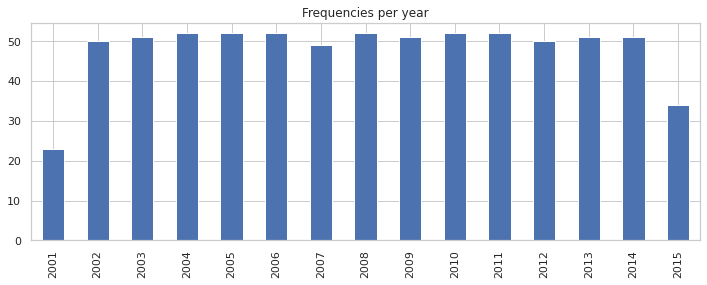

In [6]:
# Distribution per year

data.index.year.value_counts(sort=False).plot(kind='bar', figsize=(12, 4), 
                                              title="Frequencies per year")
plt.show()

# later weeks start missing earlier, this explains drop in 2015, but since also there are few observations for 2001
# we start with first test set == year 2004 and with train + evaluation set == 2001+2002+2003
    

In [7]:
# Just to check some missing weeks

c = data.loc[data.index.year == 2013, ["logret_78week", "logret_104week"]]
v = data.loc[data.index.year == 2012, ["logret_78week", "logret_104week"]]
print(c[~c["logret_104week"].isna()].count())
print(v[~v["logret_104week"].isna()].count())

logret_78week     33
logret_104week    33
dtype: int64
logret_78week     50
logret_104week    50
dtype: int64


### Variables

In [8]:
# Dependent (15)

Y = data.filter(like='logret')
Y.shape

(722, 15)

In [9]:
# Independent (24)

to_search = ['US', 'SENT', 'unc_bex', 'ra_bex', 'VIX', 'mcsi', r'slope\B', r'point0\b', 'convex']
X = data.loc[:, data.columns.to_series().str.contains("|".join(to_search))]

X.shape

(722, 24)

In [10]:
X.columns

Index(['point0', 'slopem2', 'slopep2', 'slopem5', 'slopep5', 'slopem10',
       'slopep10', 'convexp2', 'convexm2', 'USTBILLSECMARKET3MONTHDMIDDLERATE',
       'ra_bex_PAPER', 'unc_bex_PAPER', 'unc_bex_AnnualVolPercentage', 'VIX',
       'US1YR', 'US2YR', 'US3YR', 'US5YR', 'US10YR', 'mcsi', 'SENT', 'SENT1',
       'USInstitutional', 'USIndividual'],
      dtype='object')

### Study of dependent

In [12]:
Y.columns

Index(['logret_1week', 'logret_2week', 'logret_3week', 'logret_4week',
       'logret_5week', 'logret_6week', 'logret_7week', 'logret_8week',
       'logret_9week', 'logret_12week', 'logret_24week', 'logret_36week',
       'logret_52week', 'logret_78week', 'logret_104week'],
      dtype='object')

In [13]:
# just to check missing weeks
pr = pd.date_range("2013-08-21", periods = (104-78), freq="W")
pr

DatetimeIndex(['2013-08-25', '2013-09-01', '2013-09-08', '2013-09-15',
               '2013-09-22', '2013-09-29', '2013-10-06', '2013-10-13',
               '2013-10-20', '2013-10-27', '2013-11-03', '2013-11-10',
               '2013-11-17', '2013-11-24', '2013-12-01', '2013-12-08',
               '2013-12-15', '2013-12-22', '2013-12-29', '2014-01-05',
               '2014-01-12', '2014-01-19', '2014-01-26', '2014-02-02',
               '2014-02-09', '2014-02-16'],
              dtype='datetime64[ns]', freq='W-SUN')

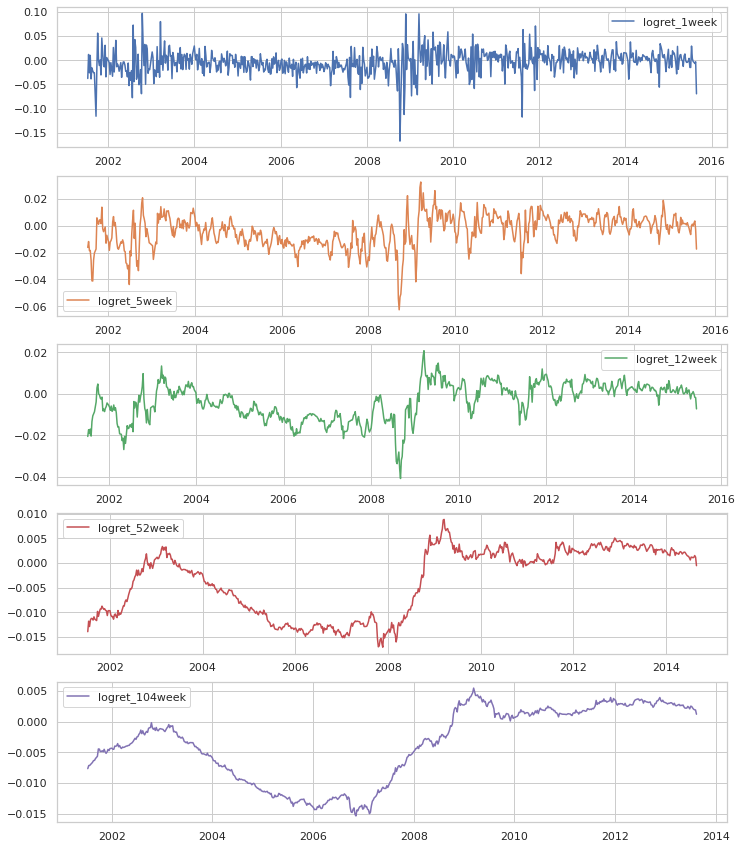

In [14]:
list_ = ['logret_1week', 'logret_5week', 'logret_12week', 'logret_52week', 'logret_104week']
Y.plot(y=list_, use_index=True, subplots=True, layout=(5, 1), figsize=(12, 15), legend=True, sharex=False, xlabel='')
plt.show()

In [15]:
Y.describe()

# all are centered very closely
# equity premium one week ahead has largest variance

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
count,722.000000,721.000000,720.000000,719.000000,718.000000,717.000000,716.000000,715.000000,714.000000,711.000000,699.000000,687.000000,671.000000,645.000000,619.000000
mean,-0.003861,-0.003792,-0.003776,-0.003759,-0.003753,-0.003741,-0.003731,-0.003726,-0.003717,-0.003662,-0.003623,-0.003636,-0.003630,-0.003583,-0.003637
std,0.024779,0.017463,0.014447,0.012828,0.011731,0.011061,0.010556,0.010047,0.009707,0.008823,0.007695,0.007171,0.006760,0.006338,0.006068
min,-0.167138,-0.124723,-0.091148,-0.072293,-0.062674,-0.058867,-0.053618,-0.049916,-0.042652,-0.040824,-0.026267,-0.019991,-0.017037,-0.016245,-0.015381
25%,-0.016587,-0.012827,-0.012101,-0.011293,-0.011485,-0.011044,-0.010710,-0.010354,-0.010456,-0.010162,-0.010117,-0.010914,-0.010598,-0.009794,-0.009455
50%,-0.003192,-0.003259,-0.002815,-0.002528,-0.002188,-0.002011,-0.002142,-0.002079,-0.001839,-0.002154,-0.001614,-0.001219,-0.000684,-0.001261,-0.002716
75%,0.009672,0.006845,0.005992,0.005043,0.004562,0.004168,0.003839,0.003801,0.003492,0.003104,0.002586,0.002565,0.002261,0.002283,0.002010
max,0.096931,0.066405,0.043501,0.038583,0.032691,0.029090,0.026806,0.029779,0.027702,0.020771,0.014194,0.011800,0.008820,0.005251,0.005469


AttributeError: 'Rectangle' object has no property 'c'

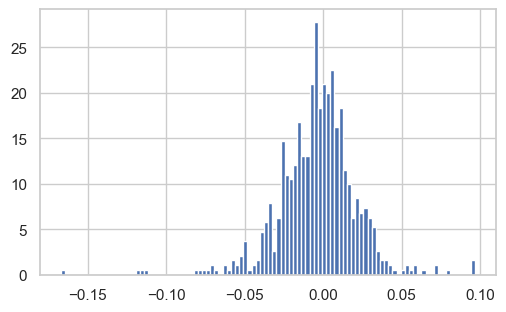

In [4]:
# PLOT OF DEPENDENT

plt.figure(figsize=(20, 20))
for k, col in enumerate(Y.columns):
    ax = plt.subplot(5, 3, k+1)
    n, bins, args = plt.hist(Y[col], bins=100, density = True, c="blue", label=f"{col}")
    ax.set_xlim([Y['logret_1week'].min(), Y['logret_1week'].max()])
    plt.legend(fontsize="large")
    
# outliers must be handled a problem for short span forecasts mainly

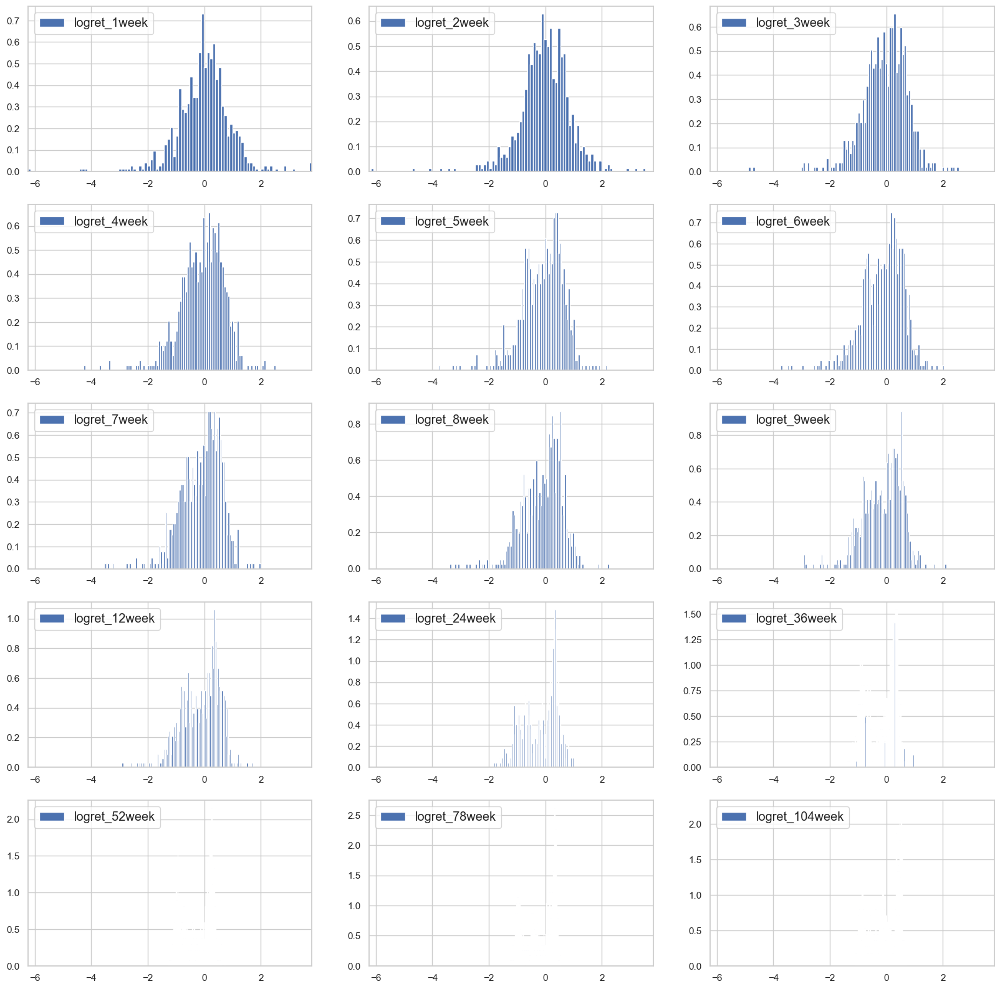

In [3]:
# Look at standardization with RobustScaler

X, Y = reinitialize()

scaler = RobustScaler()
Y_pr = pd.DataFrame(scaler.fit_transform(Y), columns=Y.columns)

plt.figure(figsize=(20, 20))
for k, col in enumerate(Y_pr.columns):
    ax = plt.subplot(5, 3, k+1)
    n, bins, args = plt.hist(Y_pr[col], bins=100, density = True, label=f"{col}")
    ax.set_xlim([Y_pr['logret_1week'].min(), Y_pr['logret_1week'].max()])
    plt.legend(fontsize="large")


In [18]:
# Not standardized

Y.describe()

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
count,722.000000,721.000000,720.000000,719.000000,718.000000,717.000000,716.000000,715.000000,714.000000,711.000000,699.000000,687.000000,671.000000,645.000000,619.000000
mean,-0.003861,-0.003792,-0.003776,-0.003759,-0.003753,-0.003741,-0.003731,-0.003726,-0.003717,-0.003662,-0.003623,-0.003636,-0.003630,-0.003583,-0.003637
std,0.024779,0.017463,0.014447,0.012828,0.011731,0.011061,0.010556,0.010047,0.009707,0.008823,0.007695,0.007171,0.006760,0.006338,0.006068
min,-0.167138,-0.124723,-0.091148,-0.072293,-0.062674,-0.058867,-0.053618,-0.049916,-0.042652,-0.040824,-0.026267,-0.019991,-0.017037,-0.016245,-0.015381
25%,-0.016587,-0.012827,-0.012101,-0.011293,-0.011485,-0.011044,-0.010710,-0.010354,-0.010456,-0.010162,-0.010117,-0.010914,-0.010598,-0.009794,-0.009455
50%,-0.003192,-0.003259,-0.002815,-0.002528,-0.002188,-0.002011,-0.002142,-0.002079,-0.001839,-0.002154,-0.001614,-0.001219,-0.000684,-0.001261,-0.002716
75%,0.009672,0.006845,0.005992,0.005043,0.004562,0.004168,0.003839,0.003801,0.003492,0.003104,0.002586,0.002565,0.002261,0.002283,0.002010
max,0.096931,0.066405,0.043501,0.038583,0.032691,0.029090,0.026806,0.029779,0.027702,0.020771,0.014194,0.011800,0.008820,0.005251,0.005469


In [19]:
# Standardized

pd.DataFrame(Y_pr).describe()

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
count,722.000000,721.000000,7.200000e+02,719.000000,7.180000e+02,717.000000,716.000000,715.000000,7.140000e+02,711.000000,699.000000,687.000000,671.000000,645.000000,619.000000
mean,-0.025478,-0.027071,-5.311015e-02,-0.075364,-9.753334e-02,-0.113729,-0.109237,-0.116390,-1.346763e-01,-0.113681,-0.158156,-0.179339,-0.229104,-0.192241,-0.080300
std,0.943622,0.887721,7.984536e-01,0.785241,7.310669e-01,0.727130,0.725532,0.709738,6.959373e-01,0.665076,0.605743,0.531990,0.525701,0.524777,0.529217
min,-6.243397,-6.174592,-4.882123e+00,-4.270642,-3.769393e+00,-3.737615,-3.537964,-3.379387,-2.926083e+00,-2.915058,-1.940709,-1.392681,-1.271726,-1.240670,-1.104680
25%,-0.510134,-0.486385,-5.132304e-01,-0.536529,-5.793512e-01,-0.593809,-0.588924,-0.584623,-6.178077e-01,-0.603664,-0.669358,-0.719250,-0.770974,-0.706513,-0.587777
50%,0.000000,0.000000,1.170938e-17,0.000000,-1.366095e-17,0.000000,0.000000,0.000000,7.806256e-18,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.489866,0.513615,4.867696e-01,0.463471,4.206488e-01,0.406191,0.411076,0.415377,3.821923e-01,0.396336,0.330642,0.280750,0.229026,0.293487,0.412223
max,3.812869,3.541331,2.559861e+00,2.516618,2.173606e+00,2.044474,1.989586,2.250591,2.117929e+00,1.728131,1.244442,0.965883,0.739051,0.539209,0.713932


In [20]:
print(Y.isna().sum()/float(len(Y))) # % of missing values 
Y[Y.isna().any(1)]

# start from 21-08-2013 (logret_104week starts missing)
# for logret 104 weeks=2 years) since end of sample is 26-08-2015

logret_1week      0.000000
logret_2week      0.001385
logret_3week      0.002770
logret_4week      0.004155
logret_5week      0.005540
logret_6week      0.006925
logret_7week      0.008310
logret_8week      0.009695
logret_9week      0.011080
logret_12week     0.015235
logret_24week     0.031856
logret_36week     0.048476
logret_52week     0.070637
logret_78week     0.106648
logret_104week    0.142659
dtype: float64


,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
DateStru,,,,,,,,,,,,,,,
2013-08-21,-0.025732,-0.015308,-0.006553,0.000462,0.004626,0.000650,0.000640,-0.002257,0.002244,0.003984,0.003024,0.002855,0.003151,0.002692,NaN
2013-08-28,-0.004884,0.003036,0.009193,0.012216,0.005926,0.005036,0.001096,0.005741,0.006680,0.006646,0.004305,0.003719,0.003650,0.002660,NaN
2013-09-04,0.010956,0.016232,0.017915,0.008629,0.007020,0.002093,0.007259,0.008126,0.008280,0.007001,0.004874,0.003844,0.003694,0.003088,NaN
2013-09-11,0.021508,0.021395,0.007853,0.006036,0.000321,0.006643,0.007721,0.007946,0.007496,0.007270,0.005051,0.003854,0.003539,0.002709,NaN
2013-09-18,0.021282,0.001026,0.000878,-0.004976,0.003669,0.005424,0.006008,0.005744,0.005797,0.004793,0.004023,0.003515,0.003093,0.002424,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-07-29,-0.002843,-0.003630,-0.004728,-0.004361,-0.017377,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-08-05,-0.004417,-0.005670,-0.004867,-0.021011,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-08-12,-0.006924,-0.005092,-0.026542,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
loc = Y.index.get_loc("2015-03-25")
Y.iloc[:loc-1].tail()

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
DateStru,,,,,,,,,,,,,,,
2015-02-11,0.013116,0.013998,0.011554,0.006837,-0.000185,0.004602,0.001285,0.001029,0.002095,0.002548,0.001387,NaN,NaN,NaN,NaN
2015-02-18,0.014881,0.010773,0.004744,-0.003510,0.002899,-0.000687,-0.000698,0.000718,0.001943,0.000386,0.000722,NaN,NaN,NaN,NaN
2015-02-25,0.006664,-0.000324,-0.009640,-0.000096,-0.003801,-0.003294,-0.001306,0.000326,0.000348,-0.000128,-0.000082,NaN,NaN,NaN,NaN
2015-03-04,-0.007312,-0.017792,-0.002350,-0.006417,-0.005286,-0.002634,-0.000580,-0.000441,-0.000454,0.000391,-0.000648,NaN,NaN,NaN,NaN
2015-03-11,-0.028273,0.000131,-0.006119,-0.004779,-0.001698,0.000542,0.000540,0.000403,-0.001067,0.000904,-0.000479,NaN,NaN,NaN,NaN


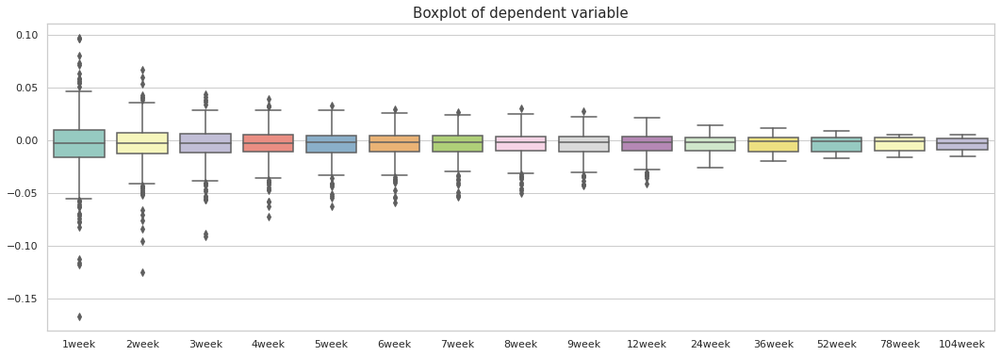

In [22]:
# BOXPLOT (NOT STANDARDIZED)


Y.columns = [re.search(r"\d+week\b", Y.columns[i]).group(0) for i in range(len(Y.columns))]
sns.set_theme(style="whitegrid") #provides a grid on the plot
fig, axes = plt.subplots(figsize=(18, 6)) # sets the size of the plot

axes = sns.boxplot(data=Y, palette="Set3")
axes.set_title(label='Boxplot of dependent variable', fontsize=15)
plt.show()


### Study of regressors

In [23]:
X.columns

Index(['point0', 'slopem2', 'slopep2', 'slopem5', 'slopep5', 'slopem10',
       'slopep10', 'convexp2', 'convexm2', 'T-Bill', 'ra_bex_PAPER',
       'unc_bex_PAPER', 'unc_bex_%', 'VIX', 'US1YR', 'US2YR', 'US3YR', 'US5YR',
       'US10YR', 'mcsi', 'SENT', 'SENT1', 'USInst', 'USInd'],
      dtype='object')

In [24]:
# Rename some long column names

X = X.rename(columns={"USTBILLSECMARKET3MONTHDMIDDLERATE": "T-Bill", 
                  "unc_bex_AnnualVolPercentage": "unc_bex_%", 
                  "USInstitutional": "USInst",
                  "USIndividual": "USInd"})

In [25]:
X.iloc[:, :11].describe()

,point0,slopem2,slopep2,slopem5,slopep5,slopem10,slopep10,convexp2,convexm2,T-Bill,ra_bex_PAPER
count,722.000000,722.000000,722.000000,722.000000,722.000000,722.000000,722.000000,722.000000,722.000000,722.000000,722.000000
mean,1.164695,0.062900,-0.023077,0.204041,0.001188,-0.037783,0.252094,-5.556284,-101.159193,1.361316,3.227341
std,0.321055,0.102247,0.097386,0.254300,0.305649,0.770859,0.797043,104.195030,126.690168,1.619591,1.401914
min,0.338620,-0.188760,-0.298972,-0.566734,-0.741338,-2.998946,-1.808802,-357.218037,-609.645778,0.000000,2.474124
25%,0.975092,-0.016726,-0.081229,0.017230,-0.175752,-0.505577,-0.407231,-68.737497,-180.978359,0.070000,2.669181
50%,1.175477,0.049646,-0.017161,0.198669,-0.019353,0.070462,0.460242,0.943757,-88.358532,0.880000,2.887669
75%,1.381030,0.137347,0.031432,0.360963,0.195341,0.587774,0.887136,54.737686,-10.058880,2.120000,3.266960
max,1.983051,0.331046,0.446860,1.039174,0.962582,1.427429,1.602112,346.992635,247.584275,5.040000,20.804639


In [26]:
X.iloc[:, 11:].describe()

,unc_bex_PAPER,unc_bex_%,VIX,US1YR,US2YR,US3YR,US5YR,US10YR,mcsi,SENT,SENT1,USInst,USInd
count,722.000000,722.000000,722.000000,722.000000,722.000000,722.000000,722.000000,722.000000,722.000000,722.000000,722.000000,722.000000,722.000000
mean,0.000044,2.243985,0.203363,1.600771,1.886890,2.176917,2.715416,3.719010,81.112327,0.030662,-0.111774,79.399003,79.948643
std,0.000024,0.527057,0.092352,1.631344,1.537821,1.447630,1.293575,1.084131,11.090474,0.536824,0.525802,4.930768,7.010529
min,0.000018,1.465747,0.098900,0.059551,0.192884,0.310994,0.592017,1.443801,55.300000,-0.893943,-0.941696,68.840000,61.940000
25%,0.000031,1.913577,0.138200,0.204167,0.529741,0.919946,1.585194,2.769046,73.600000,-0.299494,-0.364586,76.227500,75.000000
50%,0.000038,2.143596,0.178600,1.117477,1.472794,1.856566,2.631532,4.022746,82.500000,0.034221,-0.157705,79.270000,78.805000
75%,0.000051,2.473923,0.235800,2.475760,3.016991,3.393597,3.867283,4.564134,90.700000,0.270164,0.036134,81.620000,85.500000
max,0.000189,4.763547,0.742600,5.264348,5.216013,5.181133,5.159331,5.804662,103.800000,2.339884,2.490936,92.590000,95.620000


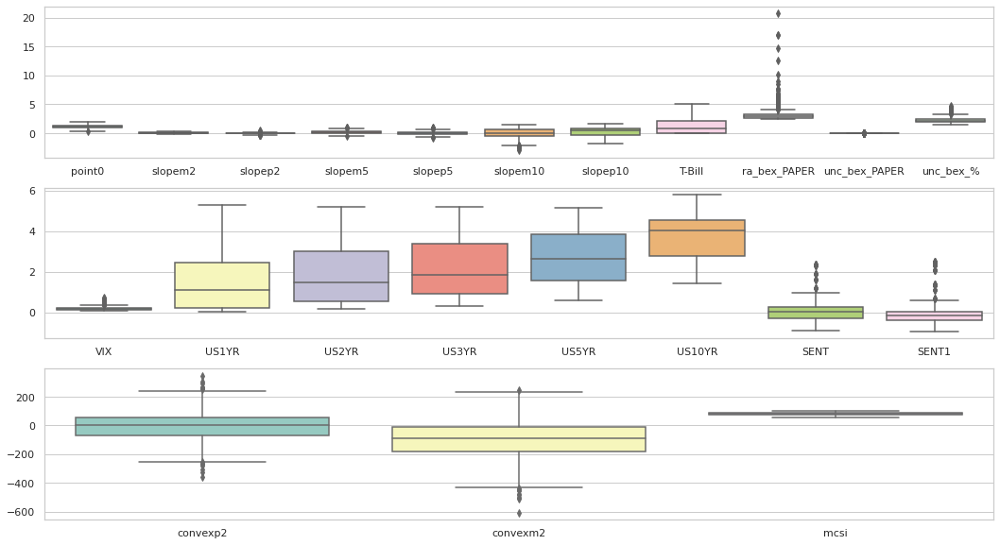

In [27]:
# BOXPLOT NOT STANDARDIZED

sep = ['convexp2', 'convexm2', 'mcsi', 'USInstitutional', 'USIndividual']

X, Y = reinitialize()

fig = plt.figure(figsize=(18, 10))

X_f = X.loc[:, [x for x in X.columns if x not in sep]]
X_sep = X.loc[:, [x for x in X.columns if x in sep]]

for k in [0, 1, 2]:
    ax = plt.subplot(3, 1, k+1)
    a = list(range(k*11, 11 + k*8))
    if k==2:
        ax = sns.boxplot(data=X_sep, palette="Set3")
    else:
        ax = sns.boxplot(data=X_f.iloc[:, a], palette="Set3")


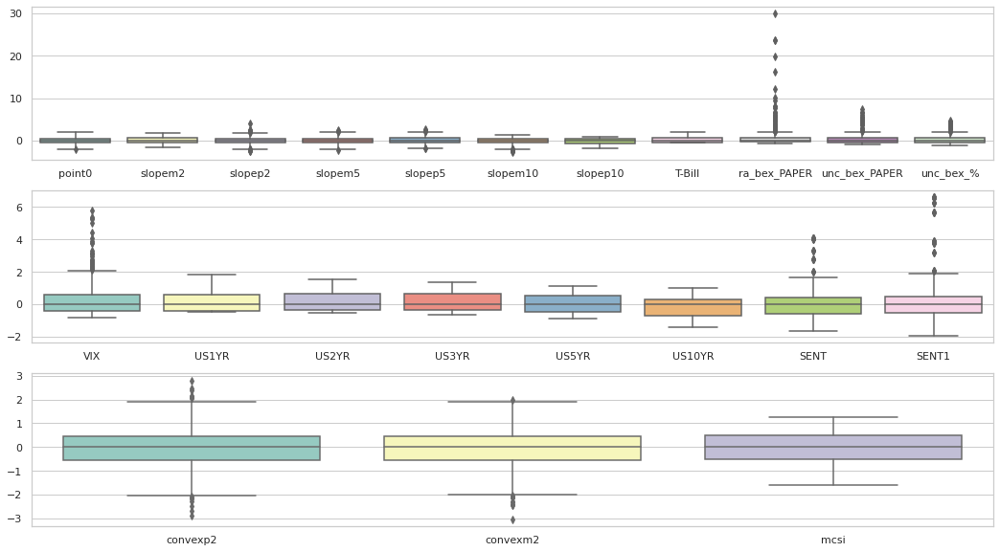

In [28]:
# BOXPLOT STANDARDIZED

fig = plt.figure(figsize=(18, 10))
sns.set_theme(style="whitegrid") #provides a grid on the plot

X_s = pd.DataFrame(data=RobustScaler().fit_transform(X), columns=X.columns, index=X.index)
X_f = X_s.loc[:, [x for x in X.columns if x not in sep]]
X_sep = X_s.loc[:, [x for x in X.columns if x in sep]]

for k in [0, 1, 2]:
    ax = plt.subplot(3, 1, k+1)
    a = list(range(k*11, 11 + k*8))
    if k==2:
        ax = sns.boxplot(data=X_sep, palette="Set3")
    else:
        ax = sns.boxplot(data=X_f.iloc[:, a], palette="Set3")


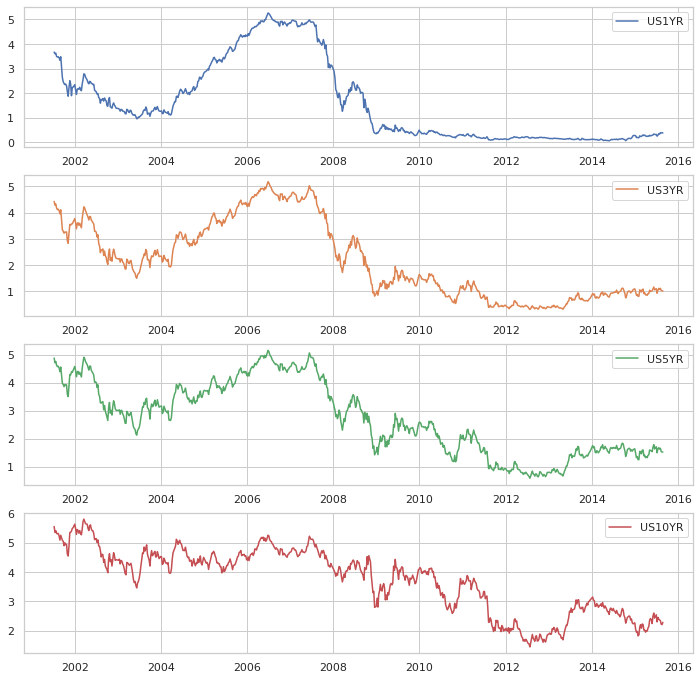

In [29]:
# US TREASURY RATES

# evolution with time

list_ = ['US1YR', 'US3YR', 'US5YR', 'US10YR']
X.plot(y=list_, use_index=True, subplots=True, layout=(5, 1), figsize=(18, 15), legend=True, sharex=False, xlabel='')
plt.show()

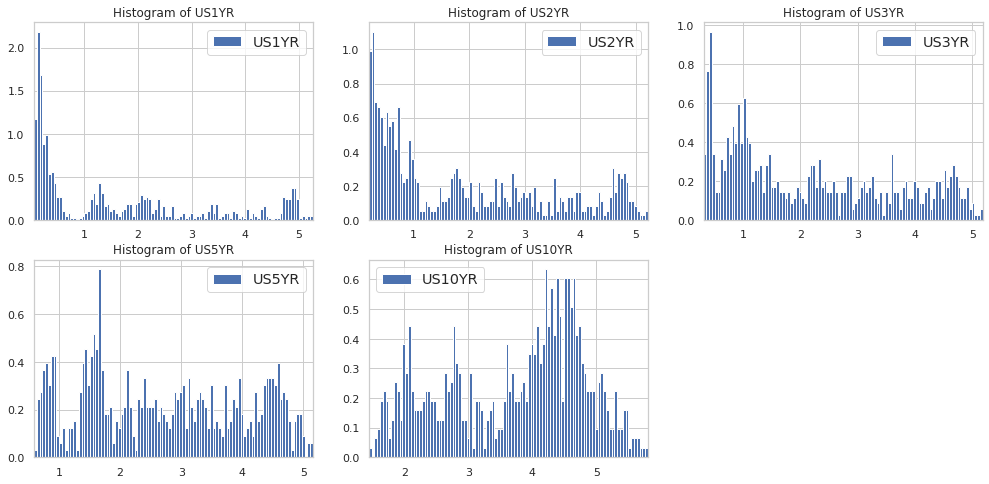

In [30]:
# Histogram of values

list_ = ['US1YR', 'US2YR', 'US3YR', 'US5YR', 'US10YR']
plt.figure(figsize=(17, 8))

for k, col in enumerate(list_):
    ax = plt.subplot(2, 3, k+1)
    n, bins, args = plt.hist(X[col], bins=100, density = True, label=f"{col}")
    ax.set_xlim([X[col].min(), X[col].max()])
    ax.set_title(f'Histogram of {col}')
    plt.legend(fontsize="large")
    
# after graphical comparison, StandardScaler + MinMax((0, 1)) can be useful

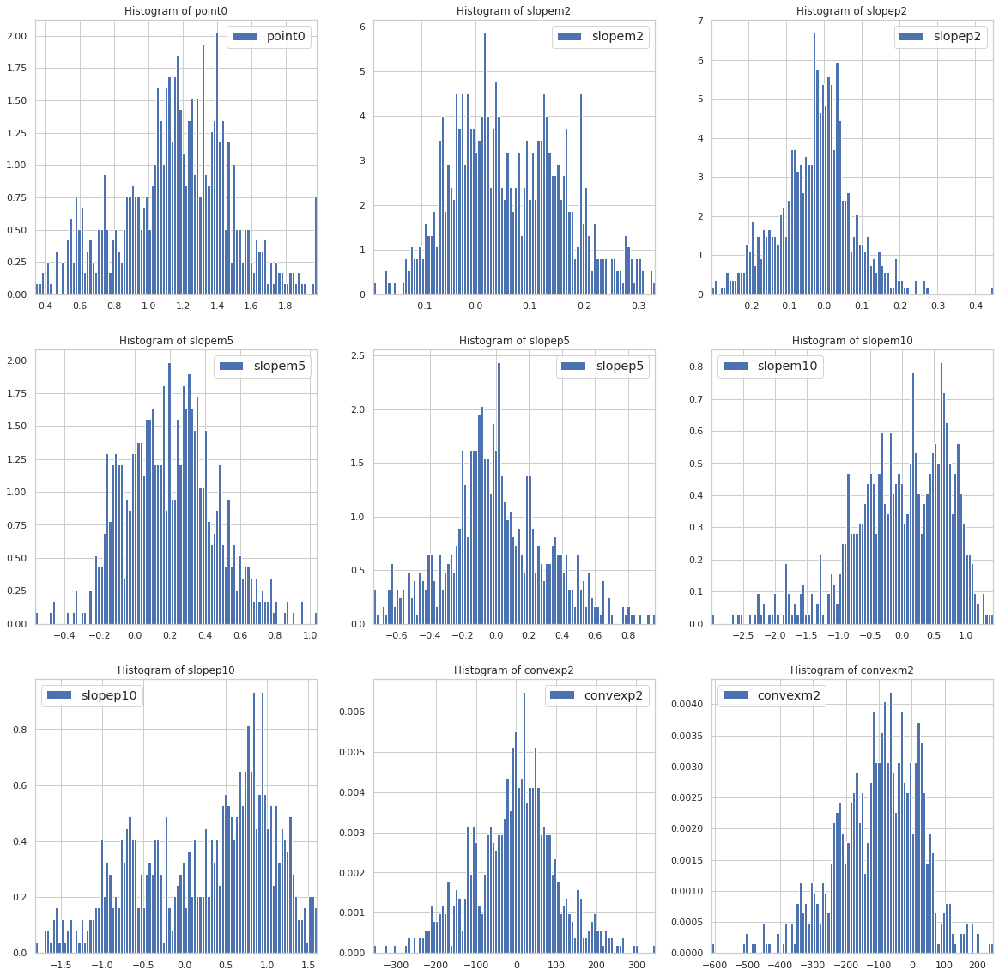

In [31]:
# Pricing Kernel variables

forms = ['point0', 'slopem2', 'slopep2', 'slopem5', 'slopep5', 'slopem10',
       'slopep10', 'convexp2', 'convexm2']

plt.figure(figsize=(20, 20))

for k, col in enumerate(forms):
    ax = plt.subplot(3, 3, k+1)
    n, bins, args = plt.hist(X[col], bins=100, density = True, label=f"{col}")
    ax.set_xlim([X[col].min(), X[col].max()])
    ax.set_title(f'Histogram of {col}')
    plt.legend(fontsize="large")
    
# could use standardization + scale are very diverse (especially convexp)

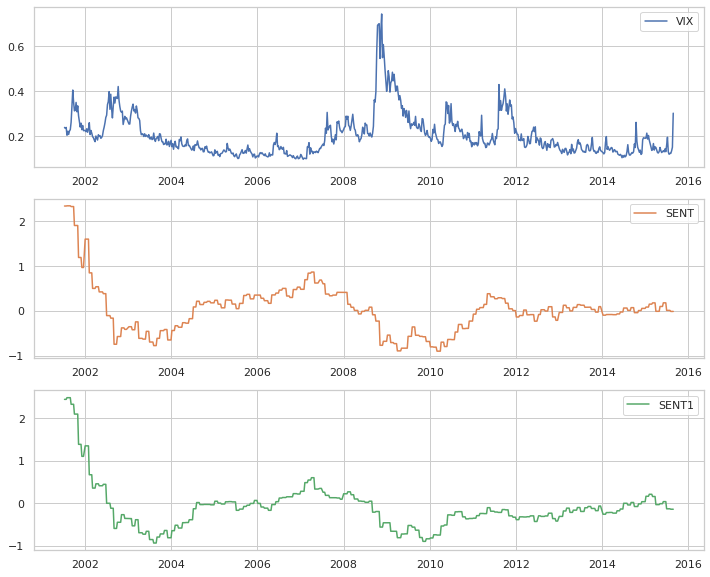

In [32]:
# VIX & SENTIMENT

# evolution with time

sentiment = ['VIX', 'SENT', 'SENT1']
X.plot(y=sentiment, use_index=True, subplots=True, layout=(3, 1), figsize=(18, 10), legend=True, sharex=False, xlabel='')
plt.show()

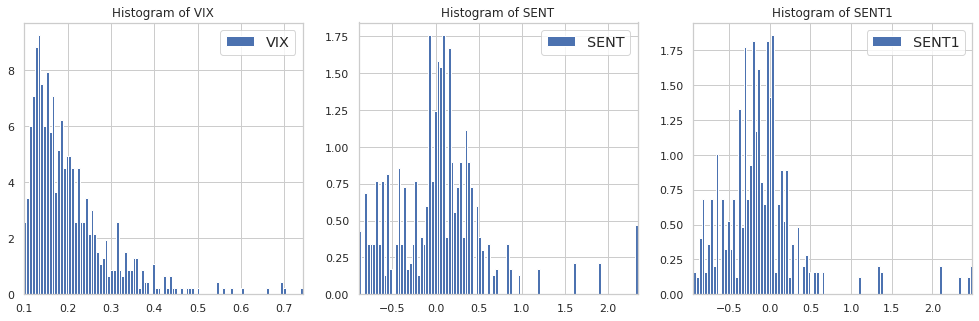

In [33]:
# histogram of values

plt.figure(figsize=(17, 5))

for k, col in enumerate(sentiment):
    ax = plt.subplot(1, 3, k+1)
    n, bins, args = plt.hist(X[col], bins=100, density = True, label=f"{col}")
    ax.set_xlim([X[col].min(), X[col].max()])
    ax.set_title(f'Histogram of {col}')
    plt.legend(fontsize="large")

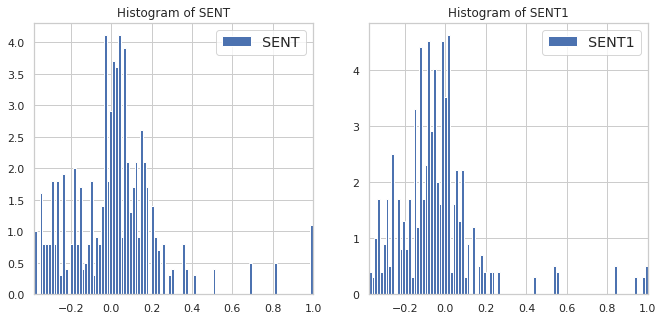

In [34]:
# for VIX robust
# for Sentiment variables after some attempts -> usefulness of MaxAbs standardization

sentiment = ['SENT', 'SENT1']

robust = RobustScaler()
abs_ = MaxAbsScaler()

X_pr, Y = reinitialize()
X_pr.loc[:, sentiment] = abs_.fit_transform(X_pr.loc[:, sentiment])


# Plot of Sent standardized with MaxAbs

plt.figure(figsize=(18, 5))

for k, col in enumerate(sentiment):
    ax = plt.subplot(1, 3, k+1)
    n, bins, args = plt.hist(X_pr[col], bins=100, density = True, label=f"{col}")
    ax.set_xlim([X_pr[col].min(), X_pr[col].max()])
    ax.set_title(f'Histogram of {col}')
    plt.legend(fontsize="large")

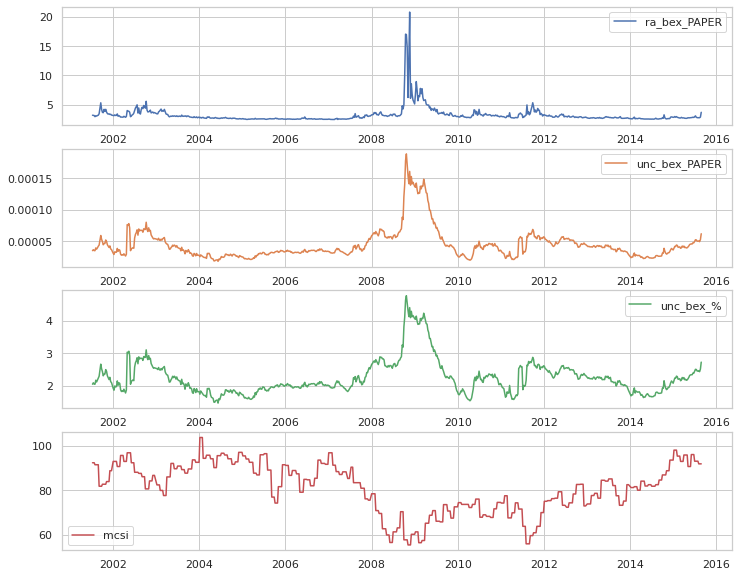

In [35]:
# RISK AVERSION VARIABLES

# evolution with time

aversion = ['ra_bex_PAPER', 'unc_bex_PAPER', 'unc_bex_%', 'mcsi']
X.plot(y=aversion, use_index=True, subplots=True, layout=(4, 1), figsize=(18, 10), legend=True, sharex=False, xlabel='')
plt.show()

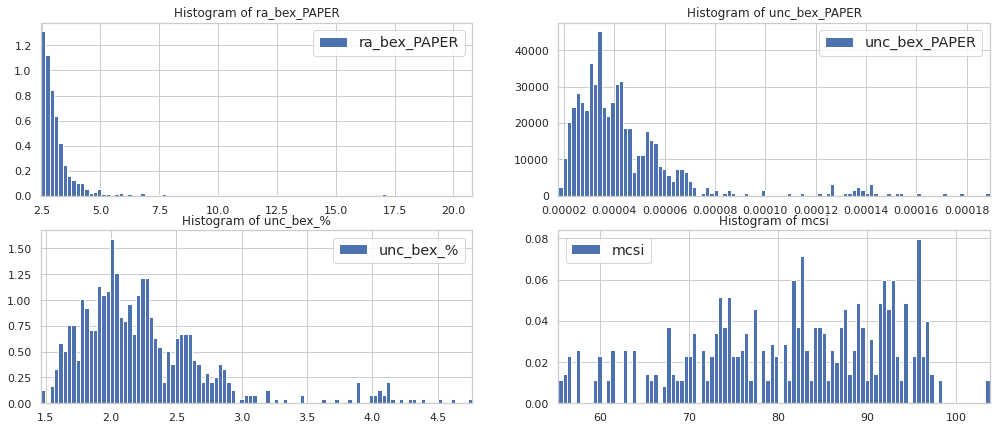

In [36]:
# histogram of values

plt.figure(figsize=(18, 10))

for k, col in enumerate(aversion):
    ax = plt.subplot(2, 2, k+1)
    n, bins, args = plt.hist(X[col], bins=100, density = True, label=f"{col}")
    ax.set_xlim([X[col].min(), X[col].max()])
    ax.set_title(f'Histogram of {col}')
    plt.legend(fontsize="large")
    
# ra_bex_PAPER with some outliers
# all RobustScaler in general

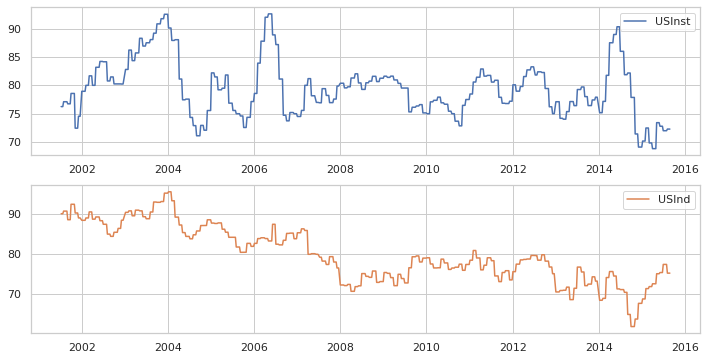

In [37]:
# US

# evolution with time

US = ['USInst', 'USInd']
X.plot(y=US, use_index=True, subplots=True, layout=(2, 1), figsize=(12, 6), legend=True, sharex=False, xlabel='')
plt.show()

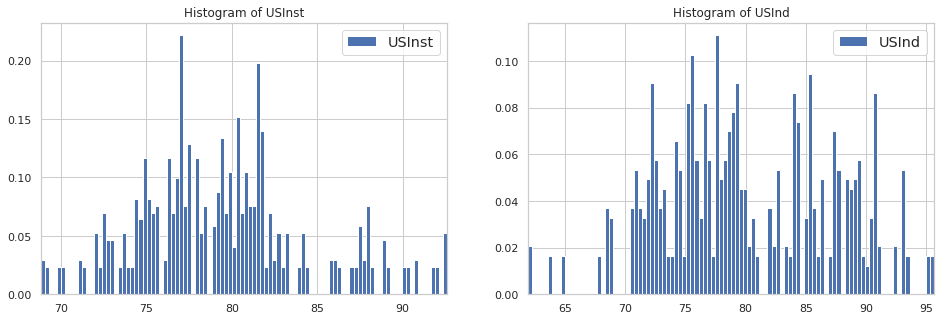

In [38]:
# Histogram of values

plt.figure(figsize=(16, 5))

for k, col in enumerate(US):
    ax = plt.subplot(1, 2, k+1)
    n, bins, args = plt.hist(X[col], bins=100, density = True, label=f"{col}")
    ax.set_xlim([X[col].min(), X[col].max()])
    ax.set_title(f'Histogram of {col}')
    plt.legend(fontsize="large")
    
# necessary Standardization for scale

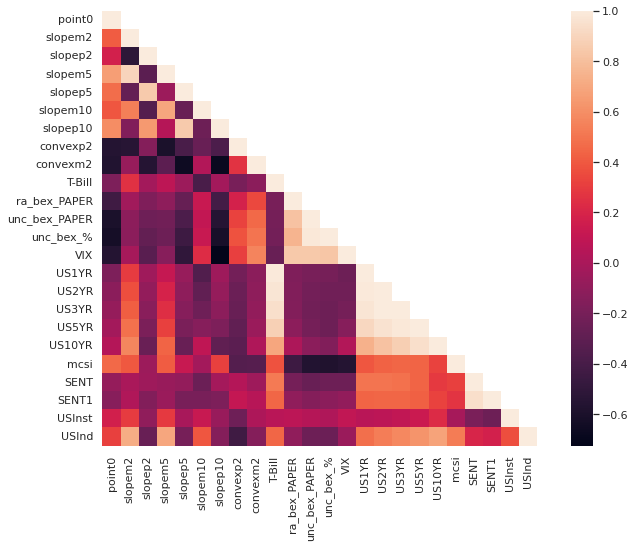

In [39]:
# CORRELATION BETWEEN VARIABLES

mask = np.zeros_like(X.corr())
mask[np.triu_indices_from(mask, k=1)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(12, 8))
    ax = sns.heatmap(X.corr(),mask=mask,square=True,fmt="d")
    
# correlation between features of Pricing Kernels (the two convex in particular, with almost all the other ones)
# correlation btw slope variables: slopep2 and slopem2 negatively correlated, slopep10 and slopep5 positively
# point0 also correlated with the two convex and with Risk aversion mostly (VIX, ra_bex, unc_bex)

# T-bill highly correlated with all US Treasury Rates -> can think of PCA of entire group
# also mcsi correlated (negatively) with Risk Aversion measures (unc_bex, VIX)

### Evaluation

Throughout the model implementations I used normal $R^2$ as metric since it seems that the demeaned $R^2$ is highly susceptible to standardization of the dependent
and it did not seem to me a 'robust' metric to evaluate, as I tried to work a lot on the standardizations (with mild results)

Working on the standardizations, I used the normal $R^2$ but for every function in evaluation there is a parameter 'score' (or 'score_') that can be set to True and both the models and the metric collected will be Demeaned R2.

The Test set is chosen to be of $52$ weeks, which roll recursively (given the fixed length) as the training set expands at every step. 
For each given recursion, the test set is the most recent year. The evaluation steps are performed through TimeSeriesSplit (and not CV) to preserve the ordering of data.

So all the results already computed on this notebook are with normal $R^2$, if you want to re-print (and re-run) everything with the Demeaned $R^2$ you can set this variable beneath to True


In [ ]:
score_off = False

# if all the results are wanted with the de-meaned R^2, you can set the above variable to True

### Train, validation, test set

In [40]:
# dictionary with last observation available for test set
upp_bound = {x: Y[Y[x].isna()].index[0] - pd.to_timedelta(1, unit='w') for x in Y.columns[1:]} 
upp_bound["logret_1week"] = pd.to_datetime("2015-12-12")

# dictionary with first observation available for test set
interm_bound = {x: Y[Y[x].isna()].index[0] - pd.to_timedelta(53, unit='w') for x in Y.columns[1:]}

# dictionary with first observation available for evaluation set
#low_bound = {x: Y[Y[x].isna()].index[0] - pd.to_timedelta(53*2, unit='w') for x in Y.columns[1:]}
        

In [41]:
# to create subset of variables

pricing_kernel = ['point0', 'slopem2', 'slopep2', 'slopem5', 'slopep5', 'slopem10', 'slopep10', 'convexp2', 'convexm2']
except_kernel = [x for x in X.columns.to_list() if x not in pricing_kernel]  # only small gains if not including pricing kernel in standardization

## Linear Regression

### Using all variables (no standardization)

In [42]:
X, Y = reinitialize()
pure_linear = LinearRegression()

agg_purel, scores_purel, models_purel, preds_purel = train_recursive(pure_linear, X, Y, score=score_off)


Execution time for recursive training is  0.0  h : 0.0  m : 0.72  s


In [43]:
# RANKING OF AGGREGATE SCORES (OVER ALL RECURSIONS OF TRAINING AND TEST SET)

sort_aggregate(agg_purel, scores_purel)

# aggregate since all the scores are averaged over the years

,Ranked models,Agg Scores,,One to last,Last year
0,logret_8week,-2.341854,,-0.771355,-1.057306
1,logret_7week,-2.450121,,-0.469974,-0.788650
2,logret_6week,-2.786221,,-0.349747,-0.606227
3,logret_5week,-3.283694,,-0.216439,-0.434643
4,logret_2week,-3.414357,,-0.140761,-0.121350
5,logret_9week,-3.575608,,-1.227518,-1.324603
6,logret_12week,-3.584158,,-3.543393,-3.476111
7,logret_24week,-4.431944,,-1.872351,-2.918583
8,logret_78week,-5.917556,,-8.129787,-7.652211
9,logret_36week,-5.999126,,-24.646816,-2.028862


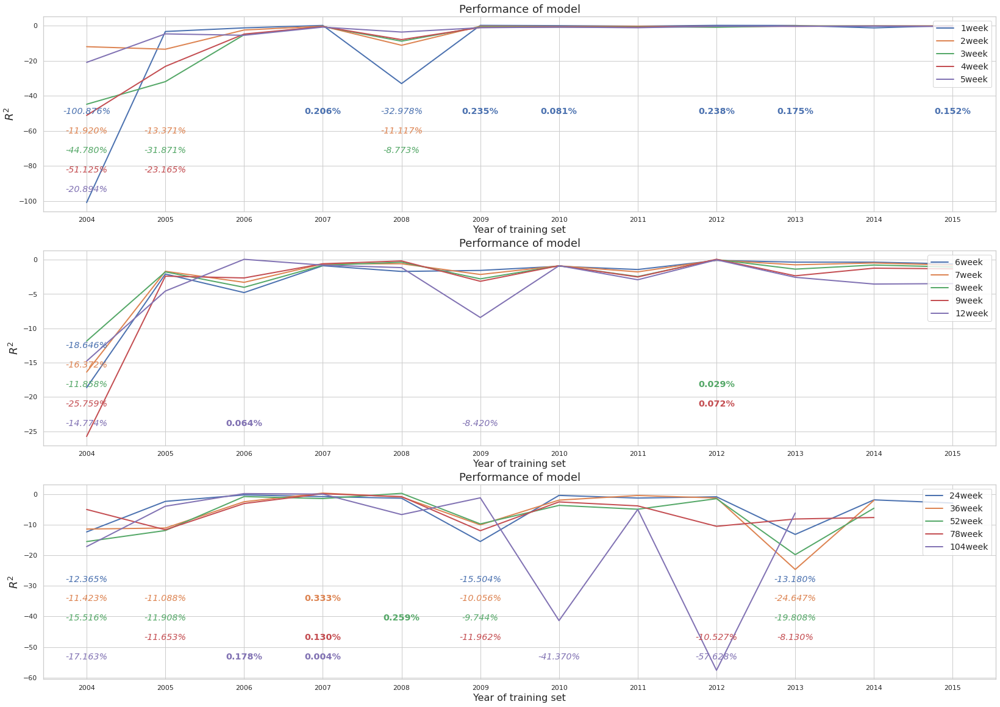

In [44]:
# VISUAL OF INDIVIDUAL SCORES FOR EACH RECURSION

graph_comparison(scores_purel)

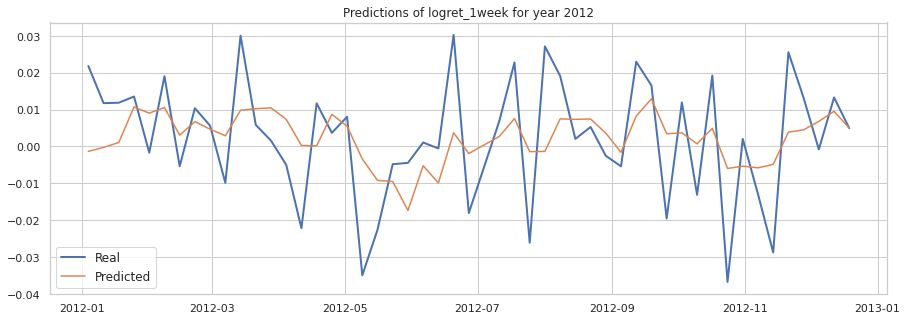

In [45]:
compare_preds(Y, preds_purel, 'logret_1week', 2012)

In [46]:
# STUDY OF COEFFICIENTS

# we rank them by importance (magnitude of coefficients) and take the subset in common from all 15 most important variables
# for each lagged week

sto = sort_coefficient(models_purel)
sto.head(10)

# 10 most strong predictors for every lagged week (without standardization)

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,unc_bex_PAPER,unc_bex_PAPER,US2YR,US2YR,US2YR,VIX,US2YR,VIX,unc_bex_PAPER,unc_bex_PAPER,unc_bex_PAPER,unc_bex_PAPER,unc_bex_PAPER,US2YR,unc_bex_PAPER
1,US2YR,US2YR,slopem2,T-Bill,VIX,US3YR,VIX,US2YR,VIX,US3YR,US2YR,US5YR,US3YR,US5YR,US2YR
2,US5YR,slopem2,T-Bill,US5YR,T-Bill,T-Bill,T-Bill,T-Bill,US3YR,VIX,US5YR,VIX,VIX,VIX,US5YR
3,point0,point0,unc_bex_%,slopem2,unc_bex_%,unc_bex_%,slopem5,slopem5,T-Bill,T-Bill,VIX,US2YR,US1YR,point0,VIX
4,T-Bill,T-Bill,US10YR,unc_bex_%,slopem5,US2YR,unc_bex_%,slopep10,slopem2,slopem2,T-Bill,point0,point0,unc_bex_%,point0
5,slopep5,US10YR,point0,slopep2,slopep10,slopem2,slopep10,slopem2,US2YR,slopep10,slopem5,T-Bill,slopep10,T-Bill,T-Bill
6,SENT1,slopep10,slopep10,slopep10,slopem2,slopep10,US5YR,unc_bex_%,slopem5,slopem5,point0,slopep10,USInd,slopem10,slopem10
7,USInd,slopem5,slopep2,slopem5,slopep2,slopem5,point0,US5YR,slopep10,point0,slopep10,slopem10,convexp2,slopep10,SENT1
8,slopep10,SENT1,slopem5,point0,point0,point0,slopem2,point0,point0,USInd,slopem2,USInd,convexm2,ra_bex_PAPER,USInst
9,slopem10,USInd,USInd,USInd,USInd,slopep2,USInd,USInd,USInd,SENT,USInd,mcsi,USInst,convexp2,convexp2


In [47]:
# Regressors in common to the 15 strongest predictors of excess returns for each lagged week

c = set(X.columns)
for col in sto.columns:
    c = c.intersection(sto[col].head(15).unique())
c


{'T-Bill', 'USInd', 'convexm2', 'convexp2', 'mcsi', 'point0'}

### Using all variables (with standardization)

In [48]:
# 1.
# USING ROBUST SCALER FOR ALL (ALSO DEPENDENT)

X, Y = reinitialize()
standard_linear = LinearRegression()

# scalers
scal_x = RobustScaler()
scal_y = RobustScaler()

scaler = {scal_x: X.columns.to_list(), scal_y: 0}
agg_standl, scores_standl, models_standl, preds_standl = train_recursive(standard_linear, X, Y, scal=scaler, score=score_off)

Execution time for recursive training is  0.0  h : 0.0  m : 7.24  s


In [49]:
# SCORES AT AGGREGATE LEVEL

sort_aggregate(agg_standl, scores_standl)

# for R2 not-demeaned ->
# later lags become all positive (except 24 weeks), big increase for 2 years
# all other actually becoming a bit worse
# big increase in R2 comes from standardizing dependent variables (almost all)

# for normal R2 ->
# almost everything is explained by standardization of regressors and not dependent

,Ranked models,Agg Scores,,One to last,Last year
0,logret_8week,-2.340119,,-0.771355,-1.036486
1,logret_7week,-2.441000,,-0.469974,-0.679196
2,logret_6week,-2.774641,,-0.349747,-0.467258
3,logret_5week,-3.268973,,-0.216439,-0.257987
4,logret_2week,-3.414500,,-0.140761,-0.123064
5,logret_9week,-3.586093,,-1.227518,-1.450420
6,logret_12week,-3.587799,,-3.543393,-3.519800
7,logret_24week,-4.474209,,-1.872351,-3.425768
8,logret_78week,-5.920479,,-8.129787,-7.684367
9,logret_36week,-5.999126,,-24.646816,-2.028862


In [ ]:
graph_comparison(scores_standl)

-> for demeaned $R^2$. \
RobustScaler works quite well (especially later lags, 78 104 52 36)
StandardScaler works much worse (only for 104 equivalent to Robust, all others much worse and 36 becomes negative)
also MaxAbs does not work very well
MinMaxScaler((0, 1)) on dependent actually works very well (much better than MinMaxScaler((-1, 1)), especially
on more recent lags (8 7 9 6 12 5 24 2 4 3 up to 52 78 all >0, then 104 negative) \ 
!!! big increase only due to the type of scoring though (with normal R2 not seen) very small changes in general if change on X variables !!!


-> for normal $R^2$. \
StandardScaler on both helps (almost everything due to scaling on X, so results before are due to nature of computation of R2)
RobustScaler almost equivalent (the gain in R2)
also MinMax on X same 

In [51]:
# 2. 
# USING PROPOSAL OF SCALERS SPECIFIC TO VARIABLES (based on DataViz)

# excluding PK and Dependent

X, Y = reinitialize()

scal_y = RobustScaler()  # columns of Y

scal_var = RobustScaler()
#var = pric_kernel + ['mcsi', 'VIX', 'USInst', 'USInd']
var = ['mcsi', 'VIX', 'USInst', 'USInd']
ra = X.columns[X.columns.str.contains(r'\Bbex\B')].to_list()   #['ra_bex_PAPER', 'unc_bex_PAPER', 'unc_bex_%']

scal_sent = MaxAbsScaler()
sent = ['SENT', 'SENT1']

scal_us1 = StandardScaler()
us = X.columns[X.columns.str.contains(r'YR\b')].to_list()  #['US1YR', 'US2YR', 'US3YR', 'US5YR', 'US10YR', 'T-Bill']
us.append('T-Bill')

propos = {scal_var: var + ra, scal_sent: sent, scal_us1: us}
# scal_y: 0, scal_us1: us, scal_us2: us, scal_ra1: ra, scal_ra2: ra

agg_standp, scores_standp, models_standp, preds_standp = train_recursive(LinearRegression(), X, Y, scal=propos, score=score_off)

# !!! slightly worse if standardizing also PK with RobustScaler


Execution time for recursive training is  0.0  h : 0.0  m : 3.96  s


In [52]:
# SCORES AT AGGREGATE LEVEL

sort_aggregate(agg_standp, scores_standp)

# slighly better, standardization on predictors seems to have little difference

# -> with Normal R2 
# worse than RobustScaler on all X.columns alone
# slightly better if all Robust except MaxAbs for sent as suggested and StandardScaler for USYR and T-Bill
# (slightly worse if MaxAbs on bex variable)

# -> with Demeaned R2
# instead if using alternative definition of R2 would use MinMax on X

# !! if only Kernels without standardisation 1 2 3 4 weeks are much better (all > -1) !!
# much better than if only macro_variables

,Ranked models,Agg Scores,,One to last,Last year
0,logret_8week,-2.340118,,-0.771355,-1.036470
1,logret_7week,-2.440998,,-0.469974,-0.679179
2,logret_6week,-2.774639,,-0.349747,-0.467240
3,logret_5week,-3.268972,,-0.216439,-0.257972
4,logret_2week,-3.414500,,-0.140761,-0.123061
5,logret_9week,-3.586089,,-1.227518,-1.450368
6,logret_12week,-3.587788,,-3.543393,-3.519665
7,logret_24week,-4.474200,,-1.872351,-3.425655
8,logret_78week,-5.920482,,-8.129787,-7.684393
9,logret_36week,-5.999126,,-24.646816,-2.028862


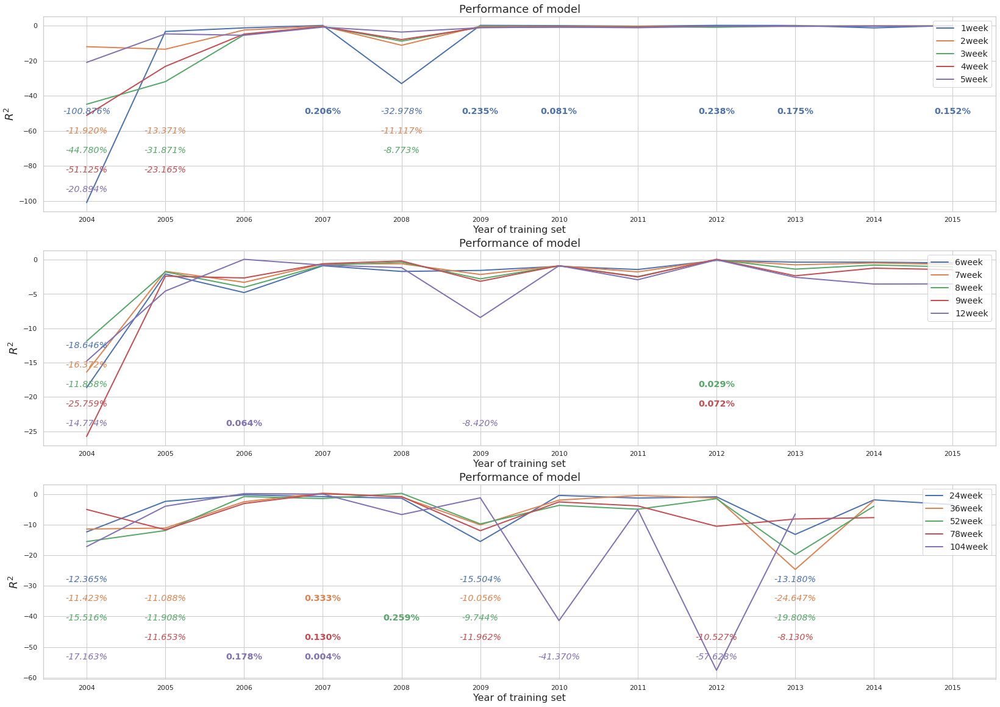

In [53]:
# VISUAL COMPARISON OF INDIVIDUAL SCORES

graph_comparison(scores_standp)

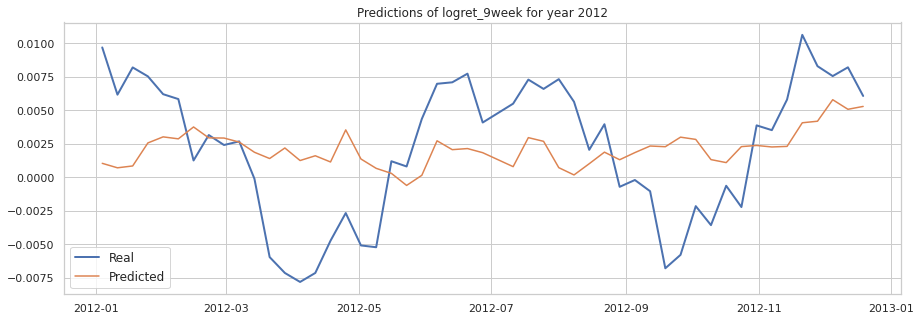

In [54]:
compare_preds(Y, preds_standp, 'logret_9week', y=2012)

In [55]:
# IMPORTANCE OF REGRESSORS

standp = sort_coefficient(models_standp)
standp.head(10)

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,US2YR,US2YR,US2YR,US2YR,US2YR,US3YR,US2YR,US2YR,US3YR,US3YR,US2YR,US2YR,US3YR,US2YR,US2YR
1,US5YR,T-Bill,T-Bill,T-Bill,T-Bill,T-Bill,T-Bill,T-Bill,T-Bill,T-Bill,US5YR,US5YR,US1YR,US5YR,US5YR
2,unc_bex_PAPER,slopem2,slopem2,US5YR,slopem2,slopem2,slopem5,slopem5,US2YR,slopem2,T-Bill,point0,point0,point0,point0
3,point0,point0,US10YR,slopem2,slopem5,slopep10,slopep10,slopem2,slopem2,slopep10,slopem5,unc_bex_PAPER,VIX,T-Bill,SENT1
4,SENT1,unc_bex_%,point0,slopep2,slopep10,slopem5,USInd,slopep10,slopem5,VIX,VIX,VIX,slopep10,slopem10,T-Bill
5,T-Bill,US10YR,slopep10,slopep10,USInd,USInd,slopem2,VIX,slopep10,USInd,slopep10,T-Bill,unc_bex_%,unc_bex_%,VIX
6,slopep5,slopep10,slopep2,point0,slopep2,point0,VIX,USInd,VIX,slopem5,USInd,USInd,USInd,VIX,slopem10
7,USInd,USInd,USInd,slopem5,point0,VIX,point0,point0,USInd,point0,point0,slopep10,unc_bex_PAPER,convexp2,USInst
8,slopep10,slopem5,unc_bex_%,USInd,unc_bex_%,unc_bex_%,convexm2,convexm2,point0,SENT,mcsi,mcsi,convexp2,unc_bex_PAPER,unc_bex_%
9,slopem10,SENT1,slopem5,unc_bex_%,VIX,slopep2,unc_bex_PAPER,unc_bex_PAPER,convexm2,convexp2,unc_bex_%,slopem10,convexm2,convexm2,convexp2


In [56]:
# Most important regressors in common to top15 ranking for each dependent variable

d = set(X.columns)
for col in standp.columns:
    d = d.intersection(standp[col].head(15).unique())
d

# after Standardization the best variables to keep (those bigger in magnitude in common to all
# top15 regressor coefficients) are 
# {'convexm2', 'convexp2', 'point0', 'unc_bex_PAPER'}

# (and not anymore {"T-Bill", "USInd", "convexm2", "convexp2", "mcsi", "point0"}

{'convexm2', 'convexp2', 'point0', 'unc_bex_PAPER'}

In [57]:
# 3. 
# USING PROPOSAL OF SCALERS SPECIFIC TO VARIABLES 

# excluding PK and Equity Premium BUT including Convexity

X, Y = reinitialize()

scal_y = RobustScaler()  # columns of Y

scal_var = RobustScaler()
#var = pric_kernel + ['mcsi', 'VIX', 'USInst', 'USInd']
var = ['mcsi', 'VIX', 'USInst', 'USInd'] + ['convexm2', 'convexp2']
ra = X.columns[X.columns.str.contains(r'\Bbex\B')].to_list()   #['ra_bex_PAPER', 'unc_bex_PAPER', 'unc_bex_%']

scal_sent = MaxAbsScaler()
sent = ['SENT', 'SENT1']

scal_us1 = StandardScaler()
scal_us2 = MinMaxScaler()
us = X.columns[X.columns.str.contains(r'YR\b')].to_list()  #['US1YR', 'US2YR', 'US3YR', 'US5YR', 'US10YR', 'T-Bill']
us.append('T-Bill')

propos = {scal_var: var + ra, scal_sent: sent, scal_us1: us}
# scal_y: 0, scal_us1: us, scal_us2: us, scal_ra1: ra, scal_ra2: ra

agg_st, scores_st, models_st, preds_st = train_recursive(LinearRegression(), X, Y, scal=propos, score=score_off)

# !!! slightly worse if standardizing also PK with RobustScaler !!!


Execution time for recursive training is  0.0  h : 0.0  m : 4.49  s


In [58]:
sort_aggregate(agg_st, scores_st)

,Ranked models,Agg Scores,,One to last,Last year
0,logret_8week,-2.340118,,-0.771355,-1.036470
1,logret_7week,-2.440998,,-0.469974,-0.679179
2,logret_6week,-2.774639,,-0.349747,-0.467240
3,logret_5week,-3.268972,,-0.216439,-0.257971
4,logret_2week,-3.414500,,-0.140761,-0.123062
5,logret_9week,-3.586089,,-1.227518,-1.450368
6,logret_12week,-3.587787,,-3.543393,-3.519657
7,logret_24week,-4.474200,,-1.872351,-3.425658
8,logret_78week,-5.920486,,-8.129787,-7.684437
9,logret_36week,-5.999126,,-24.646816,-2.028862


In [ ]:
graph_comparison(scores_st)

In [59]:
st = sort_coefficient(models_st)
st.head(10)

# (almost) nothing changes

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,US2YR,US2YR,US2YR,US2YR,US2YR,US3YR,US2YR,US2YR,US3YR,US3YR,US2YR,US2YR,US3YR,US2YR,US2YR
1,US5YR,T-Bill,T-Bill,T-Bill,T-Bill,T-Bill,T-Bill,T-Bill,T-Bill,T-Bill,US5YR,US5YR,US1YR,US5YR,US5YR
2,unc_bex_PAPER,slopem2,slopem2,US5YR,slopem2,slopem2,slopem5,slopem5,US2YR,slopem2,T-Bill,point0,point0,point0,point0
3,point0,point0,US10YR,slopem2,slopem5,slopep10,slopep10,slopem2,slopem2,slopep10,slopem5,unc_bex_PAPER,VIX,T-Bill,SENT1
4,SENT1,unc_bex_%,point0,slopep2,slopep10,slopem5,USInd,slopep10,slopem5,VIX,VIX,VIX,slopep10,slopem10,T-Bill
5,T-Bill,US10YR,slopep10,slopep10,USInd,USInd,slopem2,VIX,slopep10,USInd,slopep10,T-Bill,unc_bex_%,unc_bex_%,VIX
6,slopep5,slopep10,slopep2,point0,slopep2,point0,VIX,USInd,VIX,slopem5,USInd,USInd,USInd,VIX,slopem10
7,USInd,USInd,USInd,slopem5,point0,VIX,point0,point0,USInd,convexm2,point0,slopep10,unc_bex_PAPER,unc_bex_PAPER,USInst
8,convexp2,slopem5,unc_bex_%,USInd,unc_bex_%,unc_bex_%,convexm2,convexm2,point0,convexp2,mcsi,mcsi,USInst,ra_bex_PAPER,unc_bex_%
9,convexm2,SENT1,slopem5,unc_bex_%,VIX,slopep2,unc_bex_PAPER,unc_bex_PAPER,convexm2,point0,unc_bex_%,slopem10,slopem10,convexp2,convexp2


In [60]:
e = set(X.columns)
for col in standp.columns:
    e = d.intersection(st[col].head(15).unique())
e

# -> resistant to standardization

{'convexm2', 'convexp2', 'point0', 'unc_bex_PAPER'}

### Regressions including only subset of variables (most significant found before)

In [61]:
# REGRESSION INCLUDING ONLY 5 VARIABLES WITH GREATEST MAGNITUDE IN COMMON TO ALL LAGS (CASE WITH NO STANDARDIZATION)

X, Y = reinitialize()

selected = ["T-Bill", "USInd", "convexm2", "convexp2", "mcsi", "point0"]   # !!!!

scal_v = RobustScaler()
v = ['mcsi', 'USInd', 'point0', 'convexm2', 'convexp2']

scal_bill = StandardScaler()
bill = ['T-Bill']

sc = {scal_v: v, scal_bill: bill}

agg_sel, scores_sel, models_sel, preds_sel = train_recursive(LinearRegression(), X.loc[:, selected], Y, scal=sc, score=score_off)


Execution time for recursive training is  0.0  h : 0.0  m : 1.95  s


In [62]:
sort_aggregate(agg_sel, scores_sel)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_2week,-0.321447,,-0.082150,-0.053508
1,logret_1week,-0.425319,,0.078368,-0.202658
2,logret_3week,-0.452378,,-0.175687,-0.104163
3,logret_4week,-0.677595,,-0.216267,-0.217500
4,logret_5week,-0.758129,,-0.258033,-0.283620
5,logret_6week,-0.903934,,-0.373047,-0.405283
6,logret_7week,-1.049763,,-0.423121,-0.450803
7,logret_8week,-1.289789,,-0.475355,-0.383260
8,logret_9week,-1.504093,,-0.657359,-0.433015
9,logret_12week,-2.311998,,-0.398492,-0.215285


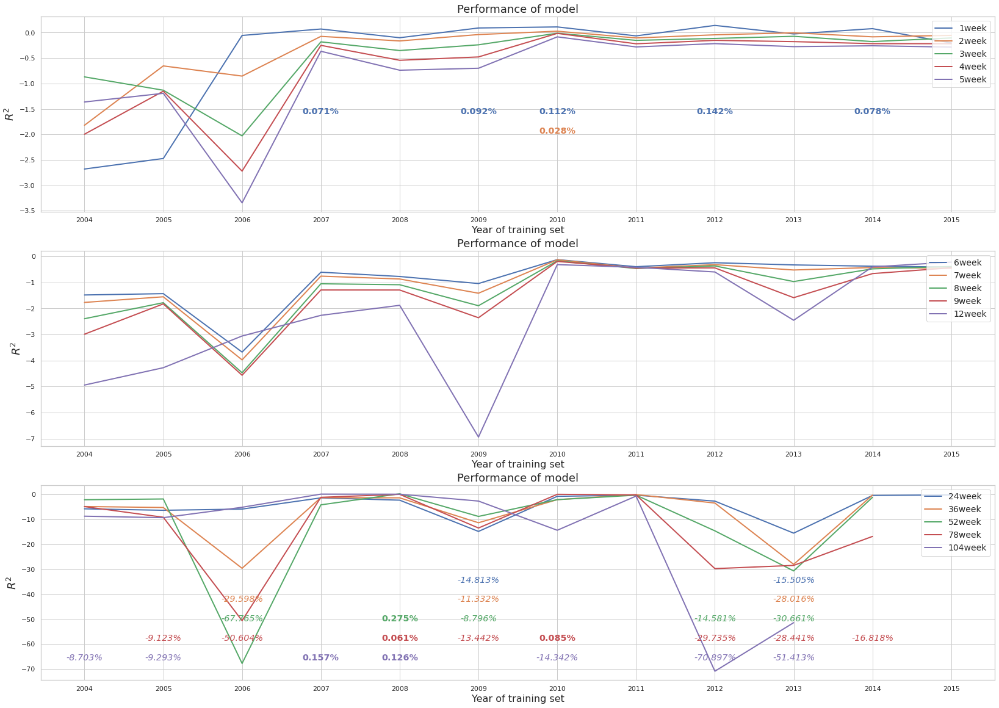

In [63]:
# selected = ["T-Bill", "USInd", "convexm2", "convexp2", "mcsi", "point0"]

graph_comparison(scores_sel)


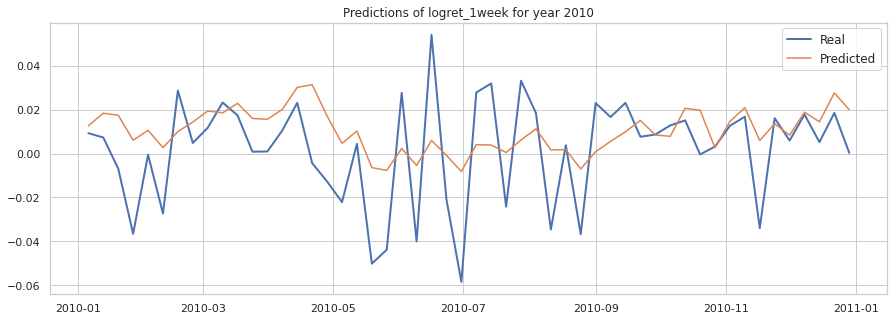

In [64]:
compare_preds(Y, preds_sel, 'logret_1week', y=2010)

In [65]:
# REGRESSION INCLUDING ONLY 4 VARIABLES WITH GREATEST MAGNITUDE IN COMMON TO ALL LAGS 
# (CASE WITH STANDARDIZATION)

X, Y = reinitialize()

select = ['convexm2', 'convexp2', 'point0', 'unc_bex_PAPER']

scal_v_ = RobustScaler()
var_ = ['convexm2', 'convexp2', 'point0', 'unc_bex_PAPER']

sc_ = {scal_v_: var_}

agg_s, scores_s, models_s, preds_s = train_recursive(LinearRegression(), X.loc[:, select], Y, scal=sc_, score=score_off)

# increase in predictability only for 1week and 2week (wrt above)
# usefulness of T-Bills variables to explain later lags

# very small difference (worsening overall) if not standardizing convex, point0 and dependent

Execution time for recursive training is  0.0  h : 0.0  m : 1.51  s


In [66]:
sort_aggregate(agg_s, scores_s)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.010326,,0.030396,0.088481
1,logret_2week,-0.212194,,-0.220649,-0.094600
2,logret_3week,-0.567692,,-0.381306,-0.197825
3,logret_4week,-0.815928,,-0.560948,-0.317716
4,logret_5week,-1.218832,,-0.770058,-0.268115
5,logret_6week,-1.695503,,-1.386765,-0.511242
6,logret_7week,-2.325404,,-2.037717,-0.675994
7,logret_8week,-3.008491,,-2.922685,-0.897682
8,logret_9week,-3.501383,,-4.146466,-1.303097
9,logret_12week,-5.379038,,-7.984093,-2.222209


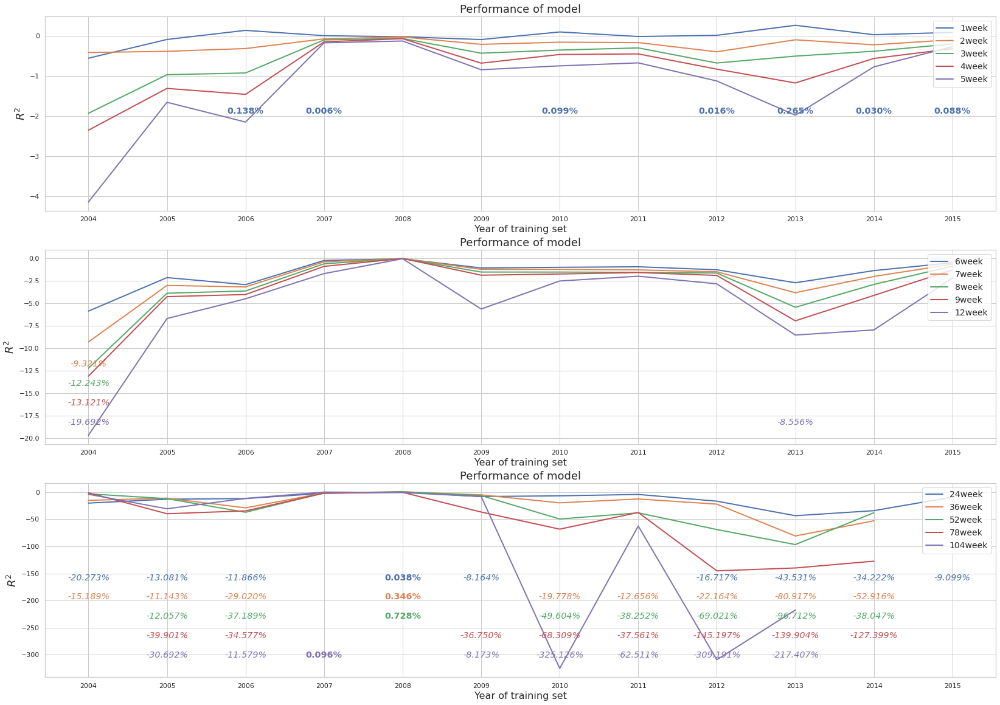

In [67]:
graph_comparison(scores_s)

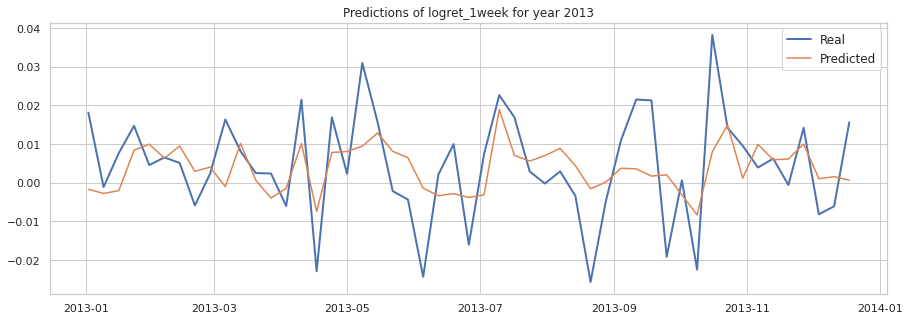

In [68]:
compare_preds(Y, preds_s, 'logret_1week', 2013)

In [69]:
# REGRESSION INCLUDING ONLY PK VARIABLES

X, Y = reinitialize()

pric_kernel = ['point0', 'slopem2', 'slopep2', 'slopem5', 'slopep5', 'slopem10', 'slopep10', 'convexp2', 'convexm2']

scal_pk = RobustScaler()

s = {scal_pk: pric_kernel}

agg_pk, scores_pk, models_pk, preds_pk = train_recursive(LinearRegression(), X.loc[:, pric_kernel], Y, scal=s, score=score_off)

Execution time for recursive training is  0.0  h : 0.0  m : 2.85  s


In [70]:
sort_aggregate(agg_pk, scores_pk)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.591510,,0.115442,0.136936
1,logret_2week,-0.683161,,-0.465616,-0.119915
2,logret_3week,-0.958639,,-1.089688,-0.491077
3,logret_4week,-1.130803,,-1.824620,-0.815999
4,logret_5week,-2.212542,,-2.900809,-0.998764
5,logret_6week,-2.898046,,-4.748248,-1.269935
6,logret_7week,-4.214113,,-6.815581,-1.752086
7,logret_8week,-5.073919,,-9.706244,-2.974263
8,logret_9week,-6.117007,,-13.444778,-3.601245
9,logret_12week,-14.214009,,-26.730564,-8.271264


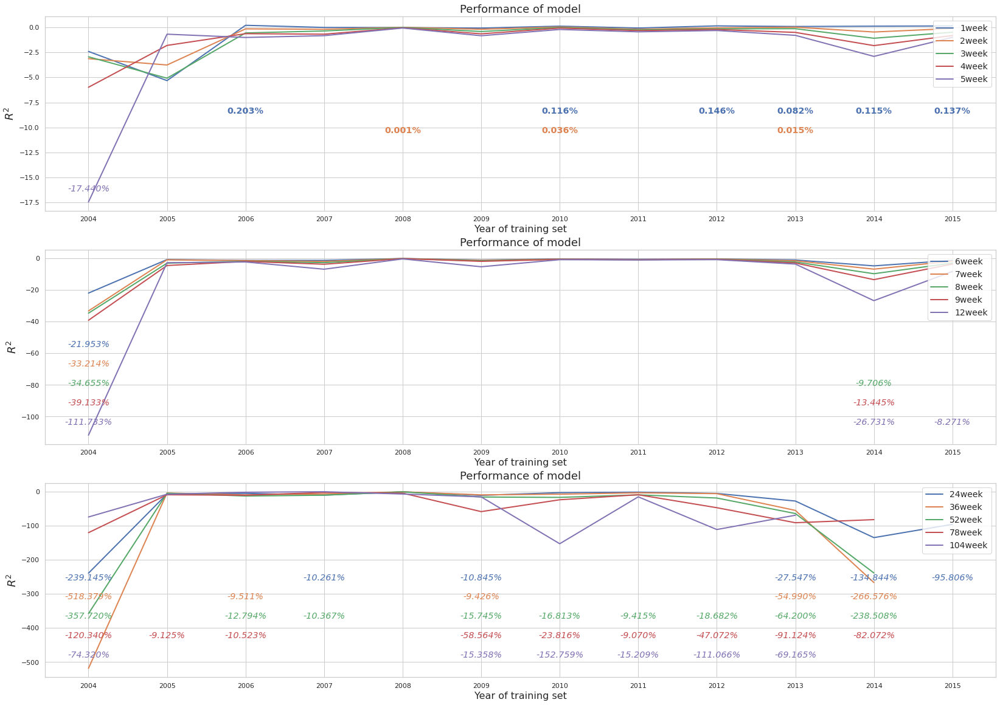

In [71]:
graph_comparison(scores_pk)


In [72]:
# REGRESSION INCLUDING ONLY MACRO VARIABLES

X, Y = reinitialize()

macro = [X.columns[i] for i in range(len(X.columns)) if X.columns[i] not in pric_kernel]
# ['T-Bill', 'ra_bex_PAPER', 'unc_bex_PAPER', 'unc_bex_%', 'VIX', 'US1YR', 'US2YR', 'US3YR', 'US5YR', 'US10YR', 'mcsi',
# 'SENT', 'SENT1', 'USInst', 'USInd']

scal_var = RobustScaler()
var = ['mcsi', 'VIX', 'USInst', 'USInd']
ra = X.columns[X.columns.str.contains(r'\Bbex\B')].to_list()   #['ra_bex_PAPER', 'unc_bex_PAPER', 'unc_bex_%']

scal_sent = MaxAbsScaler()
sent = ['SENT', 'SENT1']

scal_us1 = StandardScaler()
scal_us2 = MinMaxScaler()
us = X.columns[X.columns.str.contains(r'YR\b')].to_list()  #['US1YR', 'US2YR', 'US3YR', 'US5YR', 'US10YR', 'T-Bill']
us.append('T-Bill')

pro = {scal_var: var + ra, scal_sent: sent, scal_us1: us}

agg_macro, scores_macro, models_macro, preds_macro = train_recursive(LinearRegression(), X.loc[:, macro], Y, scal=pro, score=score_off)

Execution time for recursive training is  0.0  h : 0.0  m : 3.79  s


In [73]:
sort_aggregate(agg_macro, scores_macro)

# later lags get better

,Ranked models,Agg Scores,,One to last,Last year
0,logret_7week,-1.452430,,-0.368167,-1.040884
1,logret_6week,-1.597586,,-0.375652,-0.846591
2,logret_5week,-1.944797,,-0.307751,-0.609604
3,logret_8week,-1.978624,,-0.451783,-1.478618
4,logret_2week,-1.979030,,-0.168714,-0.221247
5,logret_9week,-2.129167,,-0.521934,-1.595507
6,logret_1week,-2.184736,,-0.571018,0.010539
7,logret_12week,-2.671514,,-0.574904,-2.973048
8,logret_4week,-3.080403,,-0.315093,-0.358913
9,logret_3week,-3.264653,,-0.229737,-0.221842


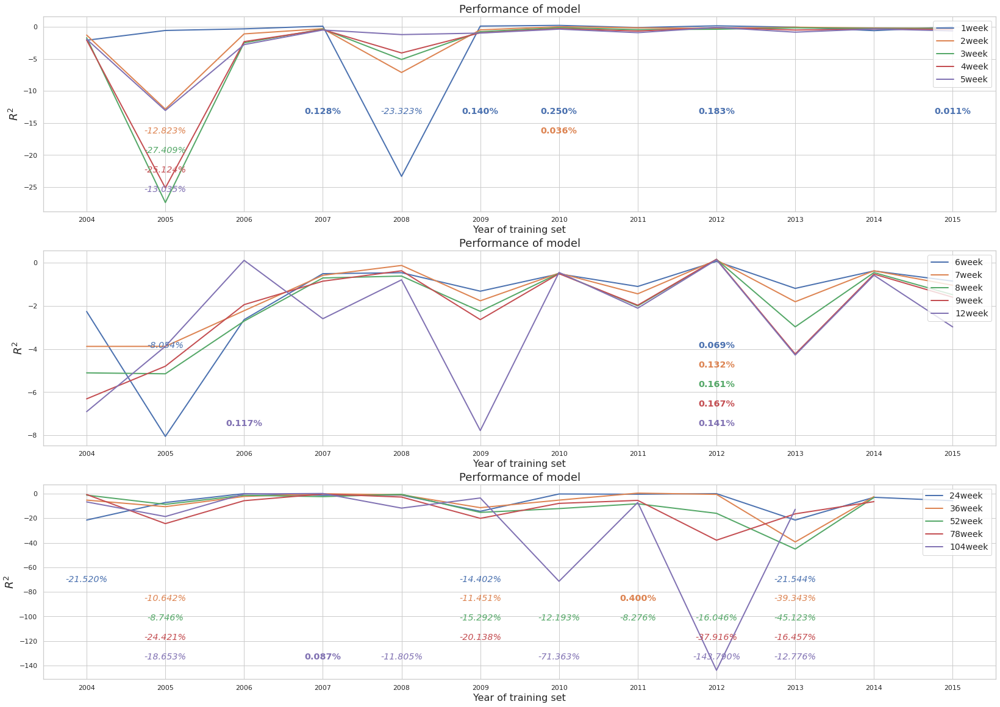

In [74]:
graph_comparison(scores_macro)

In [75]:
# if including only pricing kernels big increase for shorter lags
# but THEN worsening from 6week onward
# SEEMS STRONG ALMOST LINEAR RELATIONSHIP WITH PRICING KERNEL VARIABLES FOR SMALLER LAGS

# including only non-PK (macro variables) there is increase in predictability (more degrees of freedom) 
# but much less than when including only PK (case above)

### Use RFECV to train recursively, select the best features, and compute score of regressor-tuned model

In [76]:
# LINEAR REGRESSION WITH NO STANDARDIZATION

X, Y = reinitialize()

feat_ns, score_ns, agg_ns, preds_ns = feature_selection_full(LinearRegression(), X, Y, score=score_off)

# unc_bex_PAPER is the only one in common among all

100%|██████████| 15/15 [00:20<00:00,  1.38s/it]

Execution time for feature selection is  0.0  h : 0.0  m : 20.64  s


In [77]:
sort_aggregate(agg_ns, score_ns)

,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.239384,,-0.114066,-0.019358
1,logret_2week,-0.390538,,-0.032844,-0.129536
2,logret_3week,-0.685529,,-0.081352,-0.159127
3,logret_4week,-0.864091,,-0.835134,-0.063721
4,logret_6week,-1.264887,,-0.217152,-0.229988
5,logret_5week,-1.404213,,-1.027442,-0.393975
6,logret_8week,-1.599389,,-1.686685,-0.353635
7,logret_7week,-1.610135,,-0.367722,-0.437658
8,logret_12week,-2.235653,,-3.164926,-0.231786
9,logret_9week,-2.636764,,-0.518171,-0.391239


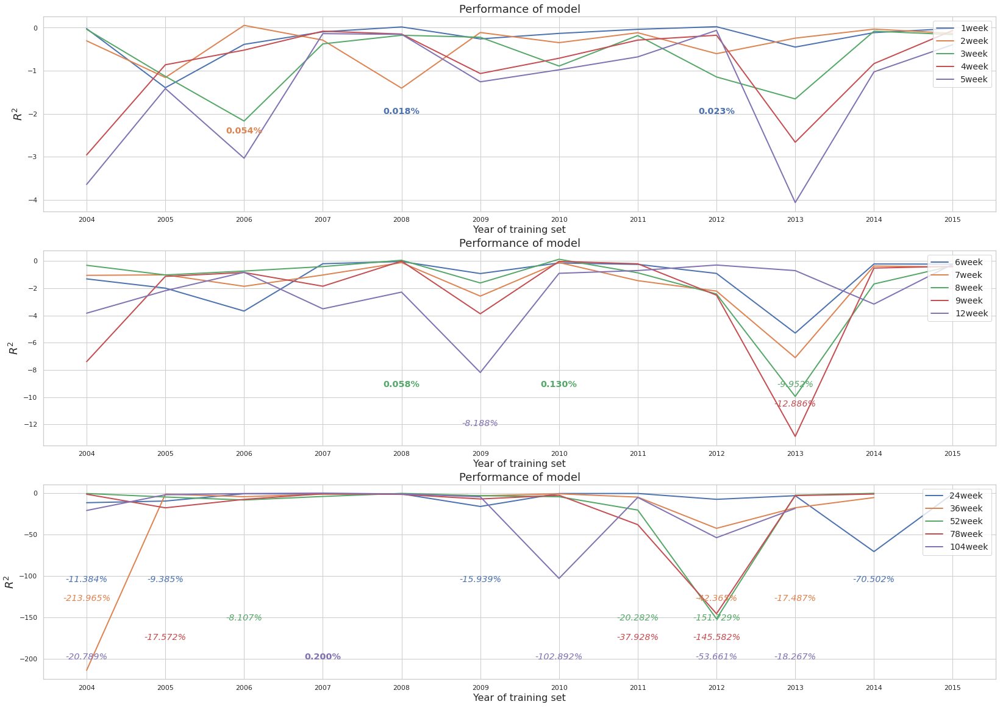

In [78]:
graph_comparison(score_ns)

In [79]:
visualize_selected(feat_ns, year=None)

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (11),unc_bex_PAPER (11),unc_bex_PAPER (11),unc_bex_PAPER (10)
1,VIX (3),VIX (6),VIX (8),US3YR (4),slopem2 (4),US3YR (7),VIX (5),VIX (7),VIX (6),VIX (7),VIX (9),US5YR (7),US3YR (9),US3YR (8),US3YR (8)
2,US2YR (1),US3YR (4),slopem2 (4),US5YR (3),US2YR (3),US2YR (4),US5YR (4),US3YR (7),US3YR (5),US2YR (7),US2YR (9),point0 (5),US5YR (7),US2YR (7),US2YR (7)
3,US3YR (1),US5YR (3),US5YR (2),slopep2 (1),US3YR (3),US5YR (4),slopem2 (4),US5YR (3),slopem2 (5),US3YR (7),slopem2 (8),VIX (5),VIX (6),US5YR (7),US5YR (7)
4,US5YR (1),US2YR (2),US3YR (1),US2YR (1),VIX (2),slopem2 (4),US2YR (3),slopem5 (3),unc_bex_% (3),US5YR (5),unc_bex_% (8),US3YR (4),US2YR (6),unc_bex_% (7),unc_bex_% (7)
5,,slopem5 (1),,VIX (1),slopep2 (1),slopem5 (2),US3YR (3),slopem2 (3),US2YR (2),US1YR (4),US1YR (8),US10YR (4),US10YR (4),US10YR (4),VIX (6)
6,,ra_bex_PAPER (1),,slopem2 (1),unc_bex_% (1),VIX (2),US10YR (3),US2YR (2),US5YR (2),slopem2 (4),US10YR (7),US2YR (2),US1YR (3),US1YR (3),US10YR (6)
7,,point0 (1),,,US10YR (1),unc_bex_% (1),slopem5 (2),US10YR (2),US10YR (1),US10YR (3),point0 (6),slopem5 (1),slopep2 (2),slopep2 (2),point0 (4)
8,,slopep2 (1),,,T-Bill (1),US1YR (1),point0 (1),point0 (1),SENT (1),unc_bex_% (2),slopep2 (6),slopem10 (1),slopem2 (1),point0 (2),slopep2 (3)
9,,slopem2 (1),,,US1YR (1),US10YR (1),slopep10 (1),slopep2 (1),SENT1 (1),slopep2 (1),slopep5 (6),unc_bex_% (1),unc_bex_% (1),slopep5 (2),US1YR (3)


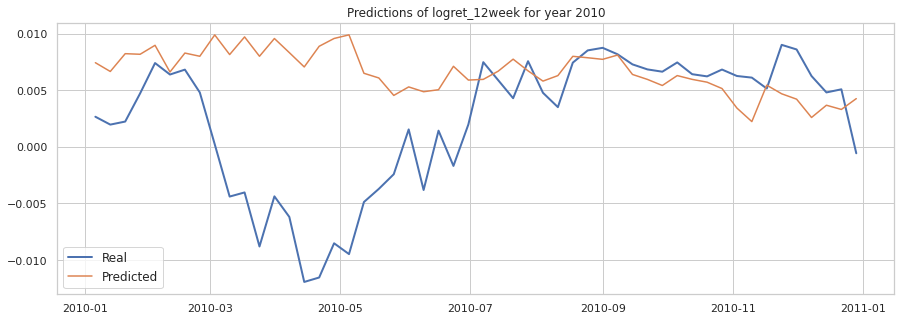

In [80]:
compare_preds(Y, preds_ns, 'logret_12week', 2010)

In [35]:
# LINEAR REGRESSION WITH STANDARDIZATION
# also Pricing Kernel standardized with RobustScaler

X, Y = reinitialize()

scal_var = RobustScaler()
var = ['mcsi', 'VIX', 'USInst', 'USInd']
pk = ['point0', 'slopem2', 'slopep2', 'slopem5', 'slopep5', 'slopem10', 'slopep10', 'convexp2', 'convexm2']
ra = X.columns[X.columns.str.contains(r'\Bbex\B')].to_list()   #['ra_bex_PAPER', 'unc_bex_PAPER', 'unc_bex_%']

scal_sent = MaxAbsScaler()
sent = ['SENT', 'SENT1']

scal_us = StandardScaler()
us = X.columns[X.columns.str.contains(r'YR\b')].to_list()  #['US1YR', 'US2YR', 'US3YR', 'US5YR', 'US10YR', 'T-Bill']
us.append('T-Bill')

prop_ = {scal_var: var + ra + pk, scal_sent: sent, scal_us: us}

feat_s, score_s, agg_s, preds_s = feature_selection_full(LinearRegression(), X, Y, scaler=prop_, score=score_off)

# with standardization all Pricing Kernel variables disappear and macro-variables emerge
# we try not to standardize dependent to see if due to linear relationships

100%|██████████| 15/15 [00:27<00:00,  1.85s/it]

Execution time for feature selection is  0.0  h : 0.0  m : 27.78  s


In [36]:
sort_aggregate(agg_s, score_s)

# better: 2 (from -0.6), 8 (from -2.85), 24 (from -3.4), 12 (from -1.85), 36 (from -6.43), 78 (from -6.3)
# worse: 1 (from positive), 3 (from -0.23), 4 (from -0.2), 6 (from -0.33), 7 (from -0.46), 9 (from -1), 104 (from -9)

# in general better

,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.063578,,-0.006595,-0.018837
1,logret_2week,-0.084968,,0.007180,0.023049
2,logret_3week,-0.166214,,-0.059756,0.049282
3,logret_5week,-0.484300,,0.057252,-0.137040
4,logret_7week,-0.530670,,-0.377937,0.006302
5,logret_4week,-0.588145,,0.037579,0.039248
6,logret_6week,-0.746730,,0.088362,0.024301
7,logret_9week,-1.299548,,-1.165465,-0.083716
8,logret_36week,-1.357689,,-0.464094,0.403822
9,logret_8week,-1.414866,,0.027499,-0.285993


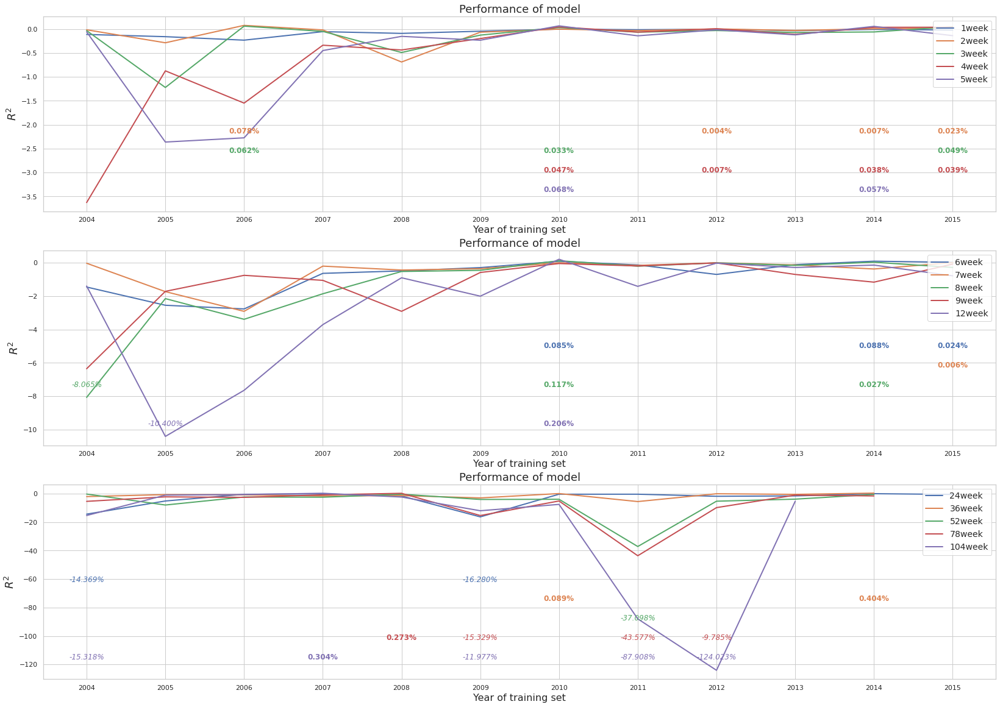

In [37]:
graph_comparison(score_s)

In [38]:
visualize_selected(feat_s, year=None)   

# if Pricing Kernel standardized not selected that much (less than before)

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,US2YR (8),US2YR (7),US2YR (7),US2YR (9),US2YR (6),US2YR (8),US2YR (6),US3YR (8),US2YR (8),US2YR (9),US2YR (9),US2YR (7),US2YR (9),US2YR (9),US3YR (9)
1,SENT1 (2),US3YR (5),US3YR (6),unc_bex_% (2),SENT (5),US3YR (7),SENT1 (4),US1YR (7),US3YR (7),US3YR (5),US3YR (9),US5YR (6),US3YR (8),US3YR (8),US2YR (8)
2,SENT (2),US1YR (2),unc_bex_% (2),US3YR (2),US3YR (3),SENT (4),US3YR (4),US2YR (7),SENT (6),SENT1 (5),US1YR (8),US3YR (6),US5YR (8),US5YR (7),US1YR (7)
3,US3YR (1),ra_bex_PAPER (2),US1YR (2),SENT1 (2),US1YR (2),US1YR (2),SENT (3),SENT (3),SENT1 (4),US1YR (5),US5YR (6),US1YR (5),SENT (8),US10YR (6),US5YR (7)
4,,SENT1 (1),ra_bex_PAPER (2),SENT (2),unc_bex_% (1),unc_bex_PAPER (1),US1YR (3),SENT1 (3),US1YR (4),SENT (4),US10YR (6),SENT1 (3),US1YR (6),SENT (5),US10YR (5)
5,,US5YR (1),VIX (2),ra_bex_PAPER (1),SENT1 (1),unc_bex_% (1),unc_bex_PAPER (2),unc_bex_PAPER (1),slopep10 (3),T-Bill (4),unc_bex_% (5),unc_bex_PAPER (1),US10YR (4),SENT1 (5),unc_bex_PAPER (4)
6,,,unc_bex_PAPER (1),unc_bex_PAPER (1),T-Bill (1),US10YR (1),USInd (2),unc_bex_% (1),unc_bex_% (2),unc_bex_PAPER (3),unc_bex_PAPER (4),unc_bex_% (1),unc_bex_PAPER (1),unc_bex_% (4),unc_bex_% (4)
7,,,US5YR (1),US5YR (1),,SENT1 (1),slopep10 (2),mcsi (1),USInst (2),unc_bex_% (3),SENT (4),SENT (1),unc_bex_% (1),point0 (3),T-Bill (3)
8,,,slopep10 (1),US10YR (1),,slopem5 (1),T-Bill (2),slopep10 (1),USInd (2),slopep10 (1),USInd (4),slopep10 (1),slopep5 (1),unc_bex_PAPER (3),SENT (3)
9,,,T-Bill (1),slopep10 (1),,T-Bill (1),slopem5 (1),US5YR (1),VIX (2),VIX (1),T-Bill (4),US10YR (1),SENT1 (1),VIX (3),point0 (2)


In [85]:
# LINEAR REGRESSION WITH STANDARDIZATION

# EXCLUDING PK variables except for Convex


X, Y = reinitialize()

scal_var = RobustScaler()
var = ['mcsi', 'VIX', 'USInst', 'USInd'] + ['convexp2', 'convexm2']
ra = X.columns[X.columns.str.contains(r'\Bbex\B')].to_list()   #['ra_bex_PAPER', 'unc_bex_PAPER', 'unc_bex_%']

scal_sent = MaxAbsScaler()
sent = ['SENT', 'SENT1']

scal_us = StandardScaler()
us = X.columns[X.columns.str.contains(r'YR\b')].to_list()  #['US1YR', 'US2YR', 'US3YR', 'US5YR', 'US10YR', 'T-Bill']
us.append('T-Bill')

prop3 = {scal_var: var + ra, scal_sent: sent, scal_us: us}

feat_s3, score_s3, agg_s3, preds_s3 = feature_selection_full(LinearRegression(), X, Y, scaler=prop3, score=score_off)

100%|██████████| 15/15 [00:24<00:00,  1.64s/it]

Execution time for feature selection is  0.0  h : 0.0  m : 24.54  s


In [86]:
sort_aggregate(agg_s3, score_s3)

# in general slightly better (especially later lags, 104 a lot) if not standardizing dependent, US-Bill and PK variables 
# (becomes worse if standardizing PK alone) (worse also if standardizing US-Bill alone) (worse also if dependent + US-Bill)

# better: 1 (from -0.14), 104 (from -12)
# worse: 6 (from -0.51), 5 (from -0.52), 7 (from -0.6), 8 (from -0.9), 24 (from -1.05), 36 (from -1.89), 52 (from -2)

,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.070838,,0.089312,-0.022519
1,logret_2week,-0.108100,,-0.189800,0.023049
2,logret_3week,-0.269211,,-0.481207,0.051923
3,logret_5week,-0.966832,,0.057252,0.031551
4,logret_4week,-0.971078,,0.037579,0.039248
5,logret_9week,-1.097535,,0.020350,-0.809113
6,logret_8week,-1.463550,,0.027499,-0.896598
7,logret_6week,-1.467471,,-1.453290,-0.555948
8,logret_7week,-1.950053,,0.087590,0.006302
9,logret_12week,-2.409228,,-8.089017,-0.073048


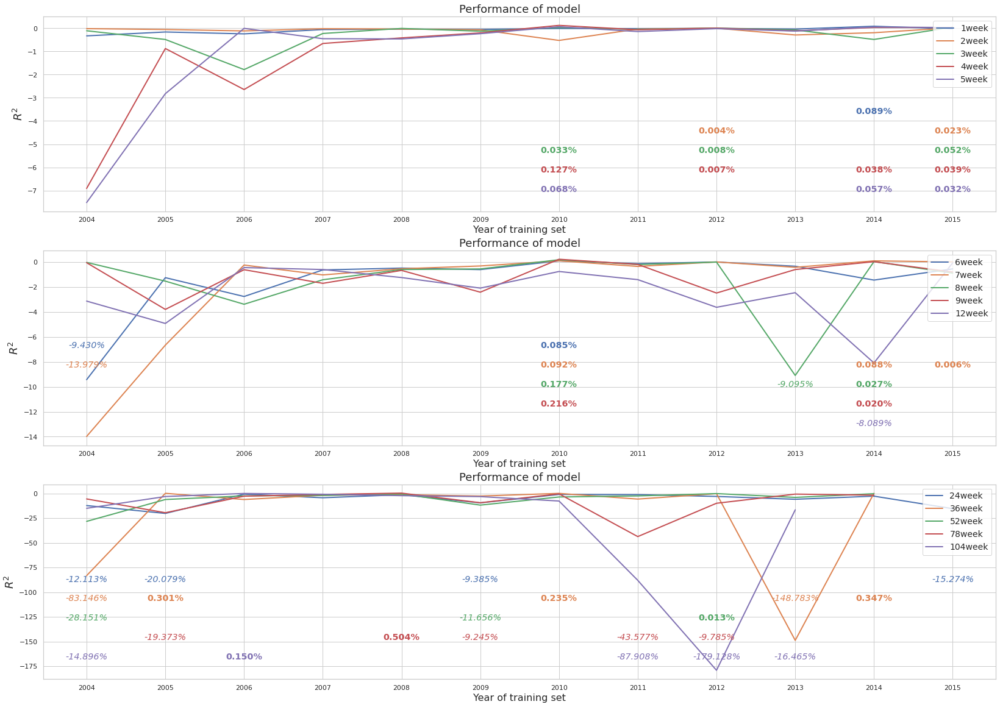

In [87]:
graph_comparison(score_s3)


# ONE OF BEST ONES obtained (especially for smaller lags)
# Point0 and Slope selected more often when Convex standardized (together with US-BILLS)

In [88]:
visualize_selected(feat_s3, year=None) 

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,US2YR (6),US2YR (4),US2YR (5),US2YR (7),US2YR (7),SENT (3),US2YR (7),US2YR (5),US2YR (5),US2YR (7),US3YR (10),US2YR (6),US2YR (9),US2YR (9),US3YR (9)
1,SENT (3),point0 (3),slopem2 (3),slopep2 (3),SENT (3),US3YR (3),US3YR (7),US3YR (5),SENT (4),US3YR (6),slopem2 (8),US3YR (5),US3YR (9),US3YR (9),US2YR (8)
2,US3YR (3),US3YR (2),VIX (1),US3YR (3),US3YR (3),slopem2 (3),US5YR (4),SENT (3),SENT1 (4),US1YR (6),US5YR (7),US5YR (4),SENT (8),US5YR (6),US5YR (8)
3,slopem5 (1),SENT1 (1),SENT1 (1),unc_bex_% (1),SENT1 (2),US2YR (3),US1YR (3),SENT1 (3),US3YR (4),SENT1 (5),unc_bex_PAPER (6),US1YR (4),US1YR (7),SENT (4),US1YR (6)
4,SENT1 (1),slopep2 (1),SENT (1),SENT1 (1),US5YR (2),SENT1 (2),SENT1 (3),US5YR (3),slopem2 (4),slopep2 (5),unc_bex_% (6),SENT (2),US5YR (6),US10YR (3),slopep2 (5)
5,point0 (1),slopem2 (1),slopep2 (1),slopem2 (1),slopep2 (1),slopep2 (1),SENT (2),slopem2 (3),US1YR (3),US5YR (4),US2YR (6),point0 (1),US10YR (5),slopep2 (2),point0 (4)
6,T-Bill (1),,slopep10 (1),T-Bill (1),slopep5 (1),US1YR (1),slopep2 (1),US1YR (2),point0 (2),unc_bex_% (4),US10YR (6),slopem2 (1),slopem2 (4),SENT1 (2),unc_bex_% (4)
7,US1YR (1),,T-Bill (1),US1YR (1),US1YR (1),,slopem2 (1),unc_bex_PAPER (1),unc_bex_PAPER (1),SENT (4),SENT1 (6),slopem10 (1),point0 (3),US1YR (2),SENT (4)
8,US5YR (1),,US1YR (1),US5YR (1),,,T-Bill (1),slopem5 (1),slopem5 (1),T-Bill (4),slopep5 (5),US10YR (1),unc_bex_PAPER (3),point0 (1),T-Bill (4)
9,,,,,,,,slopem10 (1),T-Bill (1),unc_bex_PAPER (3),T-Bill (5),SENT1 (1),unc_bex_% (3),slopem2 (1),slopem2 (3)


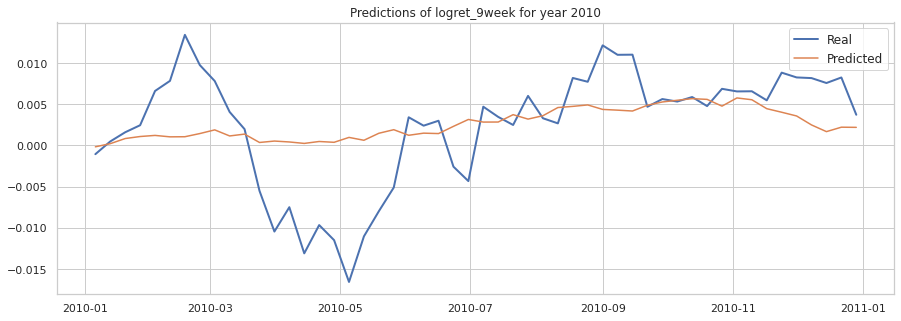

In [89]:
compare_preds(Y, preds_s3, 'logret_9week', 2010)

## Logarithmic transformation

In [90]:
# Transforming all Columns and DROPPING CONVEX

X_log, Y_log = log_transf()
feat_log, score_log, agg_log, preds_log = feature_selection_full(LinearRegression(), X_log, Y_log, score=score_off)

Scalar added is:  -2.998946389647


100%|██████████| 15/15 [00:18<00:00,  1.23s/it]

Execution time for feature selection is  0.0  h : 0.0  m : 18.5  s


In [91]:
sort_aggregate(agg_log, score_log)

# works only for smaller lags, especially 1week (slightly worse for later lags, bad for 104)
# better: 4 (from -0,38), 7 (from -0.6), 8 (from -0.9), 9 (from -1.72), 36 (from -1.9), 78 (from -3.64 !!)
# worse: 1 (from -0.14), 2 (from -0.16), 5 (from -0.52), 24 (from -1.05), 12 (from -1.08), 52 (from -2), 104 (from -12)

,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.283550,,-0.112603,0.002810
1,logret_2week,-0.330583,,-0.303170,-0.099650
2,logret_5week,-0.761037,,-0.032498,0.009370
3,logret_3week,-0.792177,,-0.180076,-0.249370
4,logret_7week,-1.269131,,-0.025406,-0.068584
5,logret_4week,-1.367011,,-0.053759,-0.144645
6,logret_36week,-1.569005,,-0.474995,-2.128636
7,logret_6week,-2.000952,,-0.009530,-0.567847
8,logret_52week,-2.377876,,-1.508937,-4.891666
9,logret_8week,-2.941487,,-6.022048,-0.167270


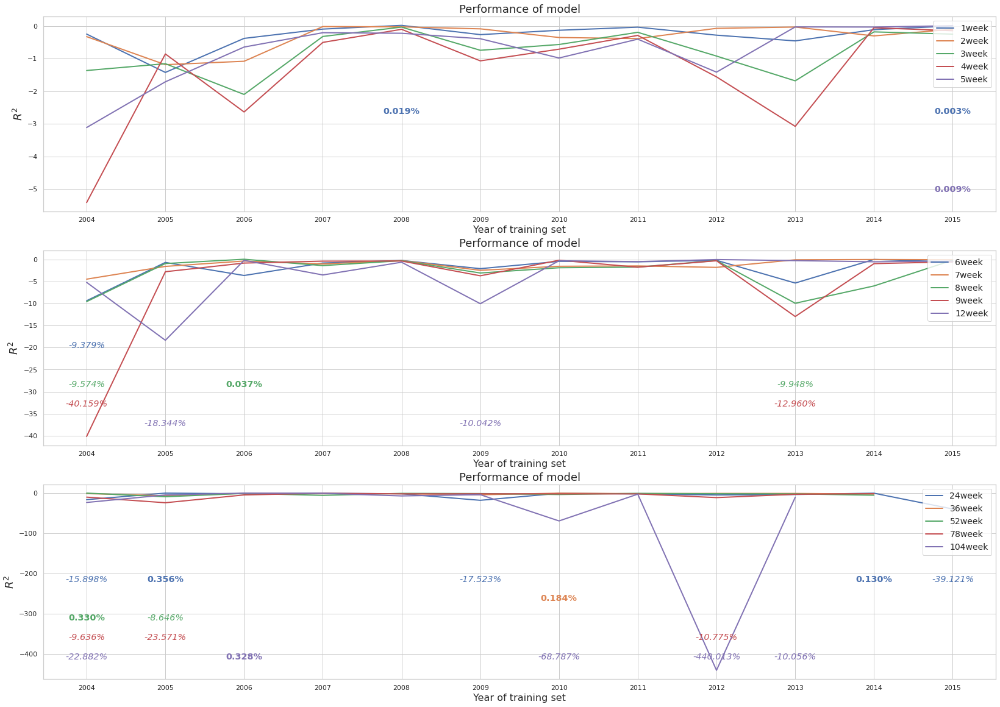

In [92]:
graph_comparison(score_log)

In [93]:
visualize_selected(feat_log, year=None) 

# a bit less PK variables around with Dependent standardized

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (11),unc_bex_PAPER (11),unc_bex_PAPER (11),unc_bex_PAPER (10)
1,VIX (2),VIX (4),VIX (5),VIX (3),US2YR (6),VIX (3),US2YR (7),US3YR (4),US2YR (6),US2YR (7),US2YR (8),US5YR (8),US2YR (9),US2YR (10),US2YR (8)
2,,US5YR (3),unc_bex_% (2),US3YR (2),US3YR (4),US2YR (3),US3YR (5),US5YR (3),US3YR (6),US3YR (6),US3YR (7),US3YR (8),US3YR (9),US3YR (8),VIX (7)
3,,point0 (2),US2YR (2),US2YR (2),US5YR (3),US3YR (2),VIX (3),VIX (3),slopem2 (5),US1YR (4),VIX (4),US10YR (7),US5YR (8),US5YR (7),US1YR (7)
4,,ra_bex_PAPER (2),US1YR (2),USInd (1),unc_bex_% (1),USInd (1),US5YR (3),slopem2 (3),US5YR (5),unc_bex_% (3),slopem2 (3),US2YR (6),US10YR (3),point0 (2),US5YR (7)
5,,slopem5 (1),US3YR (2),US5YR (1),USInd (1),US5YR (1),unc_bex_% (2),US2YR (3),US1YR (3),VIX (3),slopep2 (2),slopem2 (2),slopem2 (2),VIX (2),US3YR (6)
6,,US2YR (1),USInd (1),US1YR (1),,unc_bex_% (1),US1YR (1),USInd (2),VIX (3),slopem2 (3),unc_bex_% (2),point0 (1),US1YR (2),mcsi (2),unc_bex_% (6)
7,,USInst (1),US5YR (1),,,slopem2 (1),mcsi (1),point0 (1),T-Bill (2),US5YR (2),US1YR (2),slopem5 (1),slopem5 (1),unc_bex_% (2),US10YR (5)
8,,slopem2 (1),slopem2 (1),,,,slopem2 (1),slopep2 (1),unc_bex_% (2),mcsi (2),US5YR (2),unc_bex_% (1),T-Bill (1),slopem2 (1),point0 (4)
9,,,,,,,,slopem5 (1),slopem5 (1),point0 (1),US10YR (2),VIX (1),ra_bex_PAPER (1),slopem10 (1),USInd (4)


In [94]:
# EXCLUDING ONLY PK (including Dependent)

X_l, Y_l = log_transf_nopk()
feat_l, score_l, agg_l, preds_l = feature_selection_full(LinearRegression(), X_l, Y_l, score=score_off)

Scalar added is:  0.9416964


100%|██████████| 15/15 [00:20<00:00,  1.38s/it]

Execution time for feature selection is  0.0  h : 0.0  m : 20.64  s


In [95]:
sort_aggregate(agg_l, score_l)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.173345,,-0.109096,0.003488
1,logret_2week,-0.465388,,-0.055819,-0.060787
2,logret_7week,-0.524224,,0.027020,0.053410
3,logret_3week,-0.635765,,0.027517,-0.009837
4,logret_8week,-1.002516,,0.127334,-0.190716
5,logret_9week,-1.031325,,-0.067651,-0.265445
6,logret_4week,-1.112284,,-0.026817,0.000924
7,logret_6week,-1.296636,,-4.075901,-0.175045
8,logret_5week,-1.393961,,-1.307414,0.082028
9,logret_12week,-2.274977,,-4.560152,-2.450469


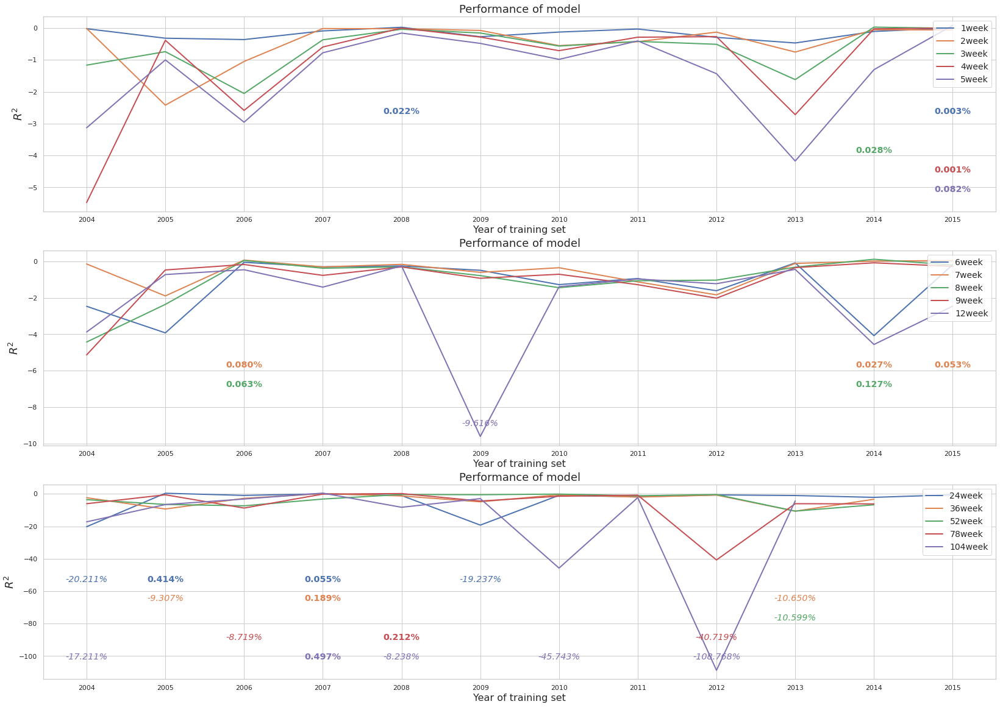

In [96]:
graph_comparison(score_l)

In [97]:
visualize_selected(feat_l, year=None) 

# a lot better, still missing PK in features since dependent is transformed

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (11),unc_bex_PAPER (11),unc_bex_PAPER (11),unc_bex_PAPER (10)
1,,ra_bex_PAPER (5),US3YR (5),USInd (2),US3YR (3),US3YR (5),US2YR (5),US3YR (8),US2YR (9),US1YR (9),US2YR (9),US3YR (7),US3YR (11),US3YR (11),US2YR (10)
2,,US5YR (2),US2YR (3),US3YR (2),US5YR (3),US5YR (5),US3YR (3),US5YR (6),US3YR (8),US3YR (9),US3YR (9),US2YR (6),US2YR (10),US2YR (10),US5YR (10)
3,,VIX (2),USInd (2),US2YR (2),US1YR (2),US2YR (5),US5YR (2),US2YR (4),US5YR (6),US2YR (7),US5YR (2),US5YR (5),US5YR (10),US5YR (10),VIX (9)
4,,USInd (2),unc_bex_% (1),VIX (1),US2YR (2),US1YR (3),US1YR (2),US1YR (3),US1YR (3),US5YR (7),US10YR (2),US10YR (5),US10YR (7),US10YR (9),US3YR (9)
5,,US3YR (1),VIX (1),,unc_bex_% (1),mcsi (2),unc_bex_% (1),T-Bill (2),unc_bex_% (2),USInd (6),USInd (2),USInd (2),USInd (4),VIX (6),US1YR (7)
6,,US10YR (1),US5YR (1),,US10YR (1),unc_bex_% (1),US10YR (1),unc_bex_% (2),mcsi (2),unc_bex_% (3),slopep2 (1),unc_bex_% (1),USInst (2),ra_bex_PAPER (5),US10YR (7)
7,,US2YR (1),,,USInst (1),USInd (1),mcsi (1),mcsi (1),USInd (2),US10YR (3),slopem5 (1),,ra_bex_PAPER (2),USInd (5),ra_bex_PAPER (6)
8,,slopem2 (1),,,USInd (1),T-Bill (1),USInd (1),USInd (1),US10YR (2),T-Bill (3),slopep5 (1),,US1YR (2),unc_bex_% (5),mcsi (6)
9,,point0 (1),,,,US10YR (1),,VIX (1),T-Bill (1),mcsi (2),T-Bill (1),,point0 (1),point0 (3),unc_bex_% (6)


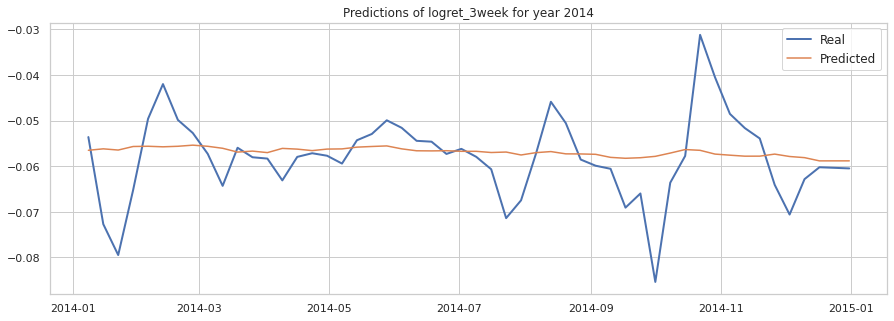

In [98]:
compare_preds(Y_l, preds_l, 'logret_3week', 2014)

In [39]:
# EXCLUDING PK AND DEPENDENT

X_l2, Y_l2 = log_transf_nopk(dep=False)
feat_l2, score_l2, agg_l2, preds_l2 = feature_selection_full(LinearRegression(), X_l2, Y_l2, score=score_off)

Scalar added is:  0.9416964


100%|██████████| 15/15 [00:21<00:00,  1.42s/it]

Execution time for feature selection is  0.0  h : 0.0  m : 21.37  s


In [40]:
sort_aggregate(agg_l2, score_l2)

# in general slightly better than before on average

,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.173392,,-0.114065,0.002522
1,logret_2week,-0.350819,,-0.055154,-0.058498
2,logret_3week,-0.609388,,0.028947,-0.006884
3,logret_4week,-1.110923,,-0.094545,0.004165
4,logret_7week,-1.129741,,-0.335088,0.046183
5,logret_6week,-1.260362,,-4.466394,-0.006023
6,logret_5week,-1.388843,,-1.285828,0.081131
7,logret_8week,-1.549087,,-6.607753,-0.530484
8,logret_12week,-2.233722,,-4.590249,-2.497822
9,logret_9week,-2.468929,,-0.062815,0.144172


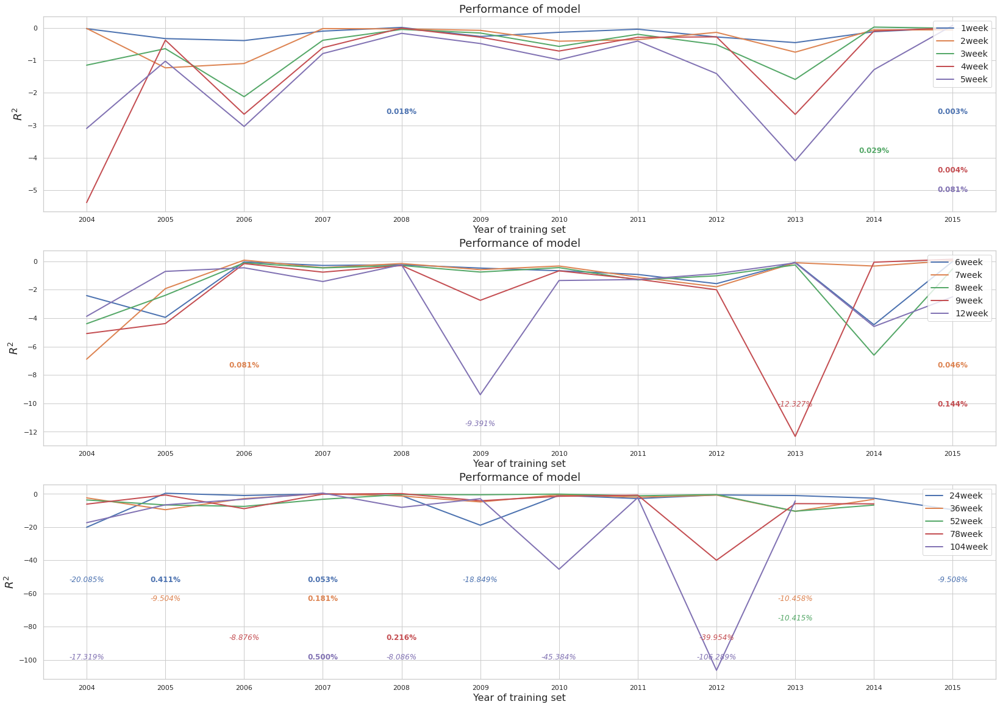

In [41]:
graph_comparison(score_l2)

In [42]:
visualize_selected(feat_l2, year=None)  

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (12),unc_bex_PAPER (11),unc_bex_PAPER (11),unc_bex_PAPER (11),unc_bex_PAPER (10)
1,,ra_bex_PAPER (5),US3YR (5),USInd (3),US3YR (3),US3YR (7),US2YR (4),US2YR (6),US2YR (8),US2YR (10),US2YR (9),US3YR (7),US3YR (11),US3YR (11),US2YR (10)
2,,VIX (3),USInd (2),US3YR (2),US5YR (3),US5YR (6),US3YR (4),US3YR (6),US3YR (7),US3YR (9),US3YR (9),US2YR (6),US2YR (10),US2YR (10),US5YR (10)
3,,US3YR (2),unc_bex_% (1),VIX (1),US1YR (2),US2YR (5),US1YR (4),US5YR (6),US5YR (6),US1YR (8),USInd (5),US5YR (5),US5YR (10),US5YR (10),VIX (9)
4,,USInd (2),VIX (1),US2YR (1),US2YR (2),mcsi (2),unc_bex_% (2),US1YR (5),US1YR (4),US5YR (8),VIX (3),US10YR (5),US10YR (7),US10YR (9),US3YR (9)
5,,US5YR (1),US2YR (1),,unc_bex_% (1),US1YR (2),US5YR (2),T-Bill (3),USInd (4),USInd (5),US1YR (3),USInd (2),USInd (4),VIX (6),US1YR (7)
6,,US2YR (1),US5YR (1),,US10YR (1),unc_bex_% (1),mcsi (2),unc_bex_% (3),unc_bex_% (3),unc_bex_% (3),US5YR (3),unc_bex_% (1),USInst (2),ra_bex_PAPER (5),US10YR (7)
7,,slopem2 (1),,,USInst (1),USInd (1),USInd (2),mcsi (2),mcsi (3),mcsi (2),US10YR (3),,ra_bex_PAPER (2),USInd (5),ra_bex_PAPER (6)
8,,point0 (1),,,USInd (1),T-Bill (1),US10YR (1),USInd (2),US10YR (3),US10YR (2),USInst (3),,US1YR (2),unc_bex_% (5),mcsi (6)
9,,unc_bex_% (1),,,,US10YR (1),,VIX (1),slopem2 (2),VIX (2),T-Bill (2),,point0 (1),T-Bill (4),unc_bex_% (6)


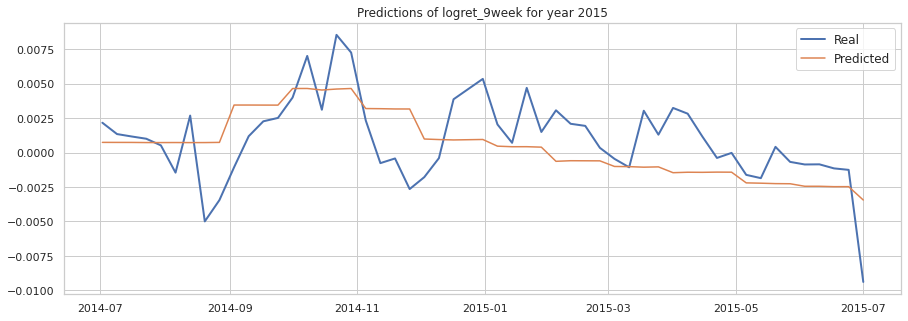

In [103]:
compare_preds(Y_l2, preds_l2, 'logret_9week', 2015)

### LassoCV with feature engineering

In [43]:
# LASSO WITH NO STANDARDIZATION

X, Y = reinitialize()
    
store_las, scores_las, agg_las, preds_las = lasso(X, Y, scor=score_off)

100%|██████████| 15/15 [00:24<00:00,  1.65s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_1week
1. logret_2week
2. logret_4week
3. logret_7week
4. logret_5week
5. logret_3week
6. logret_6week
7. logret_8week
8. logret_9week
9. logret_12week
10. logret_104week
11. logret_78week
12. logret_52week
13. logret_36week
14. logret_24week
Execution time for lasso is  0.0  h : 0.0  m : 24.69  s


In [44]:
# aggregate scores

sort_aggregate(agg_las, scores_las)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.200364,,-0.130369,-0.011461
1,logret_2week,-0.405516,,-0.026125,-0.145871
2,logret_3week,-0.848813,,-0.642193,-0.547397
3,logret_4week,-0.870497,,-0.297477,-0.090512
4,logret_6week,-1.090841,,-0.403305,-0.188544
5,logret_5week,-1.110587,,-0.373595,-0.164226
6,logret_7week,-1.612043,,-0.590316,-0.225010
7,logret_8week,-1.894031,,-0.812639,-0.289462
8,logret_9week,-2.253815,,-2.155069,-0.409077
9,logret_12week,-3.827645,,-5.435321,-1.225656


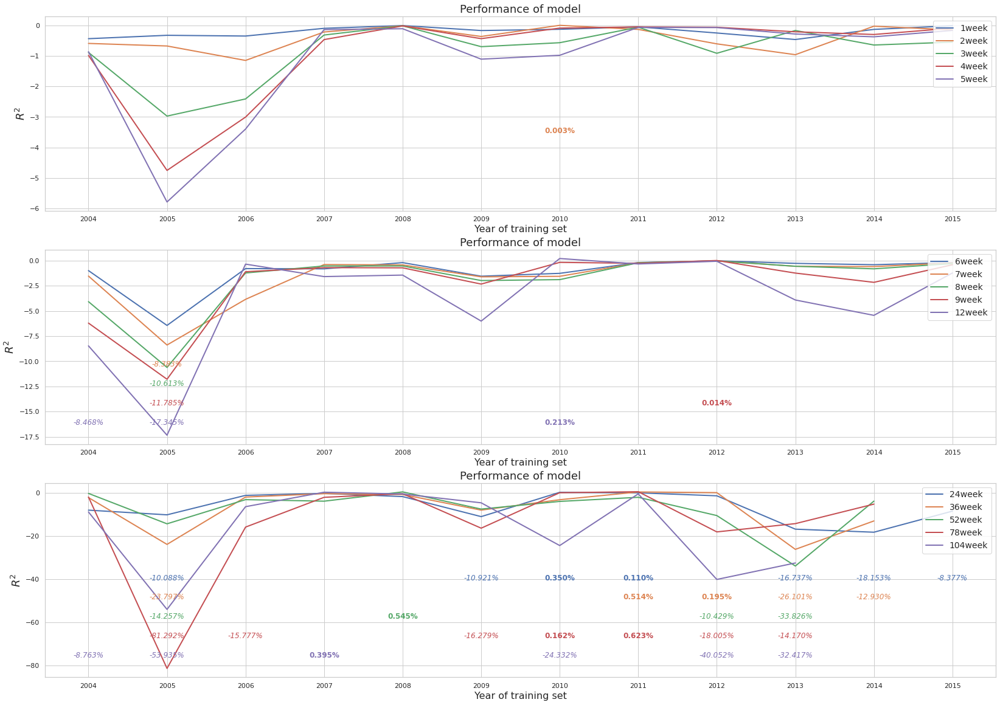

In [45]:
graph_comparison(scores_las)

In [46]:
# regressors selected 

visualize_selected(store_las, year=2011)  

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,convexm2,convexp2,convexp2,convexp2,convexp2,convexp2,point0,point0,point0,slopep5,convexp2,slopem10,convexp2,slopem10,convexp2
1,,convexm2,convexm2,convexm2,convexm2,convexm2,slopep5,slopep5,slopep5,slopem10,convexm2,convexp2,convexm2,convexp2,convexm2
2,,,ra_bex_PAPER,US1YR,US1YR,ra_bex_PAPER,slopep10,slopep10,slopem10,slopep10,T-Bill,convexm2,ra_bex_PAPER,convexm2,US1YR
3,,,US1YR,mcsi,mcsi,US3YR,convexp2,convexp2,slopep10,convexp2,ra_bex_PAPER,ra_bex_PAPER,US1YR,ra_bex_PAPER,mcsi
4,,,US2YR,USInst,USInst,mcsi,convexm2,convexm2,convexp2,convexm2,US3YR,unc_bex_%,US2YR,US1YR,USInst
5,,,US3YR,,,SENT1,T-Bill,T-Bill,convexm2,T-Bill,US5YR,US3YR,mcsi,mcsi,USInd
6,,,mcsi,,,USInst,ra_bex_PAPER,ra_bex_PAPER,T-Bill,ra_bex_PAPER,mcsi,mcsi,SENT,SENT,
7,,,USInst,,,USInd,US2YR,US2YR,ra_bex_PAPER,US2YR,SENT1,SENT,USInst,USInst,
8,,,USInd,,,,US3YR,US3YR,US2YR,US3YR,USInst,USInst,USInd,USInd,
9,,,,,,,mcsi,mcsi,mcsi,mcsi,USInd,USInd,,,


In [108]:
# LASSO WITH STANDARDIZATION 
# includong PK and DEPENDENT

X, Y = reinitialize()

scal_y = RobustScaler()  # columns of Y

scal_var = RobustScaler()
var = ['mcsi', 'VIX', 'USInst', 'USInd']
ra = X.columns[X.columns.str.contains(r'\Bbex\B')].to_list()   #['ra_bex_PAPER', 'unc_bex_PAPER', 'unc_bex_%']

scal_sent = MaxAbsScaler()
sent = ['SENT', 'SENT1']

scal_us = StandardScaler()
us = X.columns[X.columns.str.contains(r'YR\b')].to_list() + ['T-Bill']  #['US1YR', 'US2YR', 'US3YR', 'US5YR', 'US10YR', 'T-Bill']

prop_lst = {scal_var: var + ra + pricing_kernel, scal_sent: sent, scal_us: us, scal_y: 0}
    
store_lst, scores_lst, agg_lst, preds_lst = lasso(X, Y, scaler=prop_lst, scor=score_off)

100%|██████████| 15/15 [01:59<00:00,  7.98s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_8week
1. logret_6week
2. logret_5week
3. logret_2week
4. logret_7week
5. logret_9week
6. logret_4week
7. logret_1week
8. logret_3week
9. logret_12week
10. logret_24week
11. logret_36week
12. logret_104week
13. logret_78week
14. logret_52week
Execution time for lasso is  0.0  h : 1.0  m : 59.72  s


In [109]:
# aggregate scores

sort_aggregate(agg_lst, scores_lst)

# much better everything: logret_24week big increase from -5 to -0.8 (also f.i. logret3week from -1.6 to -0.2)
# except 1_week from -0.3 to -0.8 (good explanataroy from convex alone), 52_week and 104_week

,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,0.022625,,0.056604,0.079890
1,logret_2week,-0.019756,,0.012423,-0.006672
2,logret_3week,-0.106902,,-0.031031,0.042780
3,logret_4week,-0.186484,,-0.056637,-0.005636
4,logret_5week,-0.281866,,-0.087365,-0.047241
5,logret_6week,-0.360296,,-0.149495,-0.083515
6,logret_7week,-0.436207,,-0.252735,-0.082364
7,logret_8week,-0.559583,,-0.407618,-0.090170
8,logret_9week,-0.618232,,-0.421665,-0.075932
9,logret_12week,-1.203626,,-1.009718,-0.068935


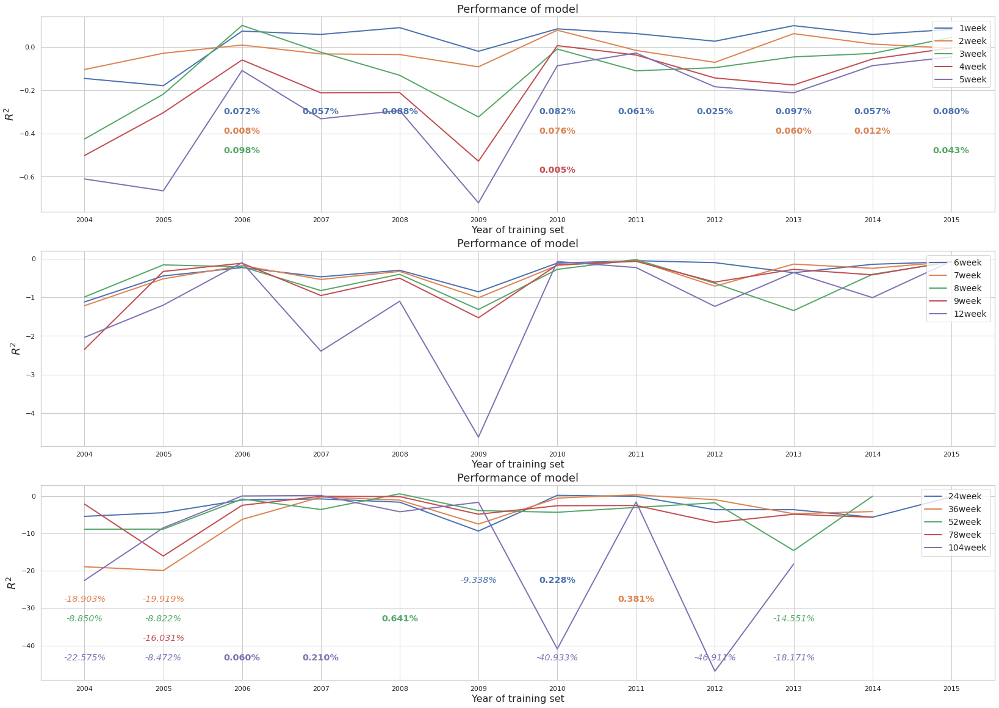

In [110]:
# visual comparison

graph_comparison(scores_lst)

# BEST ONE FOR SMALLER LAGS, POINT0 IS CHOSEN OFTEN and explains well also Financial Crisis together with òater years
# US BILLS SELECTED FOR MEDIUM LAGS BUT FAIL TO EXPLAIN

In [111]:
visualize_selected(store_lst, year=None) 

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,ra_bex_PAPER (12),US3YR (10),US3YR (10),US3YR (10),US3YR (10),US3YR (11),US3YR (11),US3YR (11),US3YR (10),US3YR (12),US3YR (10),US5YR (9),SENT (10),point0 (10),ra_bex_PAPER (10)
1,point0 (10),point0 (9),point0 (10),US2YR (9),US5YR (9),US2YR (9),US2YR (9),US2YR (8),US2YR (8),US5YR (8),US5YR (9),US3YR (9),unc_bex_PAPER (10),slopep2 (10),point0 (9)
2,US2YR (9),US5YR (9),US5YR (9),US1YR (8),US1YR (8),US1YR (7),US5YR (9),US5YR (8),US5YR (7),unc_bex_PAPER (7),USInd (8),ra_bex_PAPER (7),ra_bex_PAPER (9),slopep5 (10),slopep10 (9)
3,US3YR (8),ra_bex_PAPER (7),ra_bex_PAPER (8),US5YR (8),US2YR (8),US5YR (7),point0 (5),point0 (4),point0 (5),USInd (6),mcsi (6),slopem5 (6),VIX (9),ra_bex_PAPER (10),convexp2 (9)
4,US1YR (5),US1YR (6),US1YR (7),point0 (8),ra_bex_PAPER (6),point0 (6),US1YR (4),US1YR (3),unc_bex_PAPER (4),point0 (6),unc_bex_PAPER (6),VIX (5),mcsi (9),unc_bex_% (10),VIX (9)
5,unc_bex_PAPER (4),US2YR (6),US2YR (6),ra_bex_PAPER (7),point0 (5),ra_bex_PAPER (6),slopem2 (4),slopem2 (3),slopem2 (4),US2YR (5),slopem5 (5),mcsi (5),USInst (9),US10YR (10),US1YR (9)
6,US5YR (3),slopep5 (1),slopep2 (2),slopem5 (2),slopem5 (2),slopem2 (2),ra_bex_PAPER (4),ra_bex_PAPER (3),ra_bex_PAPER (4),mcsi (4),USInst (4),USInst (5),USInd (9),mcsi (10),mcsi (9)
7,T-Bill (1),convexm2 (1),USInst (2),USInst (2),slopem2 (2),USInst (2),USInst (4),unc_bex_PAPER (3),USInst (4),slopep2 (4),VIX (4),USInd (5),point0 (8),SENT (10),USInst (9)
8,,unc_bex_PAPER (1),convexm2 (1),slopep2 (1),USInst (2),slopep2 (1),slopem5 (3),USInst (3),slopep2 (2),slopem2 (4),US2YR (4),point0 (4),slopep5 (8),slopem10 (9),US2YR (8)
9,,,USInd (1),USInd (1),slopep2 (1),mcsi (1),slopep2 (2),slopep2 (2),US1YR (2),USInst (4),slopep5 (3),slopep2 (4),convexm2 (8),VIX (9),US10YR (8)


In [112]:
# NO STANDARDISATION Y, PK

X, Y = reinitialize()

scal_var = RobustScaler()
var = ['mcsi', 'VIX', 'USInst', 'USInd']
ra = X.columns[X.columns.str.contains(r'\Bbex\B')].to_list()   #['ra_bex_PAPER', 'unc_bex_PAPER', 'unc_bex_%']

scal_sent = MaxAbsScaler()
sent = ['SENT', 'SENT1']

scal_us = StandardScaler()
us = X.columns[X.columns.str.contains(r'YR\b')].to_list() + ['T-Bill']  #['US1YR', 'US2YR', 'US3YR', 'US5YR', 'US10YR', 'T-Bill']

prop_nost = {scal_var: var + ra, scal_sent: sent, scal_us: us}
    
store_nost, scores_nost, agg_nost, preds_nost = lasso(X, Y, scaler=prop_nost, scor=score_off)

# now also 24week has pk variables selected
# but all scores are worse

100%|██████████| 15/15 [00:26<00:00,  1.78s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_1week
1. logret_2week
2. logret_9week
3. logret_8week
4. logret_3week
5. logret_4week
6. logret_5week
7. logret_6week
8. logret_7week
9. logret_12week
10. logret_24week
11. logret_104week
12. logret_36week
13. logret_78week
14. logret_52week
Execution time for lasso is  0.0  h : 0.0  m : 26.78  s


In [113]:
sort_aggregate(agg_nost, scores_nost)

# in general worse than before

,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.138634,,-0.130369,-0.011461
1,logret_3week,-0.230252,,-0.066960,-0.007822
2,logret_4week,-0.233364,,-0.080564,-0.029064
3,logret_5week,-0.244886,,-0.158053,-0.094424
4,logret_2week,-0.252127,,0.005070,-0.001462
5,logret_6week,-0.276591,,-0.203137,-0.128412
6,logret_7week,-0.391953,,-0.256831,-0.185214
7,logret_8week,-0.500044,,-0.317543,-0.194492
8,logret_9week,-0.630830,,-0.352772,-0.130599
9,logret_12week,-1.443837,,-2.151164,0.023667


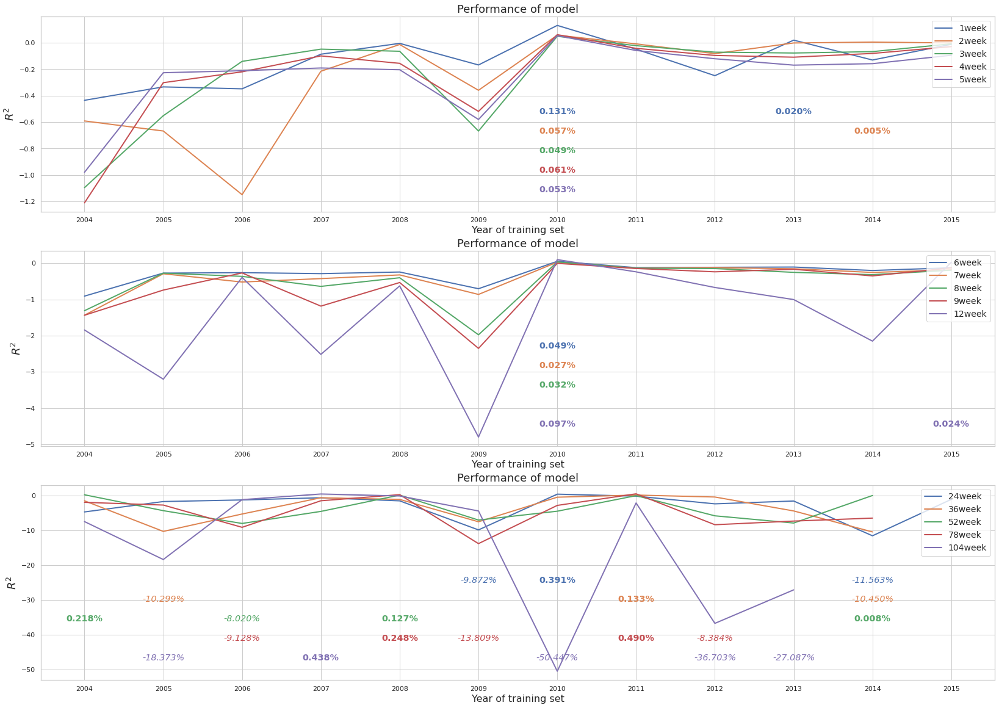

In [114]:
graph_comparison(scores_nost)

# IF CONVEX NOT STANDARDIZED IS CHOSEN ALMOST ALWAYS AND EXPLAINS VERY WELL 2010 FOR ALMOST ALL WEEKS and 2011 FOR LATER LAGS

In [115]:
visualize_selected(store_nost, year=None) 

# much less ra_bex for logret1
# convex is chosen always when not standardized and explains very well year 2010 for smaller lags and year 2011 for later lags (Post Financial Crisis)

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,convexm2 (12),convexp2 (12),convexp2 (12),convexm2 (12),convexp2 (12),convexp2 (12),convexp2 (12),convexp2 (12),convexp2 (12),convexp2 (12),convexp2 (12),convexp2 (11),convexp2 (11),convexp2 (11),convexp2 (10)
1,convexp2 (7),convexm2 (12),convexm2 (12),convexp2 (11),convexm2 (12),convexm2 (12),convexm2 (12),convexm2 (11),convexm2 (11),convexm2 (12),convexm2 (12),convexm2 (11),convexm2 (11),convexm2 (11),convexm2 (10)
2,ra_bex_PAPER (2),ra_bex_PAPER (6),US3YR (11),US3YR (10),US3YR (11),US3YR (11),US3YR (11),US3YR (10),US3YR (10),US3YR (12),US3YR (11),US3YR (9),SENT (10),unc_bex_PAPER (11),unc_bex_PAPER (10)
3,unc_bex_PAPER (2),US1YR (6),US2YR (8),US2YR (9),US2YR (9),US2YR (9),US2YR (9),US2YR (8),US2YR (8),USInd (10),USInd (9),US5YR (8),USInst (10),US1YR (11),US1YR (10)
4,US1YR (2),US2YR (6),US5YR (6),US5YR (6),US1YR (6),US1YR (6),US1YR (6),US1YR (5),ra_bex_PAPER (5),unc_bex_PAPER (9),US5YR (8),USInd (6),unc_bex_PAPER (10),slopem10 (7),ra_bex_PAPER (7)
5,US2YR (1),US3YR (5),ra_bex_PAPER (6),ra_bex_PAPER (6),US5YR (6),US5YR (6),US5YR (6),ra_bex_PAPER (5),US1YR (4),US2YR (7),mcsi (7),VIX (5),US2YR (8),US2YR (7),slopem10 (5)
6,US3YR (1),US5YR (3),US1YR (5),US1YR (5),ra_bex_PAPER (6),ra_bex_PAPER (6),ra_bex_PAPER (5),US5YR (4),mcsi (4),mcsi (5),slopep10 (4),slopem10 (5),US3YR (7),USInst (6),USInd (4)
7,T-Bill (1),slopem10 (1),unc_bex_PAPER (1),mcsi (1),mcsi (2),mcsi (2),mcsi (3),mcsi (3),US5YR (4),ra_bex_PAPER (5),USInst (4),SENT (4),VIX (5),ra_bex_PAPER (4),USInst (4)
8,,unc_bex_PAPER (1),,unc_bex_PAPER (1),unc_bex_PAPER (1),USInd (1),T-Bill (1),USInst (2),USInst (3),slopep10 (4),unc_bex_PAPER (4),USInst (4),US1YR (5),T-Bill (2),slopep10 (3)
9,,,,,,unc_bex_PAPER (1),USInd (1),unc_bex_PAPER (1),USInd (2),US5YR (4),US2YR (4),mcsi (3),ra_bex_PAPER (4),SENT (2),US2YR (3)


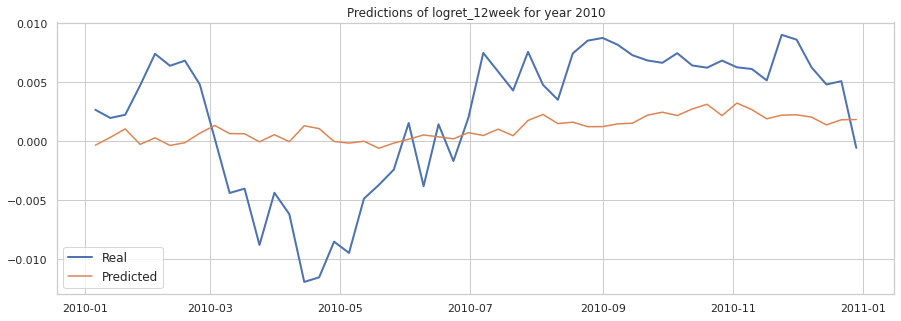

In [116]:
compare_preds(Y, preds_nost, 'logret_12week', 2010)

In [117]:
# NO STANDARDISATION Y and PK except for Convex standardized

X, Y = reinitialize()

scal_var = RobustScaler()
var = ['mcsi', 'VIX', 'USInst', 'USInd'] + ['convexm2', 'convexp2']
ra = X.columns[X.columns.str.contains(r'\Bbex\B')].to_list()   #['ra_bex_PAPER', 'unc_bex_PAPER', 'unc_bex_%']

scal_sent = MaxAbsScaler()
sent = ['SENT', 'SENT1']

scal_us = StandardScaler()
us = X.columns[X.columns.str.contains(r'YR\b')].to_list() + ['T-Bill']  #['US1YR', 'US2YR', 'US3YR', 'US5YR', 'US10YR', 'T-Bill']

prop_nost = {scal_var: var + ra, scal_sent: sent, scal_us: us}
    
store_nost2, scores_nost2, agg_nost2, preds_nost2 = lasso(X, Y, scaler=prop_nost, scor=score_off)

# now also 24week has pk variables selected
# but all scores are worse

100%|██████████| 15/15 [01:57<00:00,  7.84s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_1week
1. logret_2week
2. logret_8week
3. logret_5week
4. logret_3week
5. logret_7week
6. logret_4week
7. logret_6week
8. logret_9week
9. logret_12week
10. logret_24week
11. logret_36week
12. logret_104week
13. logret_52week
14. logret_78week
Execution time for lasso is  0.0  h : 1.0  m : 57.58  s


In [118]:
sort_aggregate(agg_nost2, scores_nost2)

# ambivalent
# better: 5week (from -0.6), 6 (from -1.077), 9 (from -1.8), 12 slightly, 8 (from -1.8), 36 (from -3.5), 52 (from -6.9)
# worse: 1week (from -0.78), 4 (from -0.34), 24 (from -0.8), 78 (from -4.6), 104 (from -11)

,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.013843,,0.030810,0.024843
1,logret_2week,-0.044580,,-0.004376,-0.006686
2,logret_3week,-0.105336,,-0.045893,0.058394
3,logret_4week,-0.193139,,-0.051222,-0.013132
4,logret_5week,-0.283452,,-0.046107,-0.023321
5,logret_6week,-0.414319,,-0.066771,-0.054353
6,logret_8week,-0.537667,,-0.200178,0.012956
7,logret_7week,-0.565041,,-0.096256,0.025835
8,logret_9week,-0.661720,,0.009604,0.021071
9,logret_12week,-1.262435,,-2.154042,-0.030804


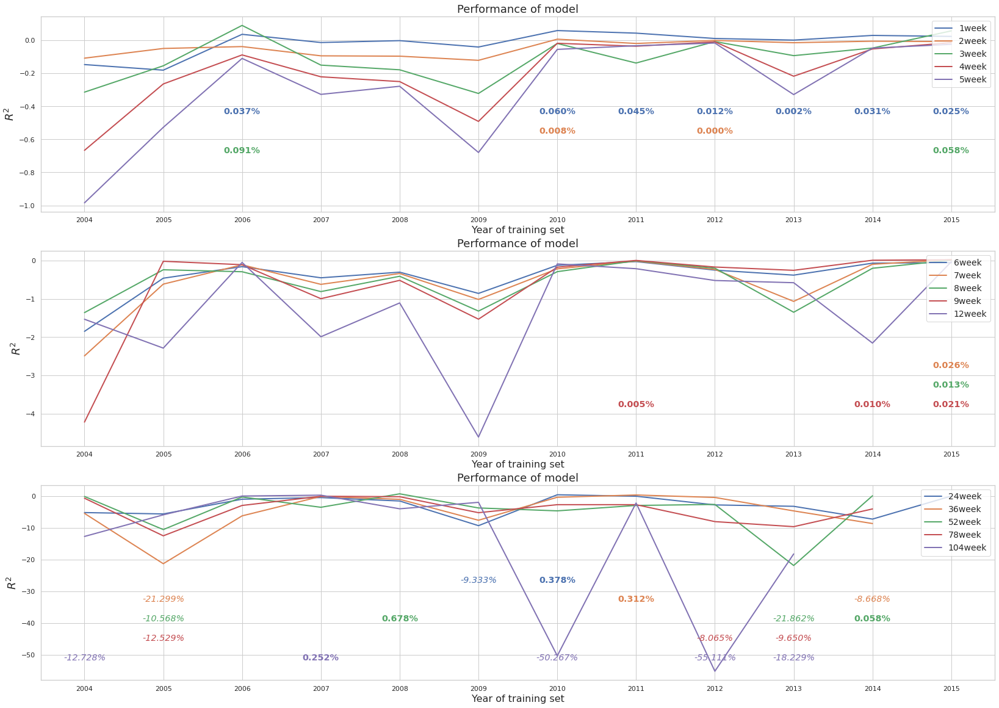

In [119]:
graph_comparison(scores_nost2)

# If Convex standardized is chosen less often and Us-Bills mostly selected
# (CONFIRMS FEATURE SELECTION)

In [120]:
visualize_selected(store_nost2, year=None) 

# much less ra_bex for logret1

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,ra_bex_PAPER (12),US1YR (9),US1YR (9),US3YR (10),US2YR (9),US3YR (11),US3YR (10),US2YR (9),US2YR (9),US3YR (12),US3YR (10),ra_bex_PAPER (8),VIX (10),slopep5 (11),ra_bex_PAPER (10)
1,US1YR (11),US3YR (8),US3YR (8),US1YR (9),US3YR (8),US2YR (9),US2YR (9),US3YR (9),US3YR (9),US2YR (9),US5YR (9),US5YR (8),SENT (10),slopem10 (11),point0 (9)
2,US2YR (9),US2YR (7),US5YR (8),US2YR (9),US1YR (7),US1YR (8),US1YR (8),US1YR (4),US1YR (5),USInd (8),USInd (9),US3YR (8),slopem10 (9),unc_bex_% (11),slopep10 (9)
3,US3YR (6),ra_bex_PAPER (7),US2YR (7),US5YR (9),US5YR (7),US5YR (7),US5YR (5),US5YR (4),slopep10 (5),unc_bex_PAPER (7),mcsi (6),slopem10 (7),convexm2 (9),US10YR (11),convexp2 (9)
4,T-Bill (3),slopep10 (6),ra_bex_PAPER (7),ra_bex_PAPER (7),ra_bex_PAPER (6),ra_bex_PAPER (6),slopep10 (4),ra_bex_PAPER (4),unc_bex_PAPER (5),slopep10 (6),slopep10 (5),mcsi (6),ra_bex_PAPER (9),mcsi (11),VIX (9)
5,,US5YR (6),slopep10 (6),slopep10 (5),slopep10 (4),convexm2 (4),ra_bex_PAPER (4),USInd (3),US5YR (5),US5YR (6),unc_bex_PAPER (5),USInst (6),mcsi (9),point0 (10),US1YR (9)
6,,convexm2 (2),USInst (2),convexm2 (2),convexp2 (2),USInd (3),USInd (3),slopep10 (3),ra_bex_PAPER (5),ra_bex_PAPER (5),US2YR (5),USInd (6),USInst (9),convexm2 (10),US10YR (9)
7,,USInd (2),convexm2 (1),USInd (2),convexm2 (2),slopep10 (3),US10YR (3),unc_bex_PAPER (3),USInd (3),mcsi (4),convexm2 (4),convexm2 (5),unc_bex_PAPER (9),ra_bex_PAPER (10),mcsi (9)
8,,slopem10 (1),USInd (1),USInst (1),USInst (2),convexp2 (3),unc_bex_PAPER (3),convexp2 (2),convexp2 (3),USInst (4),USInst (4),VIX (5),slopep10 (8),slopep10 (9),USInst (9)
9,,unc_bex_PAPER (1),point0 (1),slopem10 (1),USInd (1),USInst (3),mcsi (2),US10YR (2),USInst (3),US10YR (2),VIX (3),unc_bex_PAPER (5),US10YR (8),convexp2 (9),USInd (9)


In [47]:
# NO STANDARDISATION Y, PK and BILLS VARIABLES

X, Y = reinitialize()

scal_var = RobustScaler()
var = ['mcsi', 'VIX', 'USInst', 'USInd']
ra = X.columns[X.columns.str.contains(r'\Bbex\B')].to_list()   #['ra_bex_PAPER', 'unc_bex_PAPER', 'unc_bex_%']

scal_sent = MaxAbsScaler()
sent = ['SENT', 'SENT1']

prop_nost = {scal_var: var + ra, scal_sent: sent}
    
store_nost3, scores_nost3, agg_nost3, preds_nost3 = lasso(X, Y, scaler=prop_nost, scor=score_off)


100%|██████████| 15/15 [00:25<00:00,  1.73s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_1week
1. logret_2week
2. logret_6week
3. logret_3week
4. logret_4week
5. logret_5week
6. logret_7week
7. logret_8week
8. logret_9week
9. logret_36week
10. logret_24week
11. logret_12week
12. logret_104week
13. logret_78week
14. logret_52week
Execution time for lasso is  0.0  h : 0.0  m : 25.96  s


In [48]:
sort_aggregate(agg_nost3, scores_nost3)

# ambivalent
# IN GENERAL COMPETITIVE WITH ABOVE ESPECIALLY FOR LATER LAGS

,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.103878,,-0.130369,-0.011461
1,logret_3week,-0.221400,,-0.097102,-0.012970
2,logret_4week,-0.241006,,-0.095429,-0.056638
3,logret_2week,-0.250130,,-0.000855,0.021687
4,logret_5week,-0.289253,,-0.168419,-0.110031
5,logret_6week,-0.347840,,-0.209324,-0.131457
6,logret_7week,-0.432664,,-0.253200,-0.192939
7,logret_8week,-0.505756,,-0.316309,-0.201049
8,logret_9week,-0.638894,,-0.347584,-0.139867
9,logret_12week,-1.453682,,-2.079524,0.005327


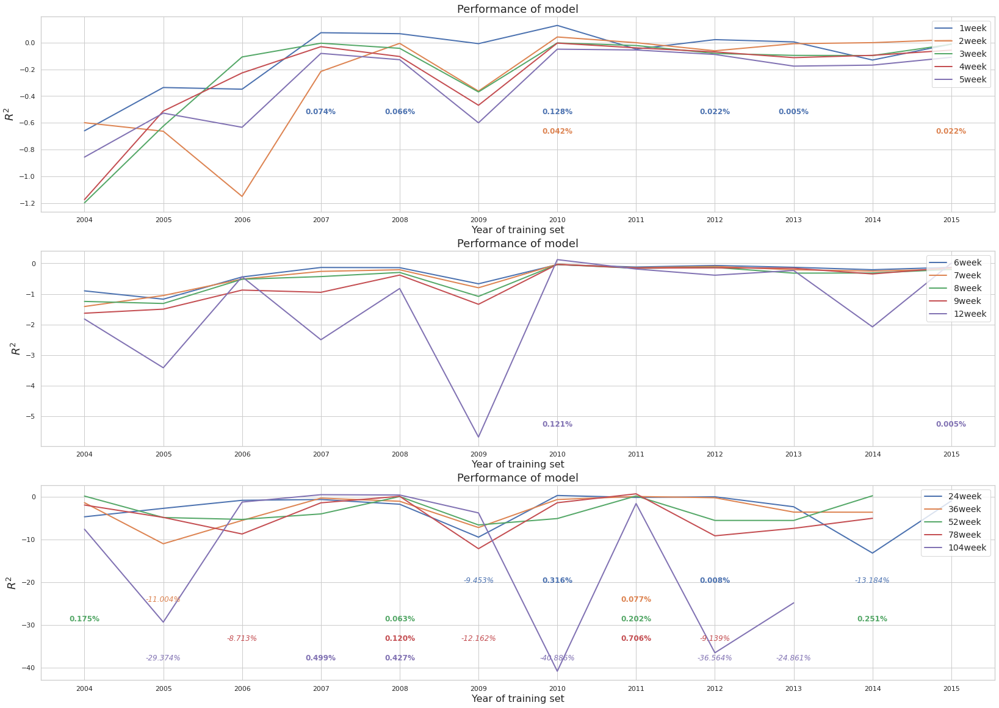

In [49]:
graph_comparison(scores_nost3)

# BEST ONE SO FAR FOR LATER LAGS (convex chosen more often explains well 2008 and 2011)

In [52]:
visualize_selected(store_nost3, year=2011) 

# both convem selected almost always by every variable, good at explaining 2011

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,convexm2,convexp2,convexp2,convexp2,convexp2,convexp2,convexp2,convexp2,convexp2,convexp2,convexp2,convexp2,convexp2,slopem10,convexp2
1,,convexm2,convexm2,convexm2,convexm2,convexm2,convexm2,convexm2,convexm2,convexm2,convexm2,convexm2,convexm2,convexp2,convexm2
2,,ra_bex_PAPER,US1YR,ra_bex_PAPER,ra_bex_PAPER,ra_bex_PAPER,ra_bex_PAPER,ra_bex_PAPER,ra_bex_PAPER,ra_bex_PAPER,US2YR,ra_bex_PAPER,ra_bex_PAPER,convexm2,ra_bex_PAPER
3,,US1YR,,US1YR,US1YR,US1YR,US1YR,US2YR,US1YR,US2YR,,US1YR,unc_bex_PAPER,unc_bex_PAPER,unc_bex_PAPER
4,,,,US2YR,US2YR,US2YR,US2YR,,US2YR,,,US2YR,US1YR,US1YR,US1YR
5,,,,,,,US3YR,,,,,,US2YR,,


In [125]:
# SO FAR SMALLER LAGS STANDARDIZATION OF EVERYTHING IS BENEFICIAL, FOR YEAR 2010 CONVEX WITH BILLS STANDARDIZED
# BILLS SEEM TO EXPLAIN WELL WITH BIG TRAINING SETS (AND LATER YEARS)

# NO STANDARDIZATION IS GREAT FOR LATER LAGS

In [126]:
# LOGARITHMIC TRANSFORMATION 
# Excluding PK and EQUITY PREMIUM variables

X_l, Y_l = log_transf_nopk(dep=False)

store_l, scores_l, agg_l, preds_l = lasso(X_l, Y_l, scor=score_off)


Scalar added is:  0.9416964


100%|██████████| 15/15 [00:20<00:00,  1.36s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_1week
1. logret_5week
2. logret_7week
3. logret_4week
4. logret_8week
5. logret_6week
6. logret_9week
7. logret_2week
8. logret_52week
9. logret_36week
10. logret_12week
11. logret_3week
12. logret_78week
13. logret_104week
14. logret_24week
Execution time for lasso is  0.0  h : 0.0  m : 20.34  s


In [127]:
sort_aggregate(agg_l, scores_l)

# ambivalent
# better: 5week (from -0.6), 6 (from -1.077), 9 (from -1.8), 12 slightly, 8 (from -1.8), 36 (from -3.5), 52 (from -6.9)
# worse: 1week (from -0.78), 4 (from -0.34), 24 (from -0.8), 78 (from -4.6), 104 (from -11)

,Ranked models,Agg Scores,,One to last,Last year
0,logret_4week,-0.198279,,-0.084749,-0.037624
1,logret_1week,-0.201393,,-0.130369,-0.011461
2,logret_2week,-0.255287,,-0.009140,0.030824
3,logret_6week,-0.258203,,-0.176648,-0.135950
4,logret_3week,-0.293649,,-0.070912,-0.021493
5,logret_7week,-0.310736,,-0.182883,-0.178210
6,logret_5week,-0.384016,,-0.145626,-0.099569
7,logret_9week,-0.709784,,-0.242900,-0.094943
8,logret_8week,-0.941544,,-0.212719,-0.164784
9,logret_24week,-1.438133,,-0.895374,-0.478418


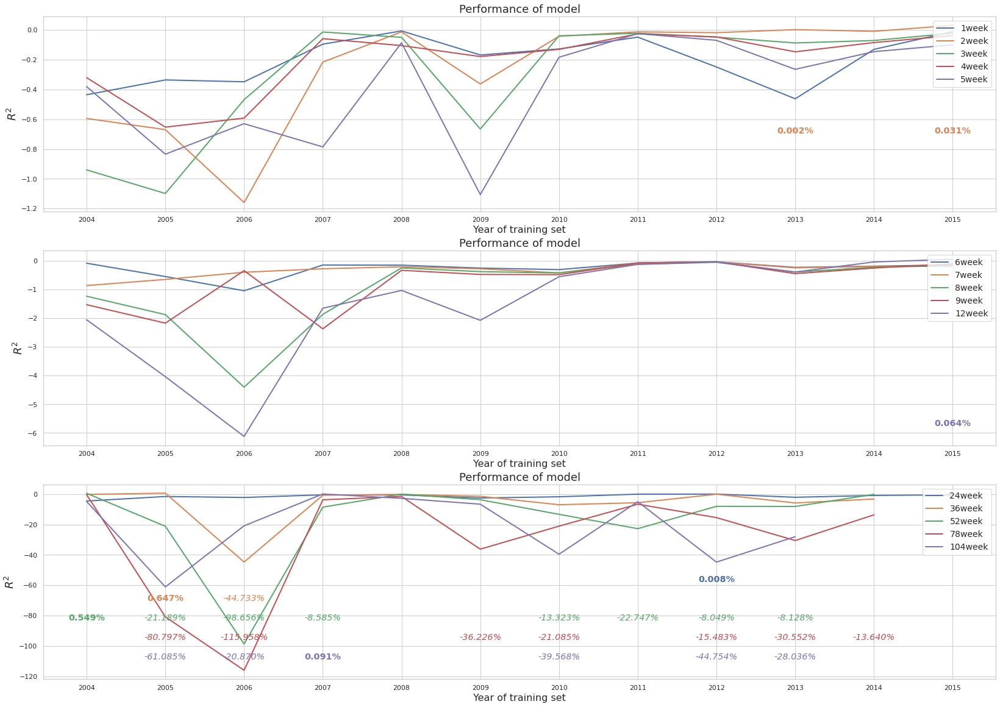

In [128]:
graph_comparison(scores_l)

# DOES NOT WORK WELL 

In [129]:
visualize_selected(store_l, year=None) 

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,convexm2 (11),convexp2 (12),convexp2 (12),convexm2 (10),convexp2 (11),convexp2 (10),convexp2 (8),convexp2 (10),convexp2 (9),convexp2 (12),convexm2 (12),convexm2 (9),convexm2 (11),convexm2 (11),convexp2 (10)
1,convexp2 (5),convexm2 (12),convexm2 (12),convexp2 (9),convexm2 (7),convexm2 (9),convexm2 (8),convexm2 (8),convexm2 (9),convexm2 (10),SENT1 (12),convexp2 (8),SENT (8),convexp2 (9),convexm2 (10)
2,,US1YR (6),SENT1 (10),US1YR (9),US1YR (7),US1YR (9),US1YR (8),US1YR (8),US1YR (8),SENT1 (10),convexp2 (11),SENT (8),convexp2 (7),slopem10 (8),slopem10 (8)
3,,SENT (6),US1YR (9),SENT (9),SENT (7),SENT (9),SENT (8),SENT (8),SENT (8),SENT (9),SENT (11),slopem10 (7),slopem10 (7),T-Bill (7),T-Bill (6)
4,,SENT1 (6),SENT (9),SENT1 (9),SENT1 (7),SENT1 (9),SENT1 (7),SENT1 (8),SENT1 (8),US1YR (8),US2YR (9),SENT1 (5),T-Bill (5),SENT (7),SENT (6)
5,,point0 (4),slopem10 (3),point0 (3),unc_bex_PAPER (1),point0 (3),US3YR (5),US2YR (5),US2YR (3),US2YR (6),US1YR (9),US1YR (4),SENT1 (3),SENT1 (7),SENT1 (5)
6,,ra_bex_PAPER (4),slopep10 (2),unc_bex_PAPER (2),US3YR (1),unc_bex_PAPER (2),unc_bex_PAPER (4),point0 (3),unc_bex_PAPER (2),point0 (5),slopem10 (5),US2YR (3),US1YR (3),US1YR (2),slopep10 (2)
7,,slopem10 (4),point0 (2),US3YR (2),point0 (1),US3YR (2),US2YR (4),unc_bex_PAPER (2),US3YR (2),slopep10 (3),slopep10 (4),unc_bex_PAPER (1),US2YR (2),slopep10 (1),US1YR (2)
8,,,US2YR (1),slopep10 (1),,US2YR (2),point0 (3),US3YR (2),point0 (2),slopem10 (2),slopem5 (2),US3YR (1),,,
9,,,,slopem10 (1),,slopem10 (2),ra_bex_PAPER (3),slopem10 (1),slopem10 (1),slopem5 (2),slopep5 (1),T-Bill (1),,,


In [130]:
# LOGARITHMIC TRANSFORMATION  !!!!!!!!!!!!!!!!
# (best one so far)

# Excluding PK and EQUITY PREMIUM variables from standardization, removing CONVEX

X_l, Y_l = log_transf()

store_l, scores_l, agg_l, preds_l = lasso(X_l, Y_l, scor=score_off)


Scalar added is:  -2.998946389647


100%|██████████| 15/15 [01:22<00:00,  5.50s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_1week
1. logret_2week
2. logret_4week
3. logret_5week
4. logret_6week
5. logret_7week
6. logret_3week
7. logret_8week
8. logret_9week
9. logret_12week
10. logret_36week
11. logret_24week
12. logret_52week
13. logret_78week
14. logret_104week
Execution time for lasso is  0.0  h : 1.0  m : 22.49  s


In [131]:
sort_aggregate(agg_l, scores_l)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.009569,,0.234856,0.058755
1,logret_3week,-0.076313,,-0.027437,-0.000633
2,logret_2week,-0.114742,,0.024749,0.006399
3,logret_4week,-0.216628,,-0.031157,-0.005971
4,logret_6week,-0.234345,,0.025354,0.005202
5,logret_5week,-0.237289,,-0.005275,0.002238
6,logret_7week,-0.252510,,0.043063,0.004852
7,logret_8week,-0.470966,,0.046375,-0.019709
8,logret_9week,-0.499213,,0.037835,-0.025791
9,logret_12week,-1.026031,,0.047857,-0.025522


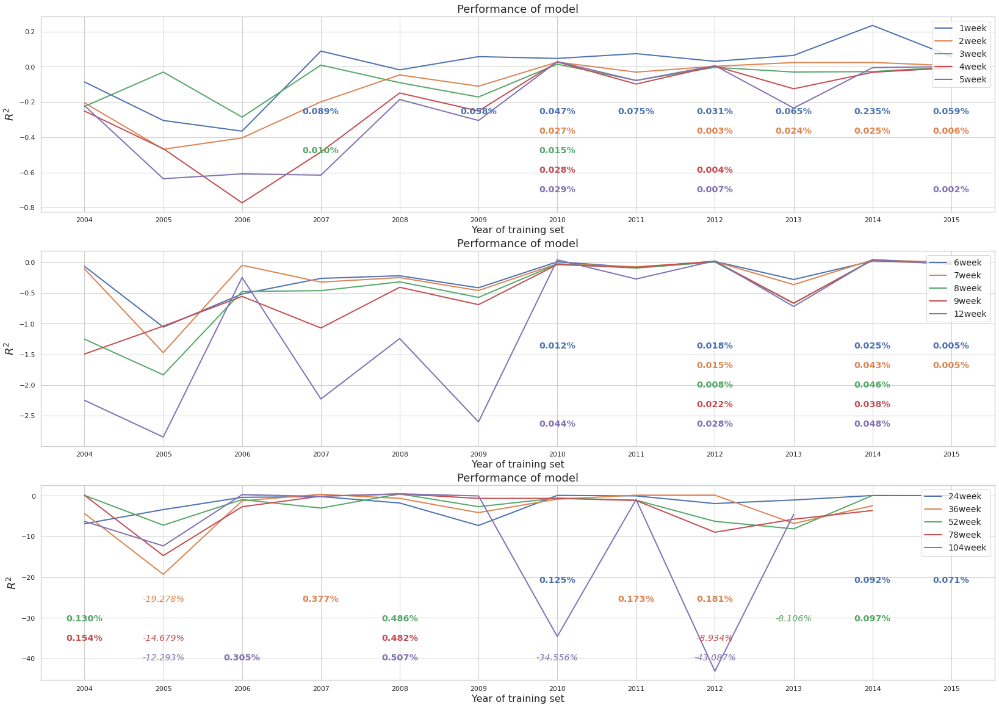

In [132]:
graph_comparison(scores_l)

# WORKS VERY WELL!!!
# Without Log transformation (only dropping Convex) it does not work so well 
# and ra_bex - US-Bills - mcsi remain more selected than slopep10 (very much selected here)



In [133]:
visualize_selected(store_l, year=None) 

# SLOPEP10 - T-BILLS (1-2) - SENT (FOR LAG 6-8-52) - RA-BEX/UNC-BEX 

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,slopep10 (12),slopep10 (11),slopep10 (12),US1YR (11),slopep10 (10),SENT1 (12),SENT1 (12),SENT1 (11),US1YR (11),slopep10 (10),mcsi (12),slopem10 (9),SENT (11),slopep5 (11),slopep5 (10)
1,ra_bex_PAPER (9),US1YR (11),US1YR (12),slopep10 (10),US1YR (10),slopep10 (10),slopep10 (10),US1YR (10),slopep10 (11),US2YR (9),US2YR (10),SENT (9),ra_bex_PAPER (9),unc_bex_% (11),slopem10 (10)
2,slopem10 (9),ra_bex_PAPER (5),US2YR (4),SENT1 (8),SENT1 (10),US1YR (10),US1YR (9),slopep10 (9),SENT1 (8),US1YR (8),SENT (9),US2YR (7),slopep5 (8),US1YR (11),slopep10 (10)
3,US1YR (9),slopem10 (4),SENT1 (3),ra_bex_PAPER (3),US2YR (2),US2YR (1),US2YR (4),US2YR (3),US2YR (6),mcsi (7),SENT1 (8),slopep10 (6),slopem10 (7),SENT (11),unc_bex_% (10)
4,T-Bill (6),SENT (3),slopem10 (3),slopem10 (2),unc_bex_PAPER (1),slopem10 (1),ra_bex_PAPER (2),slopep5 (1),unc_bex_% (4),SENT1 (7),US3YR (7),ra_bex_PAPER (6),US1YR (7),slopep10 (10),US1YR (10)
5,unc_bex_% (3),T-Bill (3),ra_bex_PAPER (3),US2YR (1),US3YR (1),ra_bex_PAPER (1),US3YR (1),unc_bex_% (1),mcsi (4),unc_bex_% (4),slopep10 (6),mcsi (6),T-Bill (5),point0 (10),mcsi (10)
6,SENT (2),US2YR (1),SENT (1),unc_bex_PAPER (1),T-Bill (1),,slopem10 (1),mcsi (1),slopep5 (3),SENT (4),USInd (6),SENT1 (6),unc_bex_% (5),slopem10 (10),USInst (9)
7,mcsi (1),SENT1 (1),,US3YR (1),slopem10 (1),,,SENT (1),US3YR (3),US3YR (4),ra_bex_PAPER (5),US1YR (5),mcsi (5),mcsi (9),point0 (8)
8,,,,T-Bill (1),ra_bex_PAPER (1),,,slopem10 (1),SENT (2),USInst (2),slopem10 (5),USInd (5),SENT1 (5),US10YR (9),US10YR (8)
9,,,,SENT (1),,,,,slopem10 (2),slopep5 (1),US1YR (5),US3YR (5),USInd (5),ra_bex_PAPER (7),USInd (7)


In [134]:
# LOGARITHMIC TRANSFORMATION
# Standardizing Dependent

X_l, Y_l = log_transf_nopk(dep=True)

store_l3, scores_l3, agg_l3, preds_l3 = lasso(X_l, Y_l, scor=score_off)


Scalar added is:  0.9416964


100%|██████████| 15/15 [00:20<00:00,  1.37s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_1week
1. logret_5week
2. logret_4week
3. logret_7week
4. logret_8week
5. logret_9week
6. logret_6week
7. logret_2week
8. logret_52week
9. logret_36week
10. logret_12week
11. logret_3week
12. logret_78week
13. logret_104week
14. logret_24week
Execution time for lasso is  0.0  h : 0.0  m : 20.54  s


In [135]:
sort_aggregate(agg_l3, scores_l3)

# DOES NOT WORK

,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.199279,,-0.135630,-0.014377
1,logret_2week,-0.250931,,-0.010890,0.028570
2,logret_4week,-0.282140,,-0.089069,-0.043413
3,logret_3week,-0.287420,,-0.074941,-0.026341
4,logret_6week,-0.338142,,-0.184051,-0.147676
5,logret_5week,-0.406412,,-0.154121,-0.108852
6,logret_7week,-0.470463,,-0.193350,-0.188814
7,logret_9week,-0.572648,,-0.251738,-0.102755
8,logret_8week,-0.842634,,-0.226132,-0.176284
9,logret_12week,-1.086261,,-0.042865,0.062831


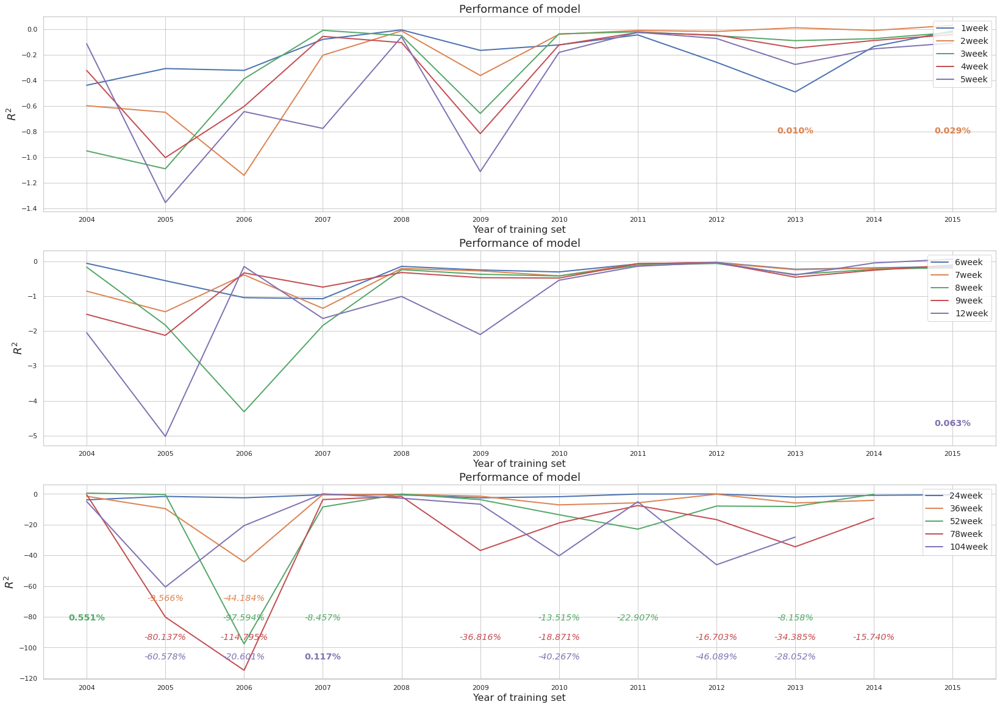

In [136]:
graph_comparison(scores_l3)

# Feature engineering

## Spline Transformer

#### Knots=3 and Degree=2

In [3]:
knots = 3
deg = 2
n_add_paramet=len(X.columns)*(knots+deg-1)
col_names = [str(i) for i in range(1, n_add_paramet+1)]

In [129]:
# NO STANDARDIZATION

X, Y = reinitialize()

# Feature Engineering
trans_ = {SplineTransformer(n_knots=knots, degree=deg): [col_names, True]}
X, reg = transform(trans_, X, X.columns.to_list())

selec_sp, scores_sp, agg_sp, preds_sp = lasso(X, Y, light_=True, thresh_prop=2.5, scor=score_off)   # light_=True

100%|██████████| 15/15 [01:28<00:00,  5.93s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_1week
1. logret_2week
2. logret_3week
3. logret_6week
4. logret_7week
5. logret_4week
6. logret_5week
7. logret_8week
8. logret_9week
9. logret_12week
10. logret_104week
11. logret_78week
12. logret_52week
13. logret_36week
14. logret_24week
Execution time for lasso is  0.0  h : 1.0  m : 28.94  s


In [130]:
sort_aggregate(agg_sp, scores_sp)

,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.196251,,-0.248765,-0.011461
1,logret_2week,-0.477288,,-0.602914,-0.153499
2,logret_4week,-0.778343,,-0.060356,-0.083702
3,logret_3week,-0.849698,,-0.913223,-0.496644
4,logret_5week,-0.927148,,-0.064367,-0.156263
5,logret_6week,-1.035536,,-0.057824,-0.188872
6,logret_7week,-1.276535,,-0.296458,-0.225422
7,logret_8week,-1.315351,,-0.022612,-0.287938
8,logret_9week,-1.406728,,-0.004625,-0.380768
9,logret_36week,-1.825925,,0.227520,-4.318717


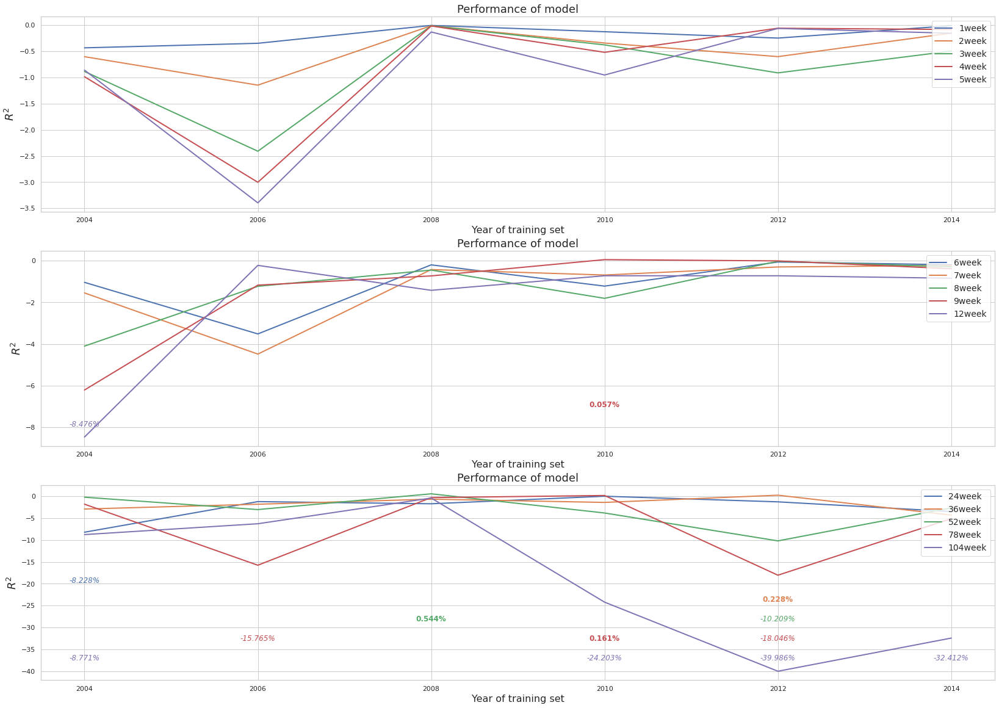

In [131]:
graph_comparison(scores_sp, light=True)

In [143]:
visualize_selected(selec_sp, year=None, light=True, to_print=10) 

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,convexm2 (6),convexm2 (6),convexm2 (5),convexp2 (5),convexp2 (5),convexp2 (4),convexp2 (5),convexp2 (5),convexp2 (6),convexp2 (6),convexp2 (6),convexp2 (6),convexp2 (6),convexp2 (6),convexp2 (6)
1,convexp2 (2),convexp2 (4),convexp2 (4),convexm2 (5),convexm2 (4),convexm2 (4),convexm2 (5),convexm2 (5),convexm2 (6),convexm2 (6),convexm2 (6),convexm2 (6),convexm2 (6),convexm2 (6),convexm2 (6)
2,,,mcsi (2),USInst (4),mcsi (4),mcsi (4),USInst (5),mcsi (4),mcsi (6),mcsi (6),US3YR (6),USInst (6),mcsi (6),US1YR (6),mcsi (6)
3,,,US2YR (1),mcsi (3),USInst (3),USInst (3),mcsi (4),USInst (4),USInst (6),USInst (6),mcsi (6),USInd (6),SENT (6),mcsi (6),USInst (6)
4,,,point0 (1),USInd (2),US1YR (3),US1YR (3),US2YR (4),US2YR (4),US2YR (5),USInd (5),USInst (6),mcsi (5),USInst (6),USInst (6),US1YR (5)
5,,,1 (1),US1YR (2),USInd (2),7 (2),USInd (4),USInd (4),USInd (5),slopep10 (4),USInd (6),ra_bex_PAPER (4),USInd (6),SENT (5),USInd (4)
6,,,7 (1),US2YR (2),US2YR (2),USInd (2),2 (2),US1YR (3),US3YR (4),US2YR (4),US2YR (4),SENT (4),US1YR (5),USInd (4),T-Bill (2)
7,,,,point0 (1),1 (1),US2YR (2),US3YR (2),US3YR (2),ra_bex_PAPER (3),US3YR (4),slopep10 (3),109 (4),ra_bex_PAPER (4),slopem10 (4),slopep10 (2)
8,,,,1 (1),7 (1),point0 (1),slopep10 (2),1 (1),SENT1 (3),SENT1 (4),144 (3),US3YR (4),US2YR (3),ra_bex_PAPER (4),SENT1 (1)
9,,,,7 (1),ra_bex_PAPER (1),2 (1),ra_bex_PAPER (2),7 (1),slopep10 (1),17 (3),ra_bex_PAPER (3),unc_bex_% (3),US5YR (2),SENT1 (1),ra_bex_PAPER (1)


In [142]:
print_common(selec_sp, X, to_print=10)  # prints most common and explains them

102 is a spline transformation of 2
109 is a spline transformation of 4
10 is a spline transformation of slopep2
25 is a spline transformation of slopep10
7 is a spline transformation of slopem2
17 is a spline transformation of slopep5
137 is a spline transformation of 11
1 is a spline transformation of point0
11 is a spline transformation of slopep2
158 is a spline transformation of 16


In [91]:
# STANDARDIZING WITH ROBUST SCALER - All regressors (and their splines)

X, Y = reinitialize()

# Standardize 
reg = [X.columns.to_list()]
prop_nost = {RobustScaler(): reg + f_spline(reg, X)}

# Feature Engineering
trans_ = {SplineTransformer(n_knots=knots, degree=deg): [col_names, True]}
X, dep = transform(trans_, X, X.columns.to_list())

sel_spls, scores_spls, agg_spls, preds_spls = lasso(X, Y, scaler=prop_nost, light_=True, thresh_prop=2.5, scor=score_off)

100%|██████████| 15/15 [01:07<00:00,  4.47s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_12week
1. logret_5week
2. logret_24week
3. logret_2week
4. logret_78week
5. logret_36week
6. logret_6week
7. logret_7week
8. logret_4week
9. logret_8week
10. logret_3week
11. logret_9week
12. logret_52week
13. logret_1week
14. logret_104week
Execution time for lasso is  0.0  h : 1.0  m : 7.1  s


In [92]:
sort_aggregate(agg_spls, scores_spls)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.171285,,-0.062556,-0.027934
1,logret_2week,-0.354979,,-0.212536,-0.145871
2,logret_3week,-0.883428,,-0.950142,-0.286109
3,logret_4week,-1.058280,,-0.546233,-0.751367
4,logret_5week,-1.085464,,-0.789820,-0.660585
5,logret_6week,-1.454108,,-0.882439,-1.457527
6,logret_7week,-1.605699,,-1.046274,-1.492917
7,logret_8week,-2.146698,,-1.209016,-2.879215
8,logret_9week,-2.197585,,-1.341916,-2.763838
9,logret_12week,-2.987275,,0.000364,-6.023127


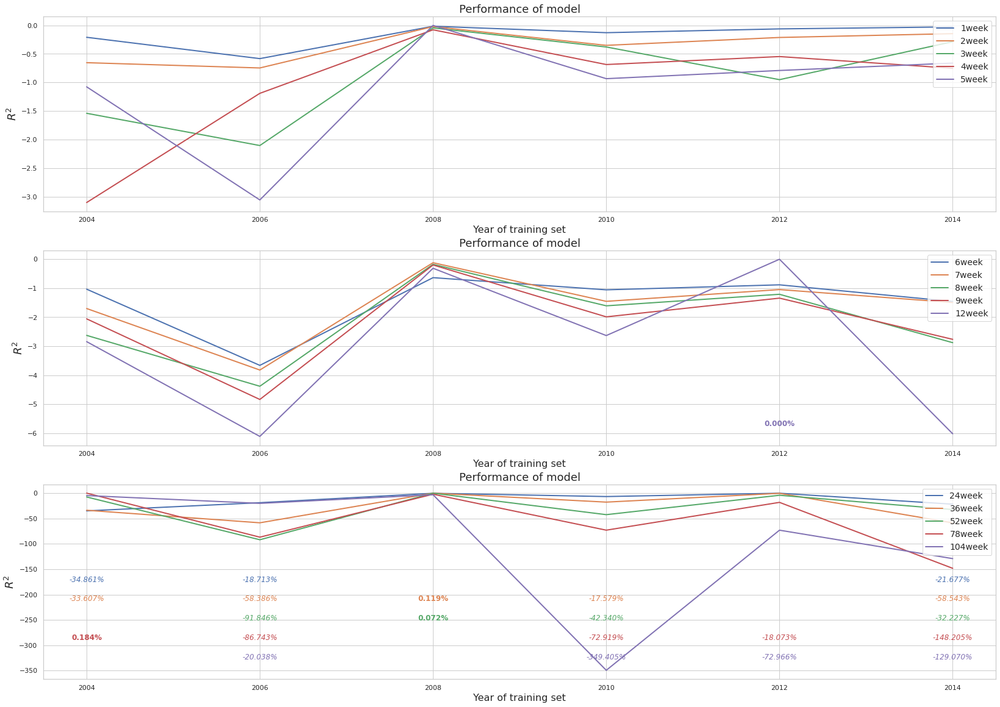

In [93]:
graph_comparison(scores_spls, light=True)

In [94]:
visualize_selected(sel_spls, year=None, light=True) 

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,49 (3),2 (2),convexp2 (1),convexp2 (2),convexp2 (2),1 (3),convexp2 (2),convexp2 (2),convexp2 (2),convexp2 (2),55 (3),55 (3),convexm2 (3),convexm2 (5),convexp2 (6)
1,74 (3),33 (1),convexm2 (1),point0 (2),convexm2 (2),7 (3),convexm2 (2),convexm2 (2),convexm2 (2),convexm2 (2),convexp2 (2),convexp2 (2),USInst (3),49 (5),convexm2 (6)
2,2 (2),14 (1),2 (1),2 (1),mcsi (2),convexp2 (2),mcsi (2),mcsi (2),mcsi (2),mcsi (2),convexm2 (2),convexm2 (2),2 (3),convexp2 (4),49 (5)
3,34 (2),55 (1),33 (1),33 (1),55 (2),convexm2 (2),55 (2),point0 (2),55 (2),USInst (2),USInst (2),mcsi (2),49 (3),USInst (3),USInst (4)
4,58 (2),23 (1),68 (1),68 (1),2 (1),mcsi (2),2 (1),1 (2),USInst (1),2 (2),2 (2),USInd (2),convexp2 (2),2 (3),2 (4)
5,convexm2 (2),15 (1),55 (1),23 (1),33 (1),55 (2),33 (1),7 (2),2 (1),89 (2),89 (2),2 (2),mcsi (2),55 (3),55 (4)
6,mcsi (2),convexp2 (1),23 (1),15 (1),68 (1),point0 (2),43 (1),2 (1),33 (1),14 (1),point0 (2),85 (2),USInd (2),58 (3),34 (4)
7,89 (2),convexm2 (1),point0 (1),convexm2 (1),point0 (1),2 (1),68 (1),33 (1),43 (1),33 (1),1 (2),89 (2),14 (2),mcsi (2),89 (3)
8,33 (1),mcsi (1),1 (1),mcsi (1),1 (1),33 (1),23 (1),43 (1),68 (1),68 (1),7 (2),SENT (1),29 (2),14 (2),58 (3)
9,14 (1),34 (1),7 (1),34 (1),7 (1),43 (1),15 (1),68 (1),89 (1),55 (1),mcsi (1),USInst (1),89 (2),15 (2),mcsi (2)


In [95]:
print_common(sel_spls, X, to_print=10)

2 is a spline transformation of point0
55 is a spline transformation of VIX
49 is a spline transformation of unc_bex_%
89 is a spline transformation of USInst
34 is a spline transformation of convexm2
58 is a spline transformation of US1YR
33 is a spline transformation of convexm2
23 is a spline transformation of slopem10
74 is a spline transformation of US10YR
69 is a spline transformation of US5YR


In [96]:
# STANDARDIZATION EXCLUDING DEPENDENT, PK and BILLS VARIABLES (and respective Splines)

X, Y = reinitialize()

# Standardize 
var = ['mcsi', 'VIX', 'USInst', 'USInd']
ra = X.columns[X.columns.str.contains(r'\Bbex\B')].to_list()   #['ra_bex_PAPER', 'unc_bex_PAPER', 'unc_bex_%']
sent = ['SENT', 'SENT1']

prop_nost2 = {RobustScaler(): [var + ra + f_spline([var, ra], X)],  MaxAbsScaler(): [sent + f_spline([sent], X)]}

# Feature Engineering
trans_ = {SplineTransformer(n_knots=knots, degree=deg): [col_names, True]}
X, reg = transform(trans_, X, X.columns.to_list())
    
store_spl3, scores_spl3, agg_spl3, preds_spl3 = lasso(X, Y, scaler=prop_nost2, light_=True, thresh_prop=2, scor=score_off)


100%|██████████| 15/15 [01:33<00:00,  6.26s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_1week
1. logret_2week
2. logret_6week
3. logret_3week
4. logret_7week
5. logret_4week
6. logret_5week
7. logret_8week
8. logret_9week
9. logret_12week
10. logret_104week
11. logret_78week
12. logret_52week
13. logret_36week
14. logret_24week
Execution time for lasso is  0.0  h : 1.0  m : 33.92  s


In [97]:
sort_aggregate(agg_spl3, scores_spl3)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.196342,,-0.248765,-0.011461
1,logret_2week,-0.481333,,-0.602914,-0.208521
2,logret_4week,-0.779284,,-0.060975,-0.089440
3,logret_3week,-0.877452,,-0.913223,-0.496464
4,logret_5week,-0.926831,,-0.076753,-0.164731
5,logret_6week,-1.038899,,-0.271565,-0.190220
6,logret_7week,-1.226713,,-0.010808,-0.226338
7,logret_8week,-1.299381,,-0.030073,-0.287978
8,logret_9week,-1.450864,,-0.002803,-0.410507
9,logret_36week,-1.828486,,0.227285,-4.341655


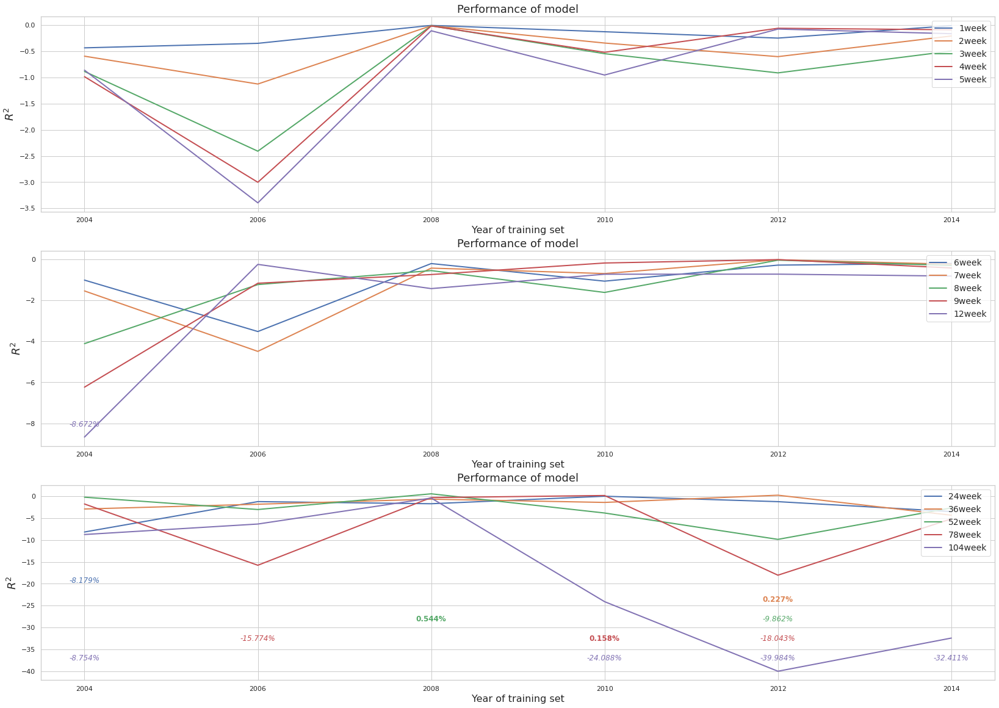

In [98]:
graph_comparison(scores_spl3, light=True)

In [99]:
visualize_selected(store_spl3, year=None, light=True) 

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,convexm2 (6),convexm2 (5),convexm2 (5),convexp2 (5),convexp2 (5),convexp2 (4),convexp2 (5),convexp2 (5),convexp2 (6),convexp2 (6),convexp2 (6),convexp2 (6),convexp2 (6),convexp2 (6),convexp2 (6)
1,convexp2 (2),convexp2 (4),convexp2 (4),convexm2 (5),convexm2 (4),convexm2 (4),convexm2 (5),convexm2 (5),convexm2 (6),convexm2 (6),convexm2 (6),convexm2 (6),convexm2 (6),convexm2 (6),convexm2 (6)
2,,point0 (1),mcsi (2),USInst (4),mcsi (4),mcsi (4),USInst (5),mcsi (4),mcsi (6),mcsi (6),US3YR (6),USInst (6),mcsi (6),US1YR (6),mcsi (6)
3,,1 (1),US2YR (1),mcsi (3),USInst (3),USInst (3),mcsi (4),USInst (4),USInst (6),USInst (6),mcsi (6),USInd (6),SENT (6),mcsi (6),USInst (6)
4,,7 (1),1 (1),USInd (2),US1YR (3),US1YR (3),US2YR (4),US2YR (4),US2YR (5),USInd (5),USInst (6),mcsi (5),USInst (6),USInst (6),US1YR (5)
5,,,7 (1),US1YR (2),USInd (2),point0 (2),USInd (4),USInd (4),USInd (5),slopep10 (4),USInd (6),ra_bex_PAPER (4),USInd (6),SENT (5),USInd (4)
6,,,,US2YR (2),US2YR (2),2 (2),US3YR (3),US1YR (3),US3YR (4),US2YR (4),US2YR (4),SENT (4),US1YR (5),USInd (4),T-Bill (2)
7,,,,point0 (1),1 (1),7 (2),ra_bex_PAPER (2),US3YR (3),ra_bex_PAPER (2),US3YR (4),slopep10 (3),SENT1 (4),ra_bex_PAPER (4),slopem10 (4),slopep10 (2)
8,,,,1 (1),7 (1),USInd (2),SENT (2),point0 (1),SENT1 (2),SENT1 (4),144 (3),109 (4),US2YR (3),ra_bex_PAPER (4),SENT1 (1)
9,,,,7 (1),ra_bex_PAPER (1),US2YR (2),SENT1 (2),1 (1),slopep10 (1),17 (3),ra_bex_PAPER (3),US3YR (4),US5YR (2),SENT1 (1),ra_bex_PAPER (1)


In [100]:
print_common(store_spl3, X, to_print=10)

102 is a spline transformation of 2
109 is a spline transformation of 4
7 is a spline transformation of slopem2
25 is a spline transformation of slopep10
10 is a spline transformation of slopep2
1 is a spline transformation of point0
17 is a spline transformation of slopep5
137 is a spline transformation of 11
158 is a spline transformation of 16
11 is a spline transformation of slopep2


In [101]:
# STANDARDIZATION EXCLUDING DEPENDENT and PK (and respective Splines)

X, Y = reinitialize()

# Standardize 
var = ['mcsi', 'VIX', 'USInst', 'USInd']
ra = X.columns[X.columns.str.contains(r'\Bbex\B')].to_list()   #['ra_bex_PAPER', 'unc_bex_PAPER', 'unc_bex_%']

sent = ['SENT', 'SENT1']

us = X.columns[X.columns.str.contains(r'YR\b')].to_list()  #['US1YR', 'US2YR', 'US3YR', 'US5YR', 'US10YR', 'T-Bill']
us.append('T-Bill')

st_2 = {RobustScaler(): var + ra + f_spline([var, ra], X),  
        MaxAbsScaler(): sent + f_spline([sent], X), StandardScaler(): us + f_spline([us], X)}

# Feature Engineering
trans_ = {SplineTransformer(n_knots=knots, degree=deg): [col_names, True]}
X, reg = transform(trans_, X, X.columns.to_list())
    
store_s33, scores_s33, agg_s33, preds_s33 = lasso(X, Y, scaler=st_2, light_=True, thresh_prop=2, scor=score_off)


100%|██████████| 15/15 [01:31<00:00,  6.11s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_1week
1. logret_2week
2. logret_6week
3. logret_3week
4. logret_4week
5. logret_7week
6. logret_5week
7. logret_8week
8. logret_9week
9. logret_12week
10. logret_104week
11. logret_78week
12. logret_52week
13. logret_36week
14. logret_24week
Execution time for lasso is  0.0  h : 1.0  m : 31.66  s


In [102]:
sort_aggregate(agg_s33, scores_s33)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.196257,,-0.248765,-0.011461
1,logret_2week,-0.479784,,-0.604375,-0.154241
2,logret_4week,-0.777852,,-0.061019,-0.075753
3,logret_3week,-0.885991,,-0.913223,-0.547290
4,logret_5week,-0.923685,,-0.066506,-0.156155
5,logret_6week,-1.036104,,-0.272453,-0.187259
6,logret_7week,-1.166090,,-0.295315,-0.225790
7,logret_8week,-1.298112,,-0.022635,-0.288880
8,logret_9week,-1.400686,,-0.013565,-0.409013
9,logret_36week,-1.829592,,0.231475,-4.343700


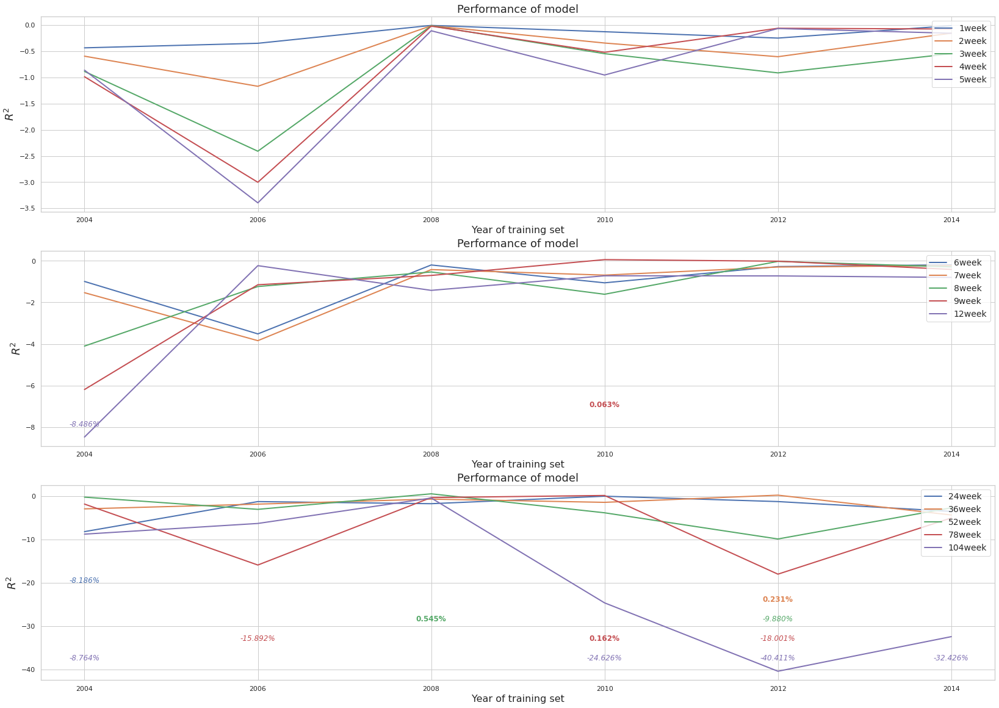

In [103]:
graph_comparison(scores_s33, light=True)

In [104]:
visualize_selected(store_s33, year=None, light=True) 

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,convexm2 (6),convexm2 (6),convexm2 (5),convexp2 (5),convexp2 (5),convexp2 (4),convexp2 (6),convexp2 (5),convexp2 (6),convexp2 (6),convexp2 (6),convexp2 (6),convexp2 (6),convexp2 (6),convexp2 (6)
1,convexp2 (2),convexp2 (4),convexp2 (4),convexm2 (5),convexm2 (4),convexm2 (4),convexm2 (5),convexm2 (5),convexm2 (6),convexm2 (6),convexm2 (6),convexm2 (6),convexm2 (6),convexm2 (6),convexm2 (6)
2,,,mcsi (2),USInst (4),mcsi (4),mcsi (4),USInst (5),mcsi (4),mcsi (6),mcsi (6),US3YR (6),USInst (6),mcsi (6),US1YR (6),mcsi (6)
3,,,US2YR (1),mcsi (3),USInst (3),USInst (3),mcsi (4),USInst (4),USInst (6),USInst (6),mcsi (6),USInd (6),SENT (6),USInst (6),USInst (6)
4,,,1 (1),USInd (2),US1YR (3),US1YR (3),US2YR (4),US2YR (4),US2YR (5),USInd (5),USInst (6),mcsi (5),USInst (6),mcsi (5),US1YR (5)
5,,,7 (1),US1YR (2),USInd (2),point0 (2),USInd (4),USInd (4),US3YR (5),slopep10 (4),USInd (6),ra_bex_PAPER (4),USInd (6),SENT (5),USInd (4)
6,,,,US2YR (2),US2YR (2),2 (2),US3YR (3),US3YR (3),USInd (5),US2YR (4),US2YR (4),SENT (4),US1YR (5),USInd (4),T-Bill (2)
7,,,,point0 (1),1 (1),7 (2),slopep10 (2),US1YR (2),ra_bex_PAPER (3),US3YR (4),slopep10 (3),109 (4),ra_bex_PAPER (4),slopem10 (4),slopep10 (2)
8,,,,1 (1),7 (1),USInd (2),ra_bex_PAPER (2),point0 (1),SENT1 (3),SENT1 (4),ra_bex_PAPER (3),US3YR (4),US2YR (3),ra_bex_PAPER (4),SENT1 (1)
9,,,,7 (1),ra_bex_PAPER (1),1 (1),US5YR (2),1 (1),slopep10 (1),17 (3),SENT1 (3),unc_bex_% (3),US5YR (2),SENT1 (1),ra_bex_PAPER (1)


In [105]:
print_common(store_s33, X, to_print=10)

102 is a spline transformation of 2
109 is a spline transformation of 4
10 is a spline transformation of slopep2
25 is a spline transformation of slopep10
7 is a spline transformation of slopem2
17 is a spline transformation of slopep5
137 is a spline transformation of 11
158 is a spline transformation of 16
1 is a spline transformation of point0
11 is a spline transformation of slopep2


In [106]:
# LOGARITHMIC TRANSFORMATION
# excluding PK variables and Dependent
    
X_l, Y_l = log_transf_nopk(dep=False)

# Feature Engineering
trans_ = {SplineTransformer(n_knots=knots, degree=deg): [col_names, True]}
X_l, reg = transform(trans_, X_l, X.columns.to_list())

store_spline_l2, scores_spline_l2, agg_spline_l2, preds_spline_l2 = lasso(X_l, Y_l, light_=True, thresh_prop=2, scor=score_off)


Scalar added is:  0.9416964


100%|██████████| 15/15 [01:11<00:00,  4.74s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_1week
1. logret_4week
2. logret_5week
3. logret_6week
4. logret_7week
5. logret_3week
6. logret_2week
7. logret_8week
8. logret_52week
9. logret_78week
10. logret_104week
11. logret_36week
12. logret_9week
13. logret_24week
14. logret_12week
Execution time for lasso is  0.0  h : 1.0  m : 11.15  s


In [107]:
sort_aggregate(agg_spline_l2, scores_spline_l2)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_5week,-0.137475,,-0.069404,-0.099417
1,logret_1week,-0.196255,,-0.248765,-0.011461
2,logret_6week,-0.226375,,-0.070743,-0.135586
3,logret_7week,-0.258570,,-0.114840,-0.171671
4,logret_2week,-0.288544,,-0.018203,0.028688
5,logret_8week,-0.306554,,-0.109490,-0.164687
6,logret_4week,-0.532916,,-0.056697,-0.037685
7,logret_3week,-0.622026,,-0.053388,-0.025204
8,logret_9week,-0.744990,,-0.072914,-0.078726
9,logret_12week,-0.927016,,-0.029957,-1.483947


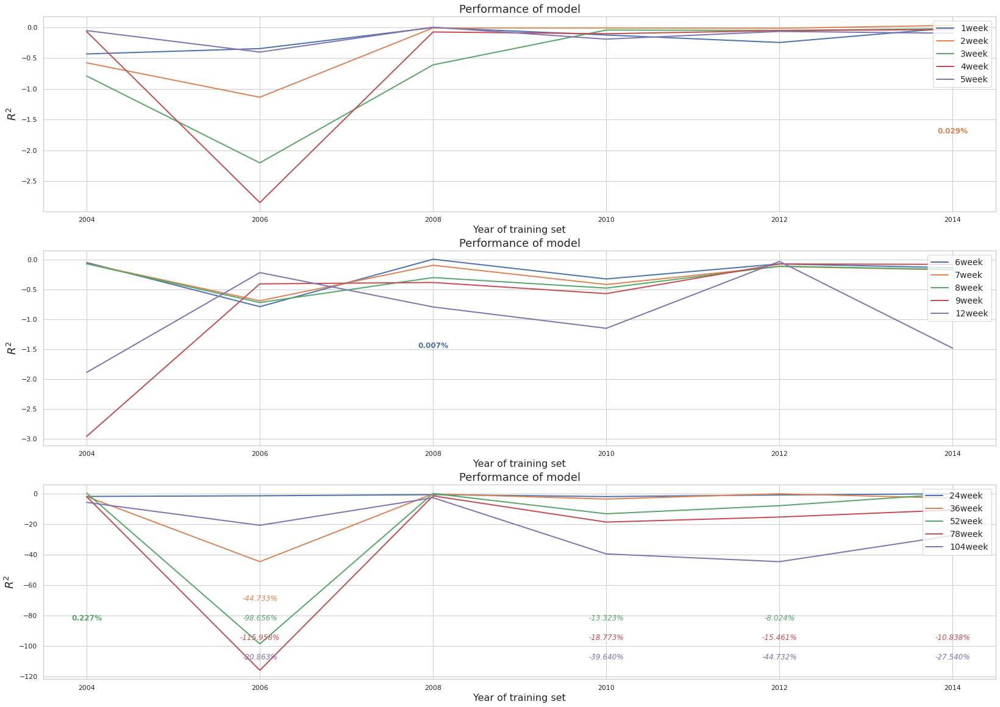

In [108]:
graph_comparison(scores_spline_l2, light=True)

In [109]:
visualize_selected(store_spline_l2, year=None, light=True) 

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,convexm2 (6),convexp2 (6),convexp2 (5),convexp2 (4),convexp2 (4),convexp2 (5),convexp2 (5),convexp2 (5),convexp2 (6),convexp2 (6),convexp2 (6),convexp2 (6),convexm2 (6),convexm2 (6),convexp2 (6)
1,convexp2 (2),convexm2 (6),convexm2 (5),convexm2 (3),convexm2 (4),convexm2 (4),convexm2 (4),convexm2 (5),convexm2 (6),convexm2 (6),convexm2 (6),convexm2 (6),convexp2 (4),convexp2 (5),convexm2 (6)
2,,US1YR (3),US1YR (3),US1YR (3),US1YR (4),US1YR (4),US1YR (4),US1YR (5),US1YR (6),US1YR (6),SENT1 (6),SENT (6),SENT (4),SENT1 (5),slopem10 (5)
3,,SENT (3),SENT (3),SENT (3),SENT (4),SENT (4),SENT (4),SENT (5),SENT1 (6),SENT1 (6),145 (5),SENT1 (4),slopem10 (3),SENT (4),SENT (3)
4,,SENT1 (3),SENT1 (3),SENT1 (3),SENT1 (4),SENT1 (4),SENT1 (4),SENT1 (5),SENT (5),slopep10 (5),158 (5),slopem10 (4),SENT1 (2),slopem10 (4),SENT1 (3)
5,,point0 (2),slopem10 (2),78 (1),78 (1),125 (1),78 (1),slopep10 (2),137 (3),137 (5),137 (4),US1YR (4),T-Bill (2),US1YR (3),T-Bill (3)
6,,slopem10 (2),1 (1),slopep2 (1),82 (1),137 (1),82 (1),125 (2),145 (3),145 (5),US1YR (4),US2YR (3),US1YR (2),T-Bill (3),US1YR (2)
7,,ra_bex_PAPER (2),7 (1),slopem10 (1),slopep10 (1),point0 (1),slopep10 (1),78 (1),slopep10 (2),17 (4),SENT (4),4 (2),109 (1),67 (1),67 (1)
8,,,,,125 (1),1 (1),17 (1),82 (1),125 (2),87 (3),slopep10 (3),110 (1),116 (1),145 (1),145 (1)
9,,,,,137 (1),7 (1),32 (1),137 (1),158 (2),125 (3),125 (3),137 (1),137 (1),146 (1),


In [110]:
print_common(store_spline_l2, X, to_print=10)

137 is a spline transformation of 11
145 is a spline transformation of 13
125 is a spline transformation of 8
158 is a spline transformation of 16
17 is a spline transformation of slopep5
10 is a spline transformation of slopep2
4 is a spline transformation of point0
25 is a spline transformation of slopep10
78 is a spline transformation of mcsi
157 is a spline transformation of 16


In [112]:
# LOGARITHMIC TRANSFORMATION 
# Inlcuding all regressors and excluding Convex

X_l, Y_l = log_transf()

knots = 3
deg = 2
n_add_paramet=len(X_l.columns)*(knots+deg-1)
col_names = [str(i) for i in range(1, n_add_paramet+1)]

# Feature Engineering
trans_ = {SplineTransformer(n_knots=knots, degree=deg): [col_names, True]}
X_l, reg = transform(trans_, X_l, X_l.columns.to_list())

store_spline_ls5, scores_spline_ls5, agg_spline_ls5, preds_spline_ls5 = lasso(X_l, Y_l, light_=True, thresh_prop=2, scor=score_off)


Scalar added is:  -2.998946389647


100%|██████████| 15/15 [10:44<00:00, 42.98s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_6week
1. logret_1week
2. logret_7week
3. logret_5week
4. logret_2week
5. logret_4week
6. logret_3week
7. logret_8week
8. logret_9week
9. logret_12week
10. logret_36week
11. logret_24week
12. logret_52week
13. logret_104week
14. logret_78week
Execution time for lasso is  0.0  h : 10.0  m : 44.69  s


In [113]:
sort_aggregate(agg_spline_ls5, scores_spline_ls5)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,0.022789,,0.065028,0.143784
1,logret_2week,-0.098184,,-0.005738,0.023327
2,logret_3week,-0.167312,,-0.022858,-0.002133
3,logret_4week,-0.312285,,-0.034085,-0.018909
4,logret_5week,-0.357218,,-0.040048,0.031067
5,logret_6week,-0.419885,,-0.088087,0.027409
6,logret_7week,-0.439201,,-0.061941,-0.072860
7,logret_8week,-0.494765,,-0.038758,-0.143643
8,logret_9week,-0.779961,,0.008938,-0.252172
9,logret_12week,-0.999965,,-0.104929,-0.651930


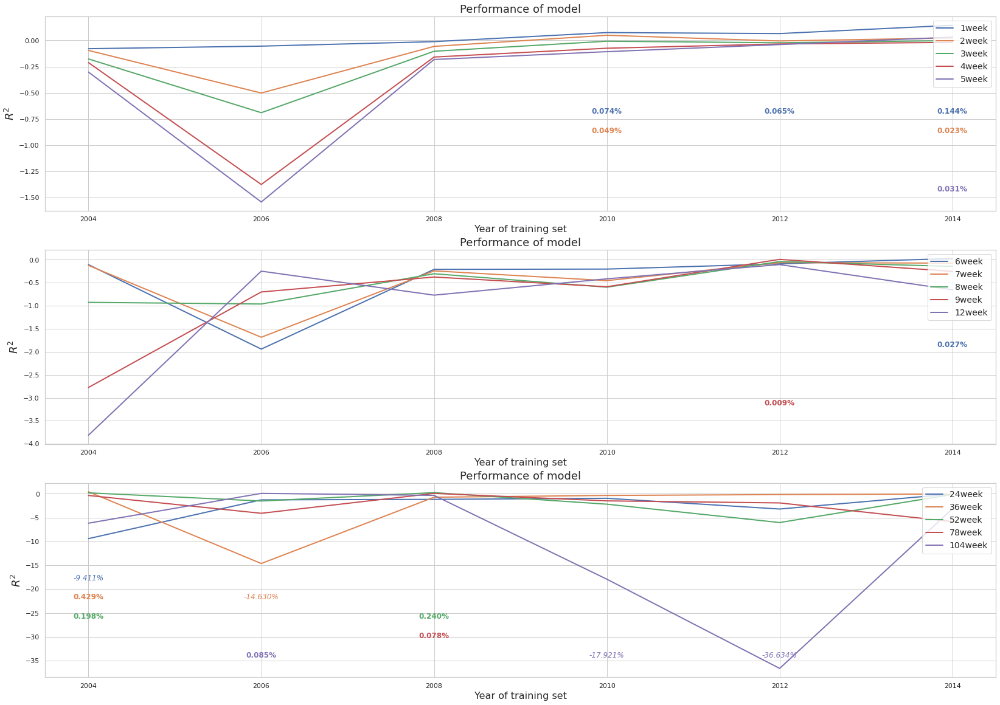

In [114]:
graph_comparison(scores_spline_ls5, light=True)

In [115]:
visualize_selected(store_spline_ls5, year=None, light=True) 

# slope in general works well when selected (and selected when Convex is dropped + Log Transf of Dependent)

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,slopep10 (6),slopep10 (6),slopep10 (5),54 (4),54 (4),54 (4),54 (4),54 (4),54 (4),54 (5),17 (4),75 (6),75 (6),SENT (6),19 (6)
1,3 (4),50 (3),50 (3),slopep10 (3),50 (3),US1YR (3),US1YR (3),US1YR (3),26 (3),83 (5),75 (4),79 (5),SENT (4),2 (6),26 (6)
2,2 (3),US1YR (3),US1YR (3),US1YR (3),US1YR (3),51 (3),SENT1 (2),26 (2),US1YR (3),3 (4),86 (4),18 (4),19 (4),4 (6),45 (6)
3,ra_bex_PAPER (3),3 (3),3 (3),3 (3),51 (3),50 (2),50 (2),50 (2),51 (3),77 (4),42 (3),58 (3),47 (4),19 (6),83 (6)
4,US1YR (3),51 (3),51 (3),51 (3),3 (2),SENT1 (1),51 (2),51 (2),50 (2),26 (3),64 (3),80 (3),18 (3),26 (6),70 (5)
5,51 (2),54 (2),54 (2),50 (2),slopep10 (1),,3 (1),SENT1 (1),6 (2),43 (3),70 (3),slopem10 (3),26 (3),75 (6),84 (5)
6,70 (2),58 (1),83 (1),55 (1),,,6 (1),T-Bill (1),75 (2),50 (3),78 (3),51 (3),74 (3),slopem10 (5),slopem10 (5)
7,50 (1),,,83 (1),,,26 (1),6 (1),83 (2),70 (3),80 (3),US1YR (3),82 (3),41 (5),2 (5)
8,T-Bill (1),,,,,,83 (1),83 (1),3 (1),10 (3),8 (3),7 (2),slopem10 (3),47 (5),3 (5)
9,slopem10 (1),,,,,,,,43 (1),US1YR (3),18 (3),25 (2),45 (3),82 (5),15 (5)


In [116]:
print_common(store_spline_ls5, X, to_print=10)

54 is a spline transformation of VIX
3 is a spline transformation of point0
51 is a spline transformation of unc_bex_%
83 is a spline transformation of SENT
26 is a spline transformation of slopep10
75 is a spline transformation of US10YR
50 is a spline transformation of unc_bex_%
70 is a spline transformation of US5YR
19 is a spline transformation of slopep5
2 is a spline transformation of point0





#### Knots = 5 and Degree = 3

In [2]:
knots = 5
deg = 3
n_add_paramet=len(X.columns)*(knots+deg-1)
col_names = [str(i) for i in range(1, n_add_paramet+1)]

In [157]:
# NO STANDARDIZATION
# WITH LASSO

X, Y = reinitialize()

# Feature Engineering
trans_2 = {SplineTransformer(n_knots=knots, degree=deg): [col_names, True]}
X, reg = transform(trans_2, X, X.columns.to_list())

store_spline42, scores_spline42, agg_spline42, preds_spline42 = lasso(X, Y, light_=True, thresh_prop=2, scor=score_off)


100%|██████████| 15/15 [01:30<00:00,  6.01s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_1week
1. logret_2week
2. logret_3week
3. logret_6week
4. logret_7week
5. logret_4week
6. logret_5week
7. logret_8week
8. logret_9week
9. logret_12week
10. logret_104week
11. logret_78week
12. logret_52week
13. logret_36week
14. logret_24week
Execution time for lasso is  0.0  h : 1.0  m : 30.08  s


In [158]:
sort_aggregate(agg_spline42, scores_spline42)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.196225,,-0.248765,-0.011461
1,logret_2week,-0.478795,,-0.604375,-0.154241
2,logret_4week,-0.805842,,-0.059483,-0.085042
3,logret_3week,-0.881469,,-0.937856,-0.496603
4,logret_5week,-0.927595,,-0.064695,-0.157475
5,logret_6week,-1.039939,,-0.285588,-0.188025
6,logret_7week,-1.165989,,-0.280356,-0.230671
7,logret_8week,-1.292176,,-0.022673,-0.303492
8,logret_9week,-1.441789,,-0.012712,-0.408724
9,logret_36week,-1.830920,,0.230316,-4.349606


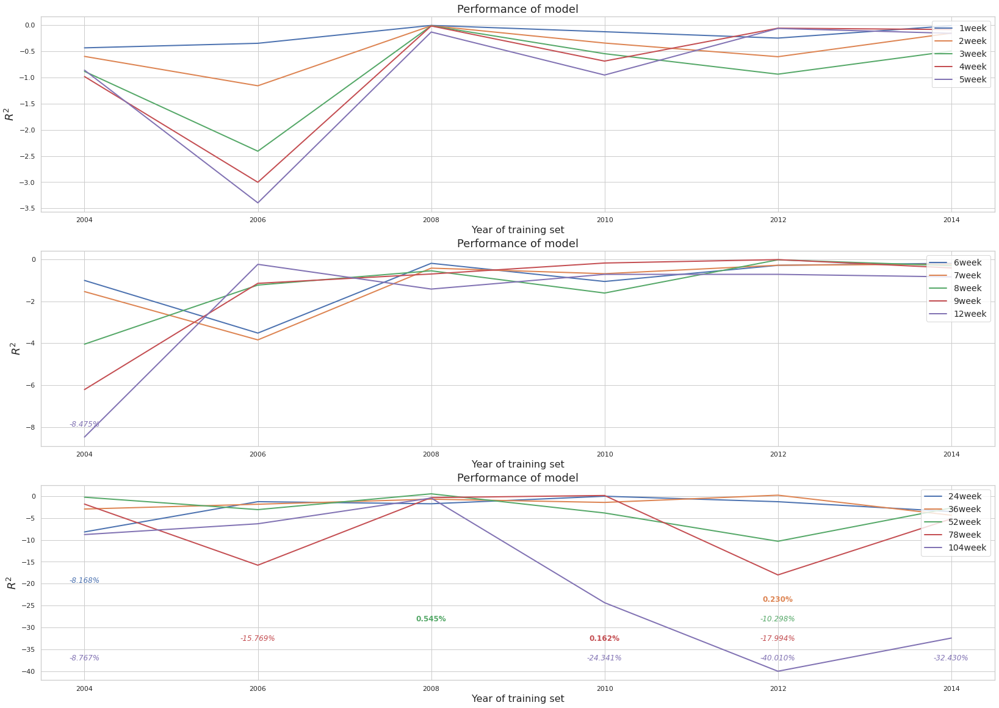

In [159]:
graph_comparison(scores_spline42, light=True)

In [160]:
visualize_selected(store_spline42, year=None, light=True) 

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,convexm2 (6),convexm2 (6),convexp2 (4),convexp2 (6),convexp2 (5),convexp2 (4),convexp2 (6),convexp2 (5),convexp2 (6),convexp2 (6),convexp2 (6),convexp2 (6),convexp2 (6),convexp2 (6),convexp2 (6)
1,convexp2 (2),convexp2 (4),convexm2 (4),convexm2 (5),convexm2 (4),convexm2 (4),convexm2 (5),convexm2 (5),convexm2 (6),convexm2 (6),convexm2 (6),convexm2 (6),convexm2 (6),convexm2 (6),convexm2 (6)
2,,,mcsi (2),USInst (4),mcsi (4),mcsi (4),USInst (5),mcsi (4),mcsi (6),mcsi (6),mcsi (6),USInst (6),mcsi (6),US1YR (6),mcsi (6)
3,,,1 (2),mcsi (3),USInst (3),USInst (3),mcsi (4),USInst (4),USInst (6),USInst (6),USInst (6),USInd (6),SENT (6),mcsi (6),USInst (6)
4,,,7 (2),USInd (2),US1YR (3),US1YR (3),USInd (4),US2YR (4),US2YR (5),USInd (5),USInd (6),mcsi (5),USInst (6),USInst (6),US1YR (5)
5,,,US1YR (1),US1YR (2),USInd (2),point0 (2),US2YR (3),USInd (4),USInd (5),slopep10 (4),US3YR (5),ra_bex_PAPER (4),USInd (6),SENT (5),USInd (4)
6,,,US2YR (1),US2YR (2),US2YR (2),2 (2),US3YR (3),US1YR (3),US3YR (4),US2YR (4),US2YR (4),SENT (4),US1YR (5),USInd (4),T-Bill (2)
7,,,point0 (1),ra_bex_PAPER (1),1 (1),7 (2),slopep10 (2),US3YR (3),ra_bex_PAPER (2),US3YR (4),slopep10 (3),109 (4),ra_bex_PAPER (4),slopem10 (4),slopep10 (2)
8,,,,,7 (1),US2YR (2),ra_bex_PAPER (2),point0 (1),SENT1 (2),SENT1 (4),ra_bex_PAPER (3),US3YR (4),US2YR (3),ra_bex_PAPER (4),SENT1 (1)
9,,,,,ra_bex_PAPER (1),USInd (2),US5YR (2),1 (1),slopep10 (1),17 (3),SENT1 (3),unc_bex_% (3),US5YR (2),SENT1 (1),ra_bex_PAPER (1)


In [161]:
print_common(store_spline42, X, to_print=10, kn=5, deg=3)

102 is a spline transformation of US1YR
109 is a spline transformation of US2YR
10 is a spline transformation of slopem2
25 is a spline transformation of slopem5
7 is a spline transformation of point0
17 is a spline transformation of slopep2
137 is a spline transformation of mcsi
158 is a spline transformation of USInst
1 is a spline transformation of point0
11 is a spline transformation of slopem2


In [171]:
# WITH LASSO
# STANDARDIZATION EXCLUDING DEPENDENT, PK and BILLS VARIABLES (and respective Splines)
    
X, Y = reinitialize()

# Standardize 
prop_nost_ = {RobustScaler(): var + ra + f_spline([var, ra], X, knots=5, degree=3),  
              MaxAbsScaler(): sent + f_spline([sent], X, knots=5, degree=3)}

# Feature Engineering
trans_2 = {SplineTransformer(n_knots=knots, degree=deg): [col_names, True]}
X, reg = transform(trans_2, X, X.columns.to_list())

store_sp2, scores_sp2, agg_sp2, preds_sp2 = lasso(X, Y, scaler=prop_nost_, light_=True, thresh_prop=2, scor=score_off)


100%|██████████| 15/15 [01:39<00:00,  6.63s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_6week
1. logret_5week
2. logret_2week
3. logret_7week
4. logret_8week
5. logret_3week
6. logret_1week
7. logret_9week
8. logret_4week
9. logret_12week
10. logret_24week
11. logret_36week
12. logret_52week
13. logret_78week
14. logret_104week
Execution time for lasso is  0.0  h : 1.0  m : 39.52  s


In [172]:
sort_aggregate(agg_sp2, scores_sp2)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.159010,,-0.274382,-0.011006
1,logret_2week,-0.392676,,-0.644739,-0.091682
2,logret_3week,-0.831281,,-0.971286,-0.474474
3,logret_4week,-0.866147,,-1.183413,-0.751367
4,logret_5week,-1.143647,,-1.517628,-1.073354
5,logret_6week,-1.237202,,-1.686640,-0.956743
6,logret_7week,-1.358504,,-1.923226,-1.472205
7,logret_8week,-1.805327,,-2.119170,-2.159843
8,logret_9week,-1.806345,,-2.413690,-2.747365
9,logret_12week,-2.476993,,-3.603109,-4.787743


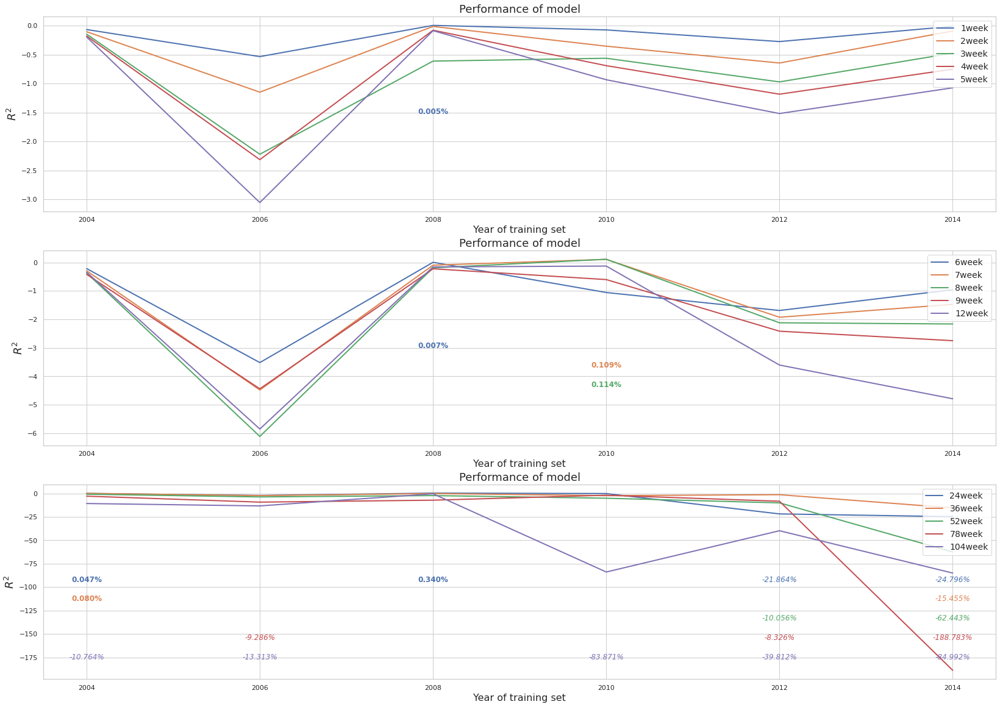

In [173]:
graph_comparison(scores_sp2, light=True)

In [174]:
visualize_selected(store_sp2, year=None, light=True) 

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,convexp2 (4),convexm2 (3),1 (2),161 (1),convexp2 (2),point0 (3),convexp2 (2),point0 (2),160 (2),160 (2),168 (4),convexp2 (5),convexm2 (5),156 (5),156 (5)
1,convexm2 (4),convexp2 (2),7 (2),slopem2 (1),161 (1),7 (3),160 (2),7 (2),168 (2),168 (2),convexp2 (3),convexm2 (5),160 (5),convexp2 (5),convexp2 (5)
2,74 (3),161 (1),161 (1),8 (1),140 (1),1 (2),168 (2),160 (2),161 (1),161 (1),convexm2 (3),74 (5),convexp2 (4),convexm2 (5),convexm2 (5)
3,89 (2),140 (1),convexp2 (1),14 (1),168 (1),161 (1),161 (1),168 (2),slopem2 (1),slopem2 (1),81 (3),160 (5),74 (4),160 (5),US1YR (5)
4,160 (2),168 (1),convexm2 (1),convexp2 (1),point0 (1),2 (1),point0 (1),161 (1),8 (1),8 (1),140 (3),156 (4),156 (3),US1YR (4),160 (4)
5,168 (2),unc_bex_PAPER (1),140 (1),140 (1),1 (1),168 (1),slopem2 (1),slopem2 (1),14 (1),14 (1),156 (3),168 (4),US2YR (3),74 (4),168 (4)
6,161 (1),74 (1),168 (1),168 (1),7 (1),160 (1),2 (1),2 (1),point0 (1),point0 (1),160 (3),US3YR (3),140 (3),81 (4),140 (3)
7,164 (1),,point0 (1),point0 (1),,,7 (1),1 (1),1 (1),1 (1),slopep10 (2),140 (3),164 (3),140 (3),74 (3)
8,135 (1),,,1 (1),,,convexm2 (1),convexp2 (1),7 (1),7 (1),US2YR (2),149 (3),168 (3),85 (3),89 (3)
9,140 (1),,,7 (1),,,US2YR (1),convexm2 (1),slopep10 (1),slopep10 (1),US3YR (2),151 (3),US3YR (2),168 (3),slopem10 (2)


In [175]:
print_common(store_sp2, X, to_print=10, kn=5, deg=3)

160 is a spline transformation of USInst
168 is a spline transformation of USInd
74 is a spline transformation of ra_bex_PAPER
140 is a spline transformation of mcsi
156 is a spline transformation of USInst
81 is a spline transformation of unc_bex_PAPER
89 is a spline transformation of unc_bex_%
161 is a spline transformation of USInst
164 is a spline transformation of USInd
7 is a spline transformation of point0


In [196]:
# WITH LASSO
# STANDARDIZATION EXCLUDING DEPENDENT and PK (and respective Splines)
    
X, Y = reinitialize()

# Standardize 
var = ['mcsi', 'VIX', 'USInst', 'USInd']
ra = X.columns[X.columns.str.contains(r'\Bbex\B')].to_list()   #['ra_bex_PAPER', 'unc_bex_PAPER', 'unc_bex_%']
sent = ['SENT', 'SENT1']
us = X.columns[X.columns.str.contains(r'YR\b')].to_list()  #['US1YR', 'US2YR', 'US3YR', 'US5YR', 'US10YR', 'T-Bill']
us.append('T-Bill')

prop_nost_ = {RobustScaler(): var + ra + f_spline([var, ra], X, knots=5, degree=3),  
              MaxAbsScaler(): sent + f_spline([sent], X, knots=5, degree=3), StandardScaler(): us + f_spline([us], X, knots=5, degree=3)}

# Feature Engineering
trans_2 = {SplineTransformer(n_knots=5, degree=3): [col_names, True]}
X, reg = transform(trans_2, X, X.columns.to_list())

store_sp22, scores_sp22, agg_sp22, preds_sp22 = lasso(X, Y, scaler=prop_nost_, light_=True, thresh_prop=2, scor=score_off)


100%|██████████| 15/15 [02:03<00:00,  8.24s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_6week
1. logret_7week
2. logret_5week
3. logret_2week
4. logret_8week
5. logret_3week
6. logret_1week
7. logret_9week
8. logret_4week
9. logret_12week
10. logret_24week
11. logret_52week
12. logret_36week
13. logret_78week
14. logret_104week
Execution time for lasso is  0.0  h : 2.0  m : 3.67  s


In [197]:
sort_aggregate(agg_sp22, scores_sp22)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.159888,,-0.274382,-0.010523
1,logret_2week,-0.394561,,-0.644739,-0.091684
2,logret_4week,-0.673632,,-1.183413,-0.448309
3,logret_3week,-0.830800,,-0.971286,-0.474474
4,logret_5week,-1.277688,,-1.517628,-1.073354
5,logret_6week,-1.344172,,-1.686640,-0.956743
6,logret_7week,-1.595360,,-1.923226,-1.472205
7,logret_8week,-2.375030,,-2.119170,-2.159843
8,logret_9week,-3.586459,,-2.413690,-2.747365
9,logret_12week,-4.717470,,-3.603109,-4.787743


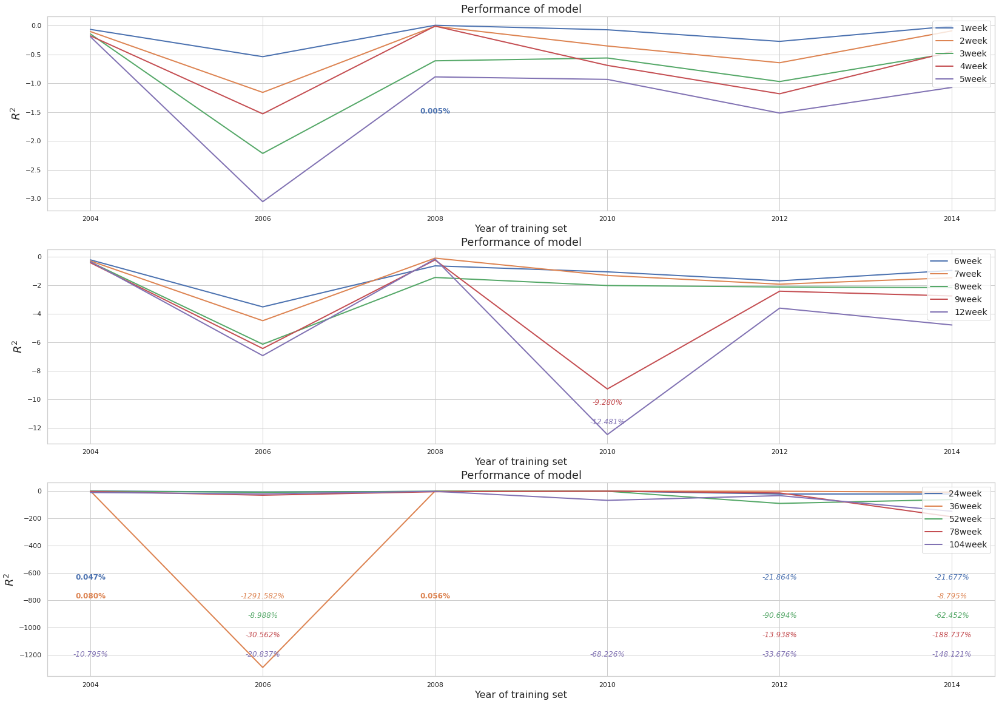

In [198]:
graph_comparison(scores_sp22, light=True)

In [199]:
visualize_selected(store_sp22, year=None, light=True) 

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,convexp2 (4),convexm2 (3),1 (2),point0 (2),1 (2),7 (3),point0 (2),7 (2),point0 (2),point0 (2),convexp2 (3),convexm2 (5),156 (4),156 (5),156 (5)
1,74 (3),convexp2 (2),7 (2),7 (2),7 (2),point0 (2),7 (2),160 (2),7 (2),7 (2),convexm2 (3),160 (5),convexm2 (4),convexp2 (5),convexp2 (5)
2,convexm2 (3),161 (1),161 (1),161 (1),161 (1),1 (2),161 (1),168 (2),160 (2),160 (2),125 (3),156 (4),160 (4),convexm2 (5),convexm2 (5)
3,89 (2),140 (1),convexp2 (1),2 (1),convexp2 (1),161 (1),2 (1),161 (1),168 (2),168 (2),140 (3),168 (4),convexp2 (3),108 (4),US1YR (5)
4,160 (2),168 (1),convexm2 (1),1 (1),140 (1),2 (1),convexp2 (1),point0 (1),161 (1),161 (1),160 (3),convexp2 (4),66 (3),160 (4),160 (4)
5,168 (2),unc_bex_PAPER (1),140 (1),140 (1),168 (1),168 (1),1 (1),2 (1),2 (1),2 (1),168 (3),140 (3),74 (3),81 (3),168 (4)
6,161 (1),74 (1),168 (1),168 (1),point0 (1),160 (1),168 (1),1 (1),1 (1),1 (1),81 (2),164 (3),108 (3),115 (3),85 (3)
7,164 (1),,point0 (1),unc_bex_PAPER (1),,,160 (1),convexp2 (1),convexp2 (1),convexp2 (1),117 (2),US3YR (3),140 (3),140 (3),140 (3)
8,135 (1),,,,,,,convexm2 (1),convexm2 (1),convexm2 (1),133 (2),74 (3),164 (3),slopem10 (3),74 (3)
9,140 (1),,,,,,,68 (1),68 (1),68 (1),136 (2),89 (3),US5YR (2),US1YR (3),89 (3)


In [200]:
print_common(store_sp22, X, to_print=10, kn=5, deg=3)

160 is a spline transformation of USInst
168 is a spline transformation of USInd
74 is a spline transformation of ra_bex_PAPER
140 is a spline transformation of mcsi
156 is a spline transformation of USInst
7 is a spline transformation of point0
89 is a spline transformation of unc_bex_%
81 is a spline transformation of unc_bex_PAPER
161 is a spline transformation of USInst
164 is a spline transformation of USInd


In [176]:
# LOGARITHMIC TRANSFORMATION excluding Dependent and PK
    
X_l, Y_l = log_transf_nopk(dep=False)

# Feature Engineering
trans_2 = {SplineTransformer(n_knots=knots, degree=deg): [col_names, True]}
X_l, reg = transform(trans_2, X_l, X.columns.to_list())

store_spline_sl2, scores_spline_sl2, agg_spline_sl2, preds_spline_sl2 = lasso(X_l, Y_l, light_=True, thresh_prop=2, scor=score_off)


Scalar added is:  0.9416964


100%|██████████| 15/15 [01:02<00:00,  4.18s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_1week
1. logret_4week
2. logret_5week
3. logret_6week
4. logret_7week
5. logret_3week
6. logret_2week
7. logret_8week
8. logret_52week
9. logret_78week
10. logret_104week
11. logret_36week
12. logret_9week
13. logret_24week
14. logret_12week
Execution time for lasso is  0.0  h : 1.0  m : 2.65  s


In [177]:
sort_aggregate(agg_spline_sl2, scores_spline_sl2)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_5week,-0.152103,,-0.072867,-0.099412
1,logret_1week,-0.196239,,-0.248765,-0.011461
2,logret_6week,-0.217565,,-0.070857,-0.135476
3,logret_7week,-0.257595,,-0.114818,-0.171724
4,logret_2week,-0.292863,,-0.018208,0.027346
5,logret_8week,-0.304777,,-0.109893,-0.161854
6,logret_4week,-0.539916,,-0.056636,-0.037654
7,logret_3week,-0.625838,,-0.053595,-0.025193
8,logret_9week,-0.746309,,-0.072642,-0.087479
9,logret_12week,-0.892076,,-0.030019,-1.274148


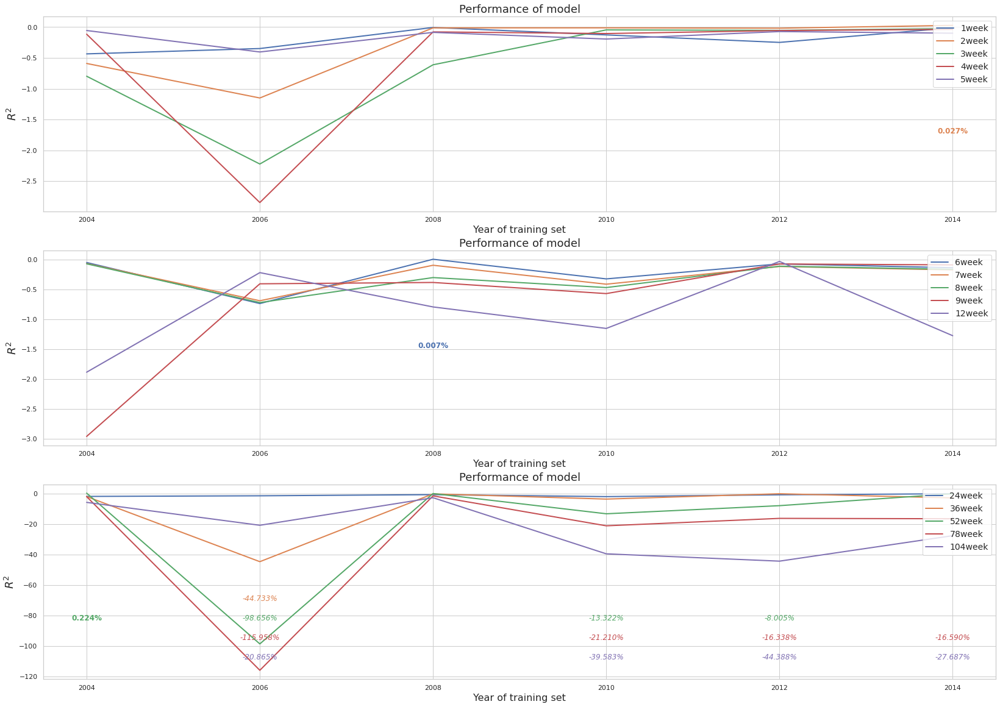

In [178]:
graph_comparison(scores_spline_sl2, light=True)

In [179]:
visualize_selected(store_spline_sl2, year=None, light=True) 

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,convexm2 (6),convexp2 (6),convexp2 (5),convexp2 (4),convexp2 (5),convexp2 (5),convexp2 (5),convexp2 (5),convexp2 (6),convexp2 (6),convexp2 (6),convexp2 (6),convexm2 (6),convexm2 (6),convexp2 (6)
1,convexp2 (2),convexm2 (6),convexm2 (5),convexm2 (3),convexm2 (4),convexm2 (4),convexm2 (4),convexm2 (5),convexm2 (6),convexm2 (6),convexm2 (6),convexm2 (6),convexp2 (4),convexp2 (5),convexm2 (6)
2,,US1YR (3),US1YR (3),US1YR (3),US1YR (4),US1YR (4),US1YR (4),US1YR (5),US1YR (6),US1YR (6),SENT1 (6),SENT (6),SENT (4),SENT1 (5),slopem10 (5)
3,,SENT (3),SENT (3),SENT (3),SENT (4),SENT (4),SENT (4),SENT (5),SENT1 (6),SENT1 (6),145 (5),SENT1 (4),slopem10 (3),slopem10 (4),SENT (3)
4,,SENT1 (3),SENT1 (3),SENT1 (3),SENT1 (4),SENT1 (4),SENT1 (4),SENT1 (5),SENT (5),slopep10 (5),158 (5),slopem10 (4),SENT1 (2),SENT (3),SENT1 (3)
5,,point0 (2),slopem10 (2),unc_bex_% (1),78 (1),125 (1),78 (1),slopep10 (2),137 (3),137 (5),137 (4),US1YR (4),T-Bill (2),T-Bill (3),T-Bill (3)
6,,slopem10 (2),1 (1),78 (1),82 (1),137 (1),82 (1),125 (2),145 (3),145 (5),US1YR (4),US2YR (3),US1YR (2),US1YR (2),US1YR (2)
7,,ra_bex_PAPER (2),7 (1),82 (1),slopep10 (1),158 (1),slopep10 (1),78 (1),17 (3),17 (4),SENT (4),110 (1),109 (1),67 (1),67 (1)
8,,,,90 (1),125 (1),point0 (1),17 (1),82 (1),slopep10 (2),87 (3),slopep10 (3),137 (1),116 (1),145 (1),145 (1)
9,,,,slopep2 (1),137 (1),1 (1),32 (1),137 (1),125 (2),125 (3),125 (3),144 (1),137 (1),146 (1),


In [180]:
print_common(store_spline_sl2, X, to_print=10, kn=5, deg=3)

137 is a spline transformation of mcsi
145 is a spline transformation of SENT
125 is a spline transformation of US5YR
158 is a spline transformation of USInst
17 is a spline transformation of slopep2
10 is a spline transformation of slopem2
25 is a spline transformation of slopem5
78 is a spline transformation of unc_bex_PAPER
82 is a spline transformation of unc_bex_PAPER
157 is a spline transformation of USInst


In [3]:
# LOGARITHMIC TRANSFORMATION

# including all variables, dropping Convex

X_l, Y_l = log_transf()

knots = 5
deg = 3
n_add_paramet=len(X.columns)*(knots+deg-1)
col_names = [str(i) for i in range(1, n_add_paramet+1)]

# Feature Engineering
trans_ = {SplineTransformer(n_knots=knots, degree=deg): [col_names, True]}
X_l, reg = transform(trans_, X_l, X_l.columns.to_list())

store_spline_l6, scores_spline_l6, agg_spline_l6, preds_spline_l6 = lasso(X_l, Y_l, light_=True, thresh_prop=2, scor=score_off)


Scalar added is:  -2.998946389647


100%|██████████| 15/15 [10:29<00:00, 41.96s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_1week
1. logret_6week
2. logret_7week
3. logret_5week
4. logret_4week
5. logret_2week
6. logret_3week
7. logret_8week
8. logret_9week
9. logret_12week
10. logret_36week
11. logret_24week
12. logret_52week
13. logret_104week
14. logret_78week
Execution time for lasso is  0.0  h : 10.0  m : 29.41  s


In [4]:
sort_aggregate(agg_spline_l6, scores_spline_l6)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,0.023838,,0.065208,0.144145
1,logret_2week,-0.099745,,-0.005664,0.023269
2,logret_3week,-0.187347,,-0.022936,-0.001887
3,logret_4week,-0.314228,,-0.038576,-0.018785
4,logret_5week,-0.357769,,-0.045830,0.029323
5,logret_6week,-0.415721,,-0.086712,0.028072
6,logret_7week,-0.462898,,-0.061821,-0.073026
7,logret_8week,-0.505238,,-0.038629,-0.143428
8,logret_9week,-0.786548,,0.006875,-0.252852
9,logret_12week,-0.986497,,0.039884,-0.701249


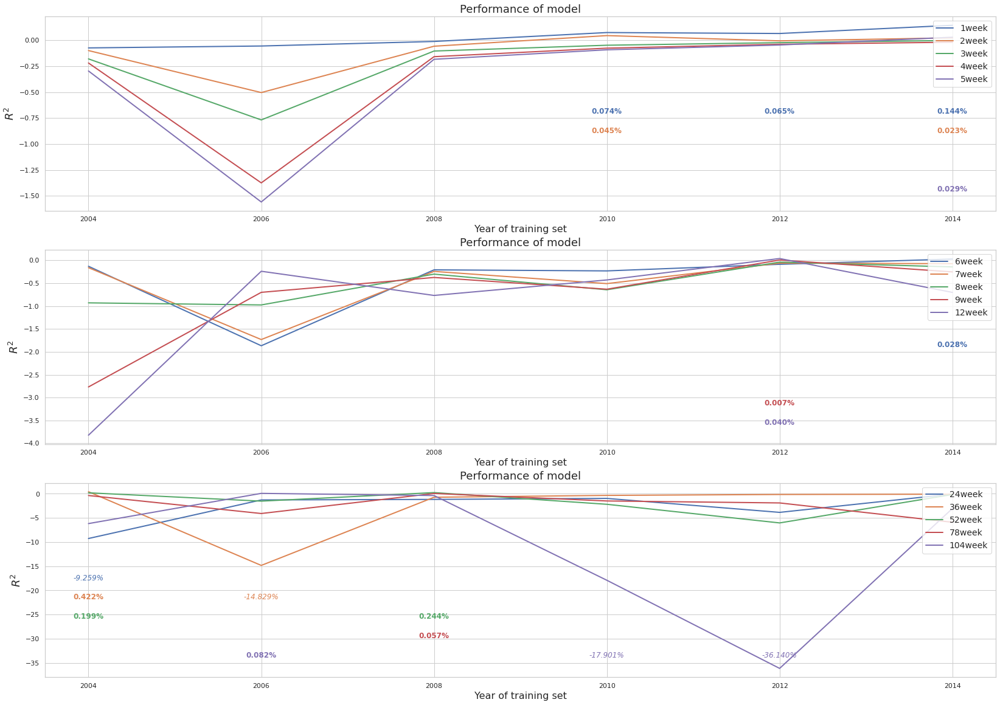

In [5]:
graph_comparison(scores_spline_l6, light=True)

In [6]:
visualize_selected(store_spline_l6, year=None, light=True) 

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,slopep10 (6),slopep10 (6),slopep10 (5),54 (4),54 (4),54 (3),54 (4),54 (4),54 (4),54 (5),17 (4),75 (6),75 (6),SENT (6),19 (6)
1,3 (4),50 (3),50 (3),slopep10 (3),US1YR (3),US1YR (3),US1YR (3),US1YR (3),26 (3),83 (5),75 (4),79 (5),SENT (4),2 (6),26 (6)
2,ra_bex_PAPER (3),US1YR (3),54 (3),US1YR (3),3 (3),51 (3),SENT1 (2),26 (2),US1YR (3),3 (4),86 (4),18 (4),19 (4),4 (6),45 (6)
3,US1YR (3),3 (3),US1YR (3),3 (3),51 (3),50 (2),50 (2),50 (2),51 (3),77 (4),42 (3),80 (3),47 (4),19 (6),83 (6)
4,2 (2),51 (3),3 (3),51 (3),50 (2),SENT1 (1),51 (2),51 (2),50 (2),26 (3),64 (3),slopem10 (3),18 (3),26 (6),70 (5)
5,51 (2),54 (2),51 (3),50 (2),slopep10 (1),,T-Bill (1),SENT1 (1),6 (2),43 (3),70 (3),51 (3),26 (3),75 (6),84 (5)
6,70 (2),,83 (1),83 (1),,,3 (1),T-Bill (1),75 (2),50 (3),78 (3),US1YR (3),74 (3),slopem10 (5),slopem10 (5)
7,SENT1 (1),,,,,,6 (1),6 (1),83 (2),70 (3),80 (3),7 (2),82 (3),41 (5),2 (5)
8,27 (1),,,,,,26 (1),83 (1),3 (1),US1YR (3),81 (3),25 (2),slopem10 (3),47 (5),3 (5)
9,50 (1),,,,,,83 (1),,43 (1),7 (3),8 (3),41 (2),45 (3),82 (5),15 (5)


In [7]:
print_common(store_spline_l6, X, to_print=10, kn=5, deg=3)

54 is a spline transformation of convexp2
3 is a spline transformation of point0
51 is a spline transformation of convexp2
83 is a spline transformation of unc_bex_PAPER
26 is a spline transformation of slopem5
75 is a spline transformation of ra_bex_PAPER
50 is a spline transformation of convexp2
70 is a spline transformation of T-Bill
19 is a spline transformation of slopep2
18 is a spline transformation of slopep2


In general does not work, low degree and knots better than more. Linear Relationship performs better

## Polynomial Features

In [ ]:
col_names = X.columns.to_list()
for idx, first in enumerate(X.columns):
    for second in X.columns[idx+1:]:
        col_names.append(str(first) + " * " + second)

In [3]:
# NO STANDARDIZATION

X, Y = reinitialize()

# Feature Engineering
trans_poly = {PolynomialFeatures(degree=2, interaction_only=True, include_bias=False): [col_names, False]}
X, reg = transform(trans_poly, X, X.columns.to_list())
    
store_poly, scores_poly, agg_poly, preds_poly = feature_selection_full(LinearRegression(), X, Y, light_=True, score=score_off)  # light_=true

100%|██████████| 15/15 [40:48<00:00, 163.21s/it]

Execution time for feature selection is  0.0  h : 40.0  m : 48.11  s


In [4]:
sort_aggregate(agg_poly, scores_poly)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.127380,,0.002312,-0.038563
1,logret_2week,-0.194471,,-0.311455,-0.133436
2,logret_3week,-0.448603,,-0.757882,-0.044405
3,logret_5week,-0.612264,,-0.848169,-0.136804
4,logret_4week,-1.010880,,-0.626477,0.014049
5,logret_6week,-1.052514,,-0.687885,-0.200357
6,logret_9week,-1.559594,,0.044559,-0.320694
7,logret_8week,-1.826253,,-0.228020,-0.563074
8,logret_24week,-2.496916,,-1.509425,-1.542050
9,logret_36week,-2.755331,,-0.694411,-2.031891


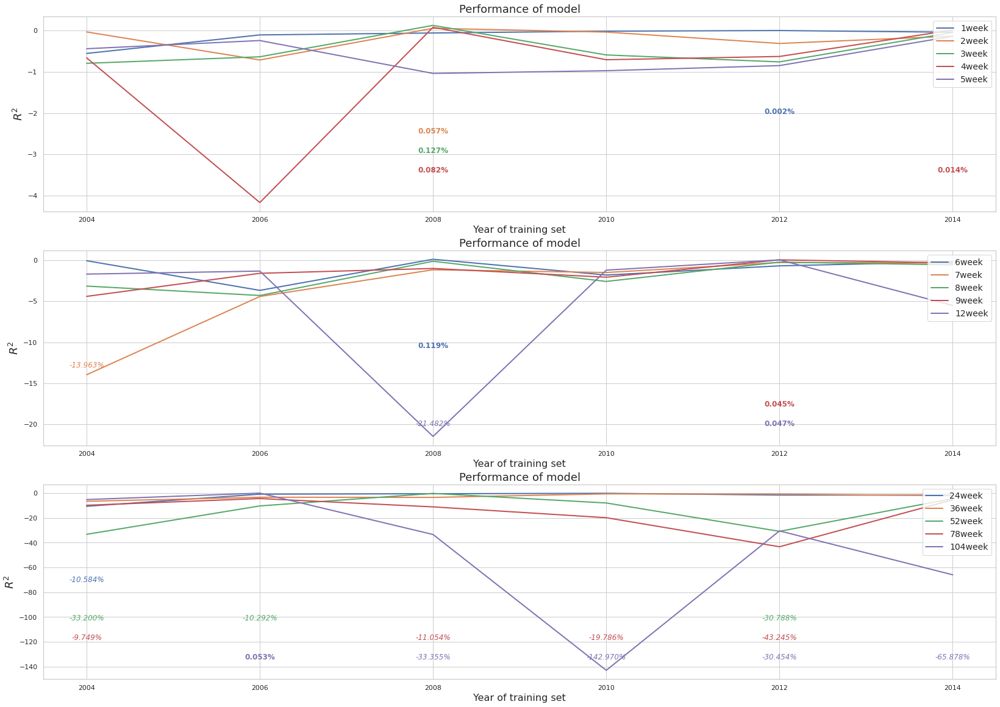

In [5]:
graph_comparison(scores_poly, light=True)

In [6]:
visualize_selected(store_poly, year=None, light=True)  # light=True


,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,unc_bex_PAPER * US1YR (4),point0 * unc_bex_PAPER (2),unc_bex_PAPER * US2YR (3),unc_bex_PAPER * US2YR (2),unc_bex_PAPER * US2YR (2),unc_bex_PAPER * US2YR (3),unc_bex_PAPER * US3YR (3),point0 * unc_bex_PAPER (2),unc_bex_PAPER * US3YR (3),VIX * US3YR (3),unc_bex_PAPER * US3YR (4),unc_bex_PAPER * US2YR (5),unc_bex_PAPER * US2YR (5),unc_bex_PAPER * US3YR (5),slopep5 * unc_bex_PAPER (4)
1,VIX * US5YR (1),unc_bex_PAPER * US2YR (2),point0 * unc_bex_PAPER (3),unc_bex_PAPER * US3YR (2),unc_bex_PAPER * US3YR (2),slopem2 * unc_bex_PAPER (3),unc_bex_PAPER * US5YR (3),unc_bex_PAPER * US3YR (2),unc_bex_PAPER * VIX (2),VIX * US5YR (3),unc_bex_PAPER (3),unc_bex_PAPER (4),unc_bex_PAPER * US3YR (5),unc_bex_PAPER * US5YR (5),unc_bex_PAPER * US5YR (4)
2,unc_bex_PAPER * VIX (1),convexp2 * unc_bex_PAPER (1),unc_bex_PAPER * US1YR (2),point0 * unc_bex_PAPER (2),unc_bex_PAPER * US5YR (2),unc_bex_PAPER * US1YR (2),unc_bex_PAPER * US2YR (2),slopem2 * unc_bex_PAPER (2),point0 * unc_bex_PAPER (2),unc_bex_PAPER * VIX (3),slopem2 * unc_bex_PAPER (3),unc_bex_PAPER * US1YR (4),unc_bex_PAPER * US5YR (4),unc_bex_PAPER * US2YR (4),point0 * unc_bex_PAPER (3)
3,,unc_bex_PAPER * US3YR (1),slopem2 * US1YR (1),slopem2 * US3YR (1),point0 * unc_bex_PAPER (2),slopem2 * SENT1 (1),point0 * unc_bex_PAPER (2),unc_bex_PAPER * US2YR (2),slopep2 * unc_bex_PAPER (2),VIX * US1YR (2),unc_bex_PAPER * US2YR (3),unc_bex_PAPER * US3YR (4),unc_bex_PAPER * US10YR (3),unc_bex_PAPER * unc_bex_% (2),slopem5 * unc_bex_PAPER (3)
4,,slopem2 * unc_bex_PAPER (1),slopem2 * US2YR (1),unc_bex_PAPER (1),slopem2 * VIX (1),unc_bex_PAPER (1),slopem2 * unc_bex_PAPER (2),slopem2 * US3YR (1),unc_bex_PAPER * US2YR (2),VIX * US10YR (2),unc_bex_PAPER * US10YR (3),unc_bex_PAPER * US5YR (4),unc_bex_PAPER * VIX (3),unc_bex_PAPER * US1YR (2),unc_bex_PAPER * US10YR (3)
5,,,slopep5 * unc_bex_PAPER (1),slopep5 * unc_bex_PAPER (1),slopem5 * VIX (1),point0 * unc_bex_PAPER (1),slopep5 * US1YR (1),unc_bex_PAPER * US5YR (1),slopem2 * US2YR (1),unc_bex_PAPER * mcsi (2),point0 * unc_bex_PAPER (2),unc_bex_PAPER * US10YR (4),slopem2 * US3YR (2),unc_bex_PAPER (2),unc_bex_PAPER * US1YR (3)
6,,,slopem10 * unc_bex_PAPER (1),T-Bill * unc_bex_PAPER (1),slopem2 * unc_bex_PAPER (1),unc_bex_PAPER * US3YR (1),slopep5 * US2YR (1),slopep2 * unc_bex_PAPER (1),ra_bex_PAPER * unc_bex_PAPER (1),unc_bex_PAPER * USInst (2),unc_bex_PAPER * unc_bex_% (2),point0 * unc_bex_PAPER (3),slopem2 * unc_bex_PAPER (2),slopem5 * unc_bex_PAPER (2),unc_bex_PAPER * US2YR (3)
7,,,slopem2 * unc_bex_PAPER (1),unc_bex_PAPER * US1YR (1),unc_bex_PAPER * US1YR (1),,slopep5 * US3YR (1),unc_bex_PAPER * US1YR (1),unc_bex_PAPER * unc_bex_% (1),VIX * US2YR (2),unc_bex_PAPER * SENT (2),unc_bex_PAPER * VIX (3),slopep5 * unc_bex_PAPER (2),slopep2 * unc_bex_PAPER (2),unc_bex_PAPER * US3YR (3)
8,,,slopem5 * unc_bex_PAPER (1),unc_bex_PAPER * US5YR (1),,,slopep5 * US5YR (1),,unc_bex_PAPER * mcsi (1),slopep10 * unc_bex_PAPER (2),unc_bex_PAPER * US1YR (2),slopem2 * unc_bex_PAPER (2),point0 * SENT (1),slopep2 (1),point0 * US2YR (2)
9,,,unc_bex_PAPER * US3YR (1),,,,slopep5 * unc_bex_PAPER (1),,unc_bex_PAPER * SENT (1),unc_bex_PAPER (2),VIX * US1YR (1),slopem5 * unc_bex_PAPER (2),point0 * SENT1 (1),VIX (1),point0 * US3YR (2)


In [ ]:
# WITH LASSO

# !!! generator = TimeSeriesSplit(n_splits = 3) set in Lasso otherwise infty

X, Y = reinitialize()

# Feature Engineering
trans_poly = {PolynomialFeatures(degree=2, interaction_only=True, include_bias=False): [col_names, False]}
X, reg = transform(trans_poly, X, X.columns.to_list())
    
store_poly2, scores_poly2, agg_poly2, preds_poly2 = lasso(X, Y, light_=True, thresh_prop=2, scor=score_off)


In [ ]:
sort_aggregate(agg_poly2, scores_poly2)


In [ ]:
graph_comparison(scores_poly2, light=True) # light

In [ ]:
visualize_selected(store_poly2, year=None, light=True)  # light=True

In [3]:
# STANDARDIZATION EXCLUDING DEPENDENT + PK + BILLS (BUT INCLUDING CONVEX)

X, Y = reinitialize()

# Standardization
scal_var = RobustScaler()
var = ['mcsi', 'VIX', 'USInst', 'USInd'] + ['convexp2', 'convexm2']
ra = X.columns[X.columns.str.contains(r'\Bbex\B')].to_list()   #['ra_bex_PAPER', 'unc_bex_PAPER', 'unc_bex_%']

scal_sent = MaxAbsScaler()
sent = ['SENT', 'SENT1']

prop_nost = {scal_var: var + ra + f_int([var, ra], col_names), scal_sent: sent + f_int([sent], col_names)}

# Feature Engineering
trans_poly = {PolynomialFeatures(degree=2, interaction_only=True, include_bias=False): [col_names, False]}
X, reg = transform(trans_poly, X, X.columns.to_list())

store_poly_s, scores_poly_s, agg_poly_s, preds_poly_s = feature_selection_full(LinearRegression(), X, Y, light_=True, scaler=prop_nost, score=score_off)  # light_=true


100%|██████████| 15/15 [37:58<00:00, 151.93s/it]

Execution time for feature selection is  0.0  h : 37.0  m : 58.92  s


In [4]:
sort_aggregate(agg_poly_s, scores_poly_s)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.125592,,-0.002063,-0.031760
1,logret_2week,-0.153216,,-0.428890,-0.072572
2,logret_4week,-0.424721,,-0.017582,-0.681337
3,logret_3week,-0.568763,,-0.419293,-0.437427
4,logret_7week,-0.979916,,-1.158873,-0.971731
5,logret_5week,-1.039893,,-0.061936,-0.521158
6,logret_6week,-1.372637,,-1.379367,-1.561206
7,logret_9week,-1.756900,,-1.544160,-4.557747
8,logret_8week,-2.369832,,-0.130449,-3.237117
9,logret_24week,-2.446992,,-2.885616,-1.772037


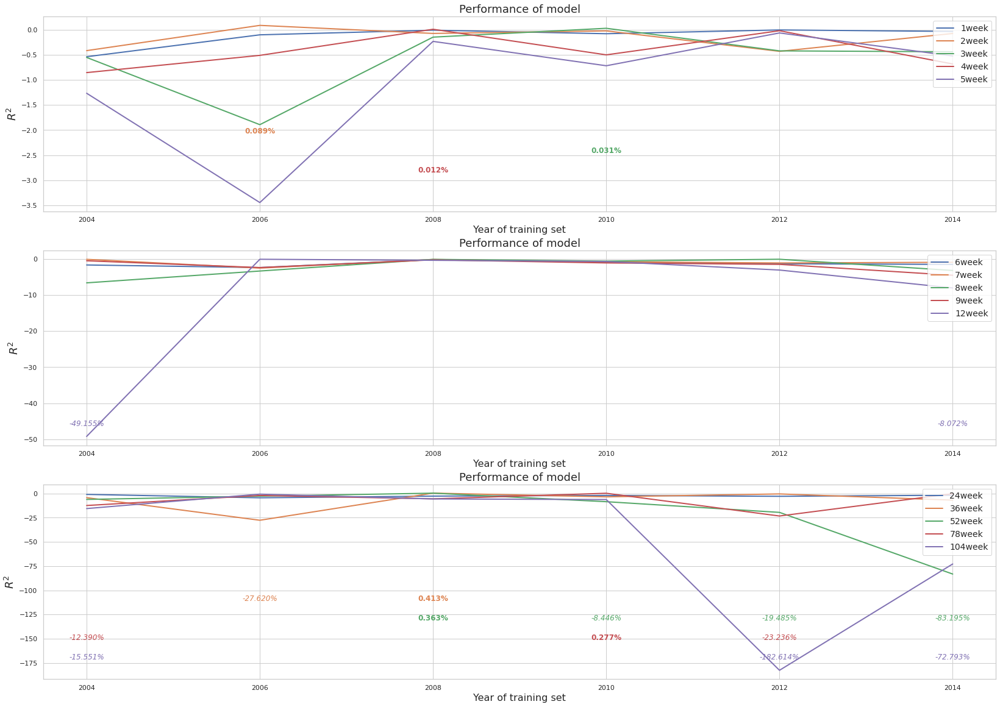

In [5]:
graph_comparison(scores_poly_s, light=True)

In [6]:
visualize_selected(store_poly_s, year=None, light=True)  # light=True

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,US5YR * SENT (2),US2YR * SENT (2),US2YR * USInd (2),slopep10 * USInst (1),US3YR * SENT1 (3),unc_bex_PAPER * SENT (2),US3YR * SENT (2),US3YR * SENT1 (3),US2YR * SENT (4),slopem2 * slopep5 (1),US3YR * USInd (3),US3YR * SENT1 (4),US2YR * SENT1 (5),US3YR * SENT (4),US3YR * SENT1 (4)
1,US3YR * SENT (2),convexp2 * mcsi (1),slopem2 * US2YR (1),slopep10 * USInd (1),US3YR * SENT (2),convexp2 * mcsi (1),US5YR * USInd (1),slopem2 (1),US3YR * SENT (3),slopep2 * US2YR (1),US5YR * USInd (3),US2YR * SENT (3),US1YR * SENT1 (4),unc_bex_% * US3YR (4),US2YR * mcsi (4)
2,US3YR (1),ra_bex_PAPER * US3YR (1),SENT1 (1),US2YR * USInd (1),US1YR * mcsi (1),US2YR * SENT (1),US2YR * SENT (1),slopem2 * USInd (1),slopep10 (1),slopep2 * US3YR (1),US3YR * SENT1 (3),US3YR * SENT (3),US3YR * SENT1 (3),US10YR * SENT (3),US2YR * SENT (4)
3,US3YR * USInd (1),unc_bex_% * US2YR (1),US2YR * SENT1 (1),unc_bex_% * US3YR (1),US2YR * SENT (1),US3YR * SENT1 (1),unc_bex_% * SENT (1),SENT (1),SENT * USInd (1),slopem5 * SENT1 (1),US5YR * SENT1 (3),US2YR * SENT1 (3),US5YR * SENT (3),US2YR * SENT (3),US2YR * SENT1 (4)
4,T-Bill * SENT (1),US3YR * SENT (1),US3YR * SENT1 (1),US5YR * SENT1 (1),US3YR * USInst (1),US10YR * SENT1 (1),US2YR * SENT1 (1),slopem2 * US2YR (1),SENT1 * USInst (1),slopep5 * slopem10 (1),US2YR * SENT (3),US5YR * SENT1 (3),US5YR * SENT1 (3),US2YR * SENT1 (3),US3YR * mcsi (4)
5,VIX * SENT1 (1),unc_bex_PAPER * SENT (1),ra_bex_PAPER * US2YR (1),US1YR * USInd (1),unc_bex_PAPER * SENT (1),unc_bex_PAPER * SENT1 (1),US3YR * SENT1 (1),US1YR * SENT (1),T-Bill (1),ra_bex_PAPER * US2YR (1),US3YR * SENT (3),US2YR * USInst (3),US10YR * SENT (3),US3YR * SENT1 (3),US3YR * SENT (4)
6,US1YR * SENT (1),unc_bex_PAPER * SENT1 (1),US1YR * USInd (1),unc_bex_PAPER * SENT1 (1),unc_bex_PAPER * SENT1 (1),,US5YR * SENT1 (1),US2YR * SENT1 (1),US1YR (1),ra_bex_PAPER * US3YR (1),US5YR * SENT (3),US3YR * USInst (3),unc_bex_PAPER * SENT (2),US5YR * SENT1 (3),US5YR * mcsi (4)
7,slopem2 * US2YR (1),,US2YR * mcsi (1),,US1YR * SENT1 (1),,unc_bex_PAPER * SENT1 (1),US2YR (1),T-Bill * USInd (1),ra_bex_PAPER * US5YR (1),US2YR * mcsi (2),US10YR * SENT1 (3),US1YR * SENT (2),unc_bex_% * US2YR (3),US5YR * SENT (3)
8,slopem2 * US3YR (1),,US3YR * mcsi (1),,US2YR * SENT1 (1),,US5YR * SENT (1),US2YR * mcsi (1),unc_bex_% * US1YR (1),VIX * US2YR (1),US2YR * SENT1 (2),US5YR * SENT (2),US2YR * SENT (2),US2YR * USInst (3),US2YR (3)
9,US2YR * USInst (1),,US3YR * USInd (1),,,,,US3YR * mcsi (1),unc_bex_% * US2YR (1),VIX * US3YR (1),US3YR * mcsi (2),US10YR * SENT (2),US3YR * SENT (2),SENT1 * USInst (2),US3YR (3)


In [ ]:
# WITH LASSO

X, Y = reinitialize()

# Standardization
scal_var = RobustScaler()
var = ['mcsi', 'VIX', 'USInst', 'USInd'] + ['convexp2', 'convexm2']
ra = X.columns[X.columns.str.contains(r'\Bbex\B')].to_list()   #['ra_bex_PAPER', 'unc_bex_PAPER', 'unc_bex_%']

scal_sent = MaxAbsScaler()
sent = ['SENT', 'SENT1']

prop_nost = {scal_var: var + ra + f_int([var, ra], col_names), scal_sent: sent + f_int([sent], col_names)}

# Feature Engineering
trans_poly = {PolynomialFeatures(degree=2, interaction_only=True, include_bias=False): [col_names, False]}
X, reg = transform(trans_poly, X, X.columns.to_list())

store_poly_s2, scores_poly_s2, agg_poly_s2, preds_poly_s2 = lasso(X, Y, scaler=prop_nost, light_=True, thresh_prop=2, scor=score_off)

In [ ]:
sort_aggregate(agg_poly_s2, scores_poly_s2)


In [ ]:
graph_comparison(scores_poly_s2, light=True)

In [ ]:
visualize_selected(store_poly_s2, year=None, # light=True)  

Still not insightful

## PCA

##### Only on PK variables (works well in general)

In [3]:

# Generation dataset with PC for selected columns
X, Y = reinitialize()
X_pca, pc = fit_pca(X, col=pricing_kernel)  # perc=0.9

# dovrebbero essere 4 with 0.9

bill = X.columns[X.columns.str.contains(r'YR\b')].to_list() + ['T-Bill']
var = ['mcsi', 'VIX', 'USInst', 'USInd']
ra = X.columns[X.columns.str.contains(r'\Bbex\B')].to_list()   #['ra_bex_PAPER', 'unc_bex_PAPER', 'unc_bex_%']
sent = ['SENT', 'SENT1']

sc = {RobustScaler(): var + ra,  MaxAbsScaler(): sent, StandardScaler(): bill}
    
store_pca_pk, scores_pca_pk, agg_pca_pk, preds_pca_pk = lasso(X_pca, Y, scaler=sc, thresh_prop = 2, scor=score_off) # light_=False

4 components explain  90% of the variance for the selected columns ['point0', 'slopem2', 'slopep2', 'slopem5', 'slopep5', 'slopem10', 'slopep10', 'convexp2', 'convexm2'] 

The 1° explains  41.8%%
The 2° explains  37.0%%
The 3° explains  7.4%%
The 4° explains  5.9%%


100%|██████████| 15/15 [01:15<00:00,  5.05s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_1week
1. logret_2week
2. logret_3week
3. logret_8week
4. logret_7week
5. logret_6week
6. logret_4week
7. logret_5week
8. logret_9week
9. logret_12week
10. logret_24week
11. logret_36week
12. logret_78week
13. logret_104week
14. logret_52week
Execution time for lasso is  0.0  h : 1.0  m : 15.83  s


In [4]:
sort_aggregate(agg_pca_pk, scores_pca_pk)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,0.019152,,0.106785,0.105243
1,logret_2week,-0.052166,,0.008915,-0.004619
2,logret_3week,-0.101097,,-0.071908,0.011970
3,logret_4week,-0.154317,,-0.107717,-0.046655
4,logret_5week,-0.235008,,-0.230021,-0.125918
5,logret_6week,-0.271515,,-0.377810,-0.171501
6,logret_7week,-0.363701,,-0.459471,-0.205838
7,logret_8week,-0.491975,,-0.440886,-0.297834
8,logret_9week,-0.711227,,-0.810333,-0.309607
9,logret_12week,-1.309634,,-0.784925,-0.218460


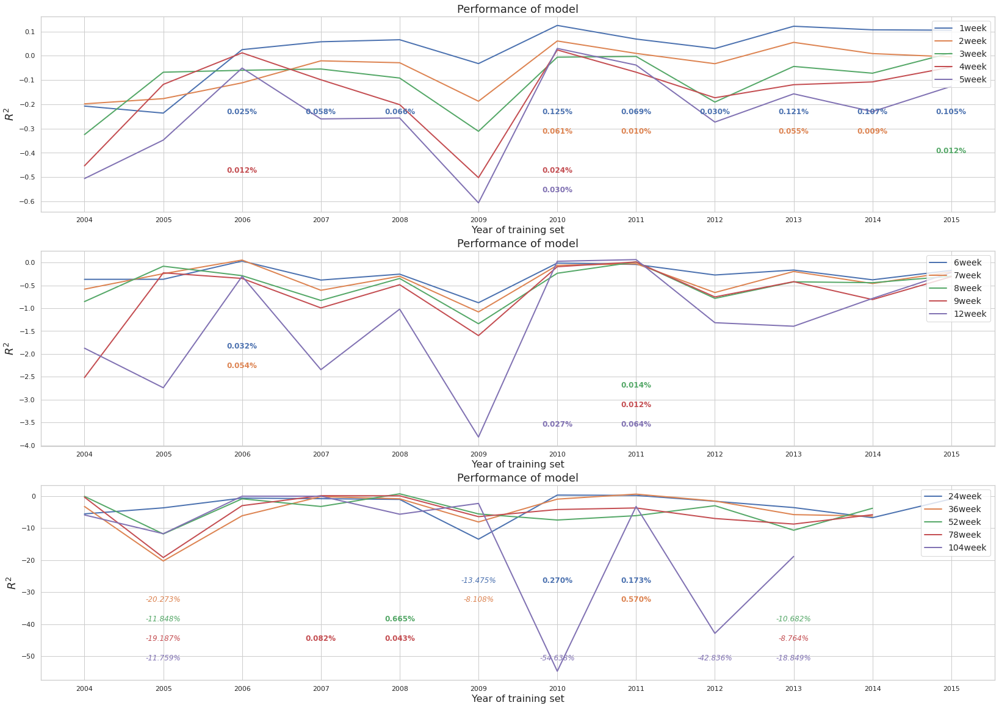

In [6]:
graph_comparison(scores_pca_pk) # light=True

In [7]:
visualize_selected(store_pca_pk, year=None)  # light=True

# Components ( in particular 1 and 2 ), explained below

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,PC1 (12),PC1 (12),PC1 (12),PC1 (12),PC1 (12),PC1 (12),US3YR (11),US3YR (11),US3YR (11),US3YR (12),PC2 (12),US5YR (11),PC2 (11),PC2 (11),PC1 (10)
1,ra_bex_PAPER (11),US5YR (8),US3YR (10),US3YR (10),US3YR (11),US3YR (11),PC1 (10),US5YR (10),PC1 (10),PC2 (10),PC1 (10),PC1 (10),VIX (11),ra_bex_PAPER (11),ra_bex_PAPER (10)
2,PC2 (10),US3YR (7),US5YR (9),US5YR (10),US5YR (9),US5YR (10),US5YR (10),PC1 (9),US5YR (9),PC1 (9),US5YR (9),PC2 (9),SENT (11),PC1 (10),US1YR (10)
3,US1YR (7),PC2 (7),PC2 (8),PC2 (8),PC2 (8),PC2 (8),PC2 (8),PC2 (8),PC2 (8),US5YR (9),US3YR (8),US3YR (7),PC1 (10),unc_bex_% (10),PC2 (9)
4,US2YR (6),ra_bex_PAPER (7),US2YR (7),US2YR (6),ra_bex_PAPER (6),US2YR (6),US2YR (7),US2YR (6),US2YR (7),unc_bex_PAPER (7),USInd (8),ra_bex_PAPER (6),PC3 (10),SENT (10),PC3 (9)
5,US3YR (6),US2YR (6),US1YR (5),ra_bex_PAPER (6),US2YR (5),ra_bex_PAPER (5),ra_bex_PAPER (5),ra_bex_PAPER (3),ra_bex_PAPER (4),USInd (5),mcsi (7),PC3 (5),USInst (9),PC3 (9),VIX (9)
6,unc_bex_PAPER (5),US1YR (5),ra_bex_PAPER (5),US1YR (3),US1YR (3),mcsi (2),USInst (2),unc_bex_PAPER (3),mcsi (3),US2YR (4),unc_bex_PAPER (7),VIX (5),PC4 (9),VIX (9),US10YR (9)
7,US5YR (1),unc_bex_PAPER (1),USInst (1),USInst (1),USInst (2),USInst (2),US1YR (1),USInst (3),unc_bex_PAPER (3),mcsi (4),PC3 (6),mcsi (5),ra_bex_PAPER (8),US10YR (9),USInst (9)
8,PC3 (1),,unc_bex_PAPER (1),unc_bex_PAPER (1),USInd (1),US1YR (1),mcsi (1),PC4 (2),USInst (3),ra_bex_PAPER (3),ra_bex_PAPER (6),USInst (5),US5YR (8),US1YR (9),USInd (9)
9,,,,,mcsi (1),US10YR (1),US10YR (1),US1YR (1),US10YR (2),USInst (3),USInst (5),PC4 (4),US10YR (8),mcsi (8),US2YR (8)


In [8]:
# SAME WITH FEATURE SELECTION

store_pca_pk2, scores_pca_pk2, agg_pca_pk2, preds_pca_pk2 = feature_selection_full(LinearRegression(), X_pca, Y, scaler=sc, score=score_off) # light_=False


100%|██████████| 15/15 [00:19<00:00,  1.29s/it]

Execution time for feature selection is  0.0  h : 0.0  m : 19.37  s


In [9]:
sort_aggregate(agg_pca_pk2, scores_pca_pk2)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.082001,,-0.004351,-0.018837
1,logret_3week,-0.384755,,0.022859,0.049282
2,logret_2week,-0.470152,,0.007180,0.023049
3,logret_5week,-0.474516,,0.057252,0.031551
4,logret_6week,-0.715450,,0.073205,0.024301
5,logret_7week,-0.750455,,-0.728086,-0.745326
6,logret_4week,-0.780838,,0.037579,0.039248
7,logret_36week,-0.896321,,-0.464094,0.384589
8,logret_8week,-1.180012,,0.075114,-0.077202
9,logret_9week,-1.693815,,-1.134544,-0.083716


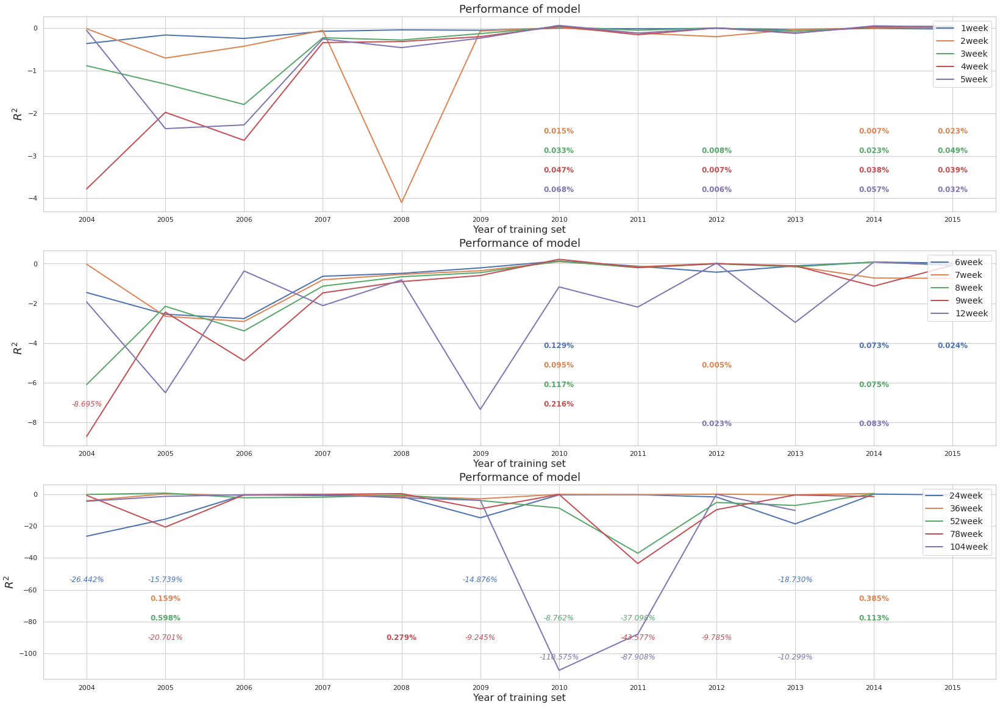

In [10]:
graph_comparison(scores_pca_pk2)

In [17]:
visualize_selected(store_pca_pk2, year=None, to_print=15)  # light=True

# but PCA not preponderant in number

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,US2YR (8),US2YR (9),US2YR (10),US2YR (10),US2YR (8),US2YR (8),US2YR (6),US3YR (7),US3YR (8),US2YR (9),US2YR (11),US2YR (10),US2YR (9),US2YR (9),US2YR (7)
1,US3YR (3),US3YR (5),US3YR (4),US3YR (3),US3YR (3),US3YR (7),SENT (4),US2YR (6),US2YR (7),SENT1 (8),US1YR (9),US3YR (8),US3YR (8),US3YR (9),US3YR (7)
2,SENT1 (2),US1YR (3),unc_bex_PAPER (2),unc_bex_PAPER (2),SENT (2),SENT (3),US3YR (4),SENT (3),US1YR (6),US3YR (7),US3YR (7),US5YR (5),US5YR (8),US5YR (8),US5YR (7)
3,SENT (2),unc_bex_% (1),unc_bex_% (2),unc_bex_% (2),unc_bex_PAPER (1),SENT1 (2),SENT1 (3),US1YR (2),US5YR (3),SENT (7),US5YR (7),US1YR (4),SENT (8),SENT (4),unc_bex_PAPER (6)
4,,US5YR (1),US5YR (1),US5YR (2),unc_bex_% (1),US1YR (2),T-Bill (3),unc_bex_PAPER (1),SENT (3),unc_bex_PAPER (4),T-Bill (6),SENT1 (3),US1YR (7),unc_bex_PAPER (3),unc_bex_% (6)
5,,ra_bex_PAPER (1),ra_bex_PAPER (1),SENT1 (2),SENT1 (1),unc_bex_PAPER (1),US1YR (3),unc_bex_% (1),SENT1 (3),US5YR (4),unc_bex_PAPER (6),US10YR (2),US10YR (5),unc_bex_% (3),US1YR (5)
6,,unc_bex_PAPER (1),VIX (1),SENT (2),US5YR (1),unc_bex_% (1),PC3 (2),SENT1 (1),T-Bill (3),VIX (4),unc_bex_% (6),SENT (1),SENT1 (4),US10YR (3),US10YR (5)
7,,T-Bill (1),SENT1 (1),ra_bex_PAPER (1),,US10YR (1),PC4 (2),,unc_bex_PAPER (2),mcsi (4),US10YR (6),unc_bex_PAPER (1),unc_bex_PAPER (2),ra_bex_PAPER (1),VIX (4)
8,,US10YR (1),SENT (1),US1YR (1),,US5YR (1),US5YR (2),,unc_bex_% (2),USInd (4),USInd (5),unc_bex_% (1),unc_bex_% (1),VIX (1),SENT (4)
9,,SENT1 (1),US1YR (1),VIX (1),,T-Bill (1),US10YR (2),,US10YR (2),T-Bill (4),SENT1 (5),,,SENT1 (1),ra_bex_PAPER (3)


In [16]:
print_pca(store_pca_pk2, pc, pricing_kernel, to_print=4)

PC4
44.2 % of component's direction: slopem10
19.3 % of component's direction: convexm2
13.1 % of component's direction: slopep2

PC3
49.9 % of component's direction: convexp2
20.9 % of component's direction: slopem10

PC1
19.3 % of component's direction: slopep10
18.9 % of component's direction: slopep5
17.6 % of component's direction: convexm2
17.2 % of component's direction: point0

PC2
24.9 % of component's direction: slopem2
23.3 % of component's direction: slopem5
18.0 % of component's direction: slopem10
13.5 % of component's direction: slopep2



#### PCA on all available regressors

In [18]:

# Generation dataset with PC

X, Y = reinitialize()
X_pca, pc_full = fit_pca(X)  # perc=0.9

#with warnings.catch_warnings():
    #warnings.simplefilter("ignore", category=ConvergenceWarning)
    
store_pca_all, scores_pca_all, agg_pca_all, preds_pca_all = lasso(X_pca, Y, thresh_prop = 2, scor=score_off)  # no standardization, # light_=False

7 components explain  90% of the variance for the selected columns ['point0', 'slopem2', 'slopep2', 'slopem5', 'slopep5', 'slopem10', 'slopep10', 'convexp2', 'convexm2', 'T-Bill', 'ra_bex_PAPER', 'unc_bex_PAPER', 'unc_bex_%', 'VIX', 'US1YR', 'US2YR', 'US3YR', 'US5YR', 'US10YR', 'mcsi', 'SENT', 'SENT1', 'USInst', 'USInd'] 

The 1° explains  32.8%%
The 2° explains  23.6%%
The 3° explains  16.1%%
The 4° explains  7.9%%
The 5° explains  4.8%%
The 6° explains  3.3%%
The 7° explains  2.5%%


100%|██████████| 15/15 [00:12<00:00,  1.21it/s]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_1week
1. logret_4week
2. logret_5week
3. logret_2week
4. logret_3week
5. logret_6week
6. logret_7week
7. logret_8week
8. logret_9week
9. logret_12week
10. logret_24week
11. logret_36week
12. logret_52week
13. logret_104week
14. logret_78week
Execution time for lasso is  0.0  h : 0.0  m : 12.45  s


In [19]:
sort_aggregate(agg_pca_all, scores_pca_all)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.048842,,0.066197,0.072069
1,logret_2week,-0.153968,,-0.009525,0.010846
2,logret_3week,-0.299082,,-0.106134,-0.083001
3,logret_4week,-0.406093,,-0.148093,-0.109470
4,logret_5week,-0.422621,,-0.304057,-0.178066
5,logret_6week,-0.506168,,-0.461324,-0.211198
6,logret_7week,-0.634774,,-0.660114,-0.271036
7,logret_8week,-0.877165,,-0.913153,-0.343201
8,logret_9week,-0.993823,,-1.178213,-0.577087
9,logret_12week,-1.729351,,-1.346429,-0.350223


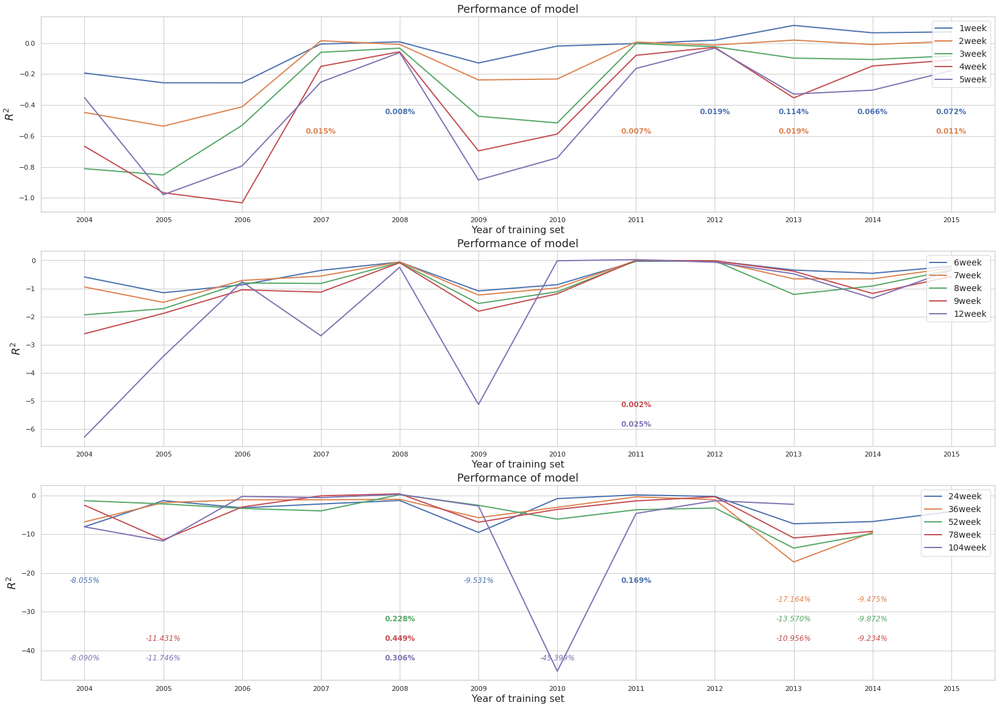

In [20]:
graph_comparison(scores_pca_all)

In [21]:
visualize_selected(store_pca_all, year=None)  # light=True

# PC2 and PC3 led mostly by PK variables

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,PC2 (12),PC2 (12),PC2 (10),PC1 (10),PC1 (10),PC3 (11),PC1 (10),PC1 (10),PC1 (10),PC1 (11),PC1 (12),PC1 (11),PC1 (11),PC1 (11),PC1 (10)
1,PC3 (10),PC3 (10),PC3 (10),PC2 (10),PC3 (10),PC1 (10),PC3 (10),PC3 (10),PC3 (10),PC2 (11),PC3 (12),PC3 (11),PC3 (11),PC2 (11),PC2 (10)
2,PC1 (4),PC1 (8),PC1 (9),PC3 (10),PC2 (9),PC2 (9),PC2 (9),PC2 (9),PC2 (9),PC3 (11),PC2 (11),PC2 (10),PC2 (10),PC3 (11),PC6 (10)
3,,PC4 (1),PC4 (2),PC4 (3),PC4 (4),PC4 (5),PC4 (4),PC4 (4),PC4 (4),PC4 (8),PC4 (10),PC6 (6),PC6 (10),PC5 (11),PC3 (9)
4,,,,,PC6 (2),PC6 (3),PC6 (4),PC6 (3),PC6 (3),PC6 (8),PC6 (5),PC4 (5),PC7 (10),PC4 (10),PC4 (8)
5,,,,,,PC5 (2),PC5 (2),PC5 (1),PC5 (1),PC5 (1),PC7 (4),PC7 (5),PC4 (8),PC7 (9),PC5 (7)
6,,,,,,,,,,PC7 (1),PC5 (4),PC5 (3),PC5 (6),PC6 (8),PC7 (6)


In [27]:
print_pca(store_pca_all, pc_full, X.columns, to_print=3)

PC3
18.7 % of component's direction: slopem10
17.6 % of component's direction: slopem5
13.7 % of component's direction: slopem2
7.5 % of component's direction: point0
6.1 % of component's direction: USInd
5.5 % of component's direction: SENT
5.2 % of component's direction: convexp2

PC2
13.6 % of component's direction: slopep10
11.5 % of component's direction: slopep5
9.1 % of component's direction: VIX
8.1 % of component's direction: point0
7.8 % of component's direction: unc_bex_%
7.5 % of component's direction: convexm2
7.3 % of component's direction: unc_bex_PAPER
7.1 % of component's direction: slopep2

PC1
9.8 % of component's direction: US3YR
9.6 % of component's direction: US5YR
9.5 % of component's direction: US2YR
8.7 % of component's direction: US1YR
8.3 % of component's direction: T-Bill
7.4 % of component's direction: US10YR
6.2 % of component's direction: USInd
6.1 % of component's direction: mcsi
4.5 % of component's direction: unc_bex_%



In [28]:
# SAME WITH FEATURE SELECTION 

store_pca_all2, scores_pca_all2, agg_pca_all2, preds_pca_all2 = feature_selection_full(LinearRegression(), X_pca, Y, score=score_off)


100%|██████████| 15/15 [00:05<00:00,  2.81it/s]

Execution time for feature selection is  0.0  h : 0.0  m : 5.34  s


In [29]:
sort_aggregate(agg_pca_all2, scores_pca_all2)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.016537,,0.092868,0.148730
1,logret_2week,-0.319469,,-0.155829,-0.008127
2,logret_3week,-0.517377,,-0.136648,-0.119502
3,logret_4week,-0.828303,,-0.202916,-0.185393
4,logret_7week,-0.999681,,-1.058274,-0.559784
5,logret_5week,-1.013471,,-0.107256,-0.307704
6,logret_6week,-1.388236,,-1.922374,-0.404544
7,logret_8week,-1.536597,,-1.500516,-0.732165
8,logret_9week,-1.558470,,-1.175378,-0.780914
9,logret_12week,-2.499380,,-1.654261,-0.805223


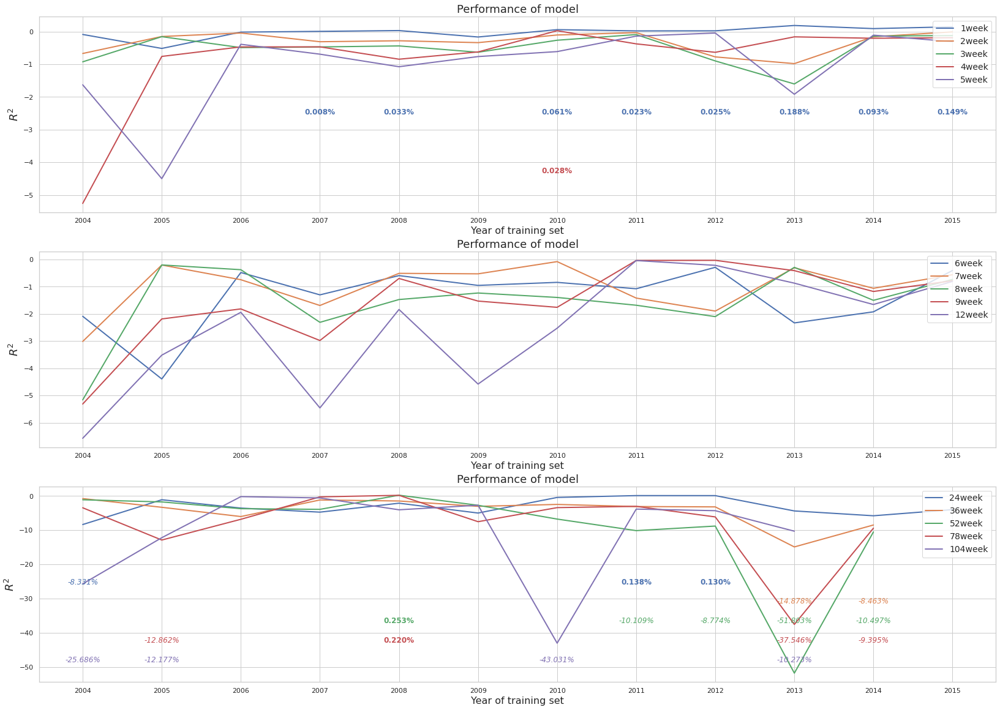

In [30]:
graph_comparison(scores_pca_all2)

In [31]:
visualize_selected(store_pca_all2, year=None)  # light=True

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,PC2 (9),PC2 (6),PC1 (7),PC2 (10),PC1 (9),PC3 (10),PC1 (10),PC1 (8),PC1 (10),PC1 (10),PC1 (12),PC1 (11),PC1 (11),PC1 (11),PC6 (9)
1,PC3 (4),PC1 (5),PC2 (6),PC1 (9),PC2 (8),PC1 (9),PC3 (9),PC3 (7),PC3 (10),PC2 (9),PC2 (12),PC3 (8),PC3 (10),PC3 (10),PC1 (9)
2,PC6 (2),PC3 (3),PC3 (5),PC3 (6),PC3 (6),PC2 (6),PC2 (7),PC2 (5),PC2 (9),PC3 (8),PC4 (11),PC6 (6),PC6 (4),PC4 (6),PC4 (8)
3,PC4 (1),PC6 (2),,PC5 (1),PC4 (1),PC5 (3),PC6 (5),PC6 (4),PC6 (6),PC4 (6),PC3 (9),PC2 (5),PC4 (3),PC5 (5),PC3 (7)
4,,PC7 (1),,PC6 (1),PC5 (1),PC4 (2),PC7 (2),PC4 (2),PC4 (5),PC6 (4),PC6 (9),PC7 (5),PC7 (3),PC7 (4),PC2 (5)
5,,,,,,,PC4 (1),PC5 (1),PC7 (3),PC7 (2),PC7 (8),PC4 (1),PC5 (2),PC2 (2),PC7 (5)
6,,,,,,,PC5 (1),PC7 (1),PC5 (1),PC5 (1),PC5 (2),,PC2 (2),PC6 (1),PC5 (4)


#### PCA on Interactions of Regressor + Linear Regressors

In [33]:
tot_names = X.columns.to_list()
interaction_names = []
for idx, first in enumerate(X.columns):
    for second in X.columns[idx+1:]:
        tot_names.append(str(first) + " * " + second)
        interaction_names.append(str(first) + " * " + second)

In [34]:
# PCA ON INTERACTIONS + LINEAR REGRESSORS (STANDARDIZED, including Convex)

X, Y = reinitialize()

# Standardization (only for scale, exlucing PK except convex)
var = ['mcsi', 'VIX', 'USInst', 'USInd'] + ['convexp2', 'convexm2'] + X.columns[X.columns.str.contains(r'\Bbex\B')].to_list()
bill = X.columns[X.columns.str.contains(r'YR\b')].to_list() + ['T-Bill']
sent = ['SENT', 'SENT1']

prop = {RobustScaler(): var, MaxAbsScaler(): sent, StandardScaler(): bill}

trans_poly = {PolynomialFeatures(degree=2, interaction_only=True, include_bias=False): [tot_names, False]}
X_eng, _ = transform(trans_poly, X, X.columns)  # created interactions from standardized variable + standardized variable

X_pca, pc_interac = fit_pca(X_eng, col=interaction_names)  # perc=0.9, PCA ONLY ON INTERACTIONS
    
store_pca_int, scores_pca_int, agg_pca_int, preds_pca_int = lasso(X_pca, Y, scaler=prop, scor=score_off)  # light_=False, thresh_prop

10 components explain  90% of the variance for the selected columns ['point0 * slopem2', 'point0 * slopep2', 'point0 * slopem5', 'point0 * slopep5', 'point0 * slopem10', 'point0 * slopep10', 'point0 * convexp2', 'point0 * convexm2', 'point0 * T-Bill', 'point0 * ra_bex_PAPER', 'point0 * unc_bex_PAPER', 'point0 * unc_bex_%', 'point0 * VIX', 'point0 * US1YR', 'point0 * US2YR', 'point0 * US3YR', 'point0 * US5YR', 'point0 * US10YR', 'point0 * mcsi', 'point0 * SENT', 'point0 * SENT1', 'point0 * USInst', 'point0 * USInd', 'slopem2 * slopep2', 'slopem2 * slopem5', 'slopem2 * slopep5', 'slopem2 * slopem10', 'slopem2 * slopep10', 'slopem2 * convexp2', 'slopem2 * convexm2', 'slopem2 * T-Bill', 'slopem2 * ra_bex_PAPER', 'slopem2 * unc_bex_PAPER', 'slopem2 * unc_bex_%', 'slopem2 * VIX', 'slopem2 * US1YR', 'slopem2 * US2YR', 'slopem2 * US3YR', 'slopem2 * US5YR', 'slopem2 * US10YR', 'slopem2 * mcsi', 'slopem2 * SENT', 'slopem2 * SENT1', 'slopem2 * USInst', 'slopem2 * USInd', 'slopep2 * slopem5', 'slo

100%|██████████| 15/15 [01:34<00:00,  6.33s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_1week
1. logret_3week
2. logret_2week
3. logret_4week
4. logret_6week
5. logret_5week
6. logret_7week
7. logret_8week
8. logret_9week
9. logret_12week
10. logret_36week
11. logret_24week
12. logret_104week
13. logret_78week
14. logret_52week
Execution time for lasso is  0.0  h : 1.0  m : 34.95  s


In [35]:
sort_aggregate(agg_pca_int, scores_pca_int)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.069174,,-0.058611,0.017952
1,logret_2week,-0.133773,,-0.053884,0.024851
2,logret_3week,-0.243162,,-0.084704,0.009383
3,logret_4week,-0.401324,,-0.103984,-0.040325
4,logret_5week,-0.590901,,-0.171945,-0.095798
5,logret_6week,-0.684043,,-0.249862,-0.113926
6,logret_8week,-0.740068,,-0.606338,-0.169777
7,logret_7week,-0.823842,,-0.371214,-0.135046
8,logret_9week,-1.109061,,-0.782769,-0.173277
9,logret_12week,-1.585890,,-0.749858,-0.077524


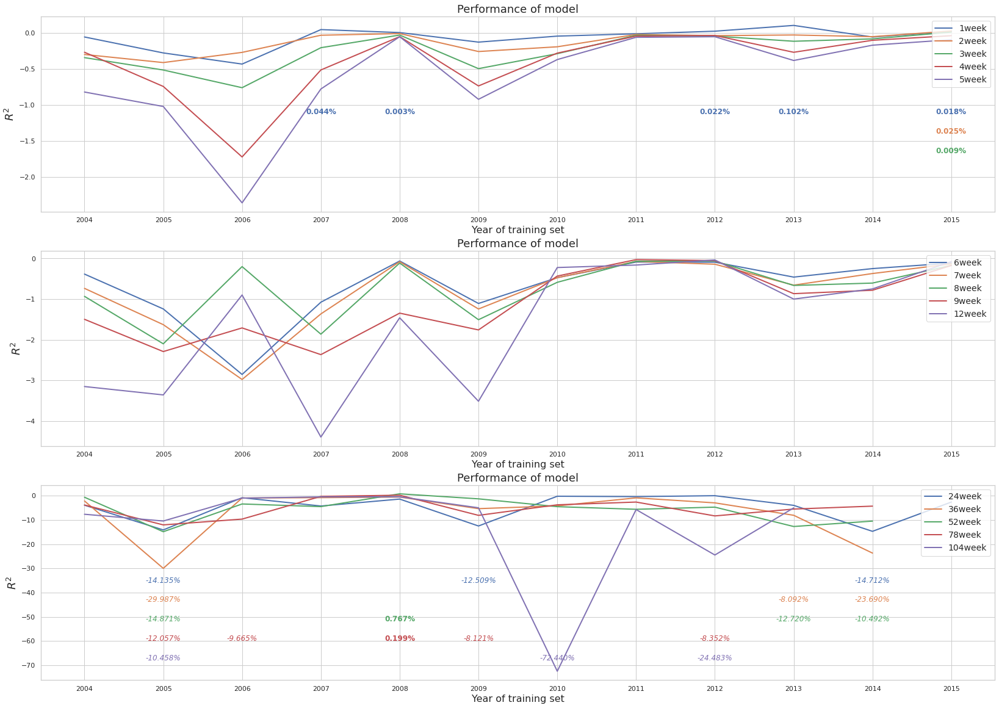

In [36]:
graph_comparison(scores_pca_int)

In [37]:
visualize_selected(store_pca_int, year=None)  # light=True

# PC3 is mostly interaction of PK with macro variables

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,PC3 (10),PC1 (11),PC1 (11),PC1 (11),PC1 (11),PC1 (12),PC1 (12),PC1 (12),PC1 (12),PC1 (12),PC1 (12),PC1 (10),PC1 (11),PC1 (11),PC2 (10)
1,PC1 (9),PC3 (10),PC3 (10),PC3 (9),PC3 (8),PC3 (8),PC3 (8),PC3 (9),PC3 (9),PC3 (12),PC3 (12),PC2 (9),PC10 (11),PC2 (11),PC3 (10)
2,PC2 (5),PC4 (4),PC4 (4),PC4 (4),PC2 (5),PC2 (4),PC2 (7),PC2 (8),PC2 (8),PC4 (12),PC5 (11),PC3 (9),PC4 (10),PC3 (11),PC1 (9)
3,PC4 (3),PC2 (2),PC2 (1),PC2 (2),PC4 (4),PC4 (4),PC4 (5),PC4 (6),PC4 (8),PC2 (11),PC6 (11),PC6 (9),PC6 (10),PC6 (11),PC6 (9)
4,PC6 (3),unc_bex_PAPER (1),unc_bex_PAPER (1),PC6 (1),PC6 (1),unc_bex_PAPER (1),unc_bex_PAPER (1),PC7 (2),PC7 (4),PC7 (10),PC8 (11),PC8 (9),PC7 (10),PC7 (10),PC4 (8)
5,PC8 (3),,,unc_bex_PAPER (1),unc_bex_PAPER (1),,,PC5 (1),PC8 (4),PC8 (9),PC7 (10),PC10 (9),PC9 (10),PC10 (10),PC7 (8)
6,PC7 (2),,,,,,,PC6 (1),PC9 (3),PC10 (6),PC10 (10),PC5 (8),PC3 (10),PC5 (9),PC5 (8)
7,ra_bex_PAPER (2),,,,,,,PC8 (1),mcsi (3),PC6 (6),PC2 (10),mcsi (8),PC8 (8),PC4 (8),PC10 (6)
8,US2YR (1),,,,,,,PC9 (1),PC5 (2),PC9 (5),PC4 (9),PC4 (7),USInd (8),PC8 (7),PC8 (5)
9,US3YR (1),,,,,,,mcsi (1),PC10 (2),mcsi (5),mcsi (7),USInd (7),PC2 (8),mcsi (7),USInst (4)


In [45]:
print_pca(store_pca_int, pc_interac, interaction_names, to_print=2)


PC1
1.2 % of component's direction: US3YR * US10YR
1.2 % of component's direction: US3YR * USInd
1.2 % of component's direction: US5YR * US10YR
1.2 % of component's direction: US5YR * USInd
1.1 % of component's direction: unc_bex_% * US2YR
1.1 % of component's direction: unc_bex_% * US3YR
1.1 % of component's direction: US2YR * US5YR
1.1 % of component's direction: US2YR * US10YR
1.1 % of component's direction: US2YR * mcsi
1.1 % of component's direction: US2YR * USInst
1.1 % of component's direction: US2YR * USInd
1.1 % of component's direction: US3YR * US5YR
1.1 % of component's direction: US3YR * mcsi
1.1 % of component's direction: US3YR * USInst
1.1 % of component's direction: US5YR * mcsi
1.1 % of component's direction: US5YR * USInst
1.0 % of component's direction: point0 * T-Bill
1.0 % of component's direction: point0 * US1YR
1.0 % of component's direction: point0 * US2YR
1.0 % of component's direction: point0 * US3YR
1.0 % of component's direction: T-Bill * ra_bex_PAPER
1.0 % 

In [39]:
# SAME WITH FEATURE SELECTION 

prop = {RobustScaler(): var, MaxAbsScaler(): sent, StandardScaler(): bill}

store_pca_int2, scores_pca_int2, agg_pca_int2, preds_pca_int2 = feature_selection_full(LinearRegression(), X_pca, Y, scaler=prop, score=score_off)


100%|██████████| 15/15 [00:39<00:00,  2.66s/it]

Execution time for feature selection is  0.0  h : 0.0  m : 39.94  s


In [40]:
sort_aggregate(agg_pca_int2, scores_pca_int2)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.077719,,-0.006595,-0.018837
1,logret_3week,-0.325437,,-0.063420,0.049282
2,logret_2week,-0.402521,,-0.304234,0.022881
3,logret_4week,-0.682756,,0.037579,0.039248
4,logret_7week,-0.943698,,-0.836939,-0.330708
5,logret_5week,-1.083202,,0.057252,0.031551
6,logret_8week,-1.800613,,-3.626197,-0.077202
7,logret_6week,-1.934685,,0.073205,0.024301
8,logret_9week,-2.242563,,0.052268,-0.809113
9,logret_36week,-2.284996,,-2.499826,-3.549530


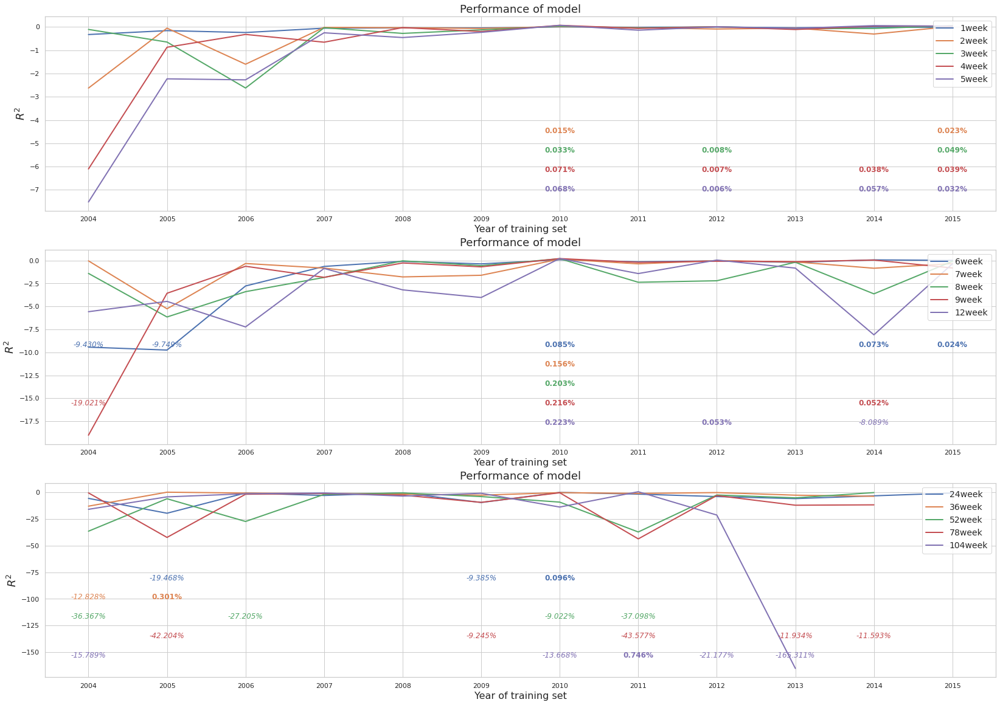

In [41]:
graph_comparison(scores_pca_int2)

In [42]:
visualize_selected(store_pca_int2, year=None)  # light=True

# works well with Slope very present but PCA not much selected

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,US2YR (7),US2YR (6),US2YR (9),US2YR (7),US2YR (7),US2YR (6),US2YR (8),US2YR (7),US2YR (7),slopem2 (6),US3YR (8),US2YR (8),US2YR (10),US2YR (9),US2YR (7)
1,SENT (3),slopep2 (3),US3YR (3),slopep2 (3),US3YR (4),US3YR (5),US1YR (6),US3YR (6),US3YR (7),SENT (5),US2YR (7),US3YR (8),SENT (7),US3YR (7),point0 (6)
2,slopem5 (1),US3YR (3),slopem2 (2),US3YR (3),US5YR (2),slopep2 (3),US3YR (6),slopep2 (4),US1YR (5),slopep2 (4),unc_bex_% (6),US5YR (7),US3YR (6),SENT (6),US3YR (6)
3,SENT1 (1),point0 (1),US1YR (2),unc_bex_% (2),SENT (2),SENT (3),slopep2 (4),US5YR (3),slopem2 (4),US2YR (4),US5YR (6),slopem5 (3),US1YR (5),US5YR (5),US1YR (6)
4,,ra_bex_PAPER (1),unc_bex_% (1),unc_bex_PAPER (1),slopep2 (1),slopem2 (3),SENT (4),SENT (3),SENT (3),US3YR (4),US10YR (6),US10YR (3),US5YR (5),slopep5 (5),US5YR (5)
5,,US1YR (1),slopep2 (1),slopem5 (1),SENT1 (1),unc_bex_% (1),US5YR (4),SENT1 (3),US5YR (2),SENT1 (4),T-Bill (6),SENT1 (3),US10YR (4),slopem2 (4),slopep10 (4)
6,,,slopep5 (1),US1YR (1),T-Bill (1),US5YR (1),T-Bill (4),slopem2 (3),SENT1 (2),slopep5 (4),slopem2 (5),slopem2 (2),point0 (3),US10YR (4),slopep2 (4)
7,,,T-Bill (1),,US1YR (1),US10YR (1),SENT1 (3),T-Bill (3),slopep2 (1),US1YR (4),unc_bex_PAPER (5),slopep2 (2),slopem2 (3),US1YR (4),slopem2 (4)
8,,,US5YR (1),,,SENT1 (1),US10YR (2),US1YR (3),slopep5 (1),T-Bill (4),SENT1 (4),US1YR (2),slopep2 (3),slopep2 (3),US10YR (3)
9,,,,,,USInst (1),unc_bex_PAPER (1),unc_bex_% (2),slopem10 (1),US5YR (3),US1YR (4),unc_bex_% (2),slopem10 (2),unc_bex_PAPER (3),T-Bill (3)


In [47]:
print_pca(store_pca_int2, pc_interac, interaction_names, to_print=2)


PC2
1.4 % of component's direction: slopep10 * US5YR
1.4 % of component's direction: slopep10 * US10YR
1.3 % of component's direction: slopep5 * ra_bex_PAPER
1.3 % of component's direction: slopep5 * unc_bex_PAPER
1.3 % of component's direction: slopep10 * US2YR
1.3 % of component's direction: slopep10 * US3YR
1.3 % of component's direction: slopep10 * USInd
1.2 % of component's direction: slopep5 * unc_bex_%
1.2 % of component's direction: slopep5 * VIX
1.2 % of component's direction: slopep5 * US5YR
1.2 % of component's direction: slopep5 * US10YR
1.2 % of component's direction: slopep5 * mcsi
1.2 % of component's direction: slopep5 * USInst
1.2 % of component's direction: slopep5 * USInd
1.2 % of component's direction: slopep10 * ra_bex_PAPER
1.2 % of component's direction: slopep10 * unc_bex_%
1.2 % of component's direction: slopep10 * mcsi
1.2 % of component's direction: slopep10 * USInst
1.1 % of component's direction: point0 * slopep10
1.1 % of component's direction: slopep5 * U

#### PCA On all (Macro + PK + Interactions)

In [48]:


X, Y = reinitialize()

trans_poly = {PolynomialFeatures(degree=2, interaction_only=True, include_bias=False): [tot_names, False]}
X_eng, _ = transform(trans_poly, X, X.columns)  # created interactions from standardized variable + standardized variable

X_pca, pc_tot = fit_pca(X_eng, col=tot_names)  # perc=0.9, PCA ONLY ON INTERACTIONS
    
store_pca_tot, scores_pca_tot, agg_pca_tot, preds_pca_tot = lasso(X_pca, Y, scor=score_off)  # no standardization, light_=False, thresh_prop=2

10 components explain  90% of the variance for the selected columns ['point0', 'slopem2', 'slopep2', 'slopem5', 'slopep5', 'slopem10', 'slopep10', 'convexp2', 'convexm2', 'T-Bill', 'ra_bex_PAPER', 'unc_bex_PAPER', 'unc_bex_%', 'VIX', 'US1YR', 'US2YR', 'US3YR', 'US5YR', 'US10YR', 'mcsi', 'SENT', 'SENT1', 'USInst', 'USInd', 'point0 * slopem2', 'point0 * slopep2', 'point0 * slopem5', 'point0 * slopep5', 'point0 * slopem10', 'point0 * slopep10', 'point0 * convexp2', 'point0 * convexm2', 'point0 * T-Bill', 'point0 * ra_bex_PAPER', 'point0 * unc_bex_PAPER', 'point0 * unc_bex_%', 'point0 * VIX', 'point0 * US1YR', 'point0 * US2YR', 'point0 * US3YR', 'point0 * US5YR', 'point0 * US10YR', 'point0 * mcsi', 'point0 * SENT', 'point0 * SENT1', 'point0 * USInst', 'point0 * USInd', 'slopem2 * slopep2', 'slopem2 * slopem5', 'slopem2 * slopep5', 'slopem2 * slopem10', 'slopem2 * slopep10', 'slopem2 * convexp2', 'slopem2 * convexm2', 'slopem2 * T-Bill', 'slopem2 * ra_bex_PAPER', 'slopem2 * unc_bex_PAPER', 

100%|██████████| 15/15 [00:15<00:00,  1.01s/it]

Ranking of dependent with greater amount of penalization required (agg.):
0. logret_1week
1. logret_3week
2. logret_2week
3. logret_4week
4. logret_6week
5. logret_5week
6. logret_7week
7. logret_8week
8. logret_9week
9. logret_12week
10. logret_36week
11. logret_24week
12. logret_52week
13. logret_104week
14. logret_78week
Execution time for lasso is  0.0  h : 0.0  m : 15.17  s


In [49]:
sort_aggregate(agg_pca_tot, scores_pca_tot)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.053578,,-0.051324,0.023286
1,logret_2week,-0.141572,,-0.074679,-0.011161
2,logret_3week,-0.266105,,-0.095284,-0.040932
3,logret_4week,-0.382949,,-0.113933,-0.049207
4,logret_5week,-0.518051,,-0.174344,-0.096095
5,logret_6week,-0.635002,,-0.240173,-0.119663
6,logret_8week,-0.651276,,-0.560205,-0.187291
7,logret_7week,-0.755435,,-0.321602,-0.150473
8,logret_9week,-0.851748,,-0.732722,-0.185443
9,logret_12week,-2.403558,,-0.698399,-0.094315


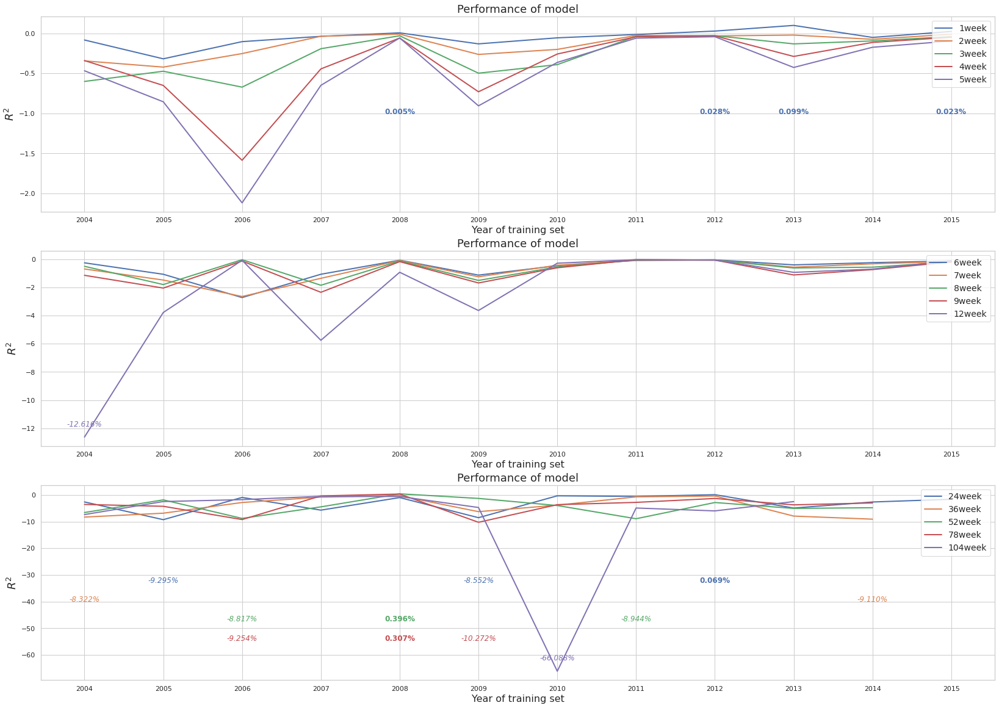

In [50]:
graph_comparison(scores_pca_tot)

In [51]:
visualize_selected(store_pca_tot, year=None)  # light=True

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,PC2 (10),PC1 (11),PC1 (11),PC1 (11),PC1 (11),PC1 (12),PC1 (12),PC1 (12),PC1 (12),PC1 (12),PC1 (12),PC1 (11),PC1 (11),PC1 (11),PC1 (10)
1,PC3 (9),PC3 (10),PC3 (10),PC3 (9),PC3 (9),PC3 (8),PC3 (8),PC3 (9),PC3 (9),PC4 (11),PC2 (12),PC3 (10),PC2 (11),PC2 (11),PC2 (10)
2,PC1 (7),PC2 (4),PC4 (4),PC4 (4),PC4 (4),PC4 (4),PC2 (5),PC2 (6),PC2 (8),PC3 (10),PC3 (12),PC2 (10),PC3 (11),PC3 (11),PC4 (10)
3,PC9 (4),PC4 (3),PC2 (2),PC2 (1),PC7 (2),PC2 (2),PC4 (5),PC4 (6),PC4 (6),PC2 (9),PC4 (11),PC5 (4),PC4 (10),PC4 (11),PC3 (9)
4,PC10 (2),,PC6 (1),PC6 (1),PC2 (1),PC7 (2),PC7 (2),PC7 (2),PC5 (1),PC7 (8),PC8 (11),PC6 (4),PC5 (10),PC5 (11),PC5 (9)
5,PC4 (2),,,,,,,PC5 (1),PC6 (1),PC8 (5),PC6 (10),PC7 (4),PC10 (10),PC6 (11),PC6 (8)
6,PC5 (2),,,,,,,PC6 (1),PC8 (1),PC6 (4),PC5 (10),PC8 (4),PC6 (8),PC10 (10),PC10 (7)
7,PC6 (2),,,,,,,PC8 (1),PC9 (1),PC5 (2),PC7 (8),PC10 (4),PC8 (7),PC7 (9),PC7 (6)
8,PC7 (2),,,,,,,PC9 (1),PC7 (1),PC9 (2),PC10 (7),PC4 (3),PC7 (7),PC8 (8),PC9 (3)
9,PC8 (2),,,,,,,,,PC10 (2),PC9 (5),PC9 (1),PC9 (3),PC9 (7),PC8 (3)


In [52]:
print_pca(store_pca_tot, pc_tot, tot_names, to_print=2)


PC1
1.1 % of component's direction: US5YR
1.1 % of component's direction: US2YR * US10YR
1.1 % of component's direction: US2YR * USInd
1.1 % of component's direction: US3YR * US5YR
1.1 % of component's direction: US3YR * US10YR
1.1 % of component's direction: US3YR * mcsi
1.1 % of component's direction: US3YR * USInd
1.1 % of component's direction: US5YR * US10YR
1.1 % of component's direction: US5YR * mcsi
1.1 % of component's direction: US5YR * USInd
1.0 % of component's direction: US2YR
1.0 % of component's direction: US3YR
1.0 % of component's direction: point0 * US1YR
1.0 % of component's direction: point0 * US2YR
1.0 % of component's direction: point0 * US3YR
1.0 % of component's direction: unc_bex_% * US2YR
1.0 % of component's direction: unc_bex_% * US3YR
1.0 % of component's direction: US1YR * US10YR
1.0 % of component's direction: US1YR * USInd
1.0 % of component's direction: US2YR * US5YR
1.0 % of component's direction: US2YR * mcsi
1.0 % of component's direction: US2YR * US

In [53]:
# SAME WITH FEATURE SELECTION 

store_pca_tot2, scores_pca_tot2, agg_pca_tot2, preds_pca_tot2 = feature_selection_full(LinearRegression(), X_pca, Y, score=score_off) # light_=False


100%|██████████| 15/15 [00:07<00:00,  2.02it/s]

Execution time for feature selection is  0.0  h : 0.0  m : 7.43  s


In [54]:
sort_aggregate(agg_pca_tot2, scores_pca_tot2)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.238789,,-1.591554,-0.067595
1,logret_2week,-0.373759,,-0.943505,-0.096088
2,logret_3week,-0.405828,,-0.101652,-0.250722
3,logret_4week,-0.627351,,-0.418806,-0.315753
4,logret_5week,-0.841512,,-0.523106,-0.182156
5,logret_6week,-1.194271,,-0.411501,-0.225077
6,logret_8week,-1.336253,,-0.785619,-0.384657
7,logret_7week,-1.507063,,-0.540783,-0.292708
8,logret_9week,-1.639667,,-1.026390,-0.413713
9,logret_12week,-2.663645,,-0.024894,-0.096633


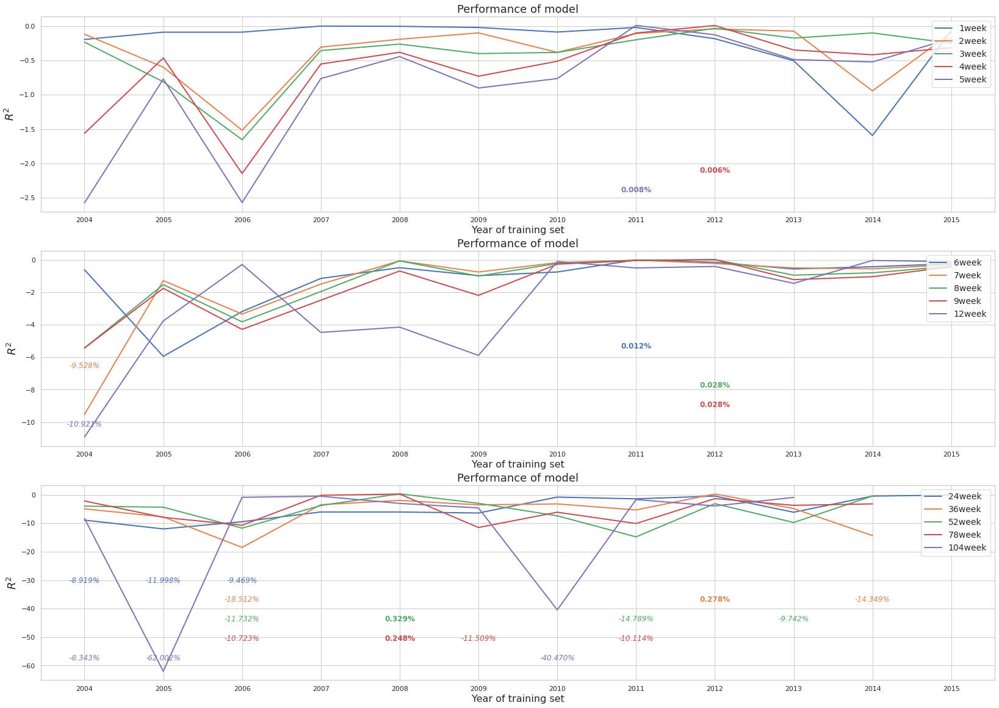

In [55]:
graph_comparison(scores_pca_tot2)

In [56]:
visualize_selected(store_pca_tot2, year=None)  # light=True

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,PC9 (8),PC8 (10),PC1 (7),PC1 (8),PC1 (8),PC1 (8),PC1 (9),PC1 (9),PC1 (9),PC1 (11),PC1 (12),PC1 (11),PC1 (11),PC1 (11),PC1 (9)
1,PC8 (3),PC1 (6),PC8 (6),PC3 (6),PC9 (6),PC3 (7),PC9 (6),PC9 (6),PC9 (6),PC10 (5),PC10 (8),PC10 (8),PC10 (10),PC2 (11),PC2 (9)
2,PC3 (3),PC9 (5),PC10 (5),PC9 (5),PC3 (6),PC9 (6),PC3 (6),PC3 (4),PC3 (4),PC4 (4),PC4 (5),PC7 (7),PC3 (7),PC3 (11),PC10 (8)
3,PC10 (3),PC10 (5),PC3 (4),PC10 (4),PC10 (2),PC10 (5),PC10 (5),PC10 (3),PC10 (3),PC7 (4),PC5 (5),PC5 (6),PC5 (6),PC10 (11),PC5 (8)
4,PC1 (1),PC3 (4),PC9 (3),PC8 (2),PC8 (2),PC8 (2),PC4 (1),PC2 (1),PC2 (1),PC3 (4),PC8 (5),PC2 (5),PC2 (5),PC5 (9),PC3 (7)
5,PC4 (1),PC7 (1),PC7 (2),PC4 (1),PC5 (1),,PC5 (1),PC4 (1),PC4 (1),PC8 (3),PC9 (5),PC8 (5),PC9 (5),PC9 (7),PC4 (5)
6,PC7 (1),,,PC7 (1),PC4 (1),,PC8 (1),PC5 (1),PC5 (1),PC9 (3),PC2 (4),PC9 (5),PC7 (4),PC6 (7),PC7 (4)
7,,,,,PC7 (1),,,PC6 (1),PC6 (1),PC2 (2),PC3 (4),PC3 (5),PC6 (3),PC4 (4),PC9 (4)
8,,,,,,,,PC7 (1),PC8 (1),PC5 (1),PC6 (4),PC6 (4),PC8 (1),PC7 (4),PC6 (4)
9,,,,,,,,PC8 (1),,PC6 (1),PC7 (4),PC4 (1),PC4 (1),PC8 (3),


In [57]:
print_pca(store_pca_tot2, pc_tot, tot_names, to_print=2)


PC1
1.1 % of component's direction: US5YR
1.1 % of component's direction: US2YR * US10YR
1.1 % of component's direction: US2YR * USInd
1.1 % of component's direction: US3YR * US5YR
1.1 % of component's direction: US3YR * US10YR
1.1 % of component's direction: US3YR * mcsi
1.1 % of component's direction: US3YR * USInd
1.1 % of component's direction: US5YR * US10YR
1.1 % of component's direction: US5YR * mcsi
1.1 % of component's direction: US5YR * USInd
1.0 % of component's direction: US2YR
1.0 % of component's direction: US3YR
1.0 % of component's direction: point0 * US1YR
1.0 % of component's direction: point0 * US2YR
1.0 % of component's direction: point0 * US3YR
1.0 % of component's direction: unc_bex_% * US2YR
1.0 % of component's direction: unc_bex_% * US3YR
1.0 % of component's direction: US1YR * US10YR
1.0 % of component's direction: US1YR * USInd
1.0 % of component's direction: US2YR * US5YR
1.0 % of component's direction: US2YR * mcsi
1.0 % of component's direction: US2YR * US

In general PCA on Pricing Kernel variables works better than all the rest

### Grid Search

In [ ]:
# we try different models and transformations, trying to escape negative R^2
# implement our own function with GridSearchCV recursively for only the largest training set
# available, since it is very heavy
# for each given model,  and taking care of division test-split. 
# can also pass in a list all the transformers, and the add variable specifies the name of the columns
# and whether they overwrite existing columns of X (not used so far) or add new features (used with Spline 
# and PolynomialFeatures)
# it is very very heavy, at least for my machine

# !!!! will be implemented with a list of parameter implemented our own and comparing the R^2, as it is very heavy otherwise<
# !!!! will do a function separately to go over the grid and pick the best model (with say 2 scores on different
# evaluation set to smoothen the function and make it less heavy) + will take test score of best fitted model on 
# holdoutsample

# passing entire dataset and list of transformers


### Huber

In [69]:
X, Y = reinitialize()

huber = HuberRegressor(max_iter=25000, tol=1e-5)

# epsilon threshold to consider outliers
# alpha parameter for Ridge regularization
eps_light = [1.1, 1.6, 1.8, 2.5]
eps_hard = [1.1, 1.35, 1.6, 1.8, 2, 2.5]
alpha_light = [1e-5, 1e-3, 1e-1, 5e-1]
alpha_hard = [1e-5, 1e-3, 1e-2, 5e-2, 1e-1, 5e-1, 9e-4]

param_light = { 
    'epsilon': eps_light,
    'alpha': alpha_light # Ridge regularization
    # 'fit_intercept' : [True, False], 
    #'max_iter' : [150, 200, 250]
}

param_hard = { 
    'epsilon': eps_hard,
    'alpha': alpha_hard # Ridge regularization
    # 'fit_intercept' : [True, False], 
    #'max_iter' : [150, 200, 250]
}

var = ['mcsi', 'VIX', 'USInst', 'USInd'] + ['convexp2', 'convexm2'] + X.columns[X.columns.str.contains(r'\Bbex\B')].to_list()
bill = X.columns[X.columns.str.contains(r'YR\b')].to_list() + ['T-Bill']
sent = ['SENT', 'SENT1']
prop = {RobustScaler(): var, MaxAbsScaler(): sent, StandardScaler(): bill}

# estimator, train_score, params
agg_h, scores_h, params_h, preds_h = grid_search(X, Y, huber, param_light, param_hard, scal_=prop, sco = score_off)  # sco=False, _light_=True


100%|██████████| 15/15 [14:09<00:00, 56.62s/it]

Execution time for grid search is  0.0  h : 14.0  m : 9.24  s



In [70]:
sort_aggregate(agg_h, scores_h)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_7week,-2.560180,,-0.282356,-0.402166
1,logret_8week,-2.608054,,-0.419622,-0.464955
2,logret_12week,-3.130961,,-1.540084,-1.334312
3,logret_2week,-3.389745,,-0.146586,-0.205450
4,logret_9week,-3.452363,,-0.554568,-0.907825
5,logret_5week,-4.120756,,-0.111911,-0.320941
6,logret_3week,-4.172041,,-0.129653,-0.273949
7,logret_4week,-4.659836,,-0.214851,-0.319068
8,logret_24week,-5.237810,,-1.658388,-3.680676
9,logret_52week,-6.152748,,-14.955205,-3.353715


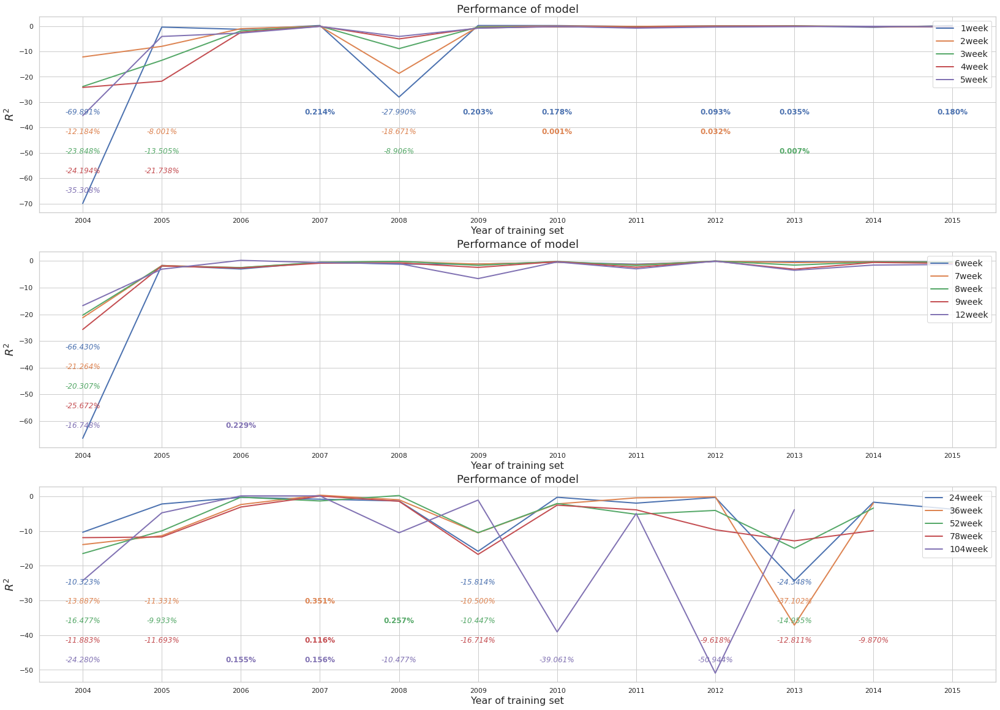

In [71]:
graph_comparison(scores_h)

In [72]:
print_param(params_h)

Dependent logret_1week:
	 	 Most common alpha: 0.5
	 	 Most common epsilon: 2
Dependent logret_2week:
	 	 Most common alpha: 0.5
	 	 Most common epsilon: 1.35
Dependent logret_3week:
	 	 Most common alpha: 0.5
	 	 Most common epsilon: 1.1
Dependent logret_4week:
	 	 Most common alpha: 0.5
	 	 Most common epsilon: 1.1
Dependent logret_5week:
	 	 Most common alpha: 0.5
	 	 Most common epsilon: 1.1
Dependent logret_6week:
	 	 Most common alpha: 0.5
	 	 Most common epsilon: 1.8
Dependent logret_7week:
	 	 Most common alpha: 0.5
	 	 Most common epsilon: 2.5
Dependent logret_8week:
	 	 Most common alpha: 0.5
	 	 Most common epsilon: 1.1
Dependent logret_9week:
	 	 Most common alpha: 0.5
	 	 Most common epsilon: 1.1
Dependent logret_12week:
	 	 Most common alpha: 0.5
	 	 Most common epsilon: 1.6
Dependent logret_24week:
	 	 Most common alpha: 0.5
	 	 Most common epsilon: 2
Dependent logret_36week:
	 	 Most common alpha: 0.5
	 	 Most common epsilon: 2.5
Dependent logret_52week:
	 	 Most common

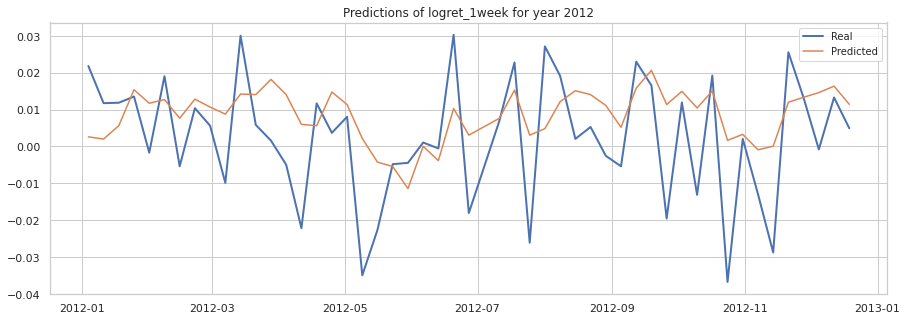

In [73]:
compare_preds(Y, preds_h, 'logret_1week', y=2012, light=False)

In [74]:
# With feature SELECTION

X, Y = reinitialize()

huber = HuberRegressor(max_iter=25000, tol=1e-5)

eps_light = [1.1, 1.6, 1.8, 2.5]
eps_hard = [1.1, 1.35, 1.6, 1.8, 2, 2.5, 3]
alpha_light = [1e-5, 1e-3, 1e-2]   # little since already Feature Selection
alpha_hard = [1e-5, 1e-3, 1e-2]

param_light = { 
    'epsilon': eps_light,
    'alpha': alpha_light # Ridge regularization
    # 'fit_intercept' : [True, False], 
    #'max_iter' : [150, 200, 250]
}

param_hard = { 
    'epsilon': eps_hard,
    'alpha': alpha_hard # Ridge regularization
    # 'fit_intercept' : [True, False], 
    #'max_iter' : [150, 200, 250]
}

var = ['mcsi', 'VIX', 'USInst', 'USInd'] + ['convexp2', 'convexm2'] + X.columns[X.columns.str.contains(r'\Bbex\B')].to_list()
bill = X.columns[X.columns.str.contains(r'YR\b')].to_list() + ['T-Bill']
sent = ['SENT', 'SENT1']
prop = {RobustScaler(): var, MaxAbsScaler(): sent, StandardScaler(): bill}

# estimator, train_score, params
store_hf, agg_hf, scores_hf, params_hf, preds_hf = grid_search(X, Y, huber, param_light, param_hard, scal_=prop, selection=True, sco = score_off)


100%|██████████| 15/15 [50:08<00:00, 200.57s/it]

Execution time for grid search is  0.0  h : 50.0  m : 8.61  s



In [75]:
sort_aggregate(agg_hf, scores_hf)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.110195,,-0.004331,-0.026914
1,logret_2week,-0.181842,,-0.281118,-0.010085
2,logret_3week,-0.281352,,-0.348041,-0.018422
3,logret_4week,-0.334503,,-0.489435,-0.081560
4,logret_6week,-0.615226,,0.048960,-0.078432
5,logret_5week,-1.054662,,0.068490,-0.027605
6,logret_8week,-1.378215,,0.018731,-0.457833
7,logret_9week,-1.852249,,-1.693269,-0.298651
8,logret_7week,-3.379260,,0.029659,-1.214650
9,logret_12week,-3.774390,,-0.353034,-0.334124


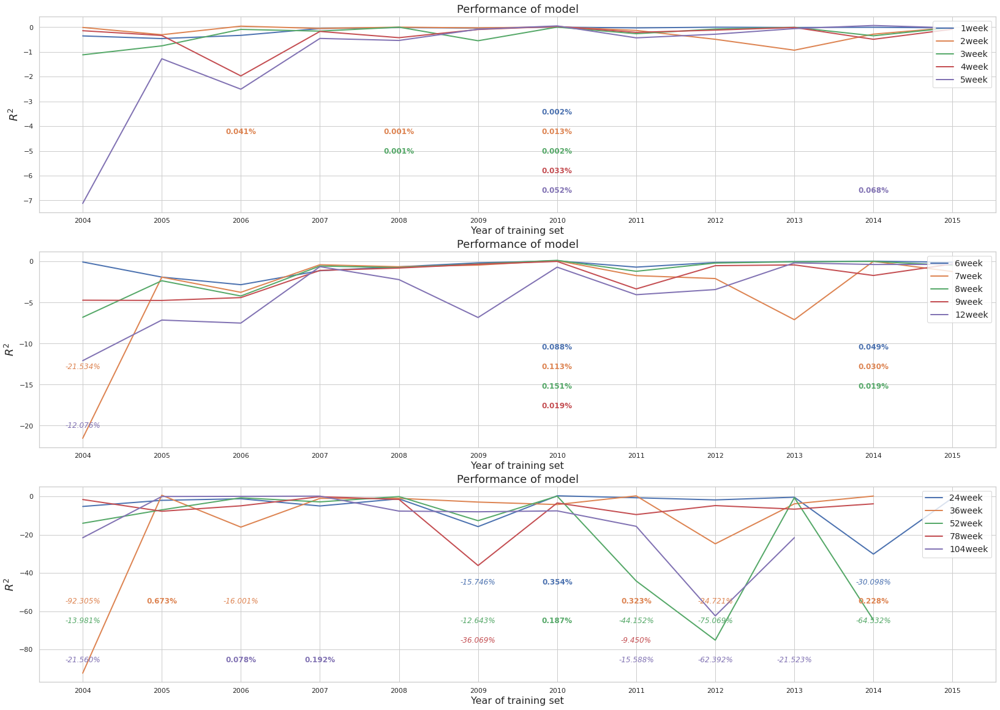

In [76]:
graph_comparison(scores_hf)

In [77]:
visualize_selected(store_hf, year=None, to_print=12)  # light=True, to_print=

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,US2YR (4),US3YR (7),US3YR (4),US3YR (5),US3YR (4),US2YR (4),US3YR (5),US2YR (8),SENT (8),US3YR (8),US2YR (10),SENT (7),US3YR (8),US2YR (10),US2YR (9)
1,slopep2 (3),US2YR (2),slopem2 (3),US2YR (3),US2YR (4),US3YR (3),US2YR (4),US3YR (6),US5YR (7),US2YR (7),US5YR (7),US3YR (6),US5YR (8),US3YR (9),US3YR (8)
2,US3YR (2),SENT (2),US2YR (3),slopem2 (2),SENT (3),SENT (2),SENT1 (3),SENT1 (3),slopem2 (6),unc_bex_PAPER (6),SENT (7),US2YR (6),US2YR (7),US5YR (8),US5YR (8)
3,slopem5 (1),SENT1 (2),slopep2 (2),unc_bex_PAPER (1),slopem2 (1),slopem2 (1),SENT (3),slopem2 (2),US3YR (6),unc_bex_% (6),US10YR (6),slopem2 (4),SENT (7),US10YR (6),point0 (7)
4,SENT1 (1),unc_bex_% (1),slopem5 (1),SENT (1),slopep2 (1),unc_bex_% (1),slopem5 (2),US1YR (2),SENT1 (5),US5YR (6),US3YR (6),US10YR (3),US1YR (6),US1YR (6),slopep5 (7)
5,SENT (1),point0 (1),unc_bex_% (1),US5YR (1),SENT1 (1),slopep2 (1),US5YR (2),US5YR (2),US2YR (5),slopem2 (6),slopem2 (5),point0 (2),US10YR (6),slopep2 (5),US1YR (7)
6,,slopem5 (1),SENT (1),US1YR (1),US1YR (1),US1YR (1),slopem2 (1),unc_bex_PAPER (1),US1YR (4),SENT (5),T-Bill (5),slopep2 (2),slopep2 (2),slopep5 (5),slopep10 (6)
7,,US5YR (1),slopep10 (1),SENT1 (1),,,slopem10 (1),unc_bex_% (1),slopem5 (2),US1YR (5),unc_bex_PAPER (5),slopem10 (2),unc_bex_PAPER (2),SENT1 (4),US10YR (6)
8,,slopep2 (1),,,,,US1YR (1),SENT (1),T-Bill (2),SENT1 (4),unc_bex_% (5),US5YR (2),unc_bex_% (2),slopem2 (4),SENT (6)
9,,slopep10 (1),,,,,US10YR (1),,slopem10 (1),slopep5 (4),mcsi (5),slopem5 (2),slopep5 (2),unc_bex_% (4),SENT1 (6)


In [78]:
print_param(params_hf)

Dependent logret_1week:
	 	 Most common alpha: 0.01
	 	 Most common epsilon: 3
Dependent logret_2week:
	 	 Most common alpha: 0.01
	 	 Most common epsilon: 1.1
Dependent logret_3week:
	 	 Most common alpha: 0.01
	 	 Most common epsilon: 1.1
Dependent logret_4week:
	 	 Most common alpha: 0.01
	 	 Most common epsilon: 1.1
Dependent logret_5week:
	 	 Most common alpha: 0.01
	 	 Most common epsilon: 1.1
Dependent logret_6week:
	 	 Most common alpha: 0.01
	 	 Most common epsilon: 1.35
Dependent logret_7week:
	 	 Most common alpha: 0.01
	 	 Most common epsilon: 1.35
Dependent logret_8week:
	 	 Most common alpha: 0.01
	 	 Most common epsilon: 1.1
Dependent logret_9week:
	 	 Most common alpha: 0.01
	 	 Most common epsilon: 1.1
Dependent logret_12week:
	 	 Most common alpha: 0.01
	 	 Most common epsilon: 1.1
Dependent logret_24week:
	 	 Most common alpha: 0.01
	 	 Most common epsilon: 3
Dependent logret_36week:
	 	 Most common alpha: 0.01
	 	 Most common epsilon: 3
Dependent logret_52week:
	 	 

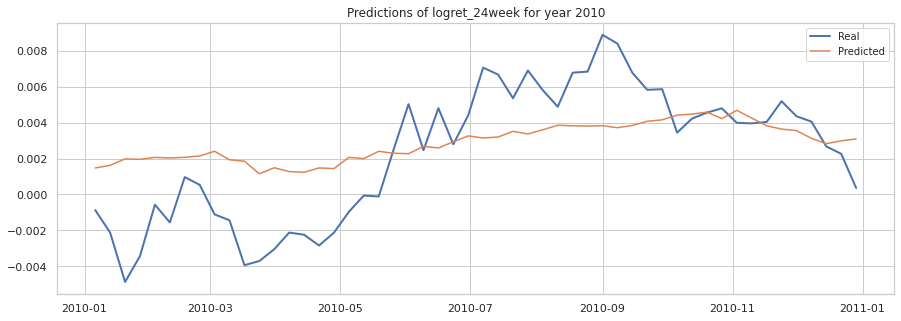

In [79]:
compare_preds(Y, preds_hf, 'logret_24week', y=2010)

In [3]:
# With feature selection (and PCA ON INTERACTIONS + LINEAR REGRESSORS (STANDARDIZED, including Convex))

X, Y = reinitialize()

tot_names = X.columns.to_list()
interaction_names = []
for idx, first in enumerate(X.columns):
    for second in X.columns[idx+1:]:
        tot_names.append(str(first) + " * " + second)
        interaction_names.append(str(first) + " * " + second)

eps_light = [1.1, 1.6, 1.8, 2.5]
eps_hard = [1.1, 1.35, 1.6, 1.8, 2, 2.5, 3]
alpha_light = [1e-5, 1e-3] 
alpha_hard = [1e-5, 1e-3]

param_light = { 
    'epsilon': eps_light,
    'alpha': alpha_light # Ridge regularization
    # 'fit_intercept' : [True, False], 
    #'max_iter' : [150, 200, 250]
}

param_hard = { 
    'epsilon': eps_hard,
    'alpha': alpha_hard # Ridge regularization
    # 'fit_intercept' : [True, False], 
    #'max_iter' : [150, 200, 250]
}
        
# Model
huber = HuberRegressor(max_iter=30000, tol=1e-4)

# Standardization (only for scale, exlucing PK except convex)
var = ['mcsi', 'VIX', 'USInst', 'USInd'] + ['convexp2', 'convexm2'] + X.columns[X.columns.str.contains(r'\Bbex\B')].to_list()
bill = X.columns[X.columns.str.contains(r'YR\b')].to_list() + ['T-Bill']
sent = ['SENT', 'SENT1']
prop = {RobustScaler(): var, MaxAbsScaler(): sent, StandardScaler(): bill}

# Feature engineering (Interactions + PCA)
trans_poly = {PolynomialFeatures(degree=2, interaction_only=True, include_bias=False): [tot_names, False]}
X_eng, _ = transform(trans_poly, X, X.columns)  # created interactions from standardized variable + standardized variable
X_pca, pc_interac = fit_pca(X_eng, col=interaction_names)  # perc=0.9, PCA ONLY ON INTERACTIONS

store_pca_int, agg_pca_int, scores_pca_int, params_pca_int, preds_pca_int = grid_search(X_pca, Y, huber, param_light, param_hard, scal_=prop, selection=True, _light_=True, sco = score_off)


10 components explain  90% of the variance for the selected columns ['point0 * slopem2', 'point0 * slopep2', 'point0 * slopem5', 'point0 * slopep5', 'point0 * slopem10', 'point0 * slopep10', 'point0 * convexp2', 'point0 * convexm2', 'point0 * T-Bill', 'point0 * ra_bex_PAPER', 'point0 * unc_bex_PAPER', 'point0 * unc_bex_%', 'point0 * VIX', 'point0 * US1YR', 'point0 * US2YR', 'point0 * US3YR', 'point0 * US5YR', 'point0 * US10YR', 'point0 * mcsi', 'point0 * SENT', 'point0 * SENT1', 'point0 * USInst', 'point0 * USInd', 'slopem2 * slopep2', 'slopem2 * slopem5', 'slopem2 * slopep5', 'slopem2 * slopem10', 'slopem2 * slopep10', 'slopem2 * convexp2', 'slopem2 * convexm2', 'slopem2 * T-Bill', 'slopem2 * ra_bex_PAPER', 'slopem2 * unc_bex_PAPER', 'slopem2 * unc_bex_%', 'slopem2 * VIX', 'slopem2 * US1YR', 'slopem2 * US2YR', 'slopem2 * US3YR', 'slopem2 * US5YR', 'slopem2 * US10YR', 'slopem2 * mcsi', 'slopem2 * SENT', 'slopem2 * SENT1', 'slopem2 * USInst', 'slopem2 * USInd', 'slopep2 * slopem5', 'slo

 27%|██▋       | 4/15 [44:26<2:08:27, 700.70s/it]/opt/jupyterhub/lib/python3.8/site-packages/sklearn/linear_model/_huber.py:335: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/jupyterhub/lib/python3.8/site-packages/sklearn/linear_model/_huber.py:335: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/jupyterhub/lib/python3.8/site-packages/sklearn/linear_model/_huber.py:335: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: 

Execution time for grid search is  2.0  h : 53.0  m : 52.01  s



In [4]:
sort_aggregate(agg_pca_int, scores_pca_int)


,Ranked models,Agg Scores,,One to last,Last year
0,logret_2week,-0.079555,,-0.399629,-0.026435
1,logret_1week,-0.116585,,-0.319704,-0.026914
2,logret_4week,-0.369983,,-0.654468,-0.029554
3,logret_5week,-0.401053,,-1.603991,-0.073509
4,logret_6week,-0.620218,,-0.550485,-0.201727
5,logret_3week,-0.828138,,-0.075576,-0.188747
6,logret_9week,-1.585187,,-0.208065,-2.394600
7,logret_12week,-1.887573,,-3.704602,-0.385261
8,logret_36week,-2.751510,,-0.100743,0.049158
9,logret_7week,-3.432832,,-0.718090,-0.313984


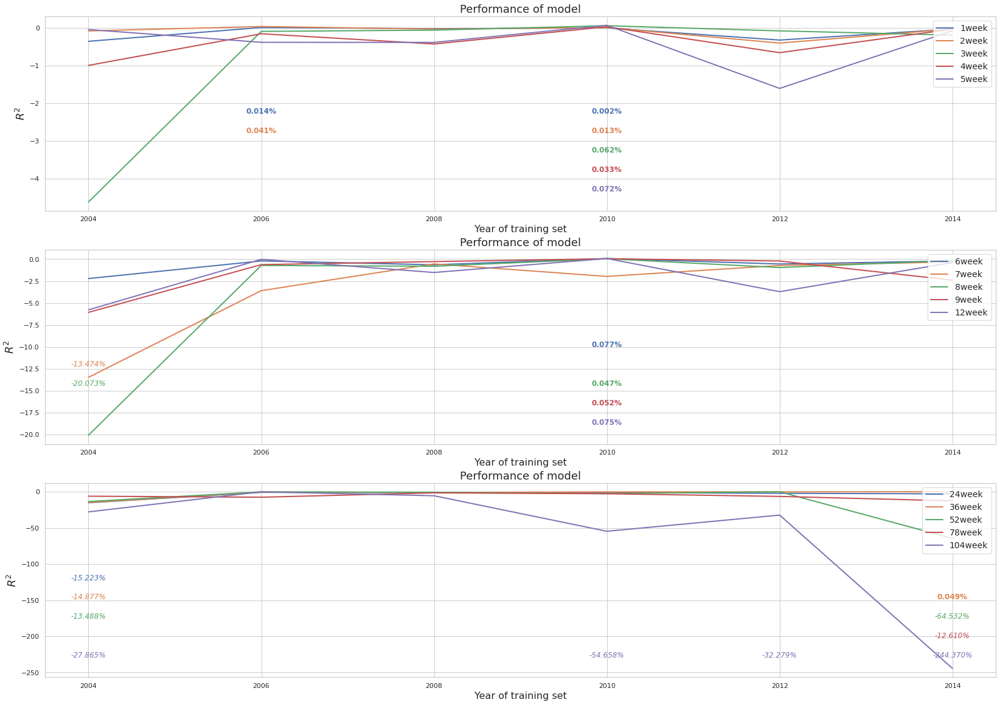

In [5]:
graph_comparison(scores_pca_int, light=True)

In [11]:
visualize_selected(store_pca_int, year=None, light=True, to_print=15)  

# Slope selected often

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,slopem5 (2),US3YR (2),slopep2 (2),US3YR (4),US2YR (3),US2YR (4),slopem2 (3),slopep2 (3),US1YR (3),US3YR (5),slopep2 (4),US3YR (5),US2YR (5),US1YR (6),slopem2 (4)
1,US2YR (2),slopem2 (1),US3YR (2),US2YR (2),US1YR (2),US3YR (4),US1YR (2),US2YR (3),US3YR (3),US5YR (5),slopep5 (4),US5YR (5),SENT (5),point0 (5),slopep5 (4)
2,US3YR (1),slopep2 (1),slopem5 (1),US5YR (1),US3YR (2),US5YR (2),US2YR (2),US3YR (2),SENT (3),US2YR (4),US2YR (4),slopem2 (3),SENT1 (4),slopep2 (5),slopep10 (4)
3,slopep2 (1),SENT (1),US5YR (1),SENT (1),unc_bex_PAPER (1),unc_bex_PAPER (1),US3YR (2),US5YR (2),slopem2 (2),slopem2 (3),SENT1 (4),US10YR (3),slopep2 (3),SENT (5),US5YR (4)
4,,US2YR (1),US2YR (1),,US5YR (1),unc_bex_% (1),US5YR (2),US1YR (2),slopep2 (2),US10YR (3),unc_bex_PAPER (3),US2YR (3),US1YR (3),slopep5 (4),US1YR (4)
5,,,SENT (1),,US10YR (1),US1YR (1),slopep2 (1),unc_bex_% (1),US2YR (2),US1YR (3),US3YR (3),slopep2 (2),US3YR (3),US2YR (4),point0 (3)
6,,,,,slopem5 (1),slopem2 (1),US10YR (1),slopem5 (1),slopep5 (1),slopem5 (2),US5YR (3),slopem5 (2),US5YR (3),US5YR (4),slopem5 (3)
7,,,,,slopem2 (1),,,SENT (1),unc_bex_PAPER (1),unc_bex_PAPER (2),SENT (3),slopep5 (2),US10YR (3),US10YR (4),unc_bex_% (3)
8,,,,,,,,SENT1 (1),unc_bex_% (1),unc_bex_% (2),PC1 (2),SENT1 (2),point0 (2),mcsi (4),US2YR (3)
9,,,,,,,,,mcsi (1),SENT (2),slopem2 (2),US1YR (2),slopem2 (2),slopem10 (3),US3YR (3)


In [8]:
print_pca(store_pca_int, pc_interac, interaction_names, to_print=2)

PC1
1.2 % of component's direction: US3YR * US10YR
1.2 % of component's direction: US3YR * USInd
1.2 % of component's direction: US5YR * US10YR
1.2 % of component's direction: US5YR * USInd
1.1 % of component's direction: unc_bex_% * US2YR
1.1 % of component's direction: unc_bex_% * US3YR
1.1 % of component's direction: US2YR * US5YR
1.1 % of component's direction: US2YR * US10YR
1.1 % of component's direction: US2YR * mcsi
1.1 % of component's direction: US2YR * USInst
1.1 % of component's direction: US2YR * USInd
1.1 % of component's direction: US3YR * US5YR
1.1 % of component's direction: US3YR * mcsi
1.1 % of component's direction: US3YR * USInst
1.1 % of component's direction: US5YR * mcsi
1.1 % of component's direction: US5YR * USInst
1.0 % of component's direction: point0 * T-Bill
1.0 % of component's direction: point0 * US1YR
1.0 % of component's direction: point0 * US2YR
1.0 % of component's direction: point0 * US3YR
1.0 % of component's direction: T-Bill * ra_bex_PAPER
1.0 % 

In [7]:
print_param(params_pca_int)

Dependent logret_1week:
	 	 Most common alpha: 0.001
	 	 Most common epsilon: 3
Dependent logret_2week:
	 	 Most common alpha: 0.001
	 	 Most common epsilon: 1.1
Dependent logret_3week:
	 	 Most common alpha: 0.001
	 	 Most common epsilon: 1.35
Dependent logret_4week:
	 	 Most common alpha: 0.001
	 	 Most common epsilon: 1.8
Dependent logret_5week:
	 	 Most common alpha: 0.001
	 	 Most common epsilon: 1.6
Dependent logret_6week:
	 	 Most common alpha: 0.001
	 	 Most common epsilon: 1.6
Dependent logret_7week:
	 	 Most common alpha: 0.001
	 	 Most common epsilon: 1.6
Dependent logret_8week:
	 	 Most common alpha: 0.001
	 	 Most common epsilon: 1.1
Dependent logret_9week:
	 	 Most common alpha: 0.001
	 	 Most common epsilon: 1.1
Dependent logret_12week:
	 	 Most common alpha: 0.001
	 	 Most common epsilon: 1.1
Dependent logret_24week:
	 	 Most common alpha: 1e-05
	 	 Most common epsilon: 1.1
Dependent logret_36week:
	 	 Most common alpha: 0.001
	 	 Most common epsilon: 3
Dependent logret

### Decision Tree Regression

In [13]:
#parameters={"splitter":["best","random"],
            #"max_depth" : [1,3,5,7,9,11,12],
           #"min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
           #"min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9],
           #"max_features":["auto","log2","sqrt",None],
           #"max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90] }
            
            
splitter_light = ['best']
splitter_hard = ['best', 'random']
                 
max_depth_light = [1, 5, 12]
max_depth_hard = [1, 3, 5, 9, 12, 30]
                 
min_sample_leaf_light = [1, 3, 5]
min_sample_leaf_hard = [1, 2, 3, 5, 7, 10]
                 
max_feat_light = [None, "sqrt"]
max_feat_hard = [None,"sqrt", 0.3, 0.8]
                 
max_leaf_light = [None, 30, 50]
max_leaf_hard = [None,10,20,30,50,70,90]

param_light = {"splitter": splitter_light, "max_depth" : max_depth_light, "min_samples_leaf": min_sample_leaf_light,
           "max_features": max_feat_light, "max_leaf_nodes": max_leaf_light}
                 
param_hard = { "splitter": splitter_hard, "max_depth" : max_depth_hard, "min_samples_leaf": min_sample_leaf_hard,
           "max_features": max_feat_hard, "max_leaf_nodes": max_leaf_hard} 


In [14]:
X, Y = reinitialize()

dtree = DecisionTreeRegressor()

agg_dtree, scores_dtree, params_dtree, preds_dtree = grid_search(X, Y, dtree, param_light, param_hard, tree_=None, selection=False, sco = score_off)  # sco=False


100%|██████████| 15/15 [17:42<00:00, 70.84s/it]

Execution time for grid search is  0.0  h : 17.0  m : 42.57  s



In [20]:
params_grid, params_tree = params_dtree[0], params_dtree[1]

sort_aggregate(agg_dtree, scores_dtree)

,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.174696,,-0.012281,-0.104081
1,logret_2week,-0.220902,,-0.002830,-0.075182
2,logret_3week,-0.296541,,-0.020928,-0.009392
3,logret_4week,-0.559144,,-0.029823,-0.037239
4,logret_6week,-0.638739,,-0.067487,-0.007806
5,logret_5week,-0.667220,,-0.045985,-0.061949
6,logret_8week,-0.781184,,0.000274,-0.035897
7,logret_7week,-0.988791,,-0.002936,-0.045767
8,logret_12week,-2.788134,,-1.208847,-0.239509
9,logret_9week,-3.485821,,-0.070232,-0.021629


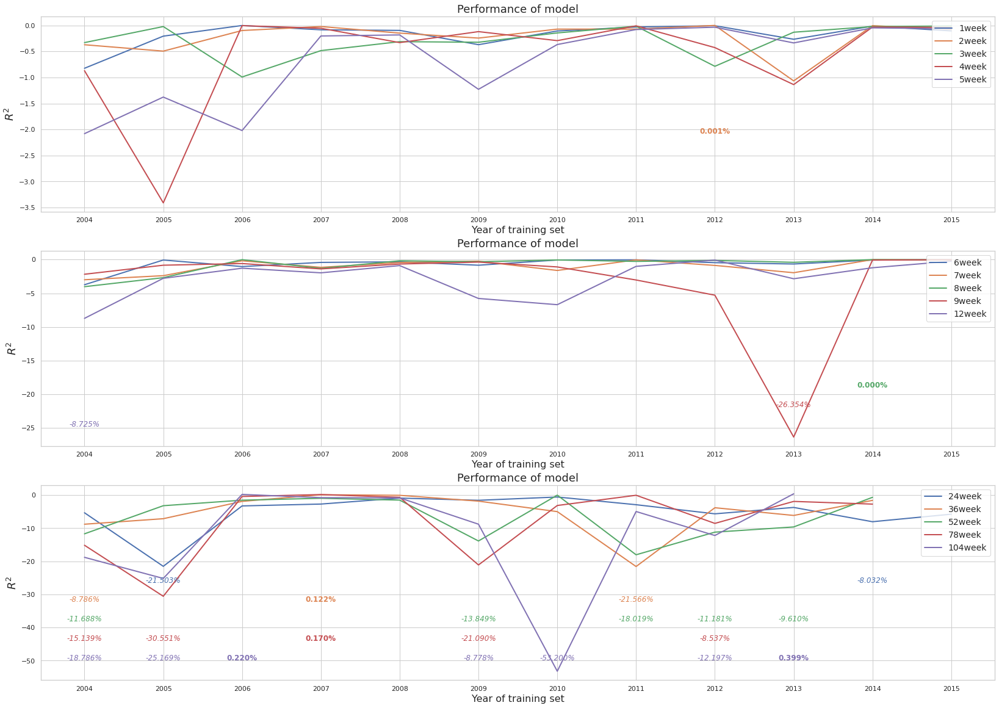

In [15]:
graph_comparison(scores_dtree)

In [32]:
print_param(params_grid, params_tree)

# min_samples_leaf higher smaller lags (fewer leaves), max_depth increases

Dependent logret_1week: 	 	 	 	 Fitted model's avg. node counts: 19 	 	 avg. depth count = 4
	 	 Most common max_depth: 3
	 	 Most common max_features: sqrt
	 	 Most common max_leaf_nodes: None
	 	 Most common min_samples_leaf: 10
	 	 Most common splitter: random
Dependent logret_2week: 	 	 	 	 Fitted model's avg. node counts: 16 	 	 avg. depth count = 3
	 	 Most common max_depth: 1
	 	 Most common max_features: 0.3
	 	 Most common max_leaf_nodes: 50
	 	 Most common min_samples_leaf: 10
	 	 Most common splitter: random
Dependent logret_3week: 	 	 	 	 Fitted model's avg. node counts: 19 	 	 avg. depth count = 3
	 	 Most common max_depth: 1
	 	 Most common max_features: 0.3
	 	 Most common max_leaf_nodes: 50
	 	 Most common min_samples_leaf: 7
	 	 Most common splitter: random
Dependent logret_4week: 	 	 	 	 Fitted model's avg. node counts: 9 	 	 avg. depth count = 2
	 	 Most common max_depth: 1
	 	 Most common max_features: 0.3
	 	 Most common max_leaf_nodes: 20
	 	 Most common min_sampl

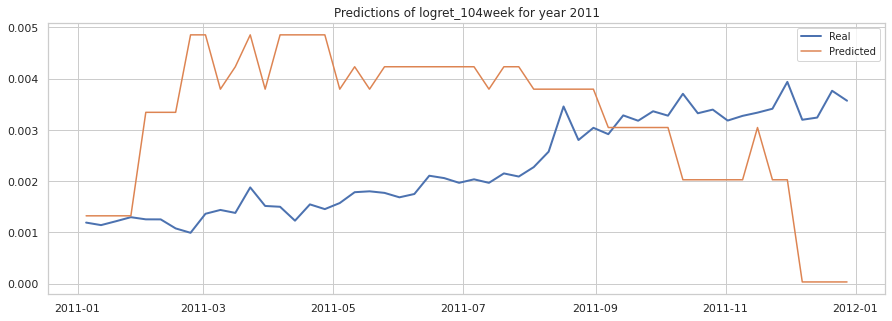

In [24]:

compare_preds(Y, preds_dtree, 'logret_104week', y =2011)

In [47]:
# WITH FEATURE SELECTION BASED ON FEATURE IMPORTANCE

X, Y = reinitialize()

dtree2 = DecisionTreeRegressor()

store_dtree24, agg_dtree24, scores_dtree24, [params_grid24, params_tree24], preds_dtree24 = grid_search(X, Y, dtree, param_light, param_hard, tree_=None, selection=True, sco = score_off)  # sco=False


100%|██████████| 15/15 [35:59<00:00, 143.98s/it]

Execution time for grid search is  0.0  h : 35.0  m : 59.63  s



In [49]:
sort_aggregate(agg_dtree24, scores_dtree24)

,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.125853,,-0.000084,0.230701
1,logret_2week,-0.312865,,-0.091077,-0.109152
2,logret_4week,-0.368964,,-0.009539,-0.906408
3,logret_3week,-0.458224,,-0.041847,-0.039688
4,logret_5week,-0.836564,,-0.000581,-0.030599
5,logret_6week,-0.917798,,-0.132270,-0.082381
6,logret_7week,-1.447281,,-1.639958,-1.341032
7,logret_8week,-1.730194,,-0.088217,-0.375684
8,logret_9week,-1.979653,,-7.570064,-0.110210
9,logret_12week,-3.009841,,-0.007451,-4.644971


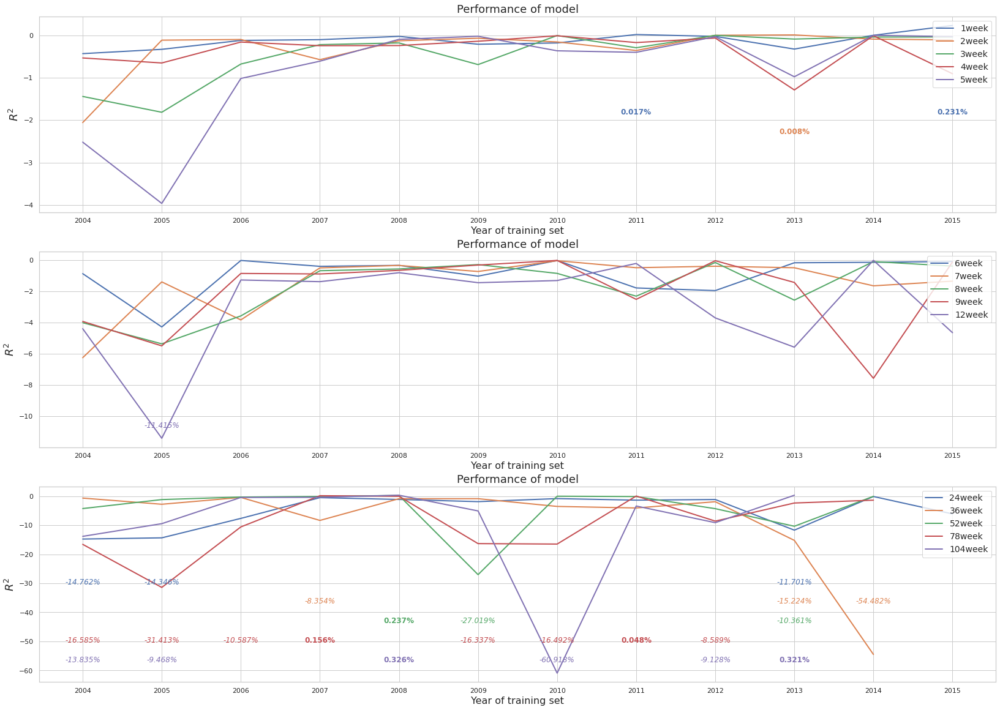

In [50]:
graph_comparison(scores_dtree24)

In [55]:
visualize_selected(store_dtree24, year=None, to_print=12)  # light=True, to_print=

,logret_1week,logret_2week,logret_3week,logret_4week,logret_5week,logret_6week,logret_7week,logret_8week,logret_9week,logret_12week,logret_24week,logret_36week,logret_52week,logret_78week,logret_104week
0,VIX (11),mcsi (12),USInd (12),US5YR (12),USInst (12),SENT1 (11),SENT1 (12),mcsi (12),US2YR (8),US10YR (11),US1YR (11),US1YR (9),US2YR (9),US5YR (11),unc_bex_PAPER (10)
1,USInst (11),USInst (12),US2YR (11),US10YR (12),USInd (11),USInst (11),USInst (12),US3YR (10),SENT1 (7),slopem10 (10),USInst (10),US2YR (9),US10YR (9),US10YR (11),VIX (10)
2,USInd (11),USInd (12),US3YR (11),mcsi (12),US10YR (10),USInd (11),USInd (12),US10YR (10),USInd (4),US3YR (10),mcsi (9),US5YR (8),VIX (8),mcsi (11),US1YR (10)
3,mcsi (9),US5YR (11),US5YR (11),SENT (12),mcsi (10),mcsi (10),SENT (11),SENT1 (10),mcsi (3),US2YR (9),SENT (9),USInst (8),US1YR (8),SENT (11),US3YR (10)
4,SENT (9),US10YR (11),US10YR (11),SENT1 (12),SENT (10),US3YR (10),US3YR (10),convexm2 (9),SENT (3),US1YR (9),US3YR (9),US3YR (7),US3YR (8),SENT1 (11),US5YR (10)
5,SENT1 (9),SENT (11),mcsi (11),USInst (12),SENT1 (10),US10YR (10),US10YR (10),T-Bill (9),USInst (2),US5YR (9),slopem5 (8),mcsi (7),SENT (8),USInst (11),US10YR (10)
6,US3YR (8),SENT1 (11),SENT (11),USInd (12),US5YR (10),SENT (10),US5YR (10),VIX (9),US3YR (2),USInst (8),US2YR (8),SENT (7),T-Bill (7),USInd (11),mcsi (10)
7,US5YR (8),US1YR (10),SENT1 (11),US2YR (10),US3YR (9),US5YR (9),mcsi (10),US1YR (9),US5YR (2),SENT (8),convexp2 (8),slopep10 (6),US5YR (7),US1YR (10),SENT (10)
8,US10YR (8),US3YR (10),USInst (11),US3YR (10),US2YR (8),US1YR (8),US2YR (9),US2YR (9),US1YR (1),SENT1 (8),US5YR (7),convexm2 (6),SENT1 (7),US2YR (10),SENT1 (10)
9,US2YR (7),US2YR (10),unc_bex_% (10),unc_bex_% (9),VIX (7),US2YR (8),US1YR (8),US5YR (9),US10YR (1),convexm2 (7),T-Bill (6),T-Bill (5),USInst (7),US3YR (9),USInst (10)


In [56]:
print_param(params_grid24, params_tree24)


Dependent logret_1week: 	 	 	 	 Fitted model's avg. node counts: 24 	 	 avg. depth count = 4
	 	 Most common max_depth: 1
	 	 Most common max_features: sqrt
	 	 Most common max_leaf_nodes: 50
	 	 Most common min_samples_leaf: 10
	 	 Most common splitter: random
Dependent logret_2week: 	 	 	 	 Fitted model's avg. node counts: 24 	 	 avg. depth count = 5
	 	 Most common max_depth: 12
	 	 Most common max_features: 0.3
	 	 Most common max_leaf_nodes: 50
	 	 Most common min_samples_leaf: 10
	 	 Most common splitter: random
Dependent logret_3week: 	 	 	 	 Fitted model's avg. node counts: 7 	 	 avg. depth count = 1
	 	 Most common max_depth: 1
	 	 Most common max_features: None
	 	 Most common max_leaf_nodes: 30
	 	 Most common min_samples_leaf: 10
	 	 Most common splitter: random
Dependent logret_4week: 	 	 	 	 Fitted model's avg. node counts: 8 	 	 avg. depth count = 1
	 	 Most common max_depth: 1
	 	 Most common max_features: sqrt
	 	 Most common max_leaf_nodes: 90
	 	 Most common min_samp

In [ ]:
# With feature selection (and PCA ON INTERACTIONS + LINEAR REGRESSORS (STANDARDIZED, including Convex))

X, Y = reinitialize()

dtree22 = DecisionTreeRegressor()

tot_names = X.columns.to_list()
interaction_names = []
for idx, first in enumerate(X.columns):
    for second in X.columns[idx+1:]:
        tot_names.append(str(first) + " * " + second)
        interaction_names.append(str(first) + " * " + second)
        
# Model
dtree = DecisionTreeRegressor()

parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,9,12],
           "min_samples_leaf":[1,2,4,6,8,10],
           "min_weight_fraction_leaf":[0.1,0.3,0.5,0.7,0.9],
           "max_features":["auto","sqrt",None],
           "max_leaf_nodes":[None,10,30,50,70,90] }

# Feature engineering (Interactions + PCA)
trans_poly = {PolynomialFeatures(degree=2, interaction_only=True, include_bias=False): [tot_names, False]}
X_eng, _ = transform(trans_poly, X, X.columns)  # created interactions from standardized variable + standardized variable
X_pca, Y, pc_interac = fit_pca(X_eng, Y, col=interaction_names)  # perc=0.9, PCA ONLY ON INTERACTIONS

store_tree_pca, agg_tree_pca, scores_tree_pca, [params_grid_pca, params_tree_pca], preds_tree_pca = grid_search(X_pca, Y, dtree22, param_light, param_hard, tree_=None, selection=True, _light_=True, sco = score_off)  # sco=False


In [ ]:

sort_aggregate(agg_tree_pca, scores_tree_pca)


In [ ]:
graph_comparison(scores_tree_pca, light=True)

In [ ]:
visualize_selected(store_tree_pca, year=None, to_print=12, light=True)  # light=True, to_print=

### Random Forest

In [81]:
#parameters={"n_estimators":["100","150"],   # less, fai 30, 50
            #"max_depth" : [1,3,5,9,12],
            #"min_samples_split":[2,4,8, 10]
           #"min_samples_leaf":[1,2,4,6,8,10],
           #"max_features":["auto","sqrt",0.4],
           #"max_leaf_nodes":[None,10,50,90] }
            
estimators_light = [30, 60]
estimators_hard = [30, 60, 100, 150]
                 
max_depth_light = [3, 5, 8]
max_depth_hard = [1, 3, 5, 8, 20, 40]
                 
min_sample_leaf_light = [1, 3, 5]
min_sample_leaf_hard = [1, 2, 3, 5, 7, 10]
                 
max_feat_light = [1.0, "sqrt"]
max_feat_hard = [1.0,"sqrt", "log2", 0.3]
                 
max_leaf_light = [None,30,50]
max_leaf_hard = [None,10,30,50,70,90]

bootstrap_light = [False]
bootstrap_hard = [True, False]

param_light = {"n_estimators": estimators_light, "max_depth": max_depth_light, "min_samples_leaf": min_sample_leaf_light, 
               "max_features": max_feat_light, "max_leaf_nodes": max_leaf_light, "bootstrap": bootstrap_light}
                 
param_hard = {"n_estimators": estimators_hard, "max_depth": max_depth_hard, "min_samples_leaf": min_sample_leaf_hard, 
              "max_features": max_feat_hard, "max_leaf_nodes": max_leaf_hard, "bootstrap": bootstrap_hard} 


In [82]:
# WITHOUT SELECTION

X, Y = reinitialize()

dtree2 = RandomForestRegressor(verbose=0, criterion="squared_error")

agg_dfor, scores_dfor, params_dfor, preds_dfor = grid_search(X, Y, dtree2, param_light, param_hard, tree_=True, selection=False, _light_=True, sco = score_off)  # sco=False


100%|██████████| 5/5 [15:00<00:00, 230.23s/it]
6it [23:16, 232.71s/it]                       
100%|██████████| 5/5 [14:31<00:00, 224.51s/it]
6it [22:41, 226.85s/it]                       
100%|██████████| 5/5 [14:35<00:00, 225.84s/it]
6it [22:43, 227.17s/it]                       
100%|██████████| 5/5 [14:32<00:00, 225.02s/it]
6it [22:37, 226.18s/it]                       
100%|██████████| 5/5 [14:27<00:00, 223.96s/it]
6it [22:30, 225.12s/it]                       
100%|██████████| 5/5 [14:11<00:00, 219.66s/it]
6it [22:13, 222.28s/it]                       
100%|██████████| 5/5 [14:12<00:00, 219.95s/it]
6it [22:14, 222.45s/it]                       
100%|██████████| 5/5 [13:59<00:00, 213.73s/it]
6it [21:58, 219.73s/it]                       
100%|██████████| 5/5 [14:18<00:00, 221.30s/it]
6it [22:18, 223.07s/it]                       
100%|██████████| 5/5 [14:04<00:00, 217.56s/it]
6it [21:52, 218.68s/it]                       
100%|██████████| 5/5 [13:59<00:00, 215.97s/it]
6it [21:35, 2

Execution time for grid search is  5.0  h : 27.0  m : 50.57  s



In [83]:

sort_aggregate(agg_dfor, scores_dfor)



,Ranked models,Agg Scores,,One to last,Last year
0,logret_1week,-0.140319,,0.058694,0.002462
1,logret_4week,-0.206706,,0.094623,-0.087566
2,logret_5week,-0.222493,,0.107604,0.001064
3,logret_6week,-0.430812,,0.091392,-0.083520
4,logret_7week,-0.432583,,0.061471,-0.087690
5,logret_8week,-0.627619,,0.035742,-0.427506
6,logret_9week,-0.765450,,0.064957,-0.893633
7,logret_24week,-0.924255,,-0.482705,-0.450207
8,logret_3week,-0.981881,,-0.011869,-0.078551
9,logret_2week,-1.219558,,0.012489,-0.051594


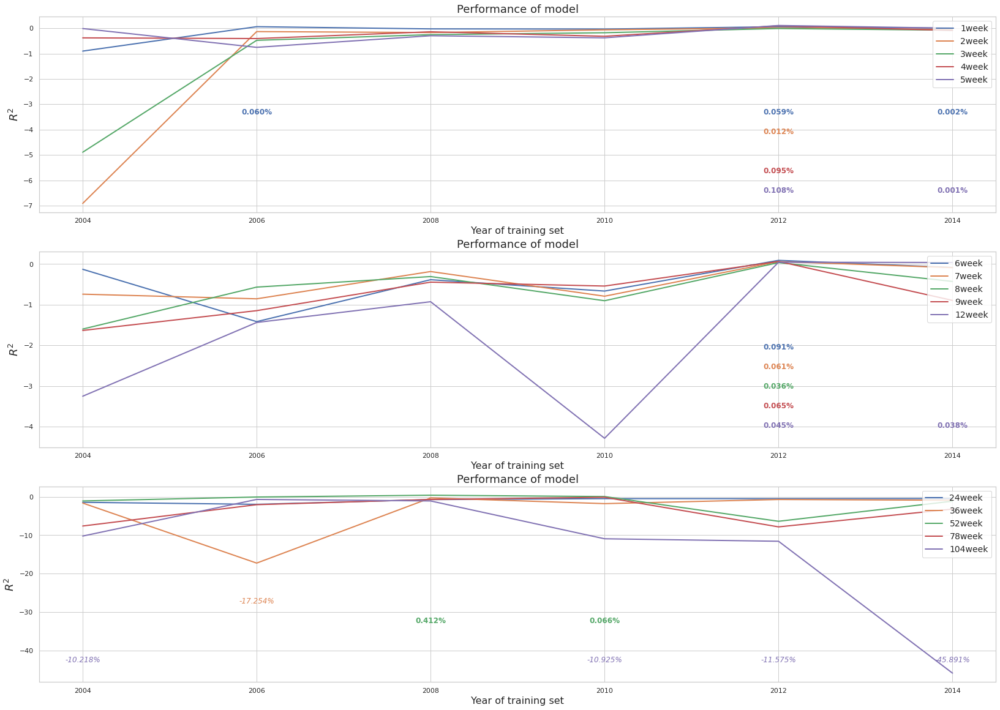

In [84]:
graph_comparison(scores_dfor, light=True)

In [88]:
print_param(params_dfor)



Dependent logret_1week:	 	 	 	 Fitted model's avg. node counts: 24 	 	 avg. depth count = 4
	 	 Most common bootstrap: True
	 	 Most common max_depth: 3
	 	 Most common max_features: sqrt
	 	 Most common max_leaf_nodes: 10
	 	 Most common min_samples_leaf: 1
	 	 Most common n_estimators: 30

Dependent logret_2week:	 	 	 	 Fitted model's avg. node counts: 24 	 	 avg. depth count = 5
	 	 Most common bootstrap: True
	 	 Most common max_depth: 5
	 	 Most common max_features: sqrt
	 	 Most common max_leaf_nodes: 90
	 	 Most common min_samples_leaf: 1
	 	 Most common n_estimators: 30

Dependent logret_3week:	 	 	 	 Fitted model's avg. node counts: 7 	 	 avg. depth count = 1
	 	 Most common bootstrap: True
	 	 Most common max_depth: 3
	 	 Most common max_features: log2
	 	 Most common max_leaf_nodes: None
	 	 Most common min_samples_leaf: 2
	 	 Most common n_estimators: 60

Dependent logret_4week:	 	 	 	 Fitted model's avg. node counts: 8 	 	 avg. depth count = 1
	 	 Most common bootstrap: F

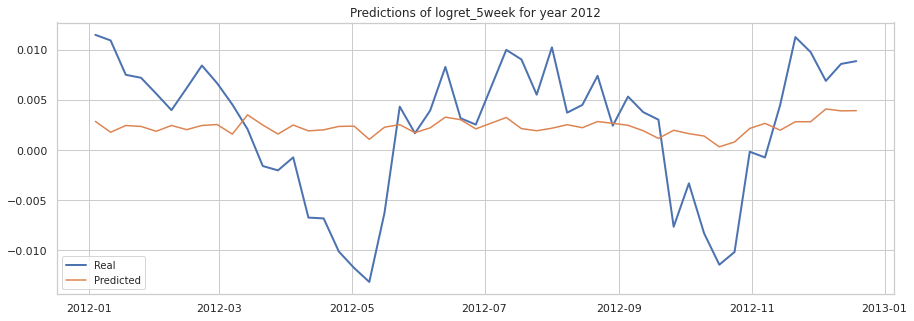

In [89]:
compare_preds(Y, preds_dfor, "logret_5week", y=2012, light=True)

In [ ]:
# WITH SELECTION

X, Y = reinitialize()

rand_tree = RandomForestRegressor()

store_randtree, agg_randtree, scores_randtree, params_grid_randtree, preds_randtree = grid_search(X, Y, rand_tree, param_light, param_hard, tree_=True, selection=True, _light_=True, sco = score_off)  # sco=False



In [ ]:
sort_aggregate(agg_randtree, scores_randtree)


In [ ]:
graph_comparison(scores_randtree, light=True)

In [ ]:
visualize_selected(store_randtree, year=None, to_print=12, light=True)  # light=True, to_print=

In [ ]:
print_param(params_grid_randtree)


### Extra Trees Regressor

In [ ]:
#parameters={"n_estimators":["100","200"],
            #"max_depth" : [1,3,5,9,12],
            #"min_samples_split":[2,4,8, 10]
           #"min_samples_leaf":[1,2,4,7,10],
           #"max_features":["auto","sqrt",0.4],
            # "bootstrap": [True, False],
           # "max_leaf_nodes":[None,10,50,90] }
            
estimators_light = [30, 60]
estimators_hard = [30, 60, 100, 150]
                 
max_depth_light = [3, 5, 8]
max_depth_hard = [1, 3, 5, 8, 20, 40, None]
                 
min_sample_leaf_light = [1, 3, 5]
min_sample_leaf_hard = [1, 2, 3, 5, 7, 10]
                 
max_feat_light = [1.0, "sqrt"]
max_feat_hard = [1.0,"sqrt", "log2", 0.3]
                 
max_leaf_light = [None,30,50]
max_leaf_hard = [None,10,30,50,70,90]

bootstrap_light = [False]
bootstrap_hard = [True, False]

param_light = {"n_estimators": estimators_light, "max_depth": max_depth_light, "min_samples_leaf": min_sample_leaf_light, 
               "max_features": max_feat_light, "max_leaf_nodes": max_leaf_light, "bootstrap": bootstrap_light}
                 
param_hard = {"n_estimators": estimators_hard, "max_depth": max_depth_hard, "min_samples_leaf": min_sample_leaf_hard, 
              "max_features": max_feat_hard, "max_leaf_nodes": max_leaf_hard, "bootstrap": bootstrap_hard} 


In [ ]:
# WITHOUT SELECTION


X, Y = reinitialize()

extratree = ExtraTreesRegressor(verbose=0, criterion='squared_error')

agg_etree, scores_etree, params_etree, preds_etree = grid_search(X, Y, extratree, param_light, param_hard, tree_=True, selection=False, sco = score_off)  # sco=False


In [ ]:
sort_aggregate(agg_etree, scores_etree)


In [ ]:
graph_comparison(scores_etree)

In [ ]:
print_param(params_etree)


In [ ]:
# WITH SELECTION

X, Y = reinitialize()

extratree2 = ExtraTreesRegressor(verbose=0, criterion='squared_error')

store_etree2, agg_etree2, scores_etree2, params_etree2, preds_etree2 = grid_search(X, Y, extratree2, param_light, param_hard, tree_=True, selection=True, _light_=True, sco = score_off)  # sco=False



In [ ]:
sort_aggregate(agg_etree2, scores_etree2)


In [ ]:
graph_comparison(scores_etree2, scale=True)

In [ ]:
visualize_selected(store_etree2, year=None, to_print=12, light=True) 

### XGBoost

In [ ]:
#params = {
    # "colsample_bytree": uniform(0.7, 0.3, 1),  # default 1
    # "objective": ["reg:linear", "reg:squarederror"],
    # "gamma": uniform(0, 0.2, 0.5), # default 0, min loss required for partition
    # "learning_rate": uniform(0.03, 0.1, 0.3), # default 0.1 
    # "max_depth": randint(2, 3, 6), # default 3
    # "n_estimators": randint(100, 150), # default 100
    # "subsample": uniform(0.6, 0.4, 1) # default 1
# }

booster_light = ["gbtree"]
booster_hard = ["gbtree", "gblinear"]
            
colsample_tree_light = [1]
colsample_tree_hard = [0.7, 0.9, 1]

colsample_node_light = [1]
colsample_node_hard = [0.6, 0.8, 1]
                 
eta_light = [0.3, 0.5]
eta_hard = [0.1, 0.3, 0.5, 0.7]
                 
gamma_light = [0, 0.2]
gamma_hard = [0, 0.2, 0.5, 0.7]
                 
max_depth_light = [4, 6]
max_depth_hard = [2, 4, 6, 10, 15]
                 
subsample_light = [0.75]
subsample_hard = [0.5, 0.75, 1.0]

lambda_light = [1, 1.5]
lambda_hard = [0.6, 1, 1.5, 2]

param_light = {"booster": booster_light, "eta": eta_light, "gamma": gamma_light, "max_depth": max_depth_light, "lambda": lambda_light,
               "subsample": subsample_light, "colsample_bytree": colsample_tree_light, "colsample_bynode": colsample_node_light}
                 
param_hard = {"booster": booster_hard, "eta": eta_hard, "gamma": gamma_hard, "max_depth": max_depth_hard, "lambda": lambda_hard,
               "subsample": subsample_hard, "colsample_bytree": colsample_tree_hard, "colsample_bynode": colsample_node_hard}


In [ ]:

X, Y = reinitialize()

xgb_model = xgb.XGBRegressor()  #early_stopping_rounds 

agg_xgb, scores_xgb, params_xgb, preds_xgb = grid_search(X, Y, xgb_model, param_light, param_hard, tree_=True, selection=False, sco = score_off)  # sco=False

In [ ]:
sort_aggregate(agg_xgb, scores_xgb)


In [ ]:
graph_comparison(scores_xgb)

In [ ]:
print_param(params_xgb)


In [ ]:
# With feature selection

X, Y = reinitialize()

xgb_model2 = xgb.XGBRegressor()  #early_stopping_rounds 

store_xgb2, agg_xgb2, scores_xgb2, params_xgb2, preds_xgb2 = grid_search(X, Y, xgb_model2, param_light, param_hard, tree_=True, selection=True, _light_=True)  # sco=False


In [ ]:
sort_aggregate(agg_xgb2, scores_xgb2)


In [ ]:
graph_comparison(scores_xgb2, light=True)

In [ ]:
visualize_selected(store_xgb2, year=None, to_print=12, light=True) 

## Additional code

In [ ]:
ind_list = []
param = {x: [] for x in Y.columns}
for i in coef:
    ind_list.append(np.nonzero(i)[0].tolist())
    
for i, name in zip(ind_list, Y.columns):
    idx = np.array(i)
    param[name] = pd.DataFrame({name: np.array(X.columns)[idx].tolist()})
    
tot = pd.DataFrame()
for variable, df in param.items():
    tot = pd.concat([tot, df], axis=1)
tot = tot.fillna(value="")
tot


# for LASSOCV point0 is important for all lagged weeks
# for later lags all Pricing Kernel variables become important

In [ ]:
final_score = {Y.columns[i]: score[i] for i in range(len(score))}
st = {"R squared by Lasso (agg)": score}
sto = pd.DataFrame(data=st, index=final_score.keys())
sto.sort_values(by="R squared by Lasso (agg)", axis=0, ascending=False)


# BECOMING POSITIVE !!!!

### Initial Attempts segmentation of Linear Regressions

In [ ]:

# having had a look at the variables graphically, I identified 2 groups in particular and two different set of predictors
# Linear Using different predictors for weeks 1-9 and 12-104 (the second group as additional predictors + those of 1st group)


first_group = Y.loc[:, :"logret_9week"]
second_group = Y.loc[:, "logret_12week":]

pred_first = ["unc_bex_PAPER", "VIX", "slopem2", "US3YR"]
pred_second = pred_first + ["US2YR", "US5YR", "unc_bex_%", "SENT", 
                                        "SENT1", "slopep2", "slopem5", "slopep5", 
                                        "slopem10", "slopep10", "point0"]

# since we identified a precise model, train_recursive can be used
first = LinearRegression(copy_X=True)
second = LinearRegression(copy_X=True)
aggregate_f, scores_f, models_f = train_recursive(first, X.loc[:, pred_first], first_group, score=score_off) #1-9
aggregate_s, scores_s, models_s = train_recursive(second, X.loc[:, pred_second], second_group,score=score_off) #12-104

aggregate_f.update(aggregate_s)
f = sorted(aggregate_f, key=aggregate_f.get, reverse=True)
store = {'Ranked models': [i for i in f], 
     'Agg Scores': [aggregate_f[i] for i in f]}

sel_linear = pd.DataFrame(store)
sel_linear

# still all negative (a bit better), very useful for 1 and 4 week to include the most important parameters

In [ ]:
scores_f.update(scores_s)
graph_comparison(scores_f)

In [ ]:
# DATA TRANSFORMATION before Recursive Selection

# tried logarithmic transformation first, since some variables seemed highly skewed
# problem of negative values of prediction, in particular convexp2 and convexm
# since this was the beginning, I followed the RFECV and eliminated these variables, then applied log

# since convexp2 and convexm (the ones with most negative values) are not selected, we try logarithmic
# transformation on the remaining ones (adding minimum scalar possible so that both X and Y are positive)

X_pos = X.copy(deep=True)
Y_pos = Y.copy(deep=True)
X_pos.drop(columns=["convexm2", "convexp2"], inplace=True)
X_min, Y_min = X_pos.min().min(), Y_pos.min().min()

e = 10**(-7)
scalar = -Y_min if Y_min<X_min else -X_min
print("Scalar added is: ", X_pos.min().min() + e)  # still need to add small amount and shift to transform all variables positive
X_pos = X_pos.add(scalar + e)
Y_pos = Y_pos.add(scalar + e)
X_pos = np.log(X_pos)
Y_pos = np.log(Y_pos)

result, to_show, agg = feature_selection(X_pos, Y_pos, LinearRegression(), score=score_off)
result

In [ ]:
d = sorted(agg, key=agg.get, reverse=True)
st_ = {'Ranked models': [i for i in d], 
     'Agg Scores': [agg[i] for i in d]}

sel_li = pd.DataFrame(st_)
sel_li

In [ ]:
graph_comparison(to_show)

In [ ]:
# now we make three different partitions, 1 (using only unc_bex_PAPER), 2-52 and 78-104
# also trying to assess benefits of logarithmic trasnformation (mcsi seems to have bigger impact)

first_group = pd.DataFrame(Y_pos.loc[:, "logret_1week"])
second_group = Y_pos.loc[:, "logret_2week":"logret_52week"]
third_group = Y_pos.loc[:, "logret_78week":]

pred_first = ["unc_bex_PAPER"]
pred_second = pred_first + ["point0", "slopem2", "VIX", 
                            "US1YR", "US2YR", "US3YR", "US5YR", "US10YR", "T-Bill"]
pred_third = pred_second + ["unc_bex_%", "mcsi", "SENT", "USInst", "USInd",
                            "slopem2", "slopep2", "slopem5", "slopep5"]

first = LinearRegression(copy_X=True)
second = LinearRegression(copy_X=True)
third = LinearRegression(copy_X=True)
aggregate_f, scores_f, models_f = train_recursive(first, X_pos.loc[:, pred_first], first_group,score=score_off) #1
aggregate_s, scores_s, models_s = train_recursive(second, X_pos.loc[:, pred_second], second_group, score=score_off) #2-52
aggregate_t, scores_t, models_t = train_recursive(third, X_pos.loc[:, pred_third], third_group,score=score_off) #78-104

aggregate_f.update(aggregate_s)
aggregate_f.update(aggregate_t)
f = sorted(aggregate_f, key=aggregate_f.get, reverse=True)
store = {'Ranked models': [i for i in f], 
     'Agg Scores': [aggregate_f[i] for i in f]}

sel_linear = pd.DataFrame(store)
sel_linear

In [ ]:

# we try different models and transformations, trying to escape negative R^2
# implement our own function with GridSearchCV recursively for only the largest training set
# available, since it is very heavy
# for each given model,  and taking care of division test-split. 
# can also pass in a list all the transformers, and the add variable specifies the name of the columns
# and whether they overwrite existing columns of X (not used so far) or add new features (used with Spline 
# and PolynomialFeatures)
# it is very very heavy, at least for my machine

# !!!! will be implemented with a list of parameter implemented our own and comparing the R^2, as it is very heavy otherwise<
# !!!! will do a function separately to go over the grid and pick the best model (with say 2 scores on different
# evaluation set to smoothen the function and make it less heavy) + will take test score of best fitted model on 
# holdoutsample

from sklearn.model_selection import GridSearchCV

to_search = ['US', 'SENT', 'unc_bex', 'ra_bex', 'VIX', 'mcsi', r'slope\B', r'point0\b', 'convex']
suffix = '__tr'

# passing entire dataset and list of transformers

def grid_search(data, model, parameters, transform=[], add=[]):   # with add we pass list of names of columns (or False) if additional features
    estimator, train_score, params = [], [], []
    Y = data.filter(like='logret')
    X = data.loc[:, data.columns.to_series().str.contains("|".join(to_search))]
    df = pd.concat([X, Y], axis=1)
    for k, tran in enumerate(transform):
        if add[k]==False:  # on entire data and overwritten
            df = pd.DataFrame(tran.fit_transform(df),   # !!!!! this needs to be taken care of 
                                columns=df.columns, index=df.index) #rsuffix=suffix
            print(f"n.featurs seen during fit: {tran.n_features_in_}")
            Y = data.filter(like='logret')
            X = data.loc[:, data.columns.to_series().str.contains("|".join(to_search))]
        if add[k]==True:
            features = tran.fit_transform(X)
            X = X.join(pd.DataFrame(features, columns=add[k]), rsuffix=suffix)
    for dependent in Y.columns: 
        year_min = 2001
        year_max = upp_bound[dependent].year
        X_tr, Y_tr, X_te, Y_te = split_train_test(yr_map(X, year_max), 
                                                  yr_map(Y, year_max), col=dependent)
        generator = TimeSeriesSplit(n_splits = (year_max-year_min))   # !!!!!! per implementare devo ristudiare TimeSeriesSplit
        grid = GridSearchCV(estimator=model, cv=generator, param_grid=parameters, scoring = 'r2')
        Y_tr, Y_te = Y_tr.ravel(), Y_te.ravel()
        grid.fit(X_tr, Y_tr)
        estimator.append(grid.best_estimator_)
        train_score.append(grid.best_score_)   # !!! NEEDS TO TAKE SCORE IN HOLDOUT SAMPLE (separate function with Evaluation of Models given List)
        params.append(grid.best_params_)
        print(f"Best params are: {params}")
    return estimator, train_score, params

### Segmentation of Huber Regressions

In [ ]:
# group 1-9: epsilon 1.1, intercept=True, alpha=1e-05  (need more robust to outliers for smaller epsilon and stronger regularization parameter)
# group 12-104: epsilon 1.6, intercept=False, alpha=0.01
# same Huber2 for 78 week but many more regressors

# run 3 different Huber Regressions (with train recursive) just to see if fragmenting helps

from sklearn.preprocessing import RobustScaler
from sklearn.linear_model import HuberRegressor

data = pd.read_excel("Data for ML.xlsx", header=0, parse_dates=['DateStru'], index_col=[1])

tran = RobustScaler() #!!!
data = pd.DataFrame(tran.fit_transform(data),
                    columns=data.columns, index=data.index)

Y = data.filter(like='logret')
X = data.loc[:, data.columns.to_series().str.contains("|".join(to_search))]
X.rename(columns={"USTBILLSECMARKET3MONTHDMIDDLERATE": "T-Bill", 
                  "unc_bex_AnnualVolPercentage": "unc_bex_%", 
                  "USInstitutional": "USInst",
                  "USIndividual": "USInd"}, inplace=True)

first_group = Y.loc[:, :"logret_9week"]
second_group = Y.loc[:, ["logret_12week", "logret_24week", "logret_36week", 
                        "logret_52week", "logret_104week"]]
third_group = pd.DataFrame(Y.loc[:, "logret_78week"])

pred_first = ["T-Bill", "US2YR", "US3YR", "US5YR", "USInd", "unc_bex_%"]
pred_second = pred_first + ["SENT1", "point0", "slopep2", "slopem5", "slopep5",
                            "slopem10", "slopep10", "convexm2",
                            "unc_bex_PAPER", "VIX", "mcsi", "US1YR", "US10YR"]

first = HuberRegressor(fit_intercept=True, epsilon=1.1, alpha=1e-05, max_iter=500, tol=1e-9)
second = HuberRegressor(fit_intercept=False, epsilon=1.6, alpha=0.01, max_iter=500, tol=1e-9)

aggregate_f, scores_f, models_f = train_recursive(first, X.loc[:, pred_first],
                                                  first_group, ravel=True, score=score_off) #1-9
aggregate_s, scores_s, models_s = train_recursive(second, X.loc[:, pred_first],
                                                  second_group, ravel=True, score=score_off) #12-104 (no 78)
aggregate_t, scores_t, models_t = train_recursive(second, X.loc[:, pred_second], 
                                                  third_group, ravel=True, score=score_off) #78

aggregate_f.update(aggregate_s)
aggregate_f.update(aggregate_t)
f = sorted(aggregate_f, key=aggregate_f.get, reverse=True)
store = {'Ranked models': [i for i in f], 
     'Agg Scores': [aggregate_f[i] for i in f]}

huber = pd.DataFrame(store)

In [ ]:
huber

In [ ]:
scores_f.update(scores_s)
scores_f.update(scores_t)
graph_comparison(scores_f)

# very useful for 78 weeks, much worse for 104

### Elastic Net and Spline

In [ ]:
from sklearn.preprocessing import SplineTransformer
from sklearn.linear_model import ElasticNetCV

to_search = ['US', 'SENT', 'unc_bex', 'ra_bex', 'VIX', 'mcsi', r'slope\B', r'point0\b', 'convex']

# function to implement the Elastic netCV, see the coefficients and evaluate (try also Ridge Penalization)

def elastic_spline(data, transform=[], add=[], ravel=False):   # using largest training set
    alpha, l_ratio = [], []   # IF SECOND ELEMENT OF ADD (after list)=0 -> overwrite features
    coef, score = [], []
    Y = data.filter(like='logret')
    X = data.loc[:, data.columns.to_series().str.contains("|".join(to_search))]
    for dependent in Y.columns: 
        year_min = 2001
        year_max = upp_bound[dependent].year
        X_tr, Y_tr, X_te, Y_te = split_train_test(yr_map(X, year_max), 
                                                  yr_map(Y, year_max), col=dependent)
        Y_tr = pd.DataFrame(Y_tr, index=X_tr.index, columns=[dependent])
        Y_te = pd.DataFrame(Y_te, index=X_te.index, columns=[dependent])
        df_train = pd.concat([X_tr, Y_tr], axis=1)
        df_test = pd.concat([X_te, Y_te], axis=1)
        # transformer
        for k, tran in enumerate(transform):
            if add[k]==False:  # on entire data and overwritten
                df_train_ = tran.fit_transform(df_train)
                df_train = pd.DataFrame(df_train_, 
                                    columns=df_train.columns, index=df_train.index) #rsuffix=suffix
                df_test_ = tran.transform(df_test)
                df_test = pd.DataFrame(df_test_, 
                                    columns=df_test.columns, index=df_test.index)
                #print(f"n.featurs seen during fit: {tran.n_features_in_}")
                Y_tr = df_train[dependent]
                X_tr = df_train.loc[:, df_train.columns != dependent]
                Y_te = df_test[dependent]
                X_te = df_test.loc[:, df_test.columns != dependent]
            if type(add[k])==list:  # if feature addictions
                if add[k][1] == 0: # overwrite both testing set
                    X_tr = pd.DataFrame(tran.fit_transform(X_tr), 
                                        columns=X_tr.columns, index=X_tr.index)
                    X_te = pd.DataFrame(tran.transform(X_te),
                                        columns=X_te.columns, index=X_te.index)
                else:  # additional features
                    features_train = tran.fit_transform(X_tr)
                    features_test = tran.transform(X_te)
                    X_tr = pd.concat([X_tr, pd.DataFrame(features_train, columns=add[k][0], 
                                      index=X_tr.index)], axis=1) # rsuffix=suffix
                    X_te = pd.concat([X_te, pd.DataFrame(features_test, columns=add[k][0], 
                                      index=X_te.index)], axis=1) 
        if ravel: # if needed flattened dependent
            Y_tr, Y_te = Y_tr.ravel(), Y_te.ravel()
        generator = TimeSeriesSplit(n_splits = (year_max-year_min))
        elastic_net = ElasticNetCV(cv=generator, l1_ratio=[.1, .5, .7, .9, .95, .99],
                                   selection='random', max_iter=2000)
        elastic_net.fit(X_tr, Y_tr)
        alpha.append(elastic_net.alpha_)
        l_ratio.append(elastic_net.l1_ratio_)
        coef.append(elastic_net.coef_)
        score.append(elastic_net.score(X_te, Y_te))
    return alpha, l_ratio, coef, score

In [ ]:

# ROBUST SCALER + MINMAX(-1, 1) + SPLINE + ELASTICNETCV

from sklearn.preprocessing import SplineTransformer

knots = 3
deg = 2

Spline_net = SplineTransformer(n_knots = knots, degree=deg)
n_add_paramet=len(X.columns)*(knots+deg-1)
col_names = [[str(i) for i in range(1, n_add_paramet+1)], 1]
transf = [RobustScaler(), MinMaxScaler(feature_range=(-1, 1)), Spline_net]

data = pd.read_excel("Data for ML.xlsx", header=0, parse_dates=['DateStru'], index_col=[1])

_alpha_, l_ratio, _coef_, _score_ = elastic_spline(data, transf, [False, False, col_names], ravel=True)

In [ ]:
idx = np.argsort(np.array(_alpha_))[::-1]
Y_sorted = np.array(Y.columns)[idx].tolist()
print(f"Ranking of dependent with greater amount of penalization (alpha) required: \n")
for i, v in enumerate(Y_sorted): 
    print(f"{i}.  \t {v}")

In [ ]:
l_ratio

id_ = np.argsort(np.array(l_ratio))[::-1]
ranked_ratio = np.array(l_ratio)[id_].tolist()
Y_f = np.array(Y.columns)[id_].tolist()
print(f"Ranking of dependent with greater amount of penalization (l_ratio) required: \n")
for dep, scor in zip(Y_f, ranked_ratio): 
    sh = "more towards Lasso" if scor>0.5 else "more towards Ridge"
    if scor==0.5:
        sh=""
    print(f"{dep}    \t l1: {scor}, \t {sh}")
    
    
# all shorter weeks afre towards ridge but at the same time have stronger penalization parameter
# alpha, so results are ambivalent

In [ ]:
new_col = list(X.columns) + [str(i) for i in range(1, n_add_paramet+1)]

ind_list_ = []
param_ = {x: [] for x in Y.columns}
for i in _coef_:
    ind_list_.append(np.nonzero(i)[0].tolist())
    
for i, name in zip(ind_list_, Y.columns):
    idx = np.array(i)
    param_[name] = pd.DataFrame({name: np.array(new_col)[idx].tolist()})
    
_tot_ = pd.DataFrame()
for variable, df in param_.items():
    _tot_ = pd.concat([_tot_, df], axis=1)
_tot_ = _tot_.fillna(value="")
_tot_.head(20)

# with ridge of course every regressions (for each dependent variable) include more dependent

In [ ]:
final_score_ = {Y.columns[i]: _score_[i] for i in range(len(_score_))}
st_ = {"R squared by Lasso (agg)": _score_}
sto_ = pd.DataFrame(data=st_, index=final_score_.keys())
sto_.sort_values(by="R squared by Lasso (agg)", axis=0, ascending=False)

# better only for logret_1 week, worse for all the others
# adding variables to shorter lags (and being more laxed in general, except for longer lags)
# does not help much
# in general also SPline Trasnformations (up to degree 2, don't help R^2 neither)

### Elastic Net + PCA and Polynomial Expansion

In [ ]:
from sklearn.preprocessing import SplineTransformer

knots = 3
deg = 2

Spline_net = SplineTransformer(n_knots = knots, degree=deg)
n_add_paramet=len(X.columns)*(knots+deg-1)
col_names = [[str(i) for i in range(1, n_add_paramet+1)], 1]
transf = [RobustScaler(), MinMaxScaler(feature_range=(-1, 1)), Spline_net]

data = pd.read_excel("Data for ML.xlsx", header=0, parse_dates=['DateStru'], index_col=[1])

_alpha_, l_ratio, _coef_, _score_ = elastic_spline(data, transf, [False, False, col_names], ravel=True)

In [ ]:
def elastic_spline(data, transform=[], add=[], ravel=False):   # using largest training set
    alpha, l_ratio = [], []
    coef, score = [], []
    Y = data.filter(like='logret')
    X = data.loc[:, data.columns.to_series().str.contains("|".join(to_search))]
    df = pd.concat([X, Y], axis=1)
    for k, tran in enumerate(transform):
        if add[k]==False:  # on entire data and overwritten
            df = pd.DataFrame(tran.fit_transform(df), 
                                columns=df.columns, index=df.index) #rsuffix=suffix
            print(f"n.featurs seen during fit: {tran.n_features_in_}")
            Y = df.filter(like='logret')
            X = df.loc[:, data.columns.to_series().str.contains("|".join(to_search))]
        if add[k]==True:
            features = tran.fit_transform(X)
            X = X.join(pd.DataFrame(features, columns=add[k]), rsuffix=suffix)
    for dependent in Y.columns: 
        year_min = 2001
        year_max = upp_bound[dependent].year
        X_tr, Y_tr, X_te, Y_te = split_train_test(yr_map(X, year_max), 
                                                  yr_map(Y, year_max), col=dependent)
        if ravel:
            Y_tr, Y_te = Y_tr.ravel(), Y_te.ravel()
        generator = TimeSeriesSplit(n_splits = (year_max-year_min))
        elastic_net = ElasticNetCV(cv=generator, l1_ratio=[.1, .5, .7, .9, .95, .99],
                                   selection='random', max_iter=2000)
        elastic_net.fit(X_tr, Y_tr)
        alpha.append(elastic_net.alpha_)
        l_ratio.append(elastic_net.l1_ratio_)
        coef.append(elastic_net.coef_)
        score.append(elastic_net.score(X_te, Y_te))
    return alpha, l_ratio, coef, score

In [ ]:
first_group = pd.DataFrame(Y_pos.loc[:, "logret_1week"])
second_group = Y_pos.loc[:, "logret_2week":"logret_52week"]
third_group = Y_pos.loc[:, "logret_78week":]

pred_first = ["unc_bex_PAPER"]
pred_second = pred_first + ["point0", "slopem2", "VIX", 
                            "US1YR", "US2YR", "US3YR", "US5YR", "US10YR", "T-Bill"]
pred_third = pred_second + ["unc_bex_%", "mcsi", "SENT", "USInst", "USInd",
                            "slopem2", "slopep2", "slopem5", "slopep5"]

first = LinearRegression(copy_X=True)
second = LinearRegression(copy_X=True)
third = LinearRegression(copy_X=True)
aggregate_f, scores_f, models_f = train_recursive(first, X_pos.loc[:, pred_first], first_group, score=score_off) #1
aggregate_s, scores_s, models_s = train_recursive(second, X_pos.loc[:, pred_second], second_group, score=score_off) #2-52
aggregate_t, scores_t, models_t = train_recursive(third, X_pos.loc[:, pred_third], third_group, score=score_off) #78-104

aggregate_f.update(aggregate_s)
aggregate_f.update(aggregate_t)
f = sorted(aggregate_f, key=aggregate_f.get, reverse=True)
store = {'Ranked models': [i for i in f], 
     'Agg Scores': [aggregate_f[i] for i in f]}

sel_linear = pd.DataFrame(store)
sel_linear

In [ ]:
rfe = RFECV(estimator=LinearRegression())
reg = LinearRegression()
pipeline = Pipeline(steps=[('selection', rfe), ('model', reg)])

param_search = { 
    'n_estimators': [20, 50, 100],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [i for i in range(5,15)]
}

In [ ]:
from sklearn.model_selection import TimeSeriesSplit
X = np.array([[1, 2], [3, 4], [1, 2], [3, 4], [1, 2], [3, 4]])
y = np.array([1, 2, 3, 4, 5, 6])
tscv = TimeSeriesSplit()
print(tscv)

In [ ]:
for train_index, test_index in tscv.split(X):
...     print("TRAIN:", train_index, "TEST:", test_index)
...     X_train, X_test = X[train_index], X[test_index]
...     y_train, y_test = y[train_index], y[test_index]

In [ ]:
def out_of_sample_accuracy(actual, predicted, demean=True):
    accuracy_lag = []
    num, num_tot = 0.0, 0.0
    denom, denom_tot = 0.0, 0.0
    for lag in range(actual.shape[1]):
        num = ((actual.iloc[:, lag] - predicted.iloc[:, lag])**2).sum()
        if demean:
            denom = ((actual.iloc[:, lag] - actual.iloc[:, lag].mean())**2).sum()  # demeaned also denominator
        else:
            denom = ((actual.iloc[:, lag])**2).sum()  
        num_tot += num
        denom_tot += denom
        accuracy_lag.append(1-(num/denom))
    accuracy_tot = 1-(num_tot/denom_tot)
    return accuracy_tot, accuracy_lag

# can be turned into scorer if needed

from sklearn.metrics import make_scorer
score = make_scorer(out_of_sample_accuracy)

In [ ]:
#!!!!!!
data.loc['2007']
data.loc['2010-01': '2010-02','Consumption'].plot(marker = 'o', figsize=(11, 9))

In [ ]:
# !!!!!
# Extract the year, month, date separately using the index set
data['Year'] = data.index.year
data['Month'] = data.index.month
data['Weekday_Name'] = data.index.weekday_name

In [ ]:
# !!!!!!!!!!!!!!!!!!!!
daily_groups = prova.resample('W')
daily_data = daily_groups.sum()

# or
data_freq = data.asfreq('W', method = 'ffill')

In [ ]:
#if hyper:
#low_eval = low_bound[col]
#X_eval = X.loc[low_eval:low_test, :]
#y_eval = np.array(y.loc[low_eval:low_test, col]).reshape(-1, 1)
#X_train = X.loc[:low_eval, :]
#y_train = np.array(y.loc[:low_eval, col]).reshape(-1, 1)
#return X_train, y_train, X_eval, y_eval, X_test, y_test

#if hyper:
#X_eval = X[X.index.year == year_max-1]
#y_eval = np.array(y.loc[y.index.year == year_max-1, col]).reshape(-1, 1)
#X_train = X[X.index.year < year_max-1]
#y_train = np.array(y.loc[y.index.year < year_max-1, col]).reshape(-1, 1)
#return X_train, y_train, X_eval, y_eval, X_test, y_test